In [91]:
import ROOT as r
import math
import array
import os
import sys
import matplotlib.pyplot as plt
import numpy as np
from math import pi
import pandas as pd

#______________Add include directory_______________
current_dir = os.getcwd()
include_dir = os.path.join(current_dir, '../../include')
sys.path.insert(0, include_dir)
#__________________________________________________
import ERROR
import CONFIG
import DBPARSE
from PXPY import *
from ASYMMETRY import *
from UTILITIES import *
from SIMFITS import DistributionFits
from ROOT import gStyle, TChain, TH1F, TCanvas, TLegend
import CORRECTIONS
import CALCULATE
import GETFF
from joblib import Parallel, delayed
import importlib
#importlib.reload(ASYMMETRY)
import matplotlib.colors as colors
from scipy.optimize import curve_fit

In [92]:
###############################################################################
###############################################################################

#NEEDS INELASTIC ASYMMETRY, NITROGEN CONTAMINATION

###############################################################################
###############################################################################

In [93]:
Pass="2"
config="3"
generic=np.load(f"/media/research/TOSHIBA EXT/GEn/NumpyData/Pass{Pass}/GEN{config}/He3/final_2_{1}.npz")


In [94]:
W2min=CONFIG.Function_JSON("W2min",f"../../config/Pass{Pass}/cuts{config}.cfg")
W2max=CONFIG.Function_JSON("W2max",f"../../config/Pass{Pass}/cuts{config}.cfg")
dxmin=CONFIG.Function_JSON("dxmin",f"../../config/Pass{Pass}/cuts{config}.cfg")
dxmax=CONFIG.Function_JSON("dxmax",f"../../config/Pass{Pass}/cuts{config}.cfg")
dymin=CONFIG.Function_JSON("dymin",f"../../config/Pass{Pass}/cuts{config}.cfg")
dymax=CONFIG.Function_JSON("dymax",f"../../config/Pass{Pass}/cuts{config}.cfg")
hcalmin=CONFIG.Function_JSON("hcalmin",f"../../config/Pass{Pass}/cuts{config}.cfg")

dybgmin=CONFIG.Function_JSON("dybgmin",f"../../config/Pass{Pass}/cuts{config}.cfg")
dybgmax=CONFIG.Function_JSON("dybgmax",f"../../config/Pass{Pass}/cuts{config}.cfg")
coinmin=CONFIG.Function_JSON("coinmin",f"../../config/Pass{Pass}/cuts{config}.cfg")
coinmax=CONFIG.Function_JSON("coinmax",f"../../config/Pass{Pass}/cuts{config}.cfg")
Q2=CONFIG.Function_JSON("Q2",f"../../config/Pass{Pass}/cuts{config}.cfg")

#  "dxmin"	: -0.481,
#  "dxmax"	: 0.498, old gen2


print(f'W2min: {W2min}')
print(f'W2max: {W2max}')
print(f'dxmin: {dxmin}')
print(f'dxmax: {dxmax}')
print(f'dymin: {dymin}')
print(f'dymax: {dymax}')
print(f'dybgmin: {dybgmin}')
print(f'dybgmax: {dybgmax}')
print(f'Q2: {Q2}')
print(f'Coin Min: {coinmin} Coin Max: {coinmax}')

#W2min=-1.9
#dymin=-1
#W2max=2

W2min: -1
W2max: 2
dxmin: -0.4
dxmax: 0.4
dymin: -0.5
dymax: 0.5
dybgmin: -1.3
dybgmax: 1.2
Q2: 6.83
Coin Min: 115 Coin Max: 126


In [95]:
new_coinmin=coinmin+2
new_coinmax=coinmax-5

In [96]:
new_coinmin

117

In [97]:
new_coinmax

121

In [98]:
#in GeV^2
m=.939565
Mp=.938
muN=-1.9103
mup=2.793

if config=="2":
    Q2=3
    tau=Q2/(4*m**2)
    theta=29.5*pi/180
if config=="3":
    Q2=6.83
    #Q2=6.62 #seans number
    tau=Q2/(4*m**2)
    theta=36.5*pi/180
if config=="4":
    Q2=9.82
    tau=Q2/(4*m**2)
    theta=35*pi/180

# Target Spin Direction

In [99]:
if config=="2":
    spintheta=59.34
    spinphi=1.84
if config=="3":
    spintheta=70.94
    spinphi=.51
if config=="4":
    spintheta=74.07
    spinphi=.55





In [100]:

fileNum=1
simconfig=config
if config=="4a" or config=="4b":
    simconfig="4"
genericSim=np.load(f"/media/research/TOSHIBA EXT/GEn/NumpySim/GEN{simconfig}/simulation0.npz")
genericSimIN=np.load(f"/media/research/TOSHIBA EXT/GEn/NumpySim/GEN3/insimulationNEW0.npz")

print(genericSim.files)
print(genericSimIN.files)



['nu', 'Q2', 'W2', 'vz', 'vx', 'vy', 'dx', 'dy', 'eSH', 'ePS', 'etheta', 'ephi', 'trP', 'fnucl', 'weight', 'eHCAL']
['nu', 'Q2', 'W2', 'vz', 'vx', 'vy', 'dx', 'dy', 'eSH', 'ePS', 'etheta', 'trP', 'fnucl', 'weight', 'mc_sig', 'mc_sigOld', 'mc_sigPol', 'mc_BETA', 'mc_THETA']


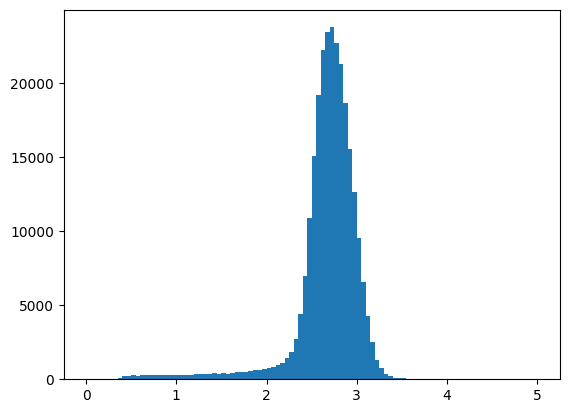

In [101]:
d=plt.hist(genericSim["trP"],bins=100,range=(0,5))

In [102]:
#%load_ext memory_profiler
#%memit doit()


In [103]:
dataTarget = pd.read_csv('../../DB/ProcessedHe3Pol.csv')
dataBeam = pd.read_csv('../../DB/ProcessedBeamPol.csv')
target_run_num = dataTarget['Run Number'].to_numpy()
target_pol = dataTarget['Polarization'].to_numpy()
target_polE=dataTarget['Error'].to_numpy()
beam_run_num = dataBeam['Run Number'].to_numpy()
beam_pol = dataBeam['Polarization'].to_numpy()
beam_polE=dataBeam['Error'].to_numpy()

In [104]:
target_pol/100

array([0.33784094, 0.34959488, 0.35102284, ..., 0.40446772, 0.34115021,
       0.22716826])

In [105]:
target_polE/100

array([0.01700711, 0.01762116, 0.01779658, ..., 0.01687292,        nan,
              nan])

In [106]:
print("hehe")

hehe


In [107]:
%%time
if(len(generic["dx"])<3000000):
    
    useGrinch=False

    
    genericMaster = {}
    base_dir = f"/media/research/TOSHIBA EXT/GEn/NumpyData/Pass{Pass}/GEN{config}/He3"
    i = 0
    print(f"NumPy array directory = {base_dir}")
    while os.path.exists(f"{base_dir}/final_2_{i}.npz"):
        print(f"Loading in file {i}")
        #if i>10:            #GPS
        #    break            #GPS
        file_path = f"{base_dir}/final_2_{i}.npz"
        data = np.load(file_path)

        cut=(data["ePS"]>0.2)
        if Pass=="2":
            grinchcut=(data["grinch_clus_size"]>=0)&(data["grinch_clus_trackindex"]==0)
            antigrinchcut=(data["grinch_clus_size"]<2)|(data["grinch_clus_trackindex"]!=0)
            pscut=(data["ePS"]>0) #GPS
            bbcalE=data["eSH"]+data["ePS"]
            gemP=data["trP"]
            
            epcut=bbcalE/gemP>.7 #GPS
            pscut=(data["ePS"]>0.2)
            #pscut=(data["ePS"]>0)
            if useGrinch:
                print("using grinch cut")
                #cut=antigrinchcut  #ANTIG
                cut=grinchcut
            else:
                print("using ps cut")
                cut=pscut&epcut#&grinchcut
        for key in data.files:
            if key not in genericMaster:
                cut_data = data[key][cut]
                genericMaster[key] = cut_data

            else:
                cut_data = data[key][cut]
                genericMaster[key] = np.concatenate((genericMaster[key], cut_data))

        data.close()
        i += 1

    print(f"Loaded {i} files into genericMaster.")


NumPy array directory = /media/research/TOSHIBA EXT/GEn/NumpyData/Pass2/GEN3/He3
Loading in file 0
using ps cut
Loading in file 1
using ps cut
Loading in file 2
using ps cut
Loading in file 3
using ps cut
Loading in file 4
using ps cut
Loading in file 5
using ps cut
Loading in file 6
using ps cut
Loading in file 7
using ps cut
Loading in file 8
using ps cut
Loading in file 9
using ps cut
Loading in file 10
using ps cut
Loading in file 11
using ps cut
Loading in file 12
using ps cut
Loading in file 13
using ps cut
Loading in file 14
using ps cut
Loading in file 15
using ps cut
Loading in file 16
using ps cut
Loading in file 17
using ps cut
Loading in file 18
using ps cut
Loading in file 19
using ps cut
Loading in file 20
using ps cut
Loading in file 21
using ps cut
Loading in file 22
using ps cut
Loading in file 23
using ps cut
Loading in file 24
using ps cut
Loading in file 25
using ps cut
Loading in file 26
using ps cut
Loading in file 27
using ps cut
Loading in file 28
using ps cut
L

In [108]:
generic=genericMaster.copy()

In [34]:
dyscale=20
dxscale=20
hcalscale=100
wscale=20

new_W2min=.87-12/wscale*2
#new_W2min=-.63
new_W2max=.88+12/wscale
new_dxmin=-.1-8/dxscale
new_dxmax=.1+8/dxscale
new_dymin=-.1-6/dyscale
new_dymax=.1+6/dyscale
new_hcalmin=.025+6/hcalscale
new_coinmin=coinmin+2
new_coinmax=coinmax-5

Text(0.5, 1.0, 'GEN3')

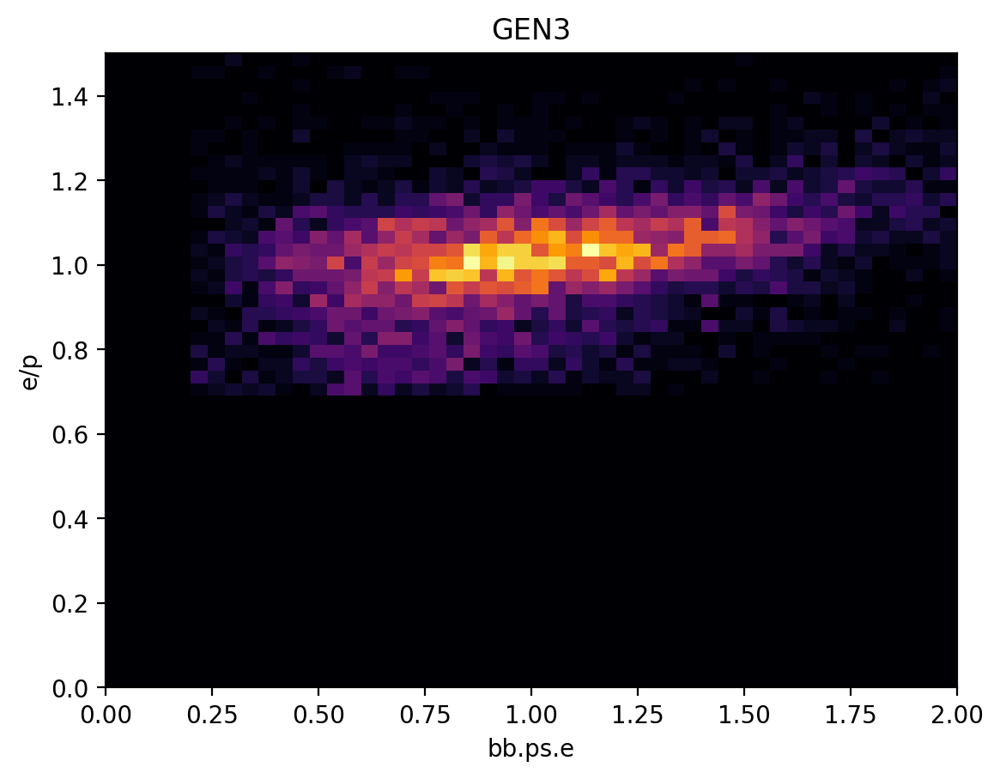

In [35]:
bbcalE=generic["eSH"]+generic["ePS"]
gemP=generic["trP"]
plt.figure(dpi=200)
wcut=(generic["W2"] < new_W2max)&(generic["W2"]>new_W2min) 
dycut=(generic["dy"]<new_dymax)&(generic["dy"]>new_dymin) 
dxcut=(generic["dx"] < new_dxmax)&(generic["dx"]>new_dxmin) 
coincut=(new_coinmin < generic["coin_time"])&(generic["coin_time"] < new_coinmax)
hcalecut=(generic["eHCAL"])>new_hcalmin

fullcut=wcut & dycut & dxcut & coincut&hcalecut
d=plt.hist2d(generic["ePS"][fullcut],bbcalE[fullcut]/gemP[fullcut],
             bins=(50,50),range=((0,2),(0,1.5)),cmap='inferno')
#plt.axhline(.7)
#plt.axvline(.2)
#plt.axhline(1.05)
plt.ylabel("e/p")
plt.xlabel("bb.ps.e")
plt.title("GEN3")

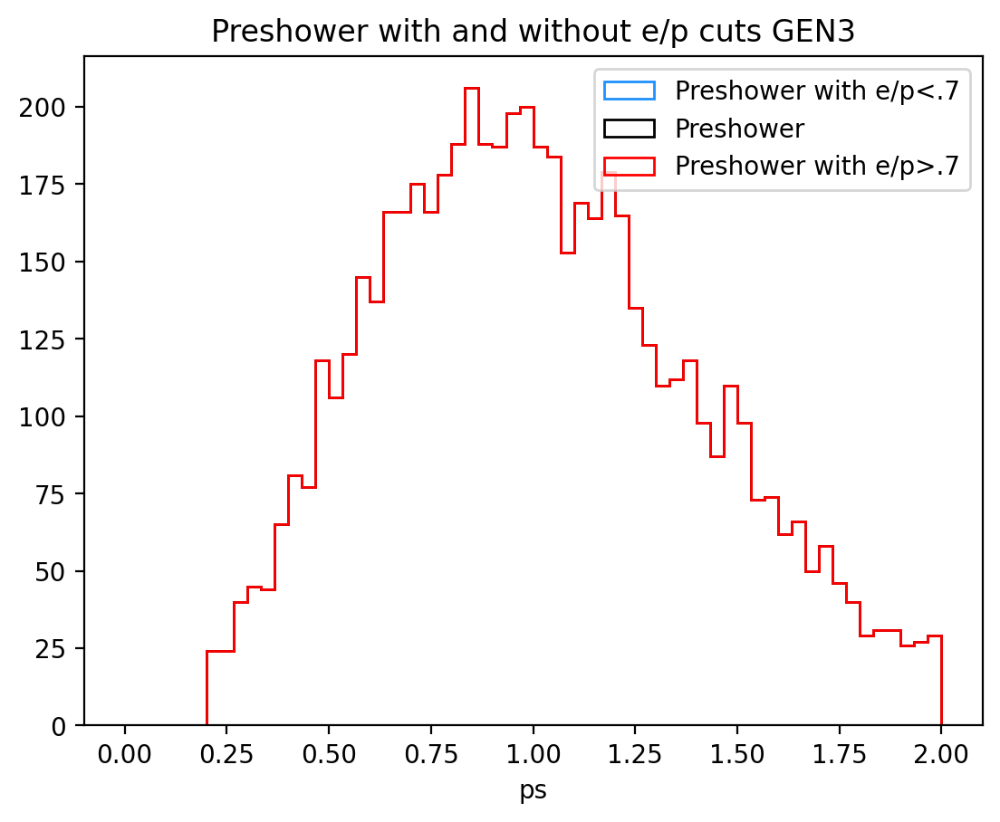

In [36]:
epcut=bbcalE/gemP>.7
plt.figure(dpi=200)

d=plt.hist(generic["ePS"][fullcut&~epcut],color='dodgerblue',
           label='Preshower with e/p<.7',histtype='step',bins=60,range=(0,2))
d=plt.hist(generic["ePS"][fullcut],histtype='step',color='black',
           label='Preshower',bins=60,range=(0,2))
d=plt.hist(generic["ePS"][fullcut&epcut],histtype='step',color='red',
           label='Preshower with e/p>.7',bins=60,range=(0,2))
plt.title("Preshower with and without e/p cuts GEN3")
plt.xlabel("ps")
plt.legend(loc='upper right')

# Cuts

### Making the correct helicity

In [109]:
IHWP_IN=np.where(generic["IHWP"]==1)
helicity=generic["helicity"]
helicity[IHWP_IN]*=-1

### Cuts for data, bgsim, np sim 

In [154]:
hcalmin=.085

In [159]:
bbcalE=generic["eSH"]+generic["ePS"]
gemP=generic["trP"]

wcut=(generic["W2"] < W2max)&(generic["W2"]>-1) 
dycut=(generic["dy"]<dymax)&(generic["dy"]>dymin) 
dxcut=(generic["dx"] < dxmax)&(generic["dx"]>dxmin) 
coincut=(coinmin < generic["coin_time"])&(generic["coin_time"] < coinmax)
hcalecut=(generic["eHCAL"])>hcalmin
epcut=bbcalE/gemP>.7
pscut=generic["ePS"]>.2
runnumcut=generic["runnum"]>2165

fullcut=wcut & dycut & dxcut & coincut&epcut&runnumcut
fullcutfordx=wcut&dycut&coincut&epcut&runnumcut
accidentalcut=wcut&dycut&dxcut&epcut&runnumcut


anticoincut=(coinmin-8 > generic["coin_time"])|(generic["coin_time"] > coinmax+5)

hpluscut=helicity==1
hminuscut=helicity==-1

bgcut=(genericSimIN["W2"] < W2max)&(genericSimIN["W2"]>W2min)
antibgcut=(generic["dy"]<-1.2)&wcut&coincut
antibgAcut=(abs(generic["dy"])>1.2)

Simwcut=(genericSim["W2"] < W2max)&(genericSim["W2"]>W2min) 
Simdycut=(abs(genericSim["dy"]) < 0.5) 
Simdxcut=(genericSim["dx"] < dxmax)&(genericSim["dx"]>dxmin) 
Simfullcut=Simwcut & Simdycut & Simdxcut

InSimdxcut=(genericSimIN["dx"] < dxmax)&(genericSimIN["dx"]>dxmin)
InSimdycut=(genericSimIN["dy"] < dymax)&(genericSimIN["dy"]>dymin)

protoncut=genericSim["fnucl"]==1
neutroncut=genericSim["fnucl"]==0
weight=genericSim["weight"]



sigma=genericSimIN["mc_sig"]
sigmaold=genericSimIN["mc_sigOld"]
sigmapol=genericSimIN["mc_sigPol"]
THETA=genericSimIN["mc_THETA"]
BETA=genericSimIN["mc_BETA"]
Q2_in=genericSimIN["Q2"]
nu_in=genericSimIN["nu"]
W2_in=genericSimIN["W2"]
x_in  = Q2_in/(2.0*Mp*nu_in)
dy_in=genericSimIN["dy"]
dx_in=genericSimIN["dx"]

dy_incut=(dy_in<dymax)&(dy_in>dymin)
bgcut=(W2_in<W2max)&(W2_in>W2min)#&(abs(dy_in) < 0.5)#&(sigma<1e-39)##&(Q2<6.1)#
sigmacut=(sigma>6e-39)
goodsigmacut=sigma<.4e-37
goodsig=sigma<5e-37

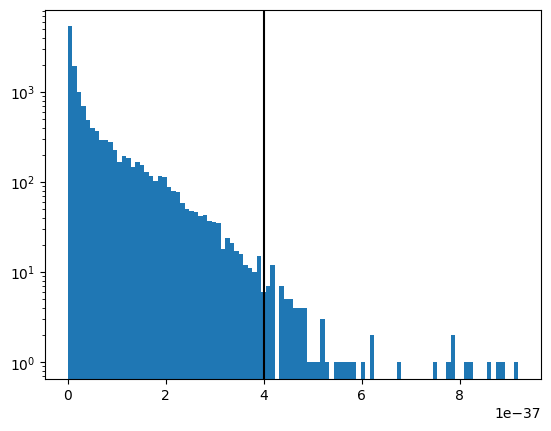

In [117]:
d=plt.hist(sigma,bins=100)
plt.yscale("log")
plt.axvline(4e-37,color='black')

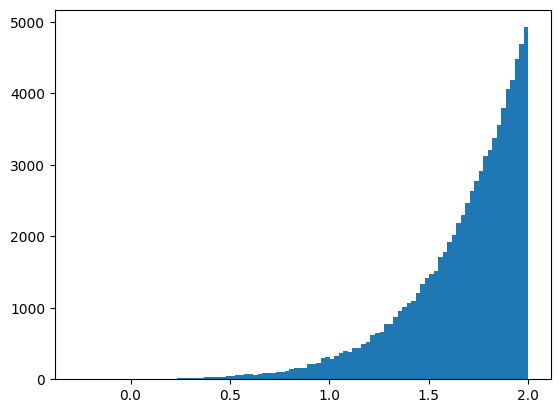

In [24]:
d=plt.hist(generic["W2"][antibgcut],bins=100)

# Peak at Cut Variables

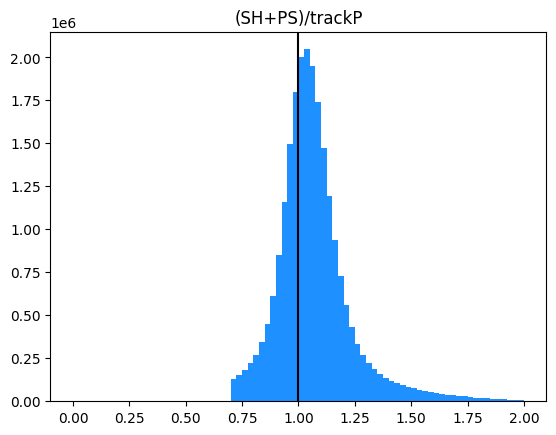

In [189]:
d=plt.hist(bbcalE/gemP,bins=80,range=(0,2),color='dodgerblue')
plt.axvline(1,color='black')
plt.title("(SH+PS)/trackP")
epcut=abs(bbcalE/gemP-.95)<.25

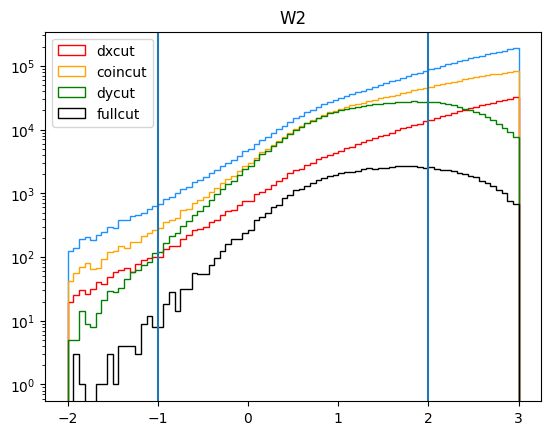

In [190]:
d=plt.hist(generic["W2"],bins=80,range=(-2,3),color='dodgerblue',histtype='step')
d=plt.hist(generic["W2"][dxcut],bins=80,range=(-2,3),color='red',label='dxcut',histtype='step')
d=plt.hist(generic["W2"][coincut],bins=80,range=(-2,3),color='orange',label='coincut',histtype='step')
d=plt.hist(generic["W2"][dycut],bins=80,range=(-2,3),color='green',label='dycut',histtype='step')
d=plt.hist(generic["W2"][dxcut&coincut&dycut],bins=80,range=(-2,3),color='black',label='fullcut',histtype='step')
plt.legend(loc='upper left')
plt.title("W2")
plt.yscale("log")
plt.axvline(W2min)
plt.axvline(W2max)

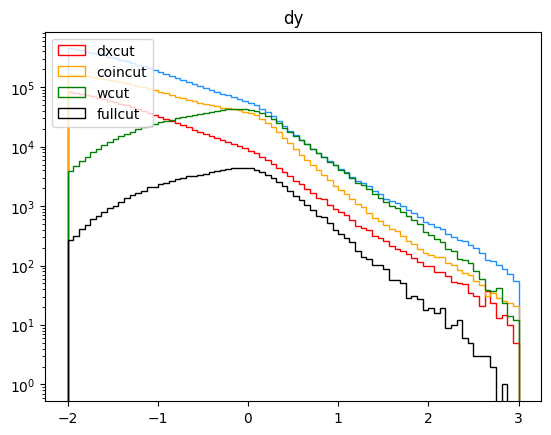

In [191]:
d=plt.hist(generic["dy"],bins=80,range=(-2,3),color='dodgerblue',histtype='step')
d=plt.hist(generic["dy"][dxcut],bins=80,range=(-2,3),color='red',label='dxcut',histtype='step')
d=plt.hist(generic["dy"][coincut],bins=80,range=(-2,3),color='orange',label='coincut',histtype='step')
d=plt.hist(generic["dy"][wcut],bins=80,range=(-2,3),color='green',label='wcut',histtype='step')
d=plt.hist(generic["dy"][dxcut&coincut&wcut],bins=80,range=(-2,3),color='black',label='fullcut',histtype='step')
plt.legend(loc='upper left')
plt.title("dy")
plt.yscale("log")
#plt.axvline(new_dymin)
#plt.axvline(new_dymax)

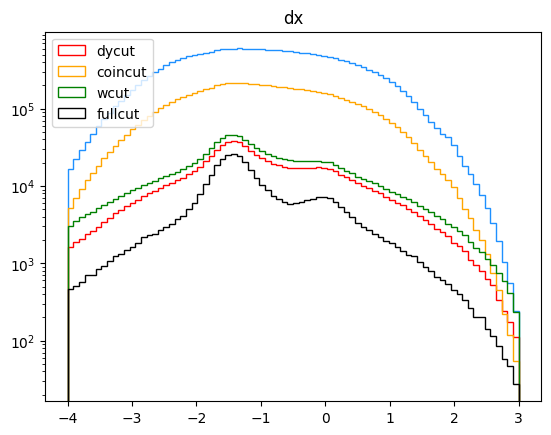

In [192]:
d=plt.hist(generic["dx"],bins=80,range=(-4,3),color='dodgerblue',histtype='step')
d=plt.hist(generic["dx"][dycut],bins=80,range=(-4,3),color='red',label='dycut',histtype='step')
d=plt.hist(generic["dx"][coincut],bins=80,range=(-4,3),color='orange',label='coincut',histtype='step')
d=plt.hist(generic["dx"][wcut],bins=80,range=(-4,3),color='green',label='wcut',histtype='step')
d=plt.hist(generic["dx"][dycut&coincut&wcut],bins=80,range=(-4,3),color='black',label='fullcut',histtype='step')
plt.legend(loc='upper left')
plt.title("dx")
plt.yscale("log")
#plt.axvline(new_dxmin)
#plt.axvline(new_dxmax)

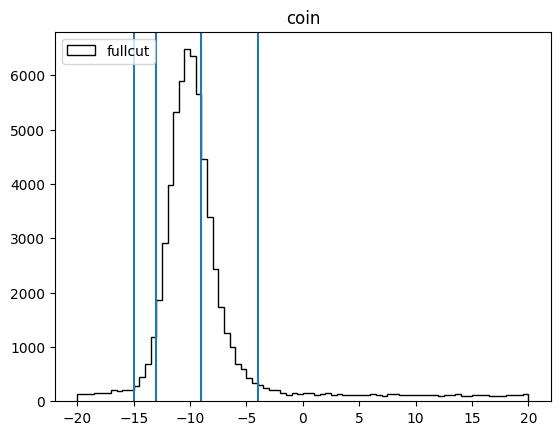

In [193]:
#d=plt.hist(generic["coin_time"]-130,bins=80,range=(-20,20),color='dodgerblue',histtype='step')
#d=plt.hist(generic["coin_time"][dycut]-130,bins=80,range=(-20,20),color='red',label='dycut',histtype='step')
#d=plt.hist(generic["coin_time"][dxcut]-130,bins=80,range=(-20,20),color='orange',label='dxcut',histtype='step')
#d=plt.hist(generic["coin_time"][wcut]-130,bins=80,range=(-20,20),color='green',label='wcut',histtype='step')
d=plt.hist(generic["coin_time"][dycut&wcut&dxcut]-130,bins=80,range=(-20,20),color='black',label='fullcut',histtype='step')
plt.legend(loc='upper left')
plt.title("coin")
#plt.yscale("log")
plt.axvline(new_coinmin-130)
plt.axvline(new_coinmax-130)
plt.axvline(coinmin-130)
plt.axvline(coinmax-130)



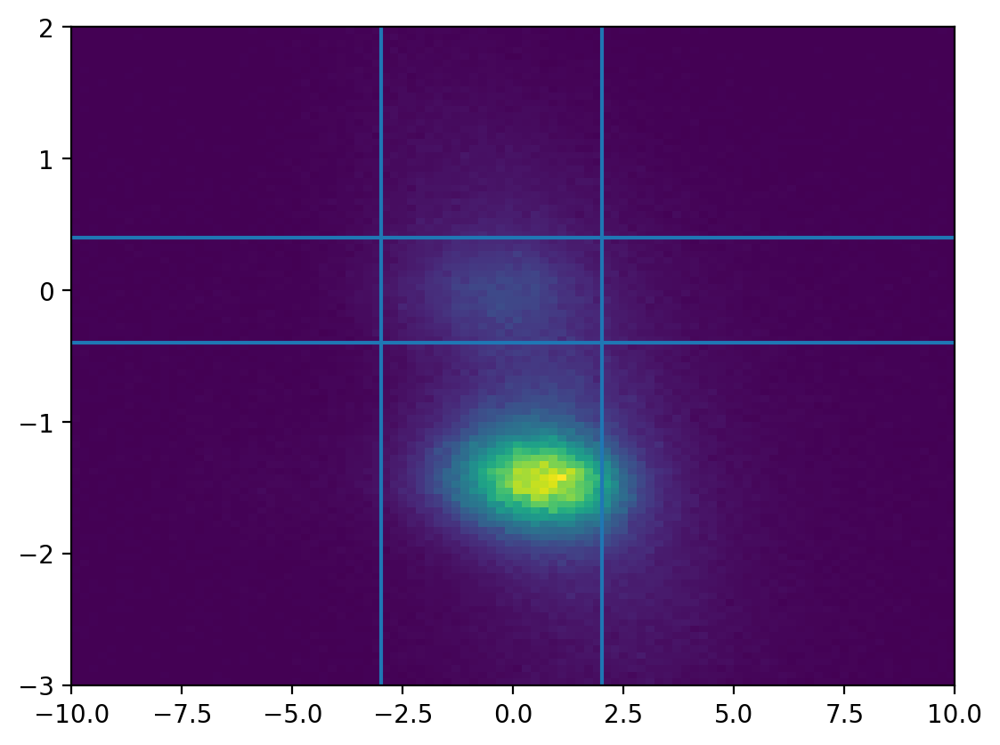

In [194]:
plt.figure(dpi=200)
d=plt.hist2d(generic["coin_time"][wcut&dycut]-120,generic["dx"][wcut&dycut],bins=(100,100),range=((-10,10),(-3,2)))
plt.axvline(new_coinmin-120)
plt.axvline(new_coinmax+1-120)
plt.axhline(dxmin)
plt.axhline(dxmax)

# Entire Analysis

In [41]:

def weighted_avg(values, errors):
    values = np.asarray(values)
    errors = np.asarray(errors)
    
    mask = (errors > 0) & np.isfinite(errors)
    if not np.any(mask):
        raise ValueError("No valid data points: all errors are zero, negative, or non-finite.")

    weights = 1 / errors[mask]**2
    avg = np.sum(values[mask] * weights) / np.sum(weights)
    err = np.sqrt(1 / np.sum(weights))
    
    return avg, err


In [42]:
def calculate_Aphys_with_error(epsilon_bar, tau_bar, Lambda, Px_bar, Pz_bar, dLambda):
    """
    Calculate A_phys and its uncertainty from Lambda.

    Parameters:
    epsilon_bar : float
    tau_bar : float
    Lambda : float
    Px_bar : float
    Pz_bar : float
    dLambda : float
        Uncertainty in Lambda

    Returns:
    A_phys : float
    dA_phys : float
        Uncertainty in A_phys
    """
    E = epsilon_bar
    T = tau_bar
    L = Lambda
    Px = Px_bar
    Pz = Pz_bar

    sqrt_term = np.sqrt((2 * E * (1 - E)) / T)
    denom = 1 + (E / T) * L**2
    num = L * sqrt_term * Px + np.sqrt(1 - E**2) * Pz

    A_phys = -num / denom

    # Derivatives for error propagation
    d_num_dL = sqrt_term * Px
    d_denom_dL = 2 * (E / T) * L

    dA_dLambda = -(d_num_dL * denom - num * d_denom_dL) / denom**2
    dA_phys = abs(dA_dLambda) * dLambda

    return A_phys, dA_phys

    mup=2.793
    Q2=CONFIG.Function_JSON("Q2",f"../../config/cuts{config}.cfg")
def load_data(file_path):
    """
    Load the data from the given file path into a pandas DataFrame.
    """
    columns = ["Q2", "GEp/GD", "dGEp/GD", "dGEp_Par/GD", "GMp/mu_p/GD", "dGMp/mu_p/GD", "dGMp_Par/mu_p/GD"]
    data = pd.read_csv(file_path, delim_whitespace=True, comment='#', names=columns)
    return data
def find_closest_row(data, input_Q2):
    """
    Find the row in the data with the Q2 value closest to the input_Q2.
    """
    closest_row = data.iloc[(data['Q2'] - input_Q2).abs().argmin()]
    return closest_row
def main(input_Q2):
    file_path = '../../DB/proton_lookup.dat'
    data = load_data(file_path)
    closest_row = find_closest_row(data, input_Q2)
    return closest_row

def propagate_errorAP(Ap, dAp, Pp, dPp, P_beam, dP_beam, P_target, dP_target):
    f = (Ap * Pp * P_beam * P_target) 
    rel_error_squared = (
        (dAp / Ap)**2 +
        (dPp / Pp)**2 +
        (dP_beam / P_beam)**2 +
        (dP_target / P_target)**2
    )
    df = f * np.sqrt(rel_error_squared)
    return f, df

In [80]:

if config=="2":
    Lower=-5
    Upper=2

else:
    Lower=-4
    Upper=2.5

def Function_Fitdx(wcut,dycut,dxcut,coincut,fullcutfordx,protoncut,
                  neutroncut,pscut,epcut,hcalecut,Simwcut,Simdycut,bgcut,weight):
    
    antibgcut=(generic["dy"]<-1.2)&wcut&coincut&pscut&epcut&hcalecut
    #antibgcut=(abs(generic["dy"])>1.2)&wcut&coincut&pscut&epcut&hcalecut

    counts_p, bin_edges = np.histogram(genericSim["dx"][protoncut&Simwcut&Simdycut]+.065,   ####.065
                                       bins=150, range=(Lower, Upper),
                                       weights=weight[protoncut&Simwcut&Simdycut])

    counts_n, _         = np.histogram(genericSim["dx"][neutroncut&Simwcut&Simdycut],
                                       bins=bin_edges,
                                       weights=weight[neutroncut&Simwcut&Simdycut])
    #bgcut:  [bgcut&(goodsigmacut)]
    counts_bg,_         = np.histogram(dx_in[bgcut&(goodsigmacut)],
                                       bins=bin_edges,weights=sigma[bgcut&(goodsigmacut)])
    #counts_bg,_         = np.histogram(dx_in[bgcut&(goodsigmacut)],
    #                                   bins=bin_edges,weights=sigmaold[bgcut&(goodsigmacut)])
    counts_bg,_         = np.histogram(generic["dx"][antibgcut],
                                       bins=bin_edges)

    counts_data, _      = np.histogram(generic["dx"][fullcutfordx], bins=bin_edges)


    counts_p = counts_p.astype(float)
    counts_n = counts_n.astype(float)
    counts_bg = counts_bg.astype(float)
    #counts_acc = counts_acc.astype(float)
    counts_data = counts_data.astype(float)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    shape=("from data")
    if config=="2":
        shape=("pol2")
    fit_obj = DistributionFits(bg_shape_option=shape)
    fit_obj.hdx_data = [bin_centers, counts_data]
    fit_obj.hdx_sim_p = [bin_centers, counts_p]
    fit_obj.hdx_sim_n = [bin_centers, counts_n]
    fit_obj.hdx_bg_data = [bin_centers, counts_bg] 
    #fit_obj.hdx_acc_data = [bin_centers, counts_acc] 


    if shape=="from data+acc":
        bg_fit, total_fit, sim_p_scaled, sim_n_scaled,pop0,pop1,pop2,pop3,scale,acc_fit= fit_obj.He3_fit_dists(True)
    else:
        bg_fit, total_fit, sim_p_scaled, sim_n_scaled,pop0,pop1,pop2,scale= fit_obj.He3_fit_dists(True)

    return bg_fit,total_fit,sim_p_scaled,sim_n_scaled,bin_centers,counts_data
def Function_Plotdx(bg_fit,total_fit,sim_p_scaled,sim_n_scaled,bin_centers,counts_data,dxmin,dxmax):
    # Style config
    import matplotlib.pyplot as plt
    from matplotlib.lines import Line2D
    from matplotlib.patches import Patch
    fig, ax = plt.subplots(figsize=(10, 8))
    lw = 1.4
    l = 3
    fs = 16
    fw = 'bold'
    a = 1  # transparency for bars
    bin_width = bin_centers[1] - bin_centers[0]

    # Optional override
    if config == "2":
        lw = 1
        l = 3
        typ = "4th Order Poly"
    else:
        typ = "Background Data"



    # --------- Total Fit ---------hatch='///',
    ax.bar(bin_centers, total_fit, width=bin_width, align='center', alpha=0.7, color='orange', label="MC Fit = MC + Background")
    ax.plot(bin_centers, total_fit, '--', color='black', linewidth=lw)

    # --------- Inelastic ---------
    ax.bar(bin_centers, bg_fit, width=bin_width, align='center', alpha=0.7, color='magenta', label="MC Inelastic")
    ax.plot(bin_centers, bg_fit, '--', color='black', linewidth=lw)

    # --------- Accidental ---------
    #ax.bar(bin_centers, acc_fit, width=bin_width, align='center', alpha=0.5, color='magenta', label="MC Inelastic")
    #ax.plot(bin_centers, acc_fit, '--', color='black', linewidth=lw)

    # --------- Sim Proton ---------
    ax.bar(bin_centers, sim_p_scaled, width=bin_width, align='center', alpha=0.7, color='red', label="MC Proton")
    ax.plot(bin_centers, sim_p_scaled, '--', color='black', linewidth=lw)

    # --------- Sim Neutron ---------
    ax.bar(bin_centers, sim_n_scaled, width=bin_width, align='center', alpha=0.7, color='dodgerblue', label="MC Neutron")
    ax.plot(bin_centers, sim_n_scaled, '--', color='black', linewidth=lw)

    # --------- Data Line ---------
    ax.bar(bin_centers, counts_data, width=bin_width, align='center', alpha=.01, color='white',label="Data")
    ax.plot(bin_centers, counts_data, '-', color='grey',alpha=.8, linewidth=l, label='Data')

    # --------- Custom Legend ---------
    legend_elements = [
        Line2D([0], [0], color='grey', linewidth=3, linestyle='-', label='Data'),
        Patch(facecolor='orange', edgecolor='black', linestyle='--', label='MC Fit = MC + Background', alpha=a),
        Patch(facecolor='magenta', edgecolor='black', linestyle='--', label='MC Zheng Model', alpha=a),
        Patch(facecolor='red', edgecolor='black', linestyle='--', label='MC Proton', alpha=a),
        Patch(facecolor='dodgerblue', edgecolor='black', linestyle='--', label='MC Neutron', alpha=a)
    ]
    ax.legend(handles=legend_elements, loc='upper right', fontsize=fs)
    # --------- Labels, ticks, etc. ---------
    ax.set_title(f'Data/Simulation Comparison for GEN{config}: Δx (m)', fontsize=fs, fontweight=fw)
    ax.set_xlabel(r'$\Delta x$ (m)', fontsize=fs, fontweight=fw)
    ax.set_ylabel('Entries', fontsize=fs, fontweight=fw)
    ax.tick_params(axis='both', labelsize=fs-4)
    plt.xticks(fontsize=fs-4, fontweight=fw)
    plt.yticks(fontsize=fs-4, fontweight=fw)
    plt.tight_layout()
    #plt.yscale("log")
    plt.axvline(dxmin,color='black')
    plt.axvline(dxmax,color='black')
    # --------- Save and show ---------
    #plt.savefig(f'../plots/DataSimPass{pas}GEN{config}.png')
    plt.show()

    # Optional: Check total counts
    print("Total entries in fit:", np.sum(total_fit))


In [81]:

    
def Function_Acc(W2min,W2max,coinmin,coinmax,dymin,dymax,dxmin,dxmax,hcalmin,psmin,epcut,ShowPlots=False):
    wcut=(generic["W2"] < W2max)&(generic["W2"]>W2min) 
    dycut=(generic["dy"]<dymax)&(generic["dy"]>dymin) 
    dxcut=(generic["dx"] < dxmax)&(generic["dx"]>dxmin) 
    hcalcut=generic["eHCAL"]>hcalmin
    pscut=generic["ePS"]>psmin
    
    accidentalcut=wcut&dycut&dxcut&epcut&runnumcut&hcalcut&pscut&epcut
    anticoincut=(coinmin-8 > generic["coin_time"])|(generic["coin_time"] > coinmax+10)
    
    accBinRange=40
    #plt.figure(figsize=(8,6),dpi=200)
    coin_hist,coin_edges=np.histogram(generic["coin_time"][accidentalcut],
                                      bins=100,range=(coinmin-accBinRange,coinmax+accBinRange))
    coin_centers= (coin_edges[:-1] + coin_edges[1:]) / 2
    if ShowPlots:
        plt.figure(dpi=200)
        d=plt.hist(generic["coin_time"][accidentalcut],
                   bins=100,range=(coinmin-accBinRange,coinmax+accBinRange),color='orange',alpha=.4)
        plt.plot(coin_centers, coin_hist,'--',color='black',linewidth=1)

        plt.title(f"Cointime HCal-BBCal (ADC) GEN{config}")

        plt.axvline(coinmin,color='black')
        plt.axvline(coinmax,color='black')
        plt.axvspan(coinmin, coinmax, color='red', alpha=0.2)

        plt.axvline(coinmin+20,color='black')
        plt.axvline(coinmax+20,color='black')
        plt.axvspan(coinmin+20, coinmax+20, color='dodgerblue', alpha=0.3)

        plt.axvline(coinmin-20,color='black')
        plt.axvline(coinmax-20,color='black')
        plt.axvspan(coinmin-20, coinmax-20, color='dodgerblue', alpha=0.3)
        plt.xlabel("[ns]")

        #plt.yscale("log")
    outside_coin_right=(coin_centers >= coinmin+25) & (coin_centers <= coinmax+25)
    outside_coin_left=(coin_centers >= coinmin-25) & (coin_centers <= coinmax-25)
    inside_coin=(coin_centers >= coinmin) & (coin_centers <= coinmax)

    outside_number=(np.sum(coin_hist[outside_coin_right])+np.sum(coin_hist[outside_coin_left]))/2
    inside_number=(np.sum(coin_hist[inside_coin]))

    f_acc=outside_number/inside_number
    f_acc_error=f_acc * math.sqrt(1 / outside_number + 1 / inside_number)

    plus_coin_hist,plus_coin_edges=np.histogram(generic["coin_time"][anticoincut&accidentalcut&hpluscut],bins=100,range=(coinmin-30,coinmax+60))
    minus_coin_hist,minus_coin_edges=np.histogram(generic["coin_time"][anticoincut&accidentalcut&hminuscut],bins=100,range=(coinmin-30,coinmax+60))
    if ShowPlots:
        deez_hist,deez_edges=np.histogram(generic["coin_time"][wcut&dycut&dxcut&hcalcut&anticoincut],bins=100,
                range=(coinmin-30,coinmax+60))
        deez_centers= (deez_edges[:-1] + deez_edges[1:]) / 2
        plt.figure(dpi=200)
        plt.yscale("log")
        plt.title(f"Cointime HCal-BBCal (ADC) GEN{config}")
        plt.hist(generic["coin_time"][wcut&dycut&dxcut&hcalcut&anticoincut],bins=100,
                range=(coinmin-30,coinmax+60),color="dodgerblue",alpha=.5,label="Asymmetry Region")
        plt.plot(deez_centers, deez_hist,'--',color='black',linewidth=1)
        plt.xlabel("[ns]")
        deez_hist,deez_edges=np.histogram(generic["coin_time"][wcut&dycut&dxcut&hcalcut&coincut],bins=100,
                range=(coinmin-30,coinmax+60))
        deez_centers= (deez_edges[:-1] + deez_edges[1:]) / 2
        plt.hist(generic["coin_time"][wcut&dycut&dxcut&hcalcut&coincut],bins=100,
                range=(coinmin-30,coinmax+60),color="orange",alpha=.5,label="Coincidence Region")
        plt.plot(deez_centers, deez_hist,'--',color='black',linewidth=1)
        plt.legend(loc='upper right')
        
        plt.figure(dpi=200)
        plt.title(f"Cointime HCal-BBCal (ADC) GEN{config}")
        plt.xlabel("[ns]")
        deez_hist,deez_edges=np.histogram(generic["coin_time"][accidentalcut],bins=100,
                range=(coinmin-15,coinmax+15))
        deez_centers= (deez_edges[:-1] + deez_edges[1:]) / 2
        plt.hist(generic["coin_time"][accidentalcut],bins=100,
                range=(coinmin-15,coinmax+15),color="orange",alpha=.5)
        plt.plot(deez_centers, deez_hist,'--',color='black',linewidth=1)
        #plt.axvline(coinmin,color='black')
        #plt.axvline(coinmax,color='black')
    coin_plus_total = np.sum(plus_coin_hist)
    coin_minus_total = np.sum(minus_coin_hist)

    A_acc=(coin_plus_total-coin_minus_total)/(coin_plus_total+coin_minus_total)
    A_acc_error=2*math.sqrt(coin_plus_total * coin_minus_total) / (coin_plus_total + coin_minus_total)**(3/2)
    #print(f"N_plus: {coin_plus_total} N_minus: {coin_minus_total}")
    #print(f"f_acc: {f_acc:.4f}+={f_acc_error:.4f} A_acc: {A_acc:.6f}+-{A_acc_error:.4f}")
    return f_acc,f_acc_error,A_acc,A_acc_error

In [82]:
def Function_Proton(f_p,f_p_error):
    mup=2.793
    Q2=CONFIG.Function_JSON("Q2",f"../../config/cuts{config}.cfg")
    def load_data(file_path):
        """
        Load the data from the given file path into a pandas DataFrame.
        """
        columns = ["Q2", "GEp/GD", "dGEp/GD", "dGEp_Par/GD", "GMp/mu_p/GD", "dGMp/mu_p/GD", "dGMp_Par/mu_p/GD"]
        data = pd.read_csv(file_path, delim_whitespace=True, comment='#', names=columns)
        return data
    def find_closest_row(data, input_Q2):
        """
        Find the row in the data with the Q2 value closest to the input_Q2.
        """
        closest_row = data.iloc[(data['Q2'] - input_Q2).abs().argmin()]
        return closest_row
    def main(input_Q2):
        file_path = '../../DB/proton_lookup.dat'
        data = load_data(file_path)
        closest_row = find_closest_row(data, input_Q2)
        return closest_row
    row=main(Q2)
    R=np.round(row[1]/row[4]/mup,4)


    #in GeV^2

    def Aperp(R, tau, theta):
        tan_half_theta = np.tan(np.radians(theta) / 2)
        numerator = -R * 2 * np.sqrt(tau * (tau + 1)) * tan_half_theta
        denominator = R**2 + (tau + 2 * tau * (1 + tau) * tan_half_theta**2)
        A_perp = numerator / denominator
        return A_perp

    Ap=Aperp(R,tau,theta)
    P_p=-.04 # seamus thesis
    P_beam=CONFIG.Function_JSON("Pbeam",f"../../config/cuts{config}.cfg")
    P_target=CONFIG.Function_JSON("Ptarget",f"../../config/cuts{config}.cfg")

    A_p=Ap*P_p*P_beam*P_target/100/100
    #Aphys_p=Ap*P_p*P_beam*P_target/100/100
    #print(f"f_p: {f_p:.4f}+={f_p_error:.4f} A_p: {A_p:.7f}")
    return A_p

In [83]:
def Function_Inelastic(W2min,W2max,coinmin,coinmax,dymin,dymax,dxmin,dxmax,hcalmin):
    #hcalcut=generic["eHCAL"]>hcalmin
    coincut=(coinmin < generic["coin_time"])&(generic["coin_time"] < coinmax)
    wcut=(generic["W2"] < W2max)&(generic["W2"]>W2min)
    antibgcut=(abs(generic["dy"])>1.2)&wcut&coincut
    antibgAcut=(abs(generic["dy"])>2)

    accBinRange=100
    #plt.figure(figsize=(8,6),dpi=200)
    inhist,coin_edges=np.histogram(generic["dx"][antibgcut],
                                      bins=200,range=(-4,3))
    coin_centers= (coin_edges[:-1] + coin_edges[1:]) / 2
    #d=plt.hist(generic["dx"][antibgcut],
    #                                  bins=200,range=(-4,3))


    plus_in_hist,plus_in_edges=np.histogram(generic["dx"][antibgAcut&hpluscut],bins=100,range=(dxmin,dxmax))
    minus_in_hist,minus_in_edges=np.histogram(generic["dx"][antibgAcut&hminuscut],bins=100,range=(dxmin,dxmax))

    in_plus_total = np.sum(plus_in_hist)
    in_minus_total = np.sum(minus_in_hist)
    #print(in_plus_total,in_minus_total)
    A_in=(in_plus_total-in_minus_total)/(in_plus_total+in_minus_total)
    A_in_error=2*math.sqrt(in_plus_total * in_minus_total) / (in_plus_total + in_minus_total)**(3/2)
    #print(f"N_plus: {coin_plus_total} N_minus: {coin_minus_total}")
    #print(f"f_acc: {f_acc:.4f}+={f_acc_error:.4f} A_acc: {A_acc:.6f}+-{A_acc_error:.4f}")
    return A_in,A_in_error

In [84]:
def Function_N2():
    hdx_sim_n=np.histogram(genericSim["dx"],range=(-.4,.4),
                       bins=100)
    he3simfrac=np.sum(hdx_sim_n[0])/len(genericSim["dx"])


    #the sim fraction
    n2simfrac=135874/268774

    n2overhe3counts=n2simfrac/he3simfrac/14 # divide by 14 because nitrogen molecule has 14 times n

    n2overhe3counts

    1.5*14*n2overhe3counts
    98.5

    nAtoms=100
    nN2=.015
    nHe3=.985

    f_n2=nN2*14/(14*nN2+nHe3)*n2overhe3counts
    f_n2=.0244
    f_n2_error=.1*f_n2
    return f_n2,f_n2_error

In [85]:
def ShowW2(dxcut,dycut,coincut,hcalecut,pscut,epcut,Simdycut,Simdxcut,InSimdycut,InSimdxcut,f_n,f_bg,f_p,W2min,W2max):
    neutronW2=neutroncut&Simdycut&Simdxcut
    protonW2=protoncut&Simdycut&Simdxcut
    bgW2=InSimdycut&InSimdxcut&goodsig#macut
    dataW2    = dycut & dxcut & coincut&hcalecut&pscut&epcut
    # Data (no scaling/normalization for raw data)
    hist_data = plt.hist(generic["W2"][dataW2], bins=80, range=(W2min, W2max), color='black')
    counts_data, bins_data = hist_data[0], hist_data[1]
    scale=np.sum(counts_data)

    # Sim proton
    hist_p = plt.hist(genericSim["W2"][protonW2], bins=80,weights=weight[protonW2], range=(W2min, W2max), color='dodgerblue', alpha=0.5)
    counts_p, bins_p = hist_p[0], hist_p[1]
    norm_counts_p = counts_p / np.sum(counts_p)
    scaled_counts_p = norm_counts_p *f_p

    # Sim neutron
    hist_n = plt.hist(genericSim["W2"][neutronW2], bins=80, weights=weight[neutronW2],range=(W2min, W2max), color='red', alpha=0.5)
    counts_n, bins_n = hist_n[0], hist_n[1]
    norm_counts_n = counts_n / np.sum(counts_n)
    scaled_counts_n = norm_counts_n * (f_n)

    # Background
    hist_bg = plt.hist(genericSimIN["W2"][goodsigmacut&bgW2], bins=80,weights=sigma[goodsigmacut&bgW2], range=(W2min, W2max), color='orange', alpha=0.5)
    counts_bg, bins_bg = hist_bg[0], hist_bg[1]
    norm_counts_bg = counts_bg / np.sum(counts_bg)
    scaled_counts_bg = norm_counts_bg * (f_bg)


    # Bin centers
    bin_centers_p = 0.5 * (bins_p[1:] + bins_p[:-1])
    bin_centers_n = 0.5 * (bins_n[1:] + bins_n[:-1])
    bin_centers_bg = 0.5 * (bins_bg[1:] + bins_bg[:-1])
    bin_centers_data = 0.5 * (bins_data[1:] + bins_data[:-1])

    # Plot
    plt.figure(dpi=200)
    plt.step(bin_centers_p, scaled_counts_p*scale, where='mid', color='red', label='Proton Sim')
    plt.step(bin_centers_n, scaled_counts_n*scale, where='mid', color='dodgerblue', label='Neutron Sim')
    plt.step(bin_centers_bg, scaled_counts_bg*scale, where='mid', color='orange', label='BG Distribution')
    plt.step(bin_centers_data, counts_data, where='mid', color='black', label='Data')
    plt.step(bin_centers_data, scaled_counts_p*scale+scaled_counts_n*scale+scaled_counts_bg*scale, where='mid', color='grey', label='Sum of Sim')
    
    plt.title(f"W$^2$ GEN{config}")
    plt.xlabel(r"W$^2$ [GeV$^2$]")
    plt.ylabel("Counts (scaled)")
    plt.legend()
    plt.grid(True)
    plt.ylim(0, np.max(counts_data)*1.1)
    plt.show()
    return

In [ ]:
dxcut, dycut, coincut,hcalecut,pscut,epcut,
                                              Simdycut, Simdxcut, InSimdycut,
                                              InSimdxcut,.73,.01, -1, 1+i/20,Plot=False)[0])

In [158]:
len(dxcut)-len(dycut)+len(coincut)-len(hcalecut)+len(pscut)-len(epcut)

-29194672

In [136]:
def ShowW2_fixed_ratio(dxcut, dycut, coincut,hcalecut,pscut,epcut,
                       Simdycut, Simdxcut, InSimdycut, InSimdxcut,
                       f_n, f_p, W2min, W2max,Plot=True):
    # Define cuts
    neutronW2 = neutroncut & Simdycut & Simdxcut
    protonW2  = protoncut  & Simdycut & Simdxcut
    bgW2      = InSimdycut# & InSimdxcut&goodsig#macut#&InSimhcalcut
    dataW2    = dycut & dxcut & coincut&hcalecut&pscut&epcut

    # Bin settings
    bins = np.linspace(W2min, W2max, 80)
    bin_centers = 0.5 * (bins[1:] + bins[:-1])

    # Histograms
    counts_data, _ = np.histogram(generic["W2"][dataW2], bins=bins)

    counts_p, _  = np.histogram(genericSim["W2"][protonW2],  bins=bins, weights=weight[protonW2])
    counts_n, _  = np.histogram(genericSim["W2"][neutronW2], bins=bins, weights=weight[neutronW2])
    counts_bg, _ = np.histogram(genericSimIN["W2"][bgW2],     bins=bins, weights=sigma[bgW2])

    # Normalize
    counts_p_norm  = counts_p / np.sum(counts_p)
    counts_n_norm  = counts_n / np.sum(counts_n)
    counts_bg_norm = counts_bg / np.sum(counts_bg)

    # Combine p+n using fixed ratio
    ratio_total = f_p + f_n
    shape_pn = (f_p * counts_p_norm + f_n * counts_n_norm) / ratio_total

    # Fit: Data ≈ A * shape_pn + B * counts_bg_norm
    def fit_func(x, A, B):
        return A * shape_pn + B * counts_bg_norm

    popt, _ = curve_fit(fit_func, bin_centers, counts_data, p0=[1, 1])
    A_fit, B_fit = popt

    # Get scaled components
    fitted_p  = A_fit * f_p / ratio_total * counts_p_norm
    fitted_n  = A_fit * f_n / ratio_total * counts_n_norm
    fitted_bg = B_fit * counts_bg_norm
    fitted_total = fitted_p + fitted_n + fitted_bg

    # Plot
    if Plot:
        plt.figure(dpi=200)
        plt.step(bin_centers, counts_data, where='mid', color='black', label='Data')
        plt.step(bin_centers, fitted_p, where='mid', color='red', label=f'Proton × {A_fit*f_p/ratio_total:.2f}')
        plt.step(bin_centers, fitted_n, where='mid', color='dodgerblue', label=f'Neutron × {A_fit*f_n/ratio_total:.2f}')
        plt.step(bin_centers, fitted_bg, where='mid', color='orange', label=f'Background × {B_fit:.2f}')
        plt.step(bin_centers, fitted_total, where='mid', color='gray', label='Total Fit')
        plt.title(f"W$^2$ GEN{config}")
        plt.xlabel(r"W$^2$ [GeV$^2$]")
        plt.ylabel("Counts")
        plt.legend()
        plt.grid(True)
        plt.ylim(0, np.max(counts_data)*1.1)
        plt.show()

    return B_fit/(A_fit+B_fit),A_fit/(A_fit+B_fit)



In [137]:
def DoItAll(W2min,W2max,coinmin,coinmax,dymin,dymax,dxmin,dxmax,hcalmin,psmin,
            epmin,printStats=True,printPlot=True,extracut=False):
    #print(W2max)
    print("PSMIN",psmin)
    bbcalE=generic["eSH"]+generic["ePS"]
    gemP=generic["trP"]
    wcut=(generic["W2"] < W2max)&(generic["W2"]>W2min) 
    dycut=(generic["dy"]<dymax)&(generic["dy"]>dymin) 
    dxcut=(generic["dx"] < dxmax)&(generic["dx"]>dxmin) 
    coincut=(coinmin < generic["coin_time"])&(generic["coin_time"] < coinmax)
    epcut=bbcalE/gemP>epmin
    runnumcut=generic["runnum"]>2165
    hcalecut=(generic["eHCAL"])>hcalmin
    pscut=(generic["ePS"])>psmin
    fullcut=wcut&dycut&dxcut&coincut&epcut&runnumcut&hcalecut&pscut
    fullcutfordx=wcut&dycut&coincut&epcut&runnumcut&hcalecut&pscut
    accidentalcut=wcut&dycut&dxcut&epcut&runnumcut&hcalecut&pscut
    weight=genericSim["weight"]
    bgcut=(W2_in<W2max)&(W2_in>W2min)
    Simwcut=(genericSim["W2"] < W2max)&(genericSim["W2"]>W2min) 
    Simdycut=(genericSim["dy"]<dymax)&(genericSim["dy"]>dymin)
    
    
    InSimdxcut=(genericSimIN["dx"] < dxmax)&(genericSimIN["dx"]>dxmin)
    InSimdycut=(genericSimIN["dy"] < dymax)&(genericSimIN["dy"]>dymin)

    FitResult=Function_Fitdx(wcut,dycut,dxcut,
                            coincut,fullcutfordx,protoncut,
                            neutroncut,pscut,epcut,hcalecut,Simwcut,Simdycut,bgcut,weight)
    
    
    
    bg_fit=FitResult[0]
    total_fit=FitResult[1]
    sim_p_scaled=FitResult[2]
    sim_n_scaled=FitResult[3]
    bin_centers=FitResult[4]
    counts_data=FitResult[5]
    mask = (bin_centers >= dxmin) & (bin_centers <= dxmax)

    # Sum the corresponding bin contents
    N_p  = np.sum(sim_p_scaled[mask])
    N_n  = np.sum(sim_n_scaled[mask])
    N_bg = np.sum(bg_fit[mask])
    N_total = np.sum(total_fit[mask])
    N_total = np.sum(counts_data[mask])

    


    f_p=N_p/N_total
    f_bg=N_bg/N_total
    f_n=N_n/N_total
    f_p_error=f_p * math.sqrt(1 / N_p + 1 / N_total)
    f_bg_error=f_bg* math.sqrt(1 / N_bg + 1 / N_total)
    f_n_error=f_n* math.sqrt(1 / N_n + 1 / N_total)
    
    
    #############EXPERIMENTAL
    f_bg_old=f_bg
    f_n_old=f_n
    f_p_old=f_p
    f_bg_w2,f_np_w2=ShowW2_fixed_ratio(dxcut, dycut, coincut,hcalecut,pscut,epcut,
                                       Simdycut, Simdxcut, InSimdycut, InSimdxcut,
                       f_n, f_p, W2min, W2max,Plot=True)
    
    if extracut:
        f_p=f_p/f_n*f_np_w2

        f_n=f_np_w2-f_p
        f_bg=f_bg_w2
        print(f_np_w2,f_p,f_n,f_bg)
    
    if printPlot:
        Function_Plotdx(FitResult[0],FitResult[1],FitResult[2],FitResult[3],FitResult[4],FitResult[5],dxmin,dxmax)
        ShowW2(dxcut,dycut,coincut,hcalecut,pscut,epcut,
               Simdycut,Simdxcut,InSimdycut,InSimdxcut,f_n_old,f_bg_old,f_p_old,W2min,W2max)
    
    
    f_acc,f_acc_error,A_acc,A_acc_error=Function_Acc(W2min,W2max,coinmin,coinmax,dymin,dymax,
                                                     dxmin,dxmax,hcalmin,psmin,epcut)
    print("coinstuf: f,fe,A,Ae",f_acc,f_acc_error,A_acc,A_acc_error)
    A_p=Function_Proton(f_p,f_p_error)
    f_nitrogen,f_nitrogen_error=Function_N2()
    #temp below
    A_inelastic=0
    A_inelastic_error=.0005 
    #A_inelastic,A_inelastic_error=Function_Inelastic(W2min,W2max,coinmin,coinmax,dymin,dymax,dxmin,dxmax,hcalmin)
    #print("Inelastic: ",A_inelastic,A_inelastic_error)
    
#ARAW
    N_minus_raw=len(np.where(helicity[fullcut]==-1)[0])
    N_plus_raw=len(np.where(helicity[fullcut]==1)[0])
    #SEAN JEFFAS KIN3: N_minus_raw=20336
    #SEAN JEFFAS KIN3: N_plus_raw=21224
    #SEAN JEFFAS fN=.29
    #SEAN JEFFAS NEUTRONS: 12052.4
    NEUTRONSSSSS=f_n*(N_minus_raw+N_plus_raw)
    A_raw=(N_plus_raw-N_minus_raw)/(N_plus_raw+N_minus_raw)
    A_raw_error=2*math.sqrt(N_plus_raw * N_minus_raw) / (N_plus_raw + N_minus_raw)**(3/2)
    
    
    
#FILTER HELICITY    
    runs_filtered = generic["runnum"][fullcut]
    helicity_filtered = helicity[fullcut]
    # Now apply the run number cut:
    valid_runs = runs_filtered > 2165
    runs_filtered = runs_filtered[valid_runs]
    helicity_filtered = helicity_filtered[valid_runs]
    
#ARAW PER RUN
    pluscut = helicity_filtered == 1
    minuscut = helicity_filtered == -1
    unique_runnum, run_idx = np.unique(runs_filtered, return_inverse=True)
    N_plus_per_run = np.bincount(run_idx, weights=pluscut.astype(int))
    N_minus_per_run = np.bincount(run_idx, weights=minuscut.astype(int))
    
   #CHECK FOR SAFE N VALUES
    A_raw_per_run = np.full_like(N_plus_per_run, np.nan, dtype=float)
    A_raw_error_per_run = np.full_like(N_plus_per_run, np.nan, dtype=float)
    valid = (N_plus_per_run > 0) & (N_minus_per_run > 0)
    denominator = (N_plus_per_run + N_minus_per_run)[valid]
    A_raw_per_run[valid] = (N_plus_per_run[valid] - N_minus_per_run[valid]) / denominator
    A_raw_error_per_run[valid] = 2 * np.sqrt(N_plus_per_run[valid] * N_minus_per_run[valid]) / denominator**1.5

    
    A_raw_per_run = (N_plus_per_run - N_minus_per_run) / (N_plus_per_run + N_minus_per_run)
    A_raw_error_per_run = 2 * np.sqrt(N_plus_per_run * N_minus_per_run) / (N_plus_per_run + N_minus_per_run)**1.5
    A_raw_error_per_run=A_raw_error_per_run[~np.isnan(A_raw_per_run)]
    unique_runnum=unique_runnum[~np.isnan(A_raw_per_run)]
    A_raw_per_run=A_raw_per_run[~np.isnan(A_raw_per_run)]
    matching_pol_runs_i = np.searchsorted(target_run_num, unique_runnum)    
    P_beam_per_run = beam_pol[matching_pol_runs_i]/100
    P_beamE_per_run = beam_polE[matching_pol_runs_i]/100
    P_target_per_run = target_pol[matching_pol_runs_i]/100
    P_targetE_per_run = target_polE[matching_pol_runs_i]/100
    weightedaverage,weightedaverageE=weighted_avg(A_raw_per_run,A_raw_error_per_run)
    #print(P_target_per_run)
    #print(P_targetE_per_run)
    
    
#APHYS 
    f_inelastic=f_bg-f_acc-f_nitrogen
    f_inelastic_error=np.sqrt(f_acc_error**2+f_bg_error**2)
    fA=f_acc*A_acc + f_inelastic*A_inelastic + f_p*A_p
    f=f_acc+f_nitrogen+f_p+f_inelastic
    P_neutron = 0.95 
    A_corrected_per_run = (A_raw_per_run - fA) / (1 - f)
    f_neutron=(1-f)
    A_phys_per_run = A_corrected_per_run / (P_beam_per_run * P_target_per_run * P_neutron)
    statistical_error_per_run=A_raw_error_per_run/(P_beam_per_run * P_target_per_run * P_neutron*f_neutron)
    A_Phys_wavg,A_Phys_wavgE=weighted_avg(A_phys_per_run,statistical_error_per_run)
    
    
#Target and Beam
    P_target_avg,_ =weighted_avg(P_target_per_run,statistical_error_per_run)
    P_beam_avg,_ =weighted_avg(P_beam_per_run,statistical_error_per_run)
    P_target_error_avg,_ =weighted_avg(P_targetE_per_run,statistical_error_per_run)
    P_beam_error_avg,_ =weighted_avg(P_beamE_per_run,statistical_error_per_run)
    
    #plt.hist(P_targetE_per_run/P_target_per_run*100,bins=30)
    
    
#PROTON+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

    goodhel=(helicity[fullcut]==1) | (helicity[fullcut]==-1)

    Q2_avg=np.mean(generic["Q2"][fullcut][goodhel])
    etheta_avg=np.mean(generic["etheta"][fullcut][goodhel])

    tau_avg=Q2_avg/(4*m**2)

    epsilon_avg=1/(1+2*(1+tau_avg)*math.tan(etheta_avg/2)**2)

    
    trPx = generic["trPx"][fullcut][goodhel]
    trPy = generic["trPy"][fullcut][goodhel]
    trPz = generic["trPz"][fullcut][goodhel]
    ebeam = generic["ebeam"][fullcut][goodhel]

    Px,Pz=compute_Px_Pz(trPx,trPy,trPz,ebeam,spintheta,spinphi)
    Px_avg=np.mean(Px)
    Pz_avg=np.mean(Pz)
   





    row=main(Q2_avg)
    R=np.round(row[1]/row[4]/mup,4)
    RE=R/mup*np.sqrt((row[2]/row[1])**2+(row[5]/row[4])**2)
    Ap,A_p_e=calculate_Aphys_with_error(epsilon_avg, tau_avg, R, Px_avg, Pz_avg,RE)
    P_p=-.03 # seamus thesis


    #A_p=Ap*P_p*P_beam_avg*P_target_avg
    A_p,A_p_sig=propagate_errorAP(Ap, A_p_e, P_p, 0, P_beam_avg, P_beam_error_avg, P_target_avg, P_target_error_avg)
    
#PROTON+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
#Error prop

    f1=f_acc
    sig_f1=f_acc_error

    A1=A_acc
    sig_A1=A_acc_error

    f2=f_p
    sig_f2=f_p_error

    A2=A_p
    sig_A2=A_p_sig

    f3=f_inelastic
    sig_f3=f_inelastic_error

    A3=A_inelastic
    sig_A3=A_inelastic_error

    f4=f_nitrogen
    sig_f4=f_nitrogen_error

    Pb=P_beam_avg
    sig_Pb=P_beam_error_avg
    Pt=P_target_avg
    sig_Pt=P_target_error_avg

    Pn=P_neutron

    P_total=Pb*Pt*Pn
    sig_P_total=((sig_Pb*Pt*Pn)**2+(sig_Pt*Pb*Pn)**2)**(1/2)
    fn=1-f1-f2-f3-f4

    A = A_Phys_wavg
    P=P_total
    
    dAdf1=((A*P-A1)/(P*fn)*sig_f1)**2
    dAdf2=((A*P-A2)/(P*fn)*sig_f2)**2
    dAdf3=((A*P-A3)/(P*fn)*sig_f3)**2
    dAdf4=((A*P)/(P*fn)*sig_f4)**2

    dAdA1=(f1/(P*fn)*sig_A1)**2
    dAdA2=(f2/(P*fn)*sig_A2)**2
    dAdA3=(f3/(P*fn)*sig_A3)**2

    dAdP=(A/P**2*sig_P_total)**2
    dAdP=(A/P*sig_P_total)**2
    
    A_phys_sys_error=(dAdf1+dAdf2+dAdf3+dAdf4+dAdA1+dAdA2+dAdA3+dAdP)**(1/2)
    A_phys_stat_error=A_Phys_wavgE
    A_phys_comb_error=np.sqrt(A_phys_sys_error**2+A_phys_stat_error**2)

    
    total_var = dAdf1 + dAdf2 + dAdf3 + dAdf4 + dAdA1 + dAdA2 + dAdA3 + dAdP
    rel_contribs = {
        "f_acc": 100*dAdf1 / total_var,
        "f_p": 100*dAdf2 / total_var,
        "f_inelastic": 100*dAdf3 / total_var,
        "f_N2": 100*dAdf4 / total_var,
        "A_acc": 100*dAdA1 / total_var,
        "A_p": 100*dAdA2 / total_var,
        "A_inelastic": 100*dAdA3 / total_var,
        "P": 100*dAdP / total_var
    }

    """    print("A =", A)
    print("P =", P)
    print("σ_P =", sig_P_total)
    print("term =", (A / P**2) * sig_P_total)"""

    
    
    goodhel=(helicity[fullcut]==1) | (helicity[fullcut]==-1)
    Q2_avg=np.mean(generic["Q2"][fullcut][goodhel])
    etheta_avg=np.mean(generic["etheta"][fullcut][goodhel])
    tau_avg=Q2_avg/(4*m**2)
    epsilon_avg=1/(1+2*(1+tau_avg)*math.tan(etheta_avg/2)**2)
    
    
    trPx = generic["trPx"][fullcut][goodhel]
    trPy = generic["trPy"][fullcut][goodhel]
    trPz = generic["trPz"][fullcut][goodhel]
    ebeam = generic["ebeam"][fullcut][goodhel]
    Px,Pz=compute_Px_Pz(trPx,trPy,trPz,ebeam,spintheta,spinphi)
    Px_avg=np.mean(Px)
    Pz_avg=np.mean(Pz)
    
    
    
    A=epsilon_avg/tau_avg*A_Phys_wavg
    B=np.sqrt((2*epsilon_avg)*(1-epsilon_avg)/tau_avg)*Px_avg
    C=A_Phys_wavg+np.sqrt(1-epsilon_avg**2)*Pz_avg

    A_error_stat = (epsilon_avg / tau_avg) * A_phys_stat_error
    C_error_stat = A_phys_stat_error
    A_error_sys = (epsilon_avg / tau_avg) * A_phys_sys_error
    C_error_sys = A_phys_sys_error

    # Results
    
    ratio=(-B+np.sqrt(B**2-4*A*C))/(2*A)

    discriminant = B**2 - 4*A*C
    ratio_error_stat = np.sqrt(((C / (A * np.sqrt(discriminant)) + ratio / A)**2) * A_error_stat**2 + (C_error_stat**2 / discriminant))
    ratio_error_sys = np.sqrt(((C / (A * np.sqrt(discriminant)) + ratio / A)**2) * A_error_sys**2 + (C_error_sys**2 / discriminant))
    
    if printStats:
        print(f"Total events in range ({dxmin}, {dxmax}):")
        print(f"  Sim Proton:   {N_p:.2f}")
        print(f"  Sim Neutron:  {N_n:.2f}")
        print(f"  Background:   {N_bg:.2f}")
        print(f"  Total:        {N_total:.2f}")
        print(f"Fraction of events in range ({dxmin}, {dxmax}):")
        print(f"   Proton Fraction: {f_p:.2f}")
        print(f"   Background Fraction: {f_bg:.2f}")
        print(f"   Neutron Fraction: {f_n:.2f}") 
        print("__________________________________________________")
        print(f"Target Weighted Avg: {P_target_avg:.3}+-{P_target_error_avg:.4f}  {100*P_target_error_avg/P_target_avg:.4f}%")
        print(f"Beam Weighted Avg: {P_beam_avg:.3}+-{P_beam_error_avg:.4f}  {100*P_beam_error_avg/P_beam_avg:.4f}%")

        print("__________________________________________________")
        print(f"epsilon = {epsilon_avg:.4f}")
        print(f"tau_avg = {tau_avg:.4f}")
        print(f"Q2 = {Q2_avg:.4f}")
        print(f"Px: {Px_avg:.4f} Pz: {Pz_avg:.4f}")
        print(f"A = {A:.5f} ± {A_error_stat:.5f} ± {A_error_sys:.5f}")
        print(f"B = {B:.5f} (no propagated error)")
        print(f"C = {C:.5f} ± {C_error_stat:.5f} ± {C_error_sys:.5f}")

        print("__________________________________________________")

        print(f"N_plus: {N_plus_raw} N_minus: {N_minus_raw}")
        print(f"A_raw: {A_raw:.4f}+={A_raw_error:.4f}")
        print(f"A_raw_weighted: {weightedaverage:.3}+-{weightedaverageE:.4f}  {100*weightedaverageE/weightedaverage:.4f}%")

        print("__________________________________________________")
        print(f"A_phys_weighted: {A_Phys_wavg:.3}")
        print(f"A_phys_stat_error: {A_Phys_wavgE:.4f}  {A_Phys_wavgE/A_Phys_wavg*100:.4f}%")
        print(f"A_phys_sys_error: {A_phys_sys_error:.4f}  {A_phys_sys_error/A_Phys_wavg*100:.4}%")

        print(f"GEn/GMn*muN: {ratio*muN:.5f}+-{ratio_error_stat*muN:.5f}+-{ratio_error_sys*muN:.5f}")
        print(f"Relative Error: {abs((ratio_error_stat**2+ratio_error_sys**2)**(1/2)/ratio*100):.4f}%")

    statdict = {
        "N_p": N_p,
        "N_n": N_n,
        "N_bg": N_bg,
        "N_total": N_total,
        "f_p": f_p,
        "f_p_e":f_p_error,
        "f_bg": f_bg,
        "f_bg_e": f_bg_error,
        "f_n": f_n,
        "f_n_e":f_n_error,
        "f_nitrogen":f_nitrogen,
        "f_nitrogen_e":f_nitrogen_error,
        "f_acc":f_acc,
        "f_acc_e":f_acc_error,
        "A_acc": A_acc,
        "A_acc_e":A_acc_error,
        "A_p":A_p,
        "A_p_e":A_p_sig,
        "A_inelastic":A_inelastic,
        "A_inelastic_e":A_inelastic_error,
        "P_beam":P_beam_avg,
        "P_beam_e":P_beam_error_avg,
        "P_target":P_target_avg,
        "P_target_e":P_target_error_avg,
        "N_plus_raw": N_plus_raw,
        "N_minus_raw": N_minus_raw,
        "A_raw": A_raw,
        "A_raw_rel_error": A_raw_error / A_raw,
        "A_Phys_wavg": A_Phys_wavg,
        "A_phys_rel_sys_error": A_phys_sys_error / A_Phys_wavg,
        "A_phys_rel_sat_error": A_Phys_wavgE / A_Phys_wavg,
        "tau":tau_avg,
        "epsilon":epsilon_avg,
        "Q2":Q2_avg,
        "Px":Px_avg,
        "Pz":Pz_avg,
        "GE/GM * muN": ratio * muN,
        "GE/GM_stat_error": abs(ratio_error_stat * muN),
        "GE/GM_sys_error": abs(ratio_error_sys * muN)
    }

    
    return rel_contribs,total_var, statdict,Q2_avg
    

In [138]:
##Kin3

dyscale=20
dxscale=20
hcalscale=100
wscale=20

new_W2min=.87-11/10
new_W2max=.88+11/20
new_dxmin=-.1-13/30
new_dxmax=.1+13/30
new_dymin=-.1-11/30
new_dymax=.1+11/30
new_coinmin=coinmin+1
new_coinmax=coinmax-1

new_W2min=.87-12/wscale*2
#new_W2min=-.63
new_W2max=.88+12/wscale
new_dxmin=-.1-8/dxscale
new_dxmax=.1+8/dxscale
new_dymin=-.1-6/dyscale
new_dymax=.1+6/dyscale
new_hcalmin=.025+6/hcalscale
new_coinmin=coinmin+2
new_coinmax=coinmax-5

dyscale=60
dxscale=60
hcalscale=100
wscale=60

"""new_W2min=.87-47/wscale*2
#new_W2min=-.63
new_W2max=.88+47/wscale
new_dxmin=-.1-27/dxscale
new_dxmax=.1+27/dxscale
new_dymin=-.1-18/dyscale
new_dymax=.1+18/dyscale
new_hcalmin=.025+0/hcalscale
new_coinmin=coinmin+2
new_coinmax=coinmax-5"""

'new_W2min=.87-47/wscale*2\n#new_W2min=-.63\nnew_W2max=.88+47/wscale\nnew_dxmin=-.1-27/dxscale\nnew_dxmax=.1+27/dxscale\nnew_dymin=-.1-18/dyscale\nnew_dymax=.1+18/dyscale\nnew_hcalmin=.025+0/hcalscale\nnew_coinmin=coinmin+2\nnew_coinmax=coinmax-5'

In [139]:
print(f"{new_W2min:.4f}")
print(f"{new_W2max:.4f}")
print(f"{new_dxmin:.4f}")
print(f"{new_dxmax:.4f}")
print(f"{new_dymin:.4f}")
print(f"{new_dymax:.4f}")
print(f"{new_coinmin:.4f}")
print(f"{new_coinmax:.4f}")
print(f"{new_hcalmin:.4f}")
psmin=.2
epmin=.7

-0.3300
1.4800
-0.5000
0.5000
-0.4000
0.4000
117.0000
121.0000
0.0850


PSMIN 0.2


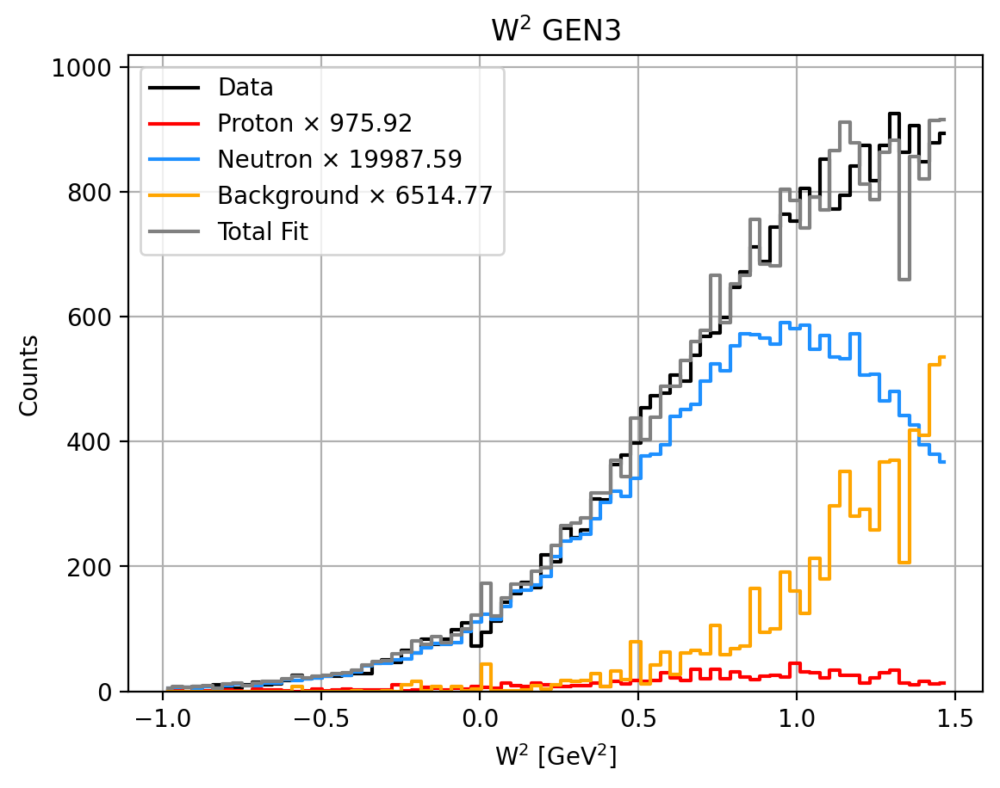

0.7629120312167297 0.03725033091618284 0.7256617003005469 0.23708796878327026


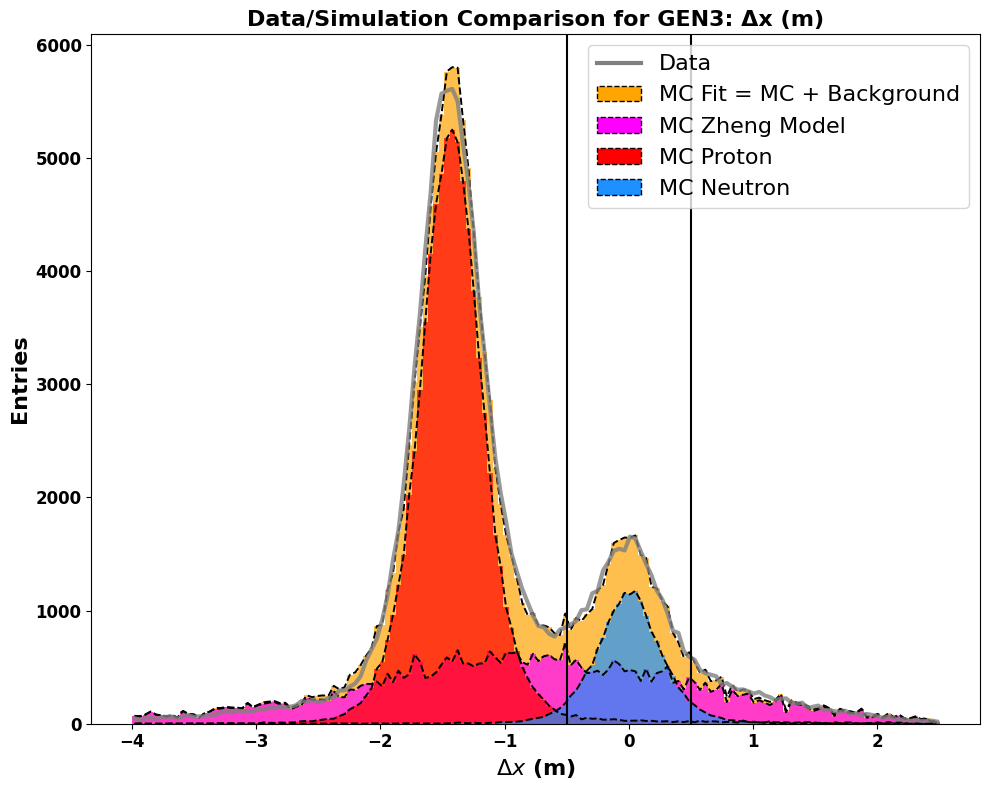

Total entries in fit: 138511.64844693377


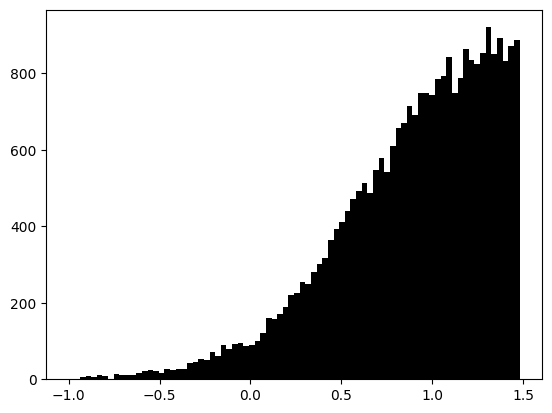

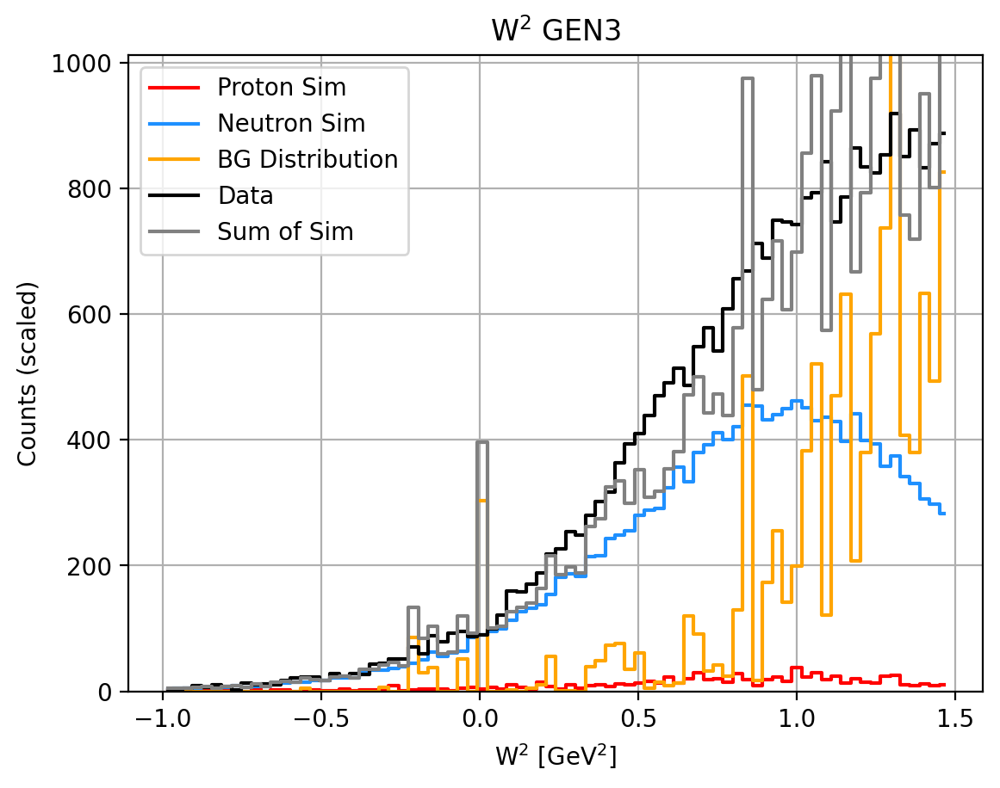

coinstuf: f,fe,A,Ae 0.02193436245499317 0.0009631603195924533 0.007861456078386692 0.010673664068606523
Total events in range (-0.5, 0.5):
  Sim Proton:   764.20
  Sim Neutron:  15651.31
  Background:   10446.59
  Total:        27156.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.04
   Background Fraction: 0.24
   Neutron Fraction: 0.73
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6135%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6155
tau_avg = 1.9191
Q2 = 6.7767
Px: 0.9898 Pz: -0.0380
A = 0.06263 ± 0.00780 ± 0.00173
B = 0.49159 (no propagated error)
C = 0.16538 ± 0.02433 ± 0.00540
__________________________________________________
N_plus: 14054 N_minus: 12803
A_raw: 0.0466+=0.0061
A_raw_weighted: 0.0479+-0.0060  12.6189%
__________________________________________________
A_phys_weighted: 0.195
A_phys_stat_error: 0.0243  12.4594%
A_phys_sys_error: 0.0054  2.764%
G

In [169]:
#rel_contribs,_,statdict,Q2_avg=DoItAll(W2min,W2max,coinmin,coinmax,dymin,dymax,dxmin,dxmax)
rel_contribs,_,statdict,Q2_avg=DoItAll(-1,new_W2max,new_coinmin,new_coinmax,new_dymin,new_dymax,
                                       new_dxmin,new_dxmax,new_hcalmin,.2,.7,extracut=True)




In [100]:
np.sqrt(.11463**2+.05743**2)

.15121/(1.91*.1026)

.12303/(1.91*.1026)

0.6278129879673006

In [54]:
15121/12303

1.229049825245875

In [289]:
gen=[]
gensys=[]
genstat=[]
araw=[]
arawerror=[]
aphysstaterror=[]
aphyssyserror=[]
cutindex=[]
stepsize=20
print("Starting ps")
for i in range(0,stepsize):
    #print(i)
    try: _,_,stats1,_=DoItAll(new_W2min,new_W2max,new_coinmin,new_coinmax,new_dymin,new_dymax,
                              new_dxmin,new_dxmax,new_hcalmin,.2+i/50,epmin,False,False)
    except:
        continue
    cutindex.append(i)
    A=stats1['GE/GM * muN']
    B=stats1['GE/GM_stat_error']
    C=stats1['GE/GM_sys_error']
    D=stats1['A_raw']
    E=stats1['A_raw_rel_error']
    F=stats1["A_phys_rel_sys_error"]
    G=stats1["A_phys_rel_sat_error"]
    gen.append(A)
    gensys.append(C)
    genstat.append(B)
    araw.append(D)
    arawerror.append(E)
    aphysstaterror.append(G)
    aphyssyserror.append(F)

Starting ps
PSMIN 0.2
coinstuf: f,fe,A,Ae 0.021594336461126004 0.0009613128936010284 0.006766215585627624 0.010800627230314195
PSMIN 0.22
coinstuf: f,fe,A,Ae 0.021298046628859483 0.0009558990819020175 0.009083402146985962 0.010860779367333647
PSMIN 0.24000000000000002
coinstuf: f,fe,A,Ae 0.021159676604345628 0.0009538669937697586 0.009648600357355569 0.010913635211660305
PSMIN 0.26
coinstuf: f,fe,A,Ae 0.02103307006799848 0.0009523748134961124 0.012167208770027707 0.010974952366728668
PSMIN 0.28
coinstuf: f,fe,A,Ae 0.02092520352781547 0.0009517504153174752 0.01205699671172817 0.011034950889398865
PSMIN 0.30000000000000004
coinstuf: f,fe,A,Ae 0.020694060038322335 0.0009483646639555684 0.012184615384615384 0.011093180359110057
PSMIN 0.32
coinstuf: f,fe,A,Ae 0.02068626192615411 0.0009504514002008398 0.009443339960238568 0.011146452016715177
PSMIN 0.34
coinstuf: f,fe,A,Ae 0.020625430144528563 0.0009515725410117787 0.00928948029123776 0.011203690668884833
PSMIN 0.36
coinstuf: f,fe,A,Ae 0.020

0.7

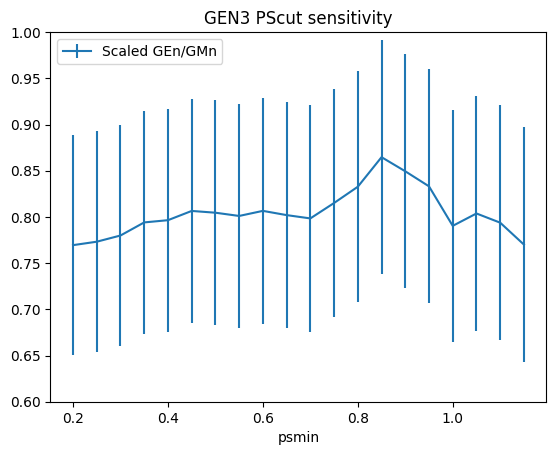

In [298]:
plt.errorbar(np.array(cutindex)/20+.2,np.array(gen),yerr=np.array(genstat),label='Scaled GEn/GMn')
#plt.plot(np.array(cutindex)/20+.2,genstat,'.',label='Statistical uncertainty')
#plt.plot(np.array(cutindex)/20,np.array(gensys)*5,'.')
#plt.plot(np.array(cutindex)/20,(np.array(gensys)**2+np.array(genstat)**2)**(1/2),'.')
plt.legend(loc='upper left')
plt.title("GEN3 PScut sensitivity")
plt.xlabel("psmin")
plt.ylim(.6,1)
np.where(genstat==np.min(genstat))
14/20

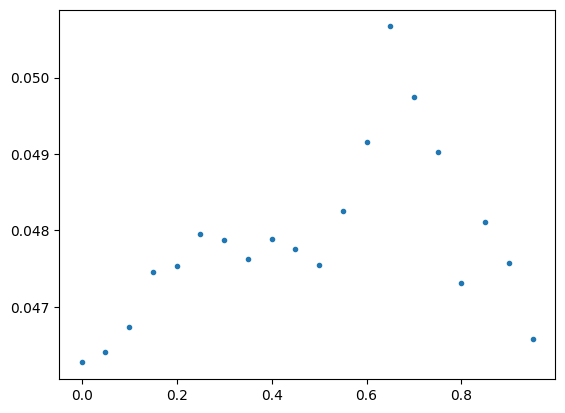

In [294]:
plt.plot(np.array(cutindex)/20,araw,'.')

# Initial 

In [280]:
gen=[]
gensys=[]
genstat=[]
araw=[]
arawerror=[]
aphysstaterror=[]
aphyssyserror=[]
cutindex=[]



stepsize=20
print("Starting W2")
for i in range(0,stepsize):
    #print(i)
    try: _,_,stats1,_=DoItAll(.87-i/wscale*2,.88+i/wscale,coinmin,coinmax,
                              dymin,dymax,dxmin,dxmax,hcalmin,psmin,epmin,False,False)
    except:
        continue
    cutindex.append(i)
    A=stats1['GE/GM * muN']
    B=stats1['GE/GM_stat_error']
    C=stats1['GE/GM_sys_error']
    D=stats1['A_raw']
    E=stats1['A_raw_rel_error']
    F=stats1["A_phys_rel_sys_error"]
    G=stats1["A_phys_rel_sat_error"]
    gen.append(A)
    gensys.append(C)
    genstat.append(B)
    araw.append(D)
    arawerror.append(E)
    aphysstaterror.append(G)
    aphyssyserror.append(F)
print("Starting dx")
for i in range(0,stepsize):
    #print(i)
    try: _,_,stats2,_=DoItAll(.87-36/wscale*2,.88+36/wscale,coinmin,coinmax,
                              dymin,dymax,-.1-i/dxscale,.1+i/dxscale,hcalmin,psmin,epmin,False,False)
    except:
        continue
    cutindex.append(stepsize+i)
    A=stats2['GE/GM * muN']
    B=stats2['GE/GM_stat_error']
    C=stats2['GE/GM_sys_error']
    D=stats2['A_raw']
    E=stats2['A_raw_rel_error']
    F=stats2["A_phys_rel_sys_error"]
    G=stats2["A_phys_rel_sat_error"]
    gen.append(A)
    gensys.append(C)
    genstat.append(B)
    araw.append(D)
    arawerror.append(E)
    aphysstaterror.append(G)
    aphyssyserror.append(F)
print("Starting dy")
for i in range(0,stepsize):
    #print(i)
    try: _,_,stats3,_=DoItAll(.87-36/wscale*2,.88+36/wscale,coinmin,coinmax,-.1-i/dyscale,.1+i/dyscale,
                              -.1-24/dxscale,.1+24/dxscale,hcalmin,psmin,epmin,False,False)
    except:
        continue
    cutindex.append(2*stepsize+i)
    A=stats3['GE/GM * muN']
    B=stats3['GE/GM_stat_error']
    C=stats3['GE/GM_sys_error']
    D=stats3['A_raw']
    E=stats3['A_raw_rel_error']
    F=stats3["A_phys_rel_sys_error"]
    G=stats3["A_phys_rel_sat_error"]
    gen.append(A)
    gensys.append(C)
    genstat.append(B)
    araw.append(D)
    arawerror.append(E)
    aphysstaterror.append(G)
    aphyssyserror.append(F)
print("starting coin")
for i in range(0,stepsize):
    #print(i)
    try: _,_,stats4,_=DoItAll(.87-36/wscale*2,.88+36/wscale,coinmin+4-i/10,coinmax-6+i/10,
                              -.1-18/dyscale,.1+18/dyscale,-.1-24/dxscale,.1+24/dxscale,hcalmin,psmin,epmin,False,False)
    except:
        continue
    cutindex.append(3*stepsize+i)
    A=stats4['GE/GM * muN']
    B=stats4['GE/GM_stat_error']
    C=stats4['GE/GM_sys_error']
    D=stats4['A_raw']
    E=stats4['A_raw_rel_error']
    F=stats4["A_phys_rel_sys_error"]
    G=stats4["A_phys_rel_sat_error"]
    gen.append(A)
    gensys.append(C)
    genstat.append(B)
    araw.append(D)
    arawerror.append(E)
    aphysstaterror.append(G)
    aphyssyserror.append(F)
print("starting hcale")
for i in range(0,stepsize):
    #print(i)
    try: _,_,stats4,_=DoItAll(.87-36/wscale*2,.88+36/wscale,coinmin+2,coinmax-5,
                              -.1-18/dyscale,.1+18/dyscale,-.1-24/dxscale,.1+24/dxscale,
                              hcalmin+i/hcalscale,psmin,epmin,False,False)
    except:
        continue
    cutindex.append(4*stepsize+i)
    A=stats4['GE/GM * muN']
    B=stats4['GE/GM_stat_error']
    C=stats4['GE/GM_sys_error']
    D=stats4['A_raw']
    E=stats4['A_raw_rel_error']
    F=stats4["A_phys_rel_sys_error"]
    G=stats4["A_phys_rel_sat_error"]
    gen.append(A)
    gensys.append(C)
    genstat.append(B)
    araw.append(D)
    arawerror.append(E)
    aphysstaterror.append(G)
    aphyssyserror.append(F)
    
   

Starting W2
PSMIN 0.2
coinstuf: f,fe,A,Ae 0.03582554517133956 0.01075194901670527 -0.06329113924050633 0.11228322189967942
PSMIN 0.2


/tmp/ipykernel_11202/719598200.py:111: RuntimeWarning: invalid value encountered in divide
  A_raw_per_run = (N_plus_per_run - N_minus_per_run) / (N_plus_per_run + N_minus_per_run)
/tmp/ipykernel_11202/719598200.py:112: RuntimeWarning: invalid value encountered in divide
  A_raw_error_per_run = 2 * np.sqrt(N_plus_per_run * N_minus_per_run) / (N_plus_per_run + N_minus_per_run)**1.5


coinstuf: f,fe,A,Ae 0.04047619047619048 0.004720467225981308 0.0022271714922048997 0.047192800772809185
PSMIN 0.2
coinstuf: f,fe,A,Ae 0.041117939713198715 0.003539510037845088 -0.02648171500630517 0.03549858741431138
PSMIN 0.2
coinstuf: f,fe,A,Ae 0.0439975500204165 0.0030623483847009355 0.006700167504187605 0.028939304411624282
PSMIN 0.2
coinstuf: f,fe,A,Ae 0.043237250554323724 0.002672811239568994 0.0070830650354153256 0.02537484380495803
PSMIN 0.2
coinstuf: f,fe,A,Ae 0.043559628291171916 0.002422177196916523 0.0112 0.023092562265803248
PSMIN 0.2
coinstuf: f,fe,A,Ae 0.04347111062383511 0.0022300744139011467 0.015034168564920273 0.021341928038035033
PSMIN 0.2
coinstuf: f,fe,A,Ae 0.04349904397705545 0.0020831475946157694 0.007836990595611285 0.019794581657639095
PSMIN 0.2
coinstuf: f,fe,A,Ae 0.04360908628581116 0.001964053092709754 0.008287292817679558 0.01858171553442424
PSMIN 0.2
coinstuf: f,fe,A,Ae 0.043256416114538114 0.0018538385062734923 0.015823766677008997 0.017612275431085716
P

coinstuf: f,fe,A,Ae 0.02131507060136201 0.0009151910478984585 0.011419536191145467 0.009371826444318238
PSMIN 0.2
coinstuf: f,fe,A,Ae 0.021238190337199477 0.0009126798590718914 0.010813186813186814 0.009375596449848544
PSMIN 0.2
coinstuf: f,fe,A,Ae 0.02637430039101434 0.00101868430206856 0.011880665317257767 0.009380432098897086
PSMIN 0.2
coinstuf: f,fe,A,Ae 0.026375224897599817 0.0010179809260455472 0.012336975678533662 0.009386577795251117
PSMIN 0.2
coinstuf: f,fe,A,Ae 0.02103402024143397 0.0008091291518794379 0.012063044818173814 0.00938288916311274
PSMIN 0.2
coinstuf: f,fe,A,Ae 0.021194957061940436 0.0008118620705044555 0.010836049687252224 0.009385500544795741
PSMIN 0.2
coinstuf: f,fe,A,Ae 0.021339701274602257 0.0008142534455157397 0.011443661971830986 0.009381718449943115
starting hcale
PSMIN 0.2
coinstuf: f,fe,A,Ae 0.028242548818088388 0.0010926304641625426 0.010099235970843945 0.009370724951604703
PSMIN 0.2
coinstuf: f,fe,A,Ae 0.027386831275720166 0.0010760557033297653 0.013798

NameError: name 'highlight_indices' is not defined

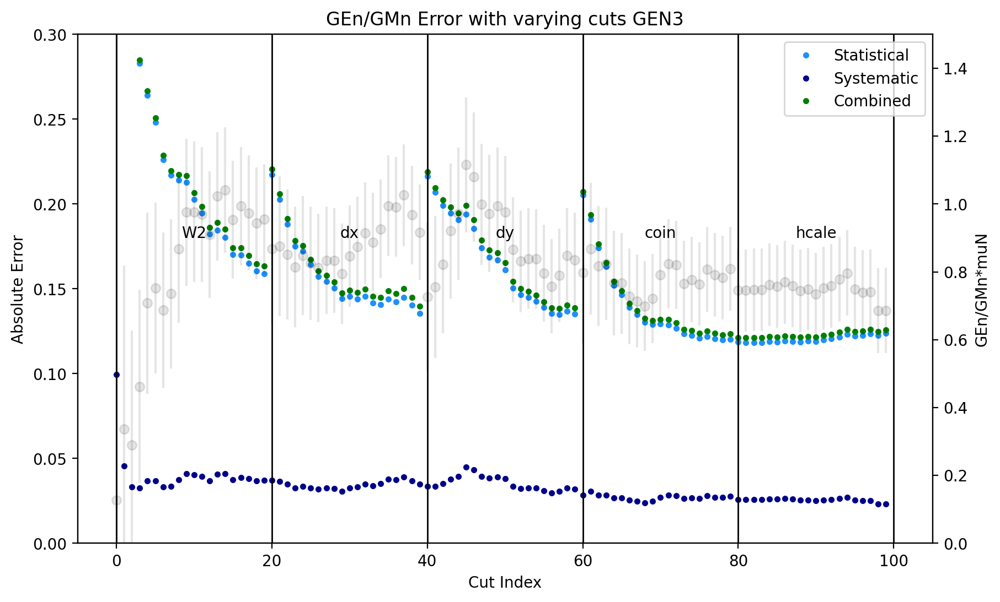

In [281]:
gen_error=np.sqrt(np.array(genstat)**2+np.array(gensys)**2)

fig, ax1 = plt.subplots(figsize=(10,6), dpi=200)
msize = 15

# Plot aphys errors on the left y-axis
ax1.plot(cutindex, np.array(genstat), '.', color='dodgerblue', label='Statistical')
ax1.plot(cutindex, np.array(gensys), '.', color='darkblue', label='Systematic')
ax1.plot(cutindex, (np.array(gensys)**2+np.array(genstat)**2)**(1/2), '.', color='green', label='Combined')

RatRel=(np.array(gensys)**2+np.array(genstat)**2)**(1/2)
RatRel[np.isnan(RatRel)]=100
cut1min=np.where(abs(RatRel[:stepsize])==np.min(abs(RatRel[:stepsize])))
cut2min=np.where(abs(RatRel[stepsize:2*stepsize])==np.min(abs(RatRel[stepsize:2*stepsize])))
cut3min=np.where(abs(RatRel[2*stepsize:3*stepsize])==np.min(abs(RatRel[2*stepsize:3*stepsize])))
cut4min=np.where(abs(RatRel[3*stepsize:4*stepsize])==np.min(abs(RatRel[3*stepsize:4*stepsize])))
cut5min=np.where(abs(RatRel[4*stepsize:5*stepsize])==np.min(abs(RatRel[4*stepsize:5*stepsize])))

"""highlight_indices = [int(cut1min[0][0]), stepsize+int(cut2min[0][0]), 
                     2*stepsize+int(cut3min[0]), 3*stepsize+int(cut4min[0][0]),
                     4*stepsize+int(cut5min[0][0])]
for idx in highlight_indices:
    
    try:
        ax1.plot(cutindex[idx], np.array(genstat)[idx], '.', color='red', markersize=msize)
        ax1.plot(cutindex[idx], np.array(gensys)[idx], '.', color='red', markersize=msize)
    except: continue
"""
ax1.set_ylabel("Absolute Error")
ax1.set_xlabel("Cut Index")
ax1.set_ylim(0, .30)
ax1.set_title("GEn/GMn Error with varying cuts GEN3")
ax1.axvline(0, color='black', linewidth=1)
ax1.axvline(stepsize, color='black', linewidth=1)
ax1.axvline(2*stepsize, color='black', linewidth=1)
ax1.axvline(3*stepsize, color='black', linewidth=1)
ax1.axvline(4*stepsize, color='black', linewidth=1)
ax1.axvline(5*stepsize, color='black', linewidth=1)

ax1.text(stepsize/2, .18, "W2", ha='center')
ax1.text(2*stepsize - stepsize/2, .18, "dx", ha='center')
ax1.text(3*stepsize - stepsize/2, .18, "dy", ha='center')
ax1.text(4*stepsize - stepsize/2, .18, "coin", ha='center')
ax1.text(5*stepsize - stepsize/2, .18, "hcale", ha='center')

# Create right y-axis
ax2 = ax1.twinx()
ax2.errorbar(cutindex, np.array(gen), gen_error, fmt='o', linestyle='none', color='black', label='GEn/GMn*muN',alpha=.1)
ax2.set_ylabel("GEn/GMn*muN")  # Customize as needed
ax2.set_ylim(0, 1.5)
lines2, labels2 = ax2.get_legend_handles_labels()

# Combine legends from both axes
lines1, labels1 = ax1.get_legend_handles_labels()

ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right')
ax1.legend(lines1 , labels1 , loc='upper right')
for i in range(0,len(highlight_indices)):
    print(highlight_indices[i]-stepsize*i)

In [170]:
rel_contribs

{'f_acc': 0.1800272999788719,
 'f_p': 0.263177486755391,
 'f_inelastic': 5.105046819560903,
 'f_N2': 1.4795038385269321,
 'A_acc': 2.981292518280684,
 'A_p': 8.918903138954253e-05,
 'A_inelastic': 0.4947810088920827,
 'P': 89.49608183897374}

In [171]:
GEGM=statdict['GE/GM * muN']
GEGMstat=statdict['GE/GM_stat_error']
GEGMsys=statdict['GE/GM_sys_error']

In [172]:
GEGME=np.sqrt(GEGMstat**2+GEGMsys**2)

In [173]:
GEN2Data = {
    'Q2': [Q2_avg],
    'ExpName': ['GEn-II'],
    'R': [GEGM ],
    'R_err': [GEGME],
    'GEn': [0],   # assuming GEn and GEn_err are present in the file
    'GEn_err': [0]
}

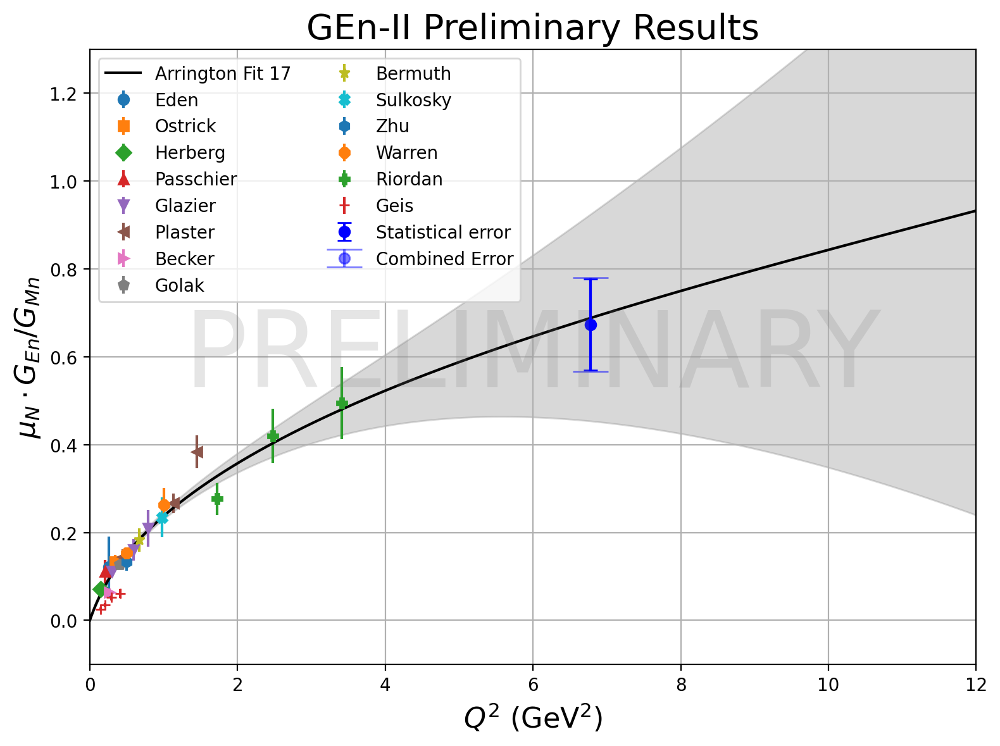

In [174]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from GETFF import Function_GETFF  # Assuming you have this imported somewhere

# Load theory Q2 and GEn/GD ratio
GEntheory = np.transpose(np.loadtxt('../../DB/neutron_lookup.dat'))
Q2t = np.sort(GEntheory[0])

# Calculate GE/GM and uncertainties using GETFF
GEGD, GEGDE, GMGD, GMGDE = [], [], [], []
for q2 in Q2t:
    GEGD.append(Function_GETFF(3, q2)[0])
    GEGDE.append(Function_GETFF(3, q2)[1])
    GMGD.append(Function_GETFF(4, q2)[0])
    GMGDE.append(Function_GETFF(4, q2)[1])

GEGD = np.array(GEGD)
GEGDE = np.array(GEGDE)
GMGD = np.array(GMGD)
GMGDE = np.array(GMGDE)

# Error propagation: GE/GM with uncertainty
def eprop(GE, GEE, GM, GMM):
    R = GE / GM
    fractional_error = np.sqrt((GEE / GE)**2 + (GMM / GM)**2)
    return R, R * fractional_error

RatFit, RatFitE = eprop(GEGD, GEGDE, GMGD, GMGDE)

# Load world data
df = pd.read_csv("../../DB/GEn_World_Data.csv")
mu_n = 1.91

# Setup plot
fig, ax = plt.subplots(figsize=(8, 6), dpi=200)
marker_styles = ['o', 's', 'D', '^', 'v', '<', '>', 'p', '*', 'X', 'h', '8', 'P', '+', 'x', '|', '_']
experiments = df["Experiment"].unique()
markers = {exp: marker_styles[i % len(marker_styles)] for i, exp in enumerate(experiments)}

# Plot world data
for exp in experiments:
    subset = df[df["Experiment"] == exp]
    ax.errorbar(subset["Q2"], mu_n * subset["GEn"] / subset["GMn"],
                subset["RatE"], fmt=markers[exp], label=exp)
#plt.errorbar(GEN2Data['Q2'],GEN2Data['R'],GEN2Data['R_err'],fmt='o',color='red',label='GEn-II')

# Plot fit and shaded error band
ax.plot(Q2t, RatFit, color='black', label='Arrington Fit 17')
ax.fill_between(Q2t, RatFit - RatFitE, RatFit + RatFitE, color='gray', alpha=0.3)

# Plot data points with statistical errors
plt.errorbar(GEN2Data['Q2'],GEN2Data['R'],yerr=GEGMstat,fmt='o',
             label='Statistical error', capsize=4, color='blue')
plt.errorbar(GEN2Data['Q2'],GEN2Data['R'],yerr=GEN2Data['R_err'],fmt='o',
             label='Combined Error', capsize=10,alpha=.5, color='blue') 


# Watermark and labels
ax.text(0.5, 0.5, 'PRELIMINARY', fontsize=60, color='gray',
        ha='center', va='center', alpha=0.2, transform=ax.transAxes)

ax.set_xlim(0, 12)
ax.set_ylim(-0.1, 1.3)
ax.grid(True)
ax.set_xlabel('$Q^2$ (GeV$^2$)', fontsize=16)
ax.set_ylabel(r'$\mu_N \cdot G_{En} / G_{Mn}$', fontsize=16)
ax.set_title('GEn-II Preliminary Results', fontsize=20)
ax.legend(loc='upper left', fontsize=10, ncol=2)
#plt.yscale("log")




# Overlay systematic errors as transparent error bars

plt.tight_layout()
plt.savefig("PrelimResults.pdf")
plt.show()


In [175]:
with open("../kin3resultsMETHOD6.txt",'w') as f:
    for i,key in enumerate(statdict):
        if i<4:
            f.write(key+","+f"{statdict[key]:.0f}\n")
        else:
            f.write(key+","+f"{statdict[key]:.4f}\n")

In [288]:
for key in statdict:
    print(key,statdict[key])

N_p 735.4012343934575
N_n 17059.574938307087
N_bg 8552.770140044631
N_total 26836.0
f_p 0.02740353384980837
f_p_e 0.0010242711057889872
f_bg 0.31870510284858516
f_bg_e 0.003957395543019912
f_n 0.6356973818120095
f_n_e 0.006224691022227811
f_nitrogen 0.0244
f_nitrogen_e 0.0024400000000000003
f_acc 0.021594336461126004
f_acc_e 0.0009613128936010284
A_acc 0.006766215585627624
A_acc_e 0.010800627230314195
A_p 0.00020721121253268953
A_p_e 3.4414097042768345e-05
A_inelastic 0
A_inelastic_e 0.0005
P_beam 0.8648800000000001
P_beam_e 0.0008000000000000003
P_target 0.42121921206851287
P_target_e 0.011009208776399267
N_plus_raw 13884
N_minus_raw 12656
A_raw 0.046269781461944236
A_raw_rel_error 0.13252161051935055
A_Phys_wavg 0.2164354467974187
A_phys_rel_sys_error 0.02777301076701032
A_phys_rel_sat_error 0.12548910825897822
tau 1.9147726651679176
epsilon 0.6162751858361329
Q2 6.7613103527186205
Px 0.9898257462789185
Pz -0.03756625950613242
GE/GM * muN 0.7694668400898068
GE/GM_stat_error 0.1192114

In [322]:
wcut=(generic["W2"] < new_W2max)&(generic["W2"]>new_W2min) 
dycut=(generic["dy"]<new_dymax)&(generic["dy"]>new_dymin) 
dxcut=(generic["dx"] < -1)&(generic["dx"]>-2) 
coincut=(new_coinmin < generic["coin_time"])&(generic["coin_time"] < new_coinmax)
epcut=abs(bbcalE/gemP-.95)<.25
runnumcut=generic["runnum"]>2165


dxcut=(generic["dx"] < -1)&(generic["dx"]>-2) 

fullcut= dycut & dxcut& coincut&epcut&runnumcut

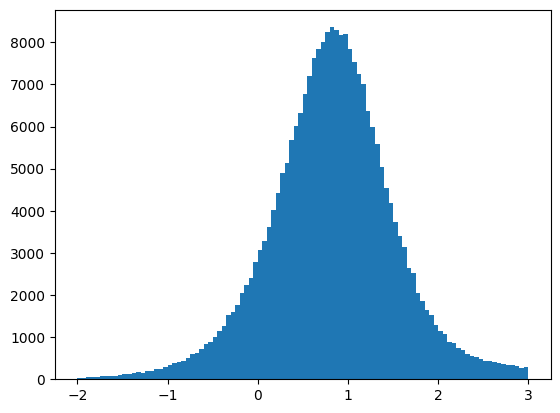

In [323]:
d=plt.hist(genericSim["W2"],range=(-2,3),bins=100)

Text(0.5, 1.0, 'proton')

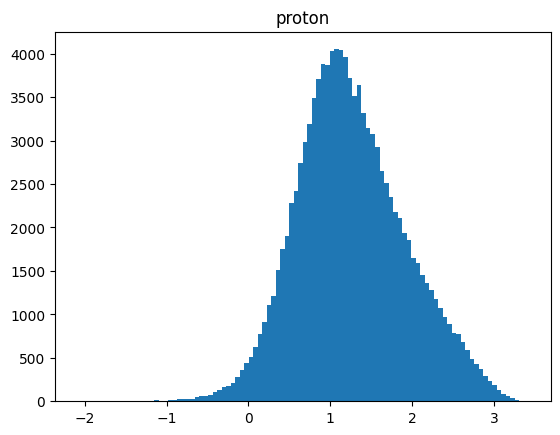

In [324]:
d=plt.hist(generic["W2"][fullcut],bins=100)
plt.title("proton")

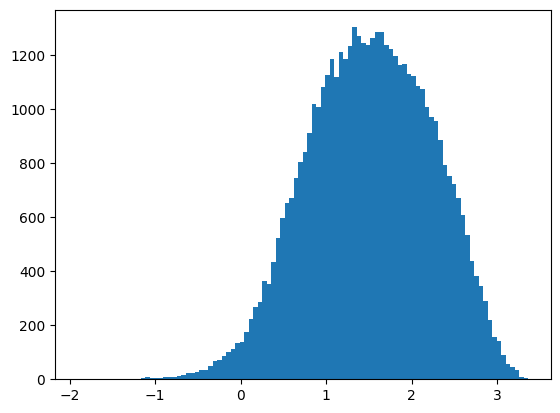

In [317]:
dxcut=(generic["dx"] < new_dxmax)&(generic["dx"]>new_dxmin) 

fullcut= dycut & dxcut& coincut&epcut&runnumcut
d=plt.hist(generic["W2"][fullcut],bins=100)

Text(0.5, 0, 'W2')

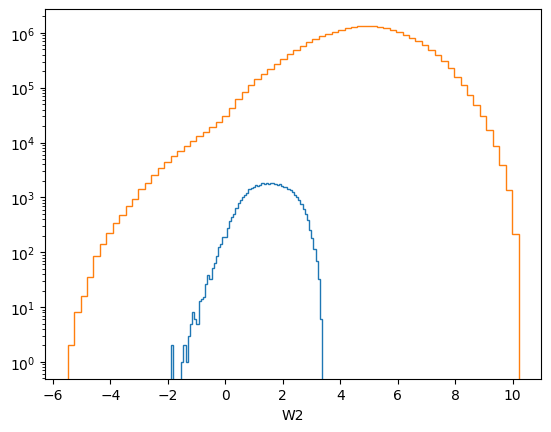

In [305]:
d=plt.hist(generic["W2"][fullcut],bins=70,histtype='step')
d=plt.hist(generic["W2"],bins=70,histtype='step')
plt.yscale("log")
plt.xlabel("W2")

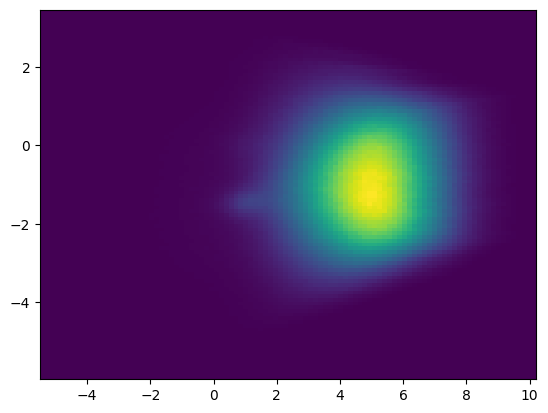

In [306]:
d=plt.hist2d(generic["W2"],generic["dx"],bins=(100,100))

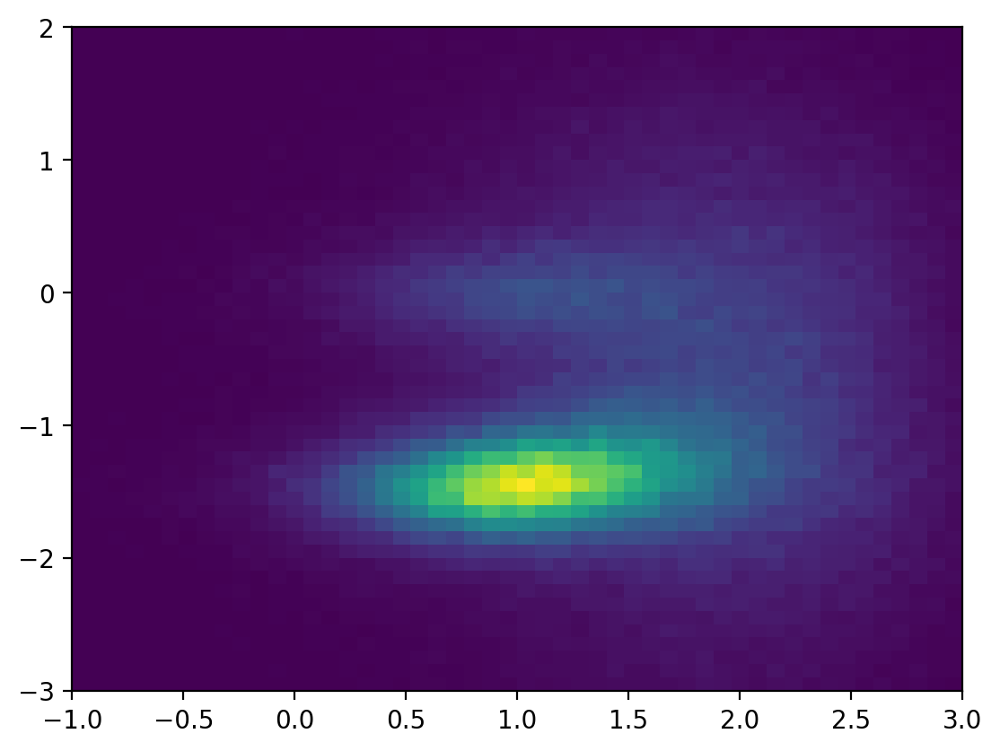

In [310]:
plt.figure(dpi=200)
d=plt.hist2d(generic["W2"][fullcut],generic["dx"][fullcut],bins=(50,50),range=((-1,3),(-3,2)))


0
PSMIN 0.2


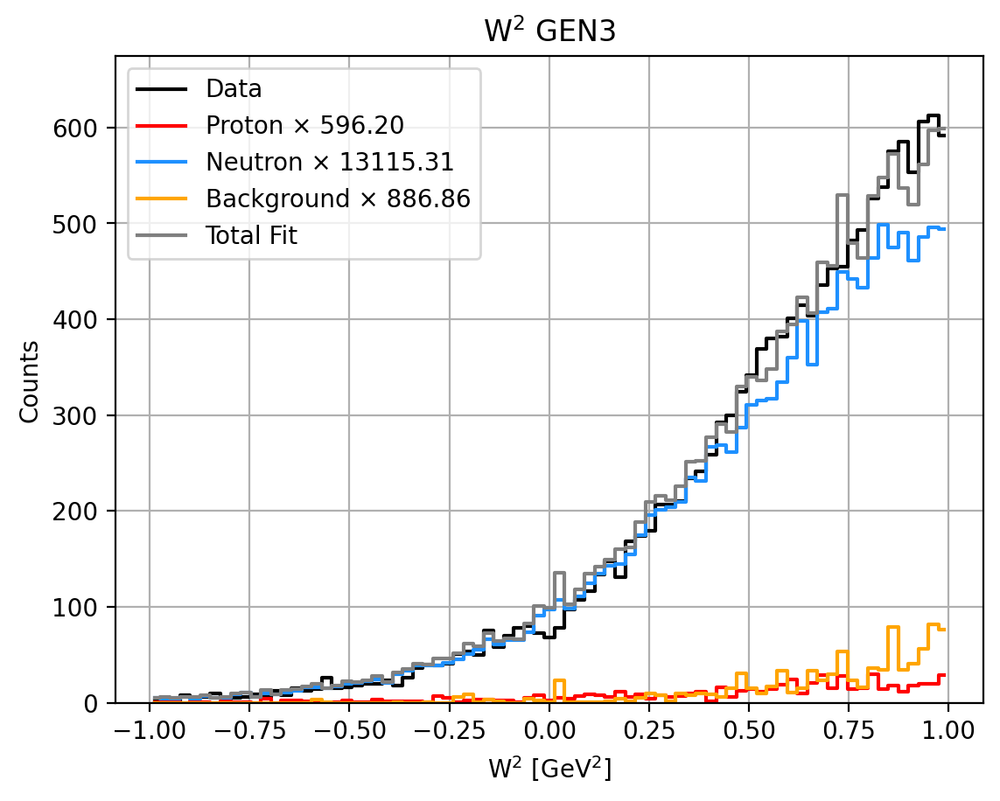

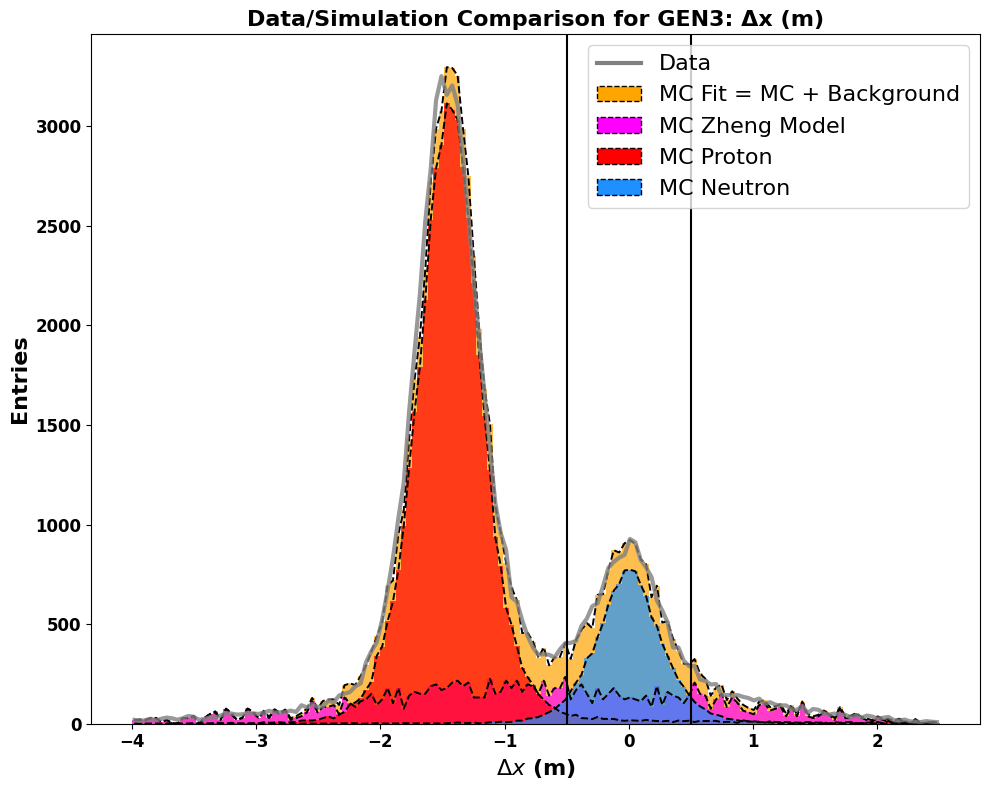

Total entries in fit: 72273.85003029375


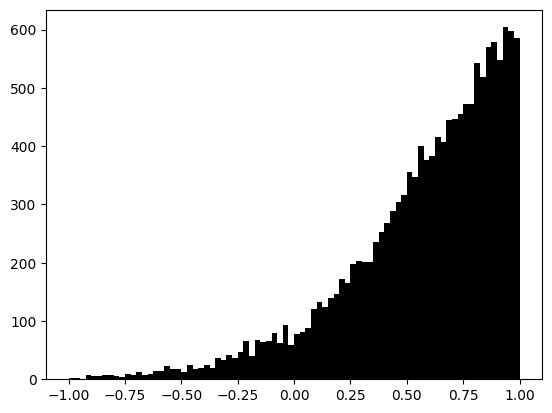

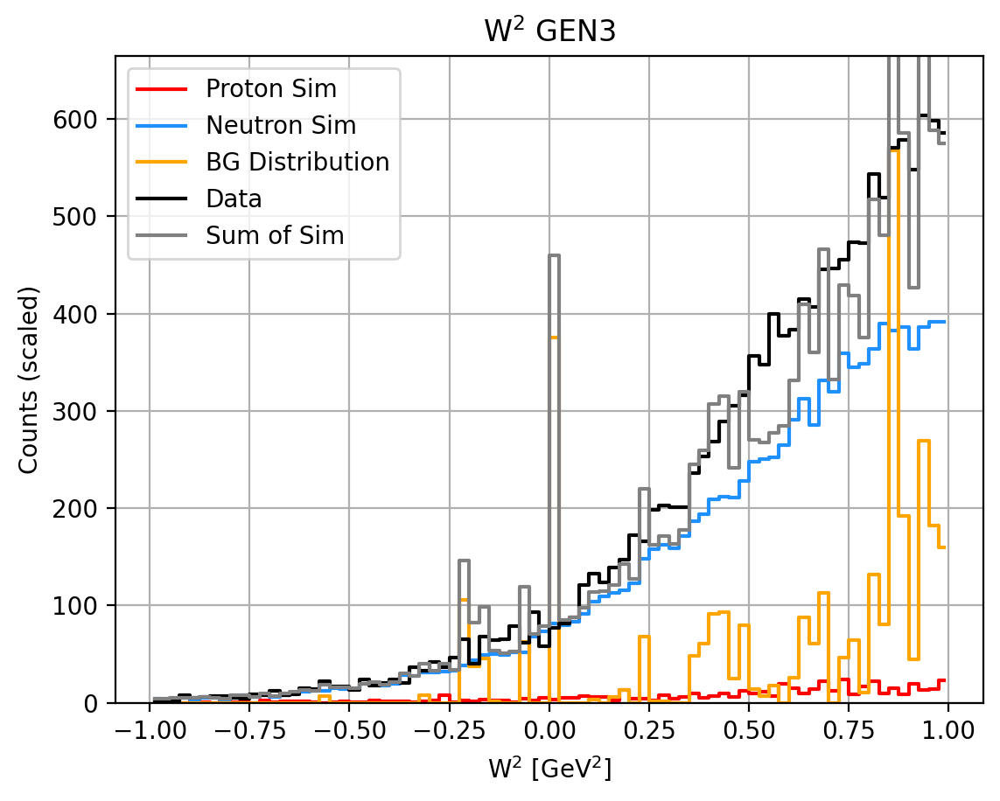

coinstuf: f,fe,A,Ae 0.019280711418902967 0.0012436177589511526 0.01220971989466124 0.015471605683096948
Total events in range (-0.5, 0.5):
  Sim Proton:   474.84
  Sim Neutron:  10445.58
  Background:   3188.52
  Total:        14255.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.03
   Background Fraction: 0.22
   Neutron Fraction: 0.73
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6123%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6038
tau_avg = 1.9893
Q2 = 7.0245
Px: 0.9897 Pz: -0.0476
A = 0.06129 ± 0.00989 ± 0.00171
B = 0.48537 (no propagated error)
C = 0.16399 ± 0.03259 ± 0.00562
__________________________________________________
N_plus: 7383 N_minus: 6707
A_raw: 0.0480+=0.0084
A_raw_weighted: 0.0506+-0.0083  16.3871%
__________________________________________________
A_phys_weighted: 0.202
A_phys_stat_error: 0.0326  16.1361%
A_phys_sys_error: 0.0056  2.782%
GEn/

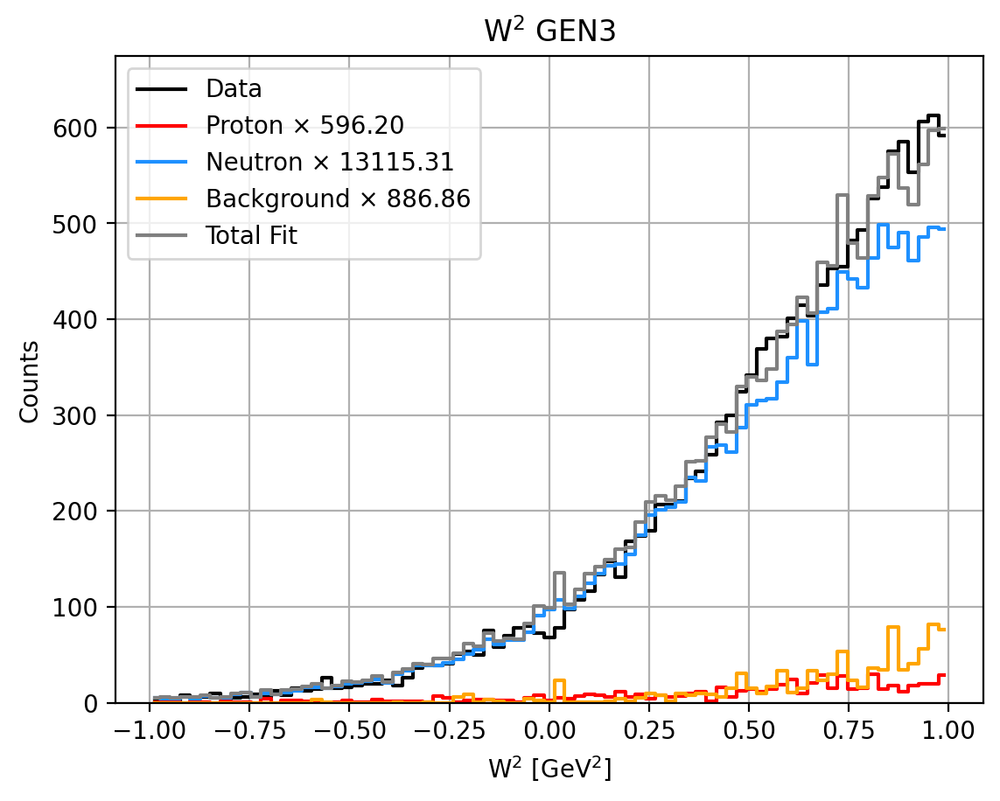

0.9392496813799147 0.04269683070307306 0.8965528506768417 0.060750318620085286


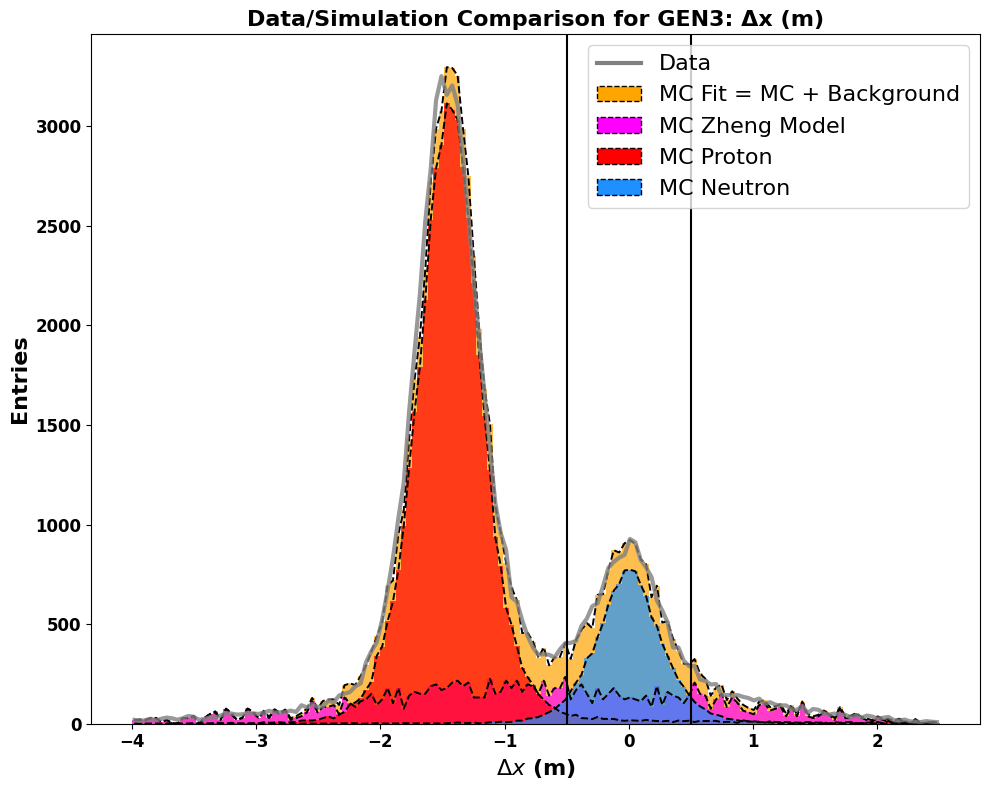

Total entries in fit: 72273.85003029375


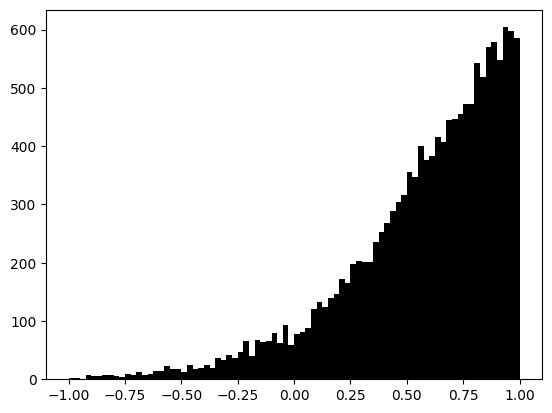

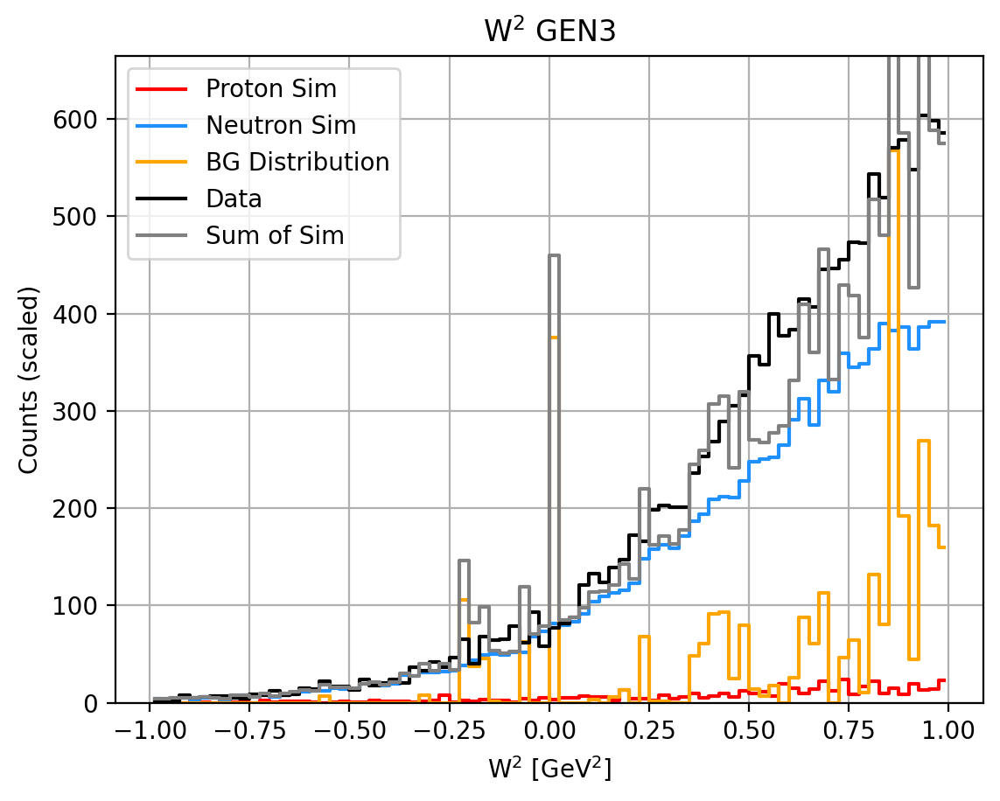

coinstuf: f,fe,A,Ae 0.019280711418902967 0.0012436177589511526 0.01220971989466124 0.015471605683096948
Total events in range (-0.5, 0.5):
  Sim Proton:   474.84
  Sim Neutron:  10445.58
  Background:   3188.52
  Total:        14255.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.04
   Background Fraction: 0.06
   Neutron Fraction: 0.90
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6123%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6038
tau_avg = 1.9893
Q2 = 7.0245
Px: 0.9897 Pz: -0.0476
A = 0.05080 ± 0.00820 ± 0.00139
B = 0.48537 (no propagated error)
C = 0.12940 ± 0.02701 ± 0.00459
__________________________________________________
N_plus: 7383 N_minus: 6707
A_raw: 0.0480+=0.0084
A_raw_weighted: 0.0506+-0.0083  16.3871%
__________________________________________________
A_phys_weighted: 0.167
A_phys_stat_error: 0.0270  16.1361%
A_phys_sys_error: 0.0046  2.745%
GEn/

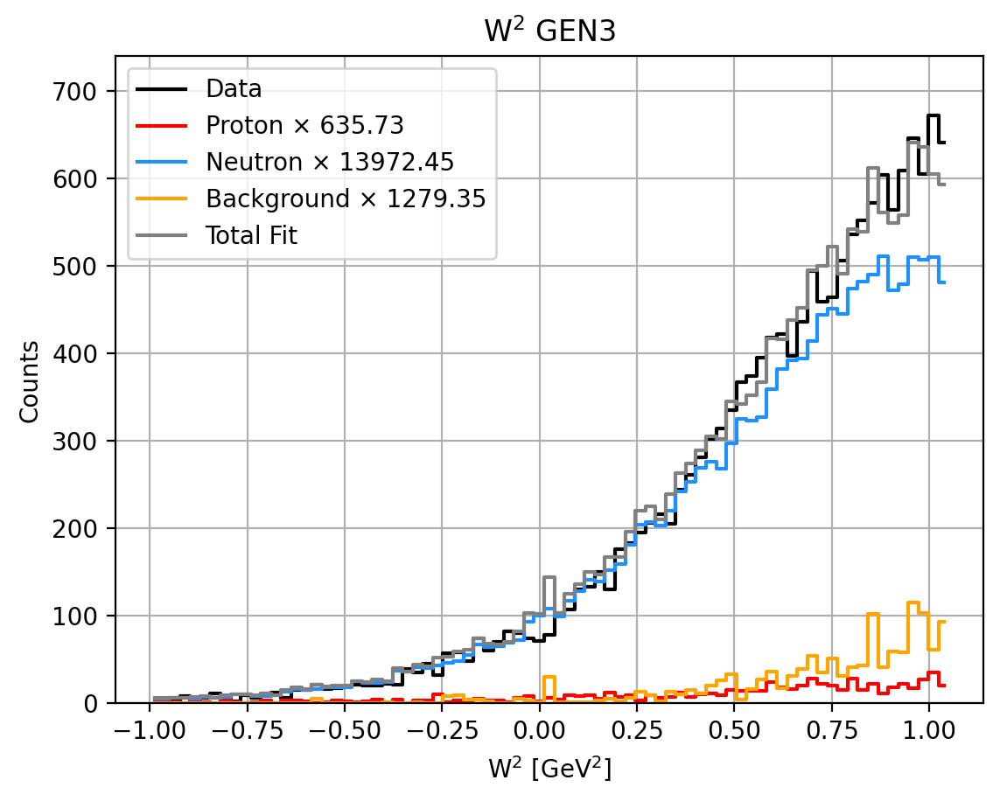

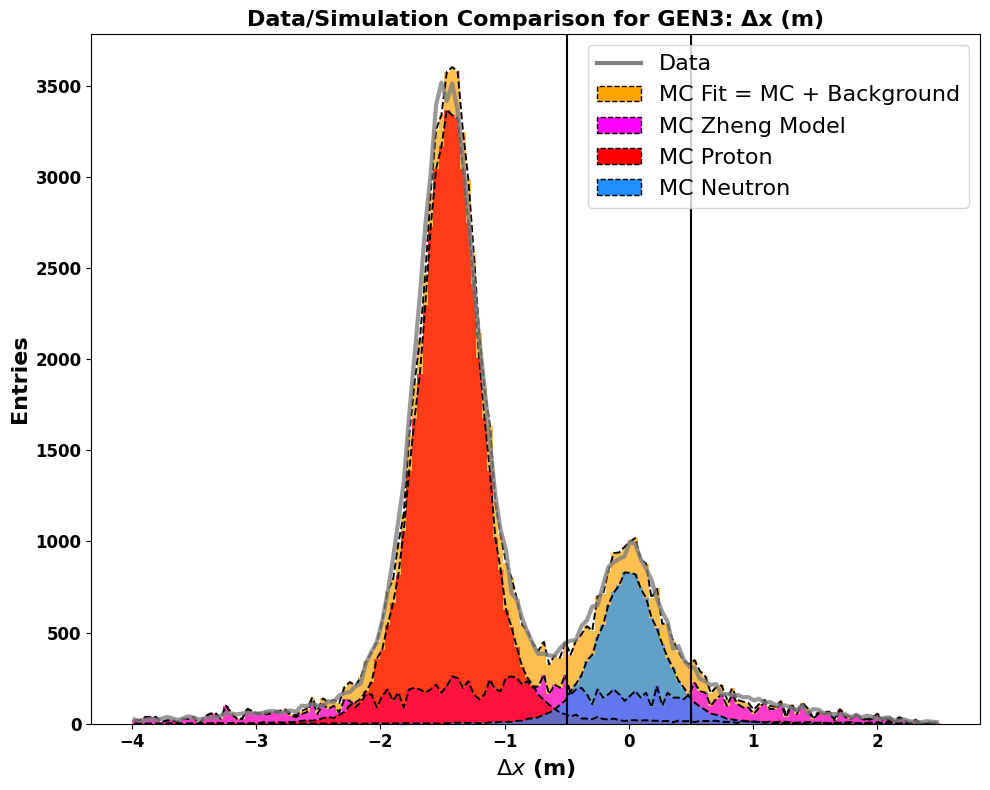

Total entries in fit: 79068.03750258693


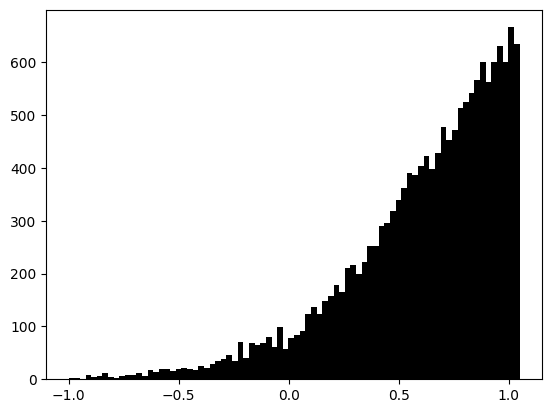

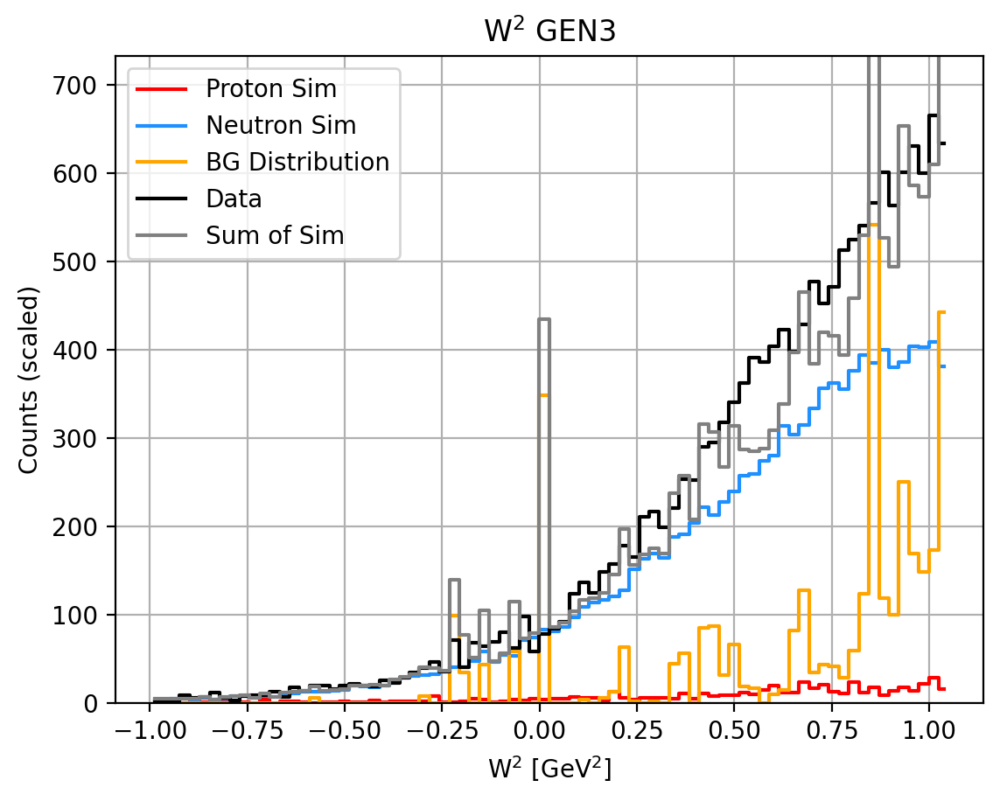

coinstuf: f,fe,A,Ae 0.01940589765828274 0.0011957356086199722 0.012329370321444297 0.01483690866692674
Total events in range (-0.5, 0.5):
  Sim Proton:   511.23
  Sim Neutron:  11235.98
  Background:   3572.83
  Total:        15527.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.03
   Background Fraction: 0.23
   Neutron Fraction: 0.72
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6134%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6052
tau_avg = 1.9810
Q2 = 6.9950
Px: 0.9897 Pz: -0.0466
A = 0.06267 ± 0.00963 ± 0.00174
B = 0.48609 (no propagated error)
C = 0.16804 ± 0.03152 ± 0.00569
__________________________________________________
N_plus: 8036 N_minus: 7300
A_raw: 0.0480+=0.0081
A_raw_weighted: 0.0509+-0.0080  15.6346%
__________________________________________________
A_phys_weighted: 0.205
A_phys_stat_error: 0.0315  15.3666%
A_phys_sys_error: 0.0057  2.775%
GEn/G

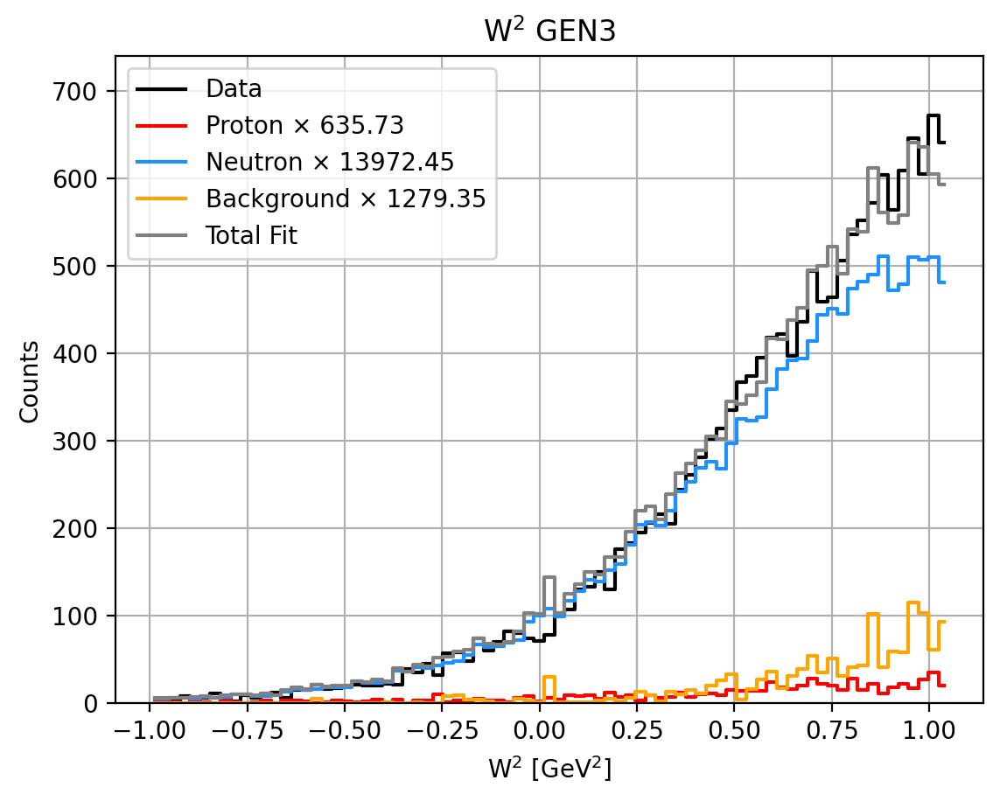

0.9194743507467461 0.04183519673901402 0.8776391540077321 0.0805256492532539


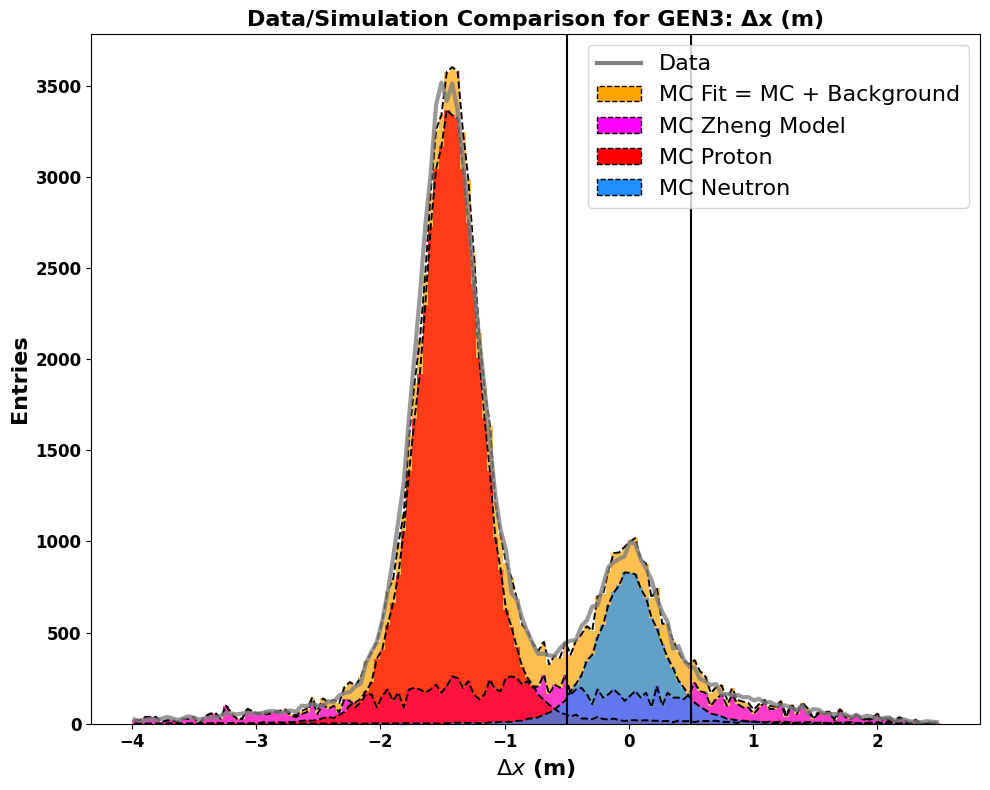

Total entries in fit: 79068.03750258693


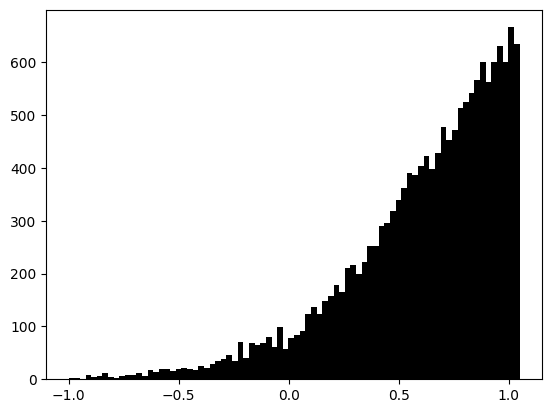

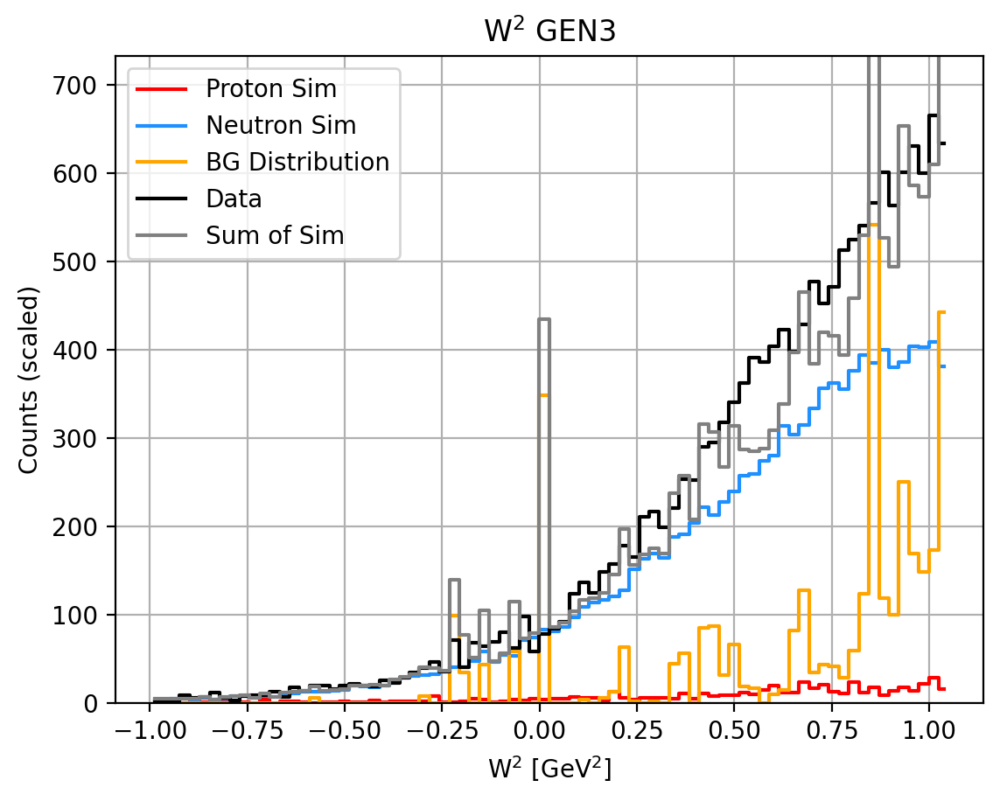

coinstuf: f,fe,A,Ae 0.01940589765828274 0.0011957356086199722 0.012329370321444297 0.01483690866692674
Total events in range (-0.5, 0.5):
  Sim Proton:   511.23
  Sim Neutron:  11235.98
  Background:   3572.83
  Total:        15527.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.04
   Background Fraction: 0.08
   Neutron Fraction: 0.88
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6134%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6052
tau_avg = 1.9810
Q2 = 6.9950
Px: 0.9897 Pz: -0.0466
A = 0.05262 ± 0.00809 ± 0.00144
B = 0.48609 (no propagated error)
C = 0.13516 ± 0.02647 ± 0.00472
__________________________________________________
N_plus: 8036 N_minus: 7300
A_raw: 0.0480+=0.0081
A_raw_weighted: 0.0509+-0.0080  15.6346%
__________________________________________________
A_phys_weighted: 0.172
A_phys_stat_error: 0.0265  15.3666%
A_phys_sys_error: 0.0047  2.741%
GEn/G

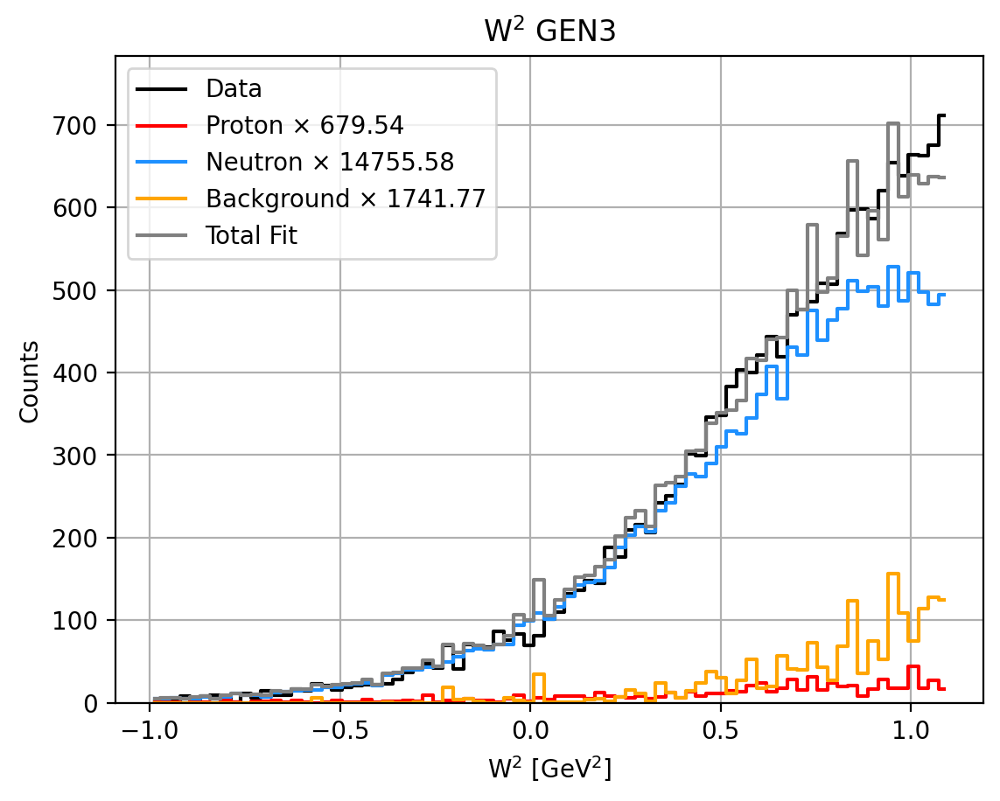

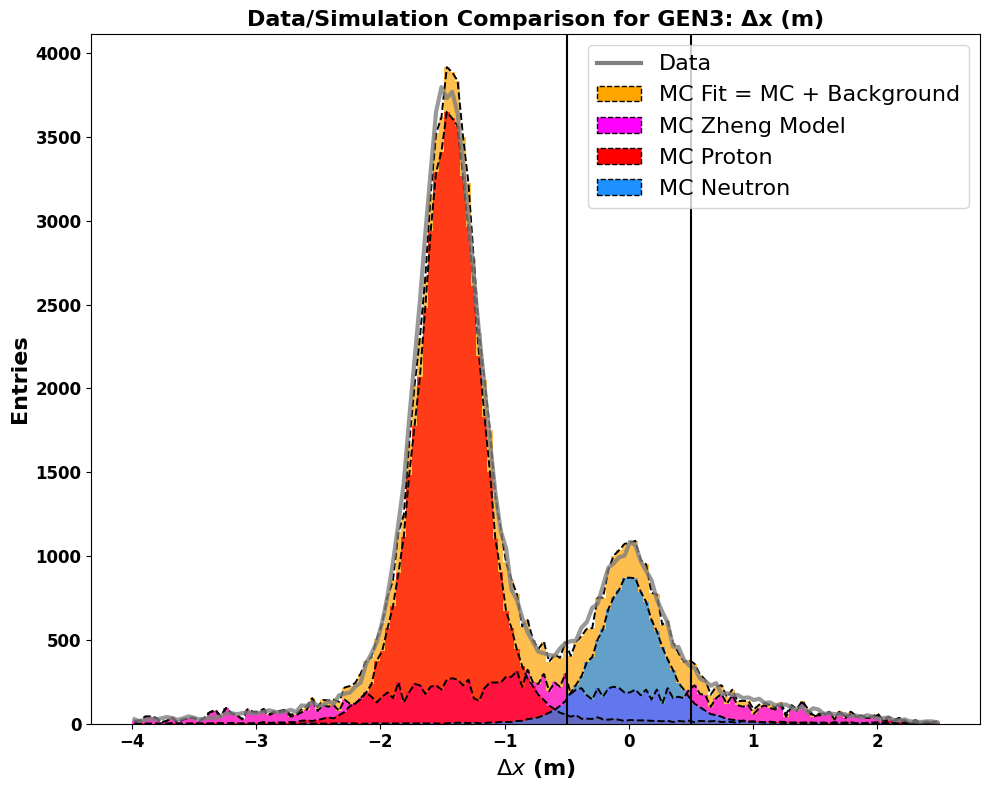

Total entries in fit: 86000.87428914841


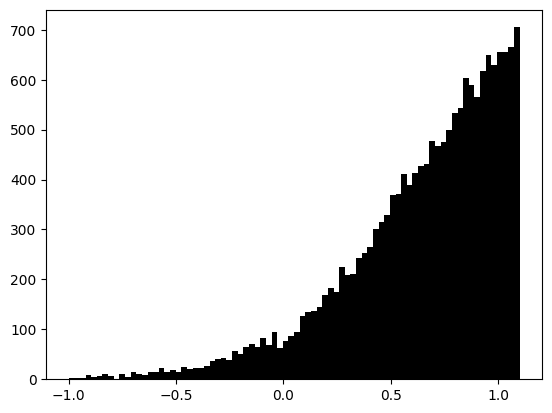

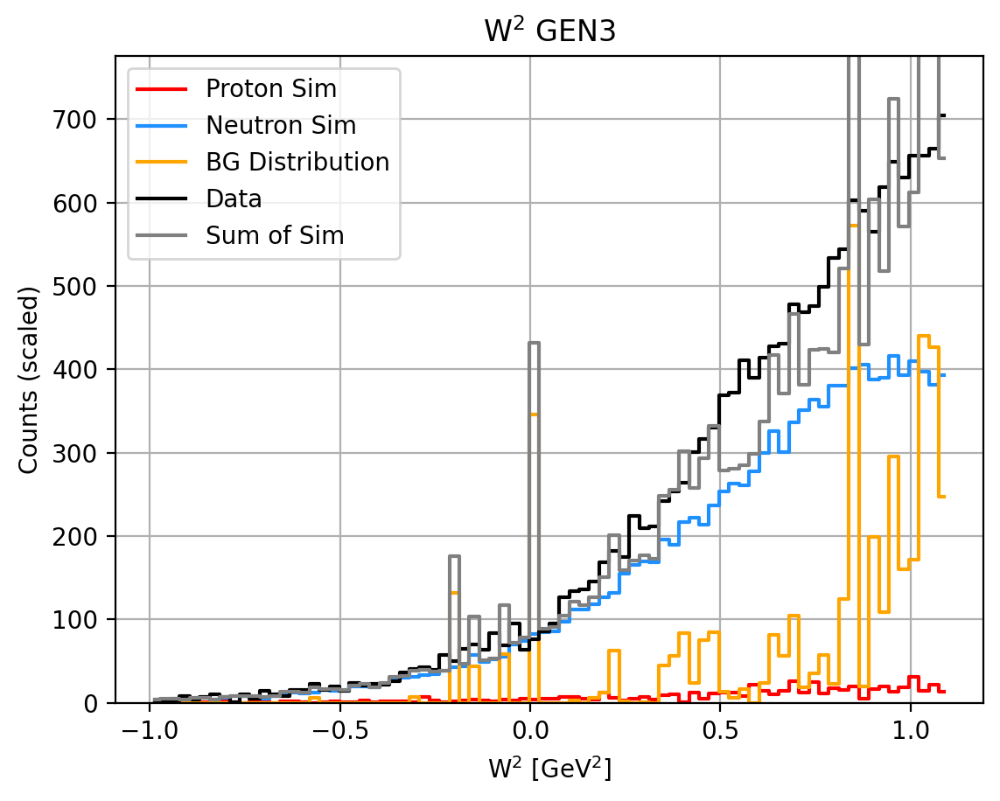

coinstuf: f,fe,A,Ae 0.0197236684020825 0.0011586444874417355 0.012688821752265862 0.01419075194788609
Total events in range (-0.5, 0.5):
  Sim Proton:   544.70
  Sim Neutron:  11827.62
  Background:   4222.91
  Total:        16828.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.03
   Background Fraction: 0.25
   Neutron Fraction: 0.70
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6130%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6066
tau_avg = 1.9727
Q2 = 6.9660
Px: 0.9897 Pz: -0.0456
A = 0.06718 ± 0.00958 ± 0.00186
B = 0.48680 (no propagated error)
C = 0.18223 ± 0.03115 ± 0.00606
__________________________________________________
N_plus: 8728 N_minus: 7894
A_raw: 0.0502+=0.0077
A_raw_weighted: 0.0528+-0.0076  14.4712%
__________________________________________________
A_phys_weighted: 0.218
A_phys_stat_error: 0.0311  14.2580%
A_phys_sys_error: 0.0061  2.775%
GEn/GM

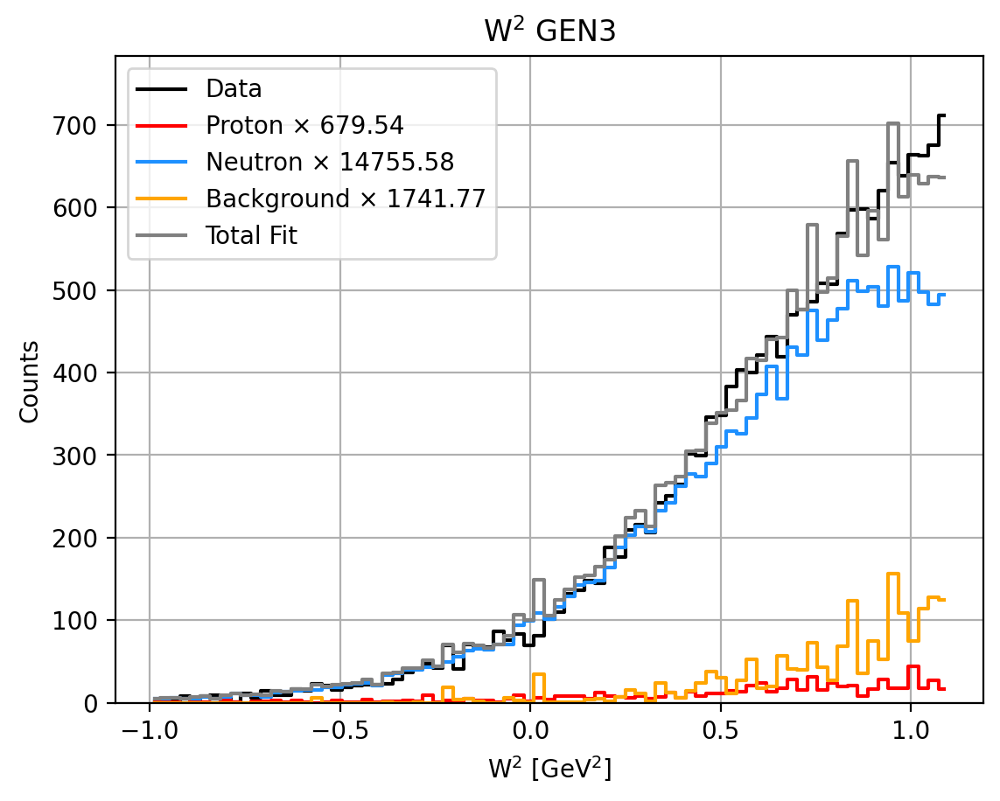

0.8985978578741601 0.04138327559999901 0.8572145822741611 0.10140214212583976


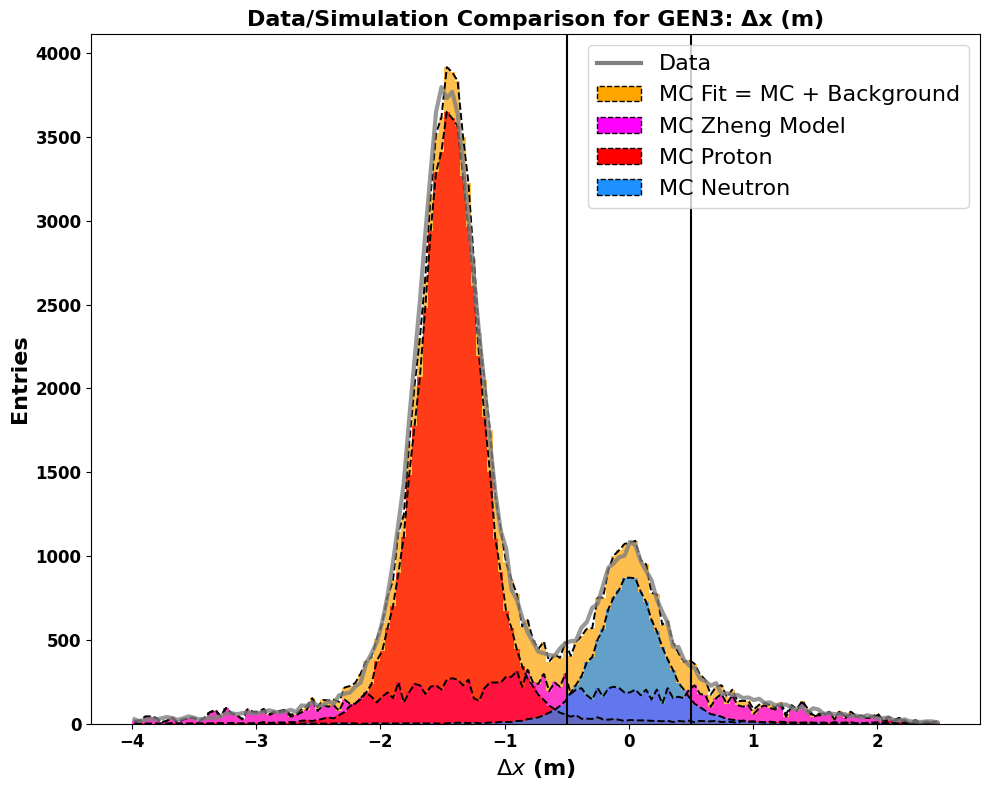

Total entries in fit: 86000.87428914841


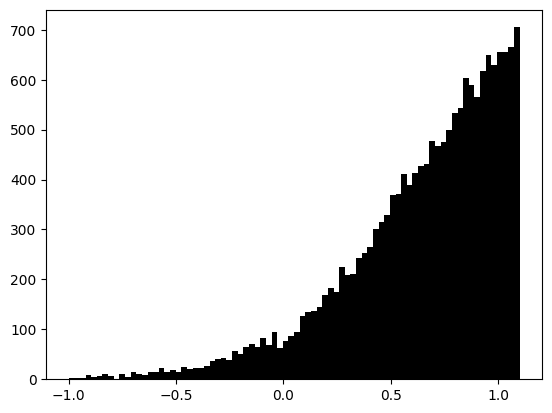

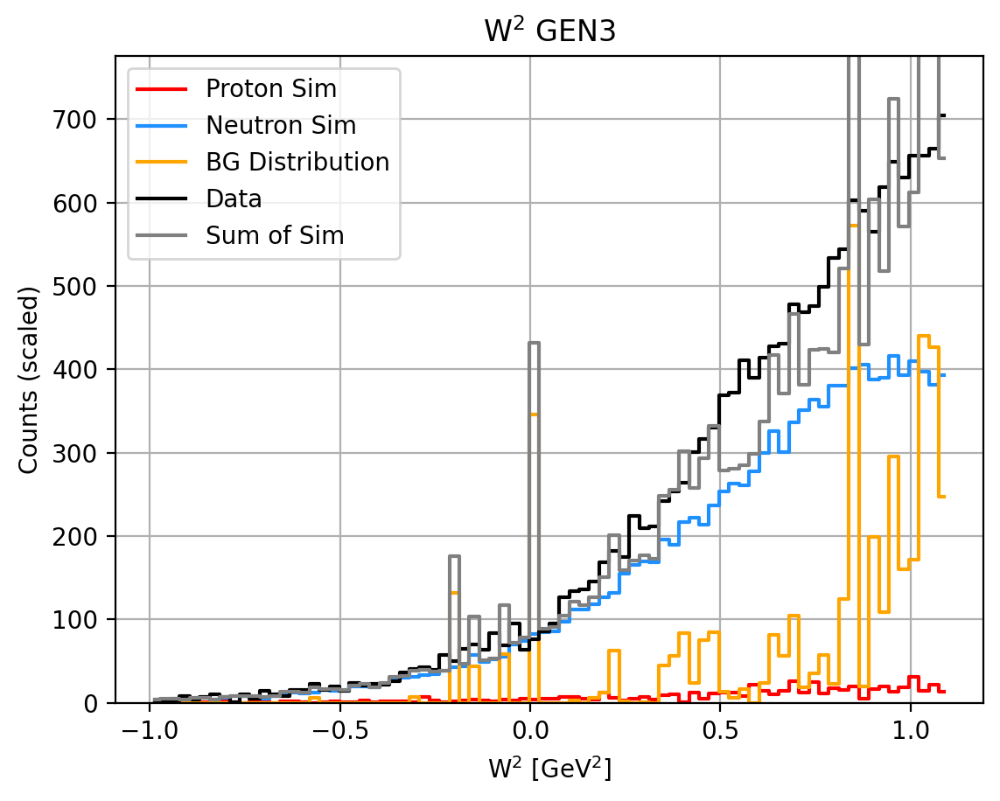

coinstuf: f,fe,A,Ae 0.0197236684020825 0.0011586444874417355 0.012688821752265862 0.01419075194788609
Total events in range (-0.5, 0.5):
  Sim Proton:   544.70
  Sim Neutron:  11827.62
  Background:   4222.91
  Total:        16828.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.04
   Background Fraction: 0.10
   Neutron Fraction: 0.86
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6130%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6066
tau_avg = 1.9727
Q2 = 6.9660
Px: 0.9897 Pz: -0.0456
A = 0.05616 ± 0.00801 ± 0.00154
B = 0.48680 (no propagated error)
C = 0.14642 ± 0.02604 ± 0.00500
__________________________________________________
N_plus: 8728 N_minus: 7894
A_raw: 0.0502+=0.0077
A_raw_weighted: 0.0528+-0.0076  14.4712%
__________________________________________________
A_phys_weighted: 0.183
A_phys_stat_error: 0.0260  14.2581%
A_phys_sys_error: 0.0050  2.738%
GEn/GM

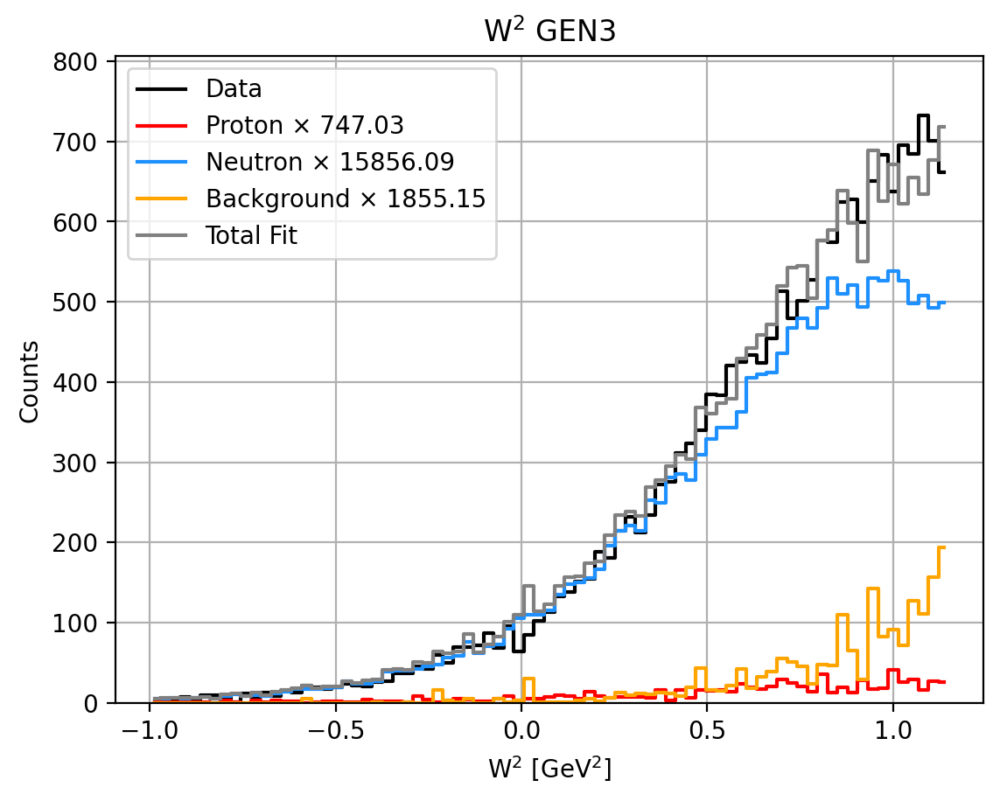

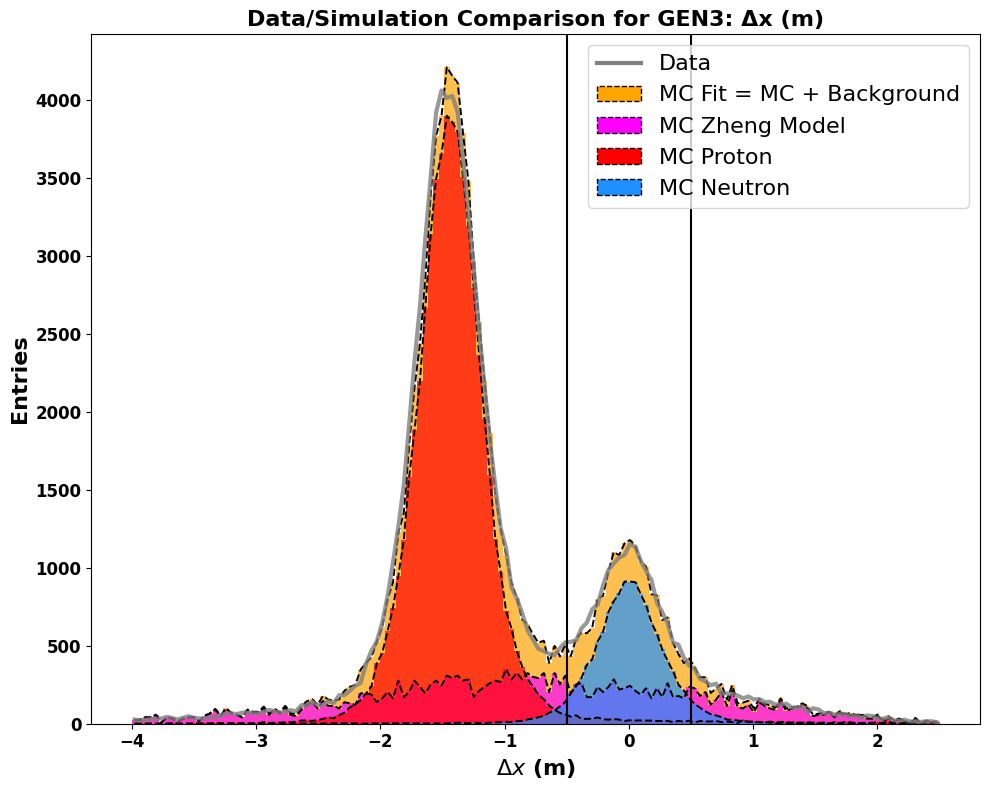

Total entries in fit: 92848.87844095277


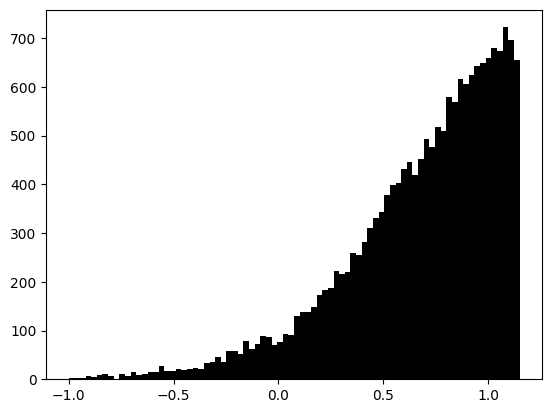

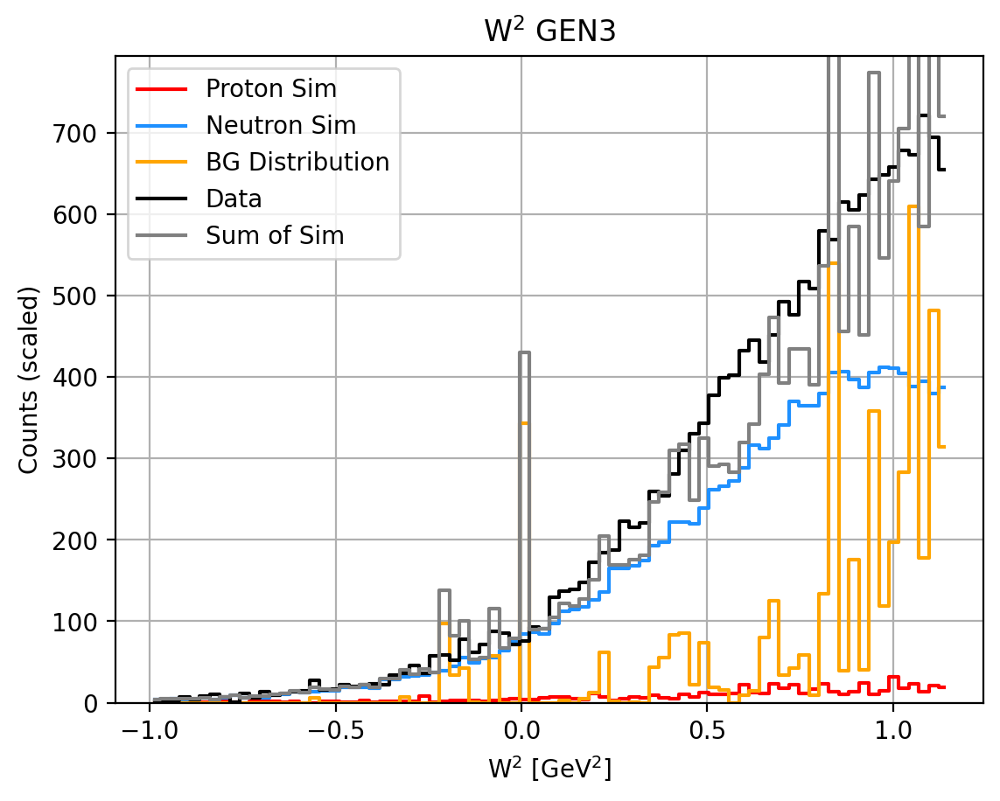

coinstuf: f,fe,A,Ae 0.02013798247249674 0.001129985608460764 0.008572493477450614 0.013650818979331656
Total events in range (-0.5, 0.5):
  Sim Proton:   582.63
  Sim Neutron:  12366.49
  Background:   4889.64
  Total:        18069.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.03
   Background Fraction: 0.27
   Neutron Fraction: 0.68
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6135%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6080
tau_avg = 1.9652
Q2 = 6.9394
Px: 0.9898 Pz: -0.0447
A = 0.07146 ± 0.00957 ± 0.00199
B = 0.48746 (no propagated error)
C = 0.19554 ± 0.03093 ± 0.00642
__________________________________________________
N_plus: 9385 N_minus: 8462
A_raw: 0.0517+=0.0075
A_raw_weighted: 0.0541+-0.0074  13.6447%
__________________________________________________
A_phys_weighted: 0.231
A_phys_stat_error: 0.0309  13.3923%
A_phys_sys_error: 0.0064  2.779%
GEn/G

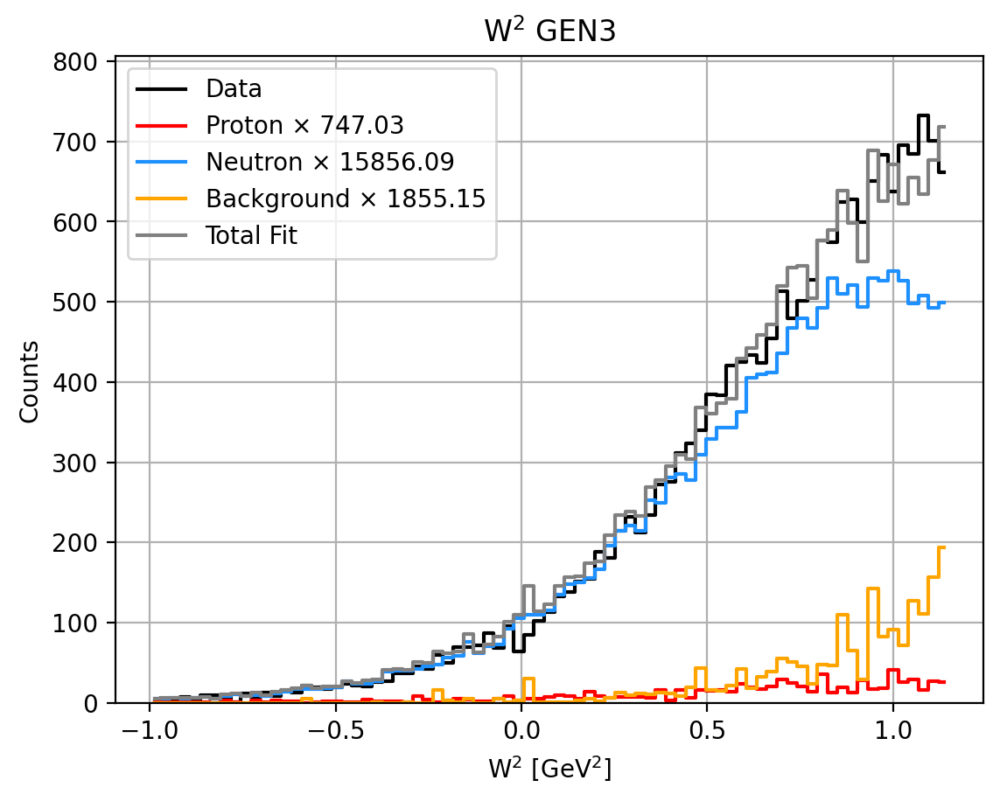

0.8994951730541716 0.0423782999375528 0.8571168731166188 0.10050482694582835


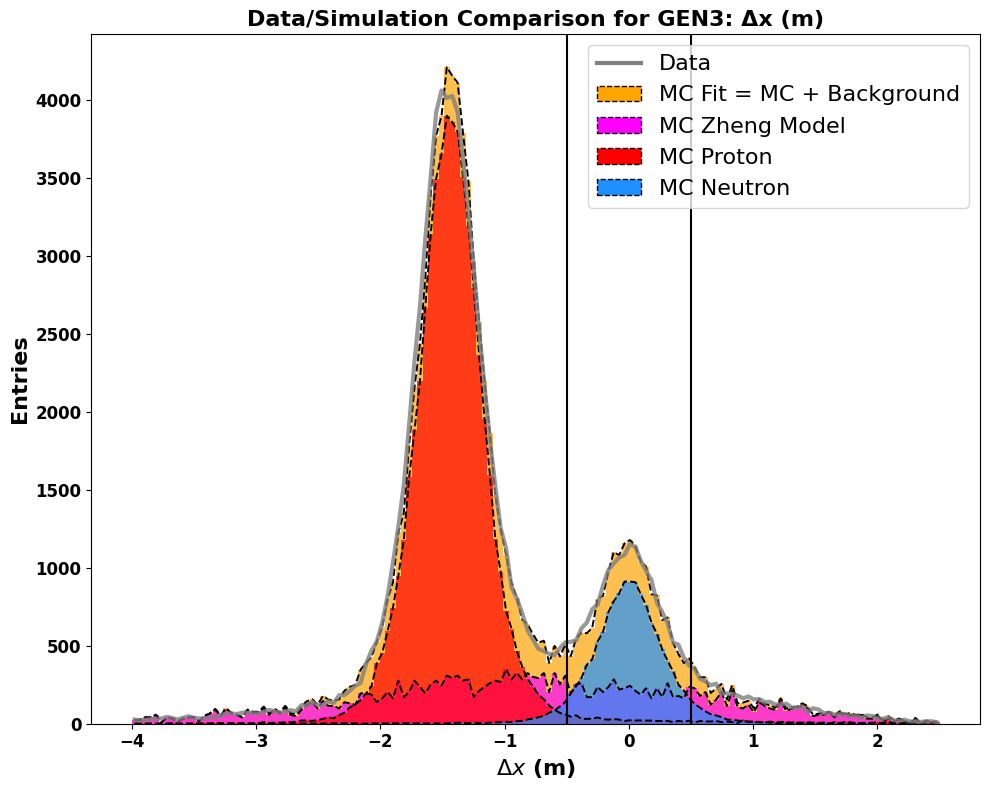

Total entries in fit: 92848.87844095277


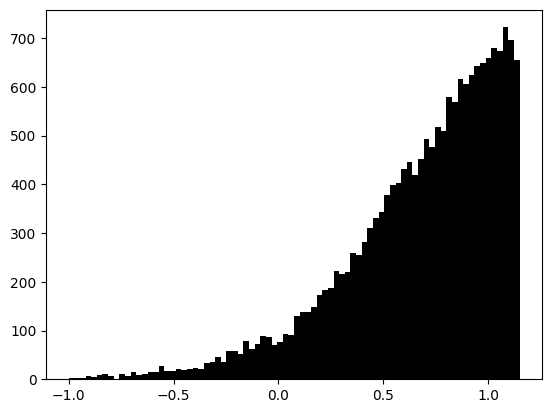

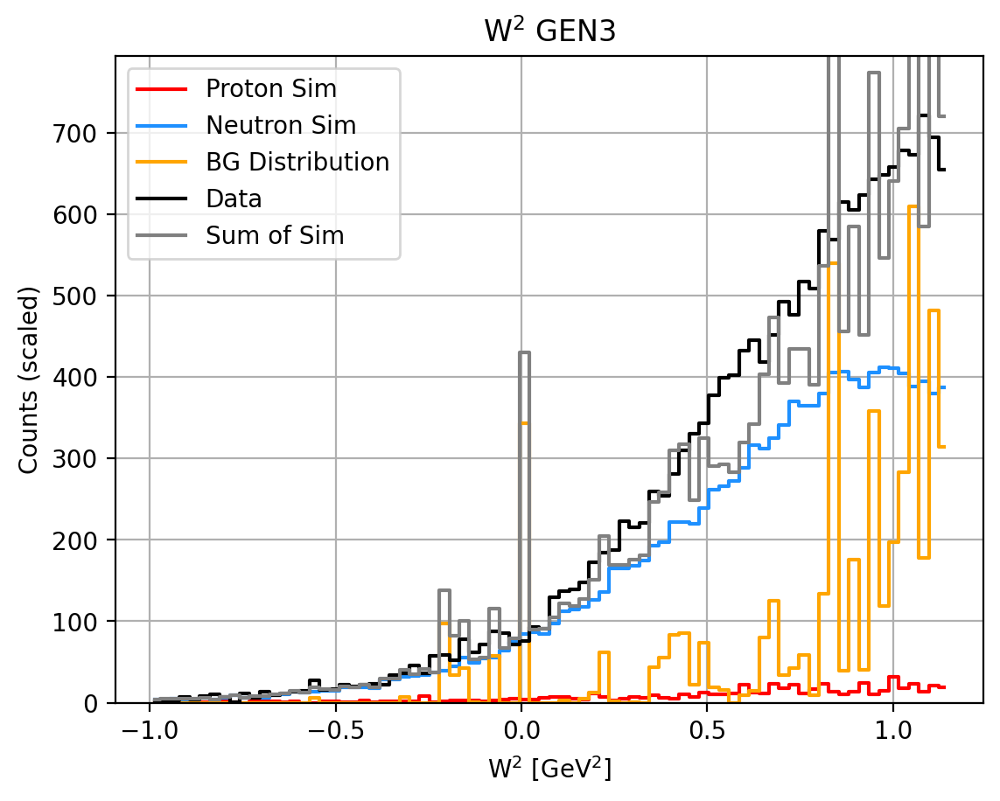

coinstuf: f,fe,A,Ae 0.02013798247249674 0.001129985608460764 0.008572493477450614 0.013650818979331656
Total events in range (-0.5, 0.5):
  Sim Proton:   582.63
  Sim Neutron:  12366.49
  Background:   4889.64
  Total:        18069.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.04
   Background Fraction: 0.10
   Neutron Fraction: 0.86
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6135%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6080
tau_avg = 1.9652
Q2 = 6.9394
Px: 0.9898 Pz: -0.0447
A = 0.05812 ± 0.00778 ± 0.00159
B = 0.48746 (no propagated error)
C = 0.15243 ± 0.02516 ± 0.00514
__________________________________________________
N_plus: 9385 N_minus: 8462
A_raw: 0.0517+=0.0075
A_raw_weighted: 0.0541+-0.0074  13.6447%
__________________________________________________
A_phys_weighted: 0.188
A_phys_stat_error: 0.0252  13.3924%
A_phys_sys_error: 0.0051  2.735%
GEn/G

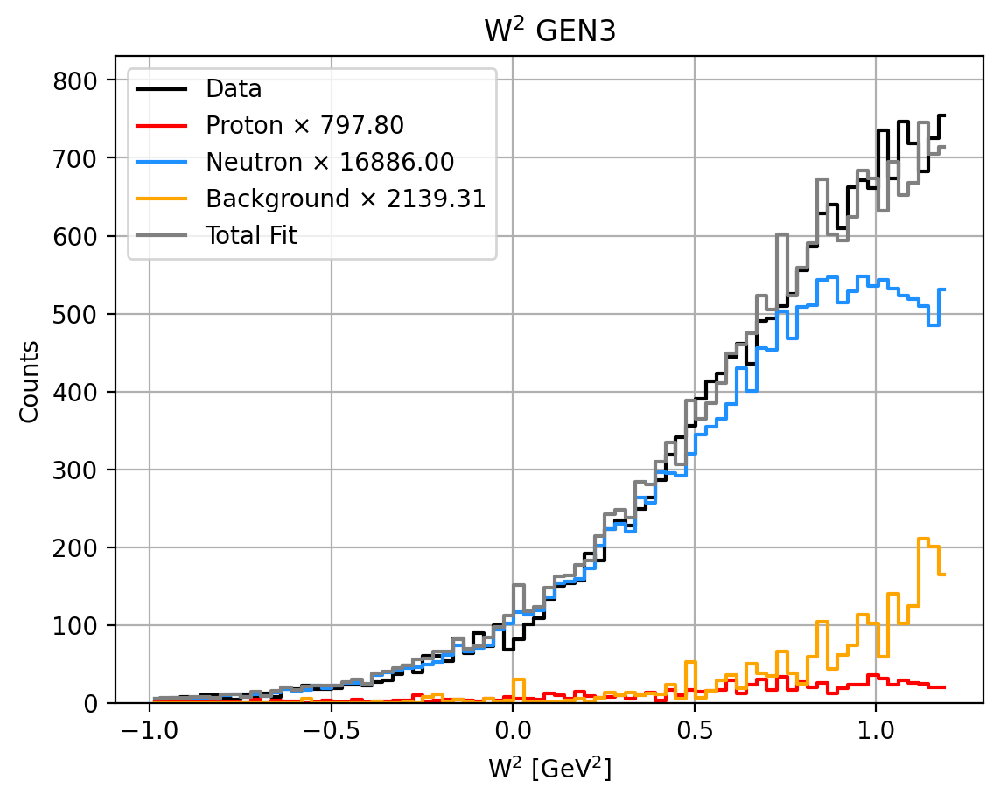

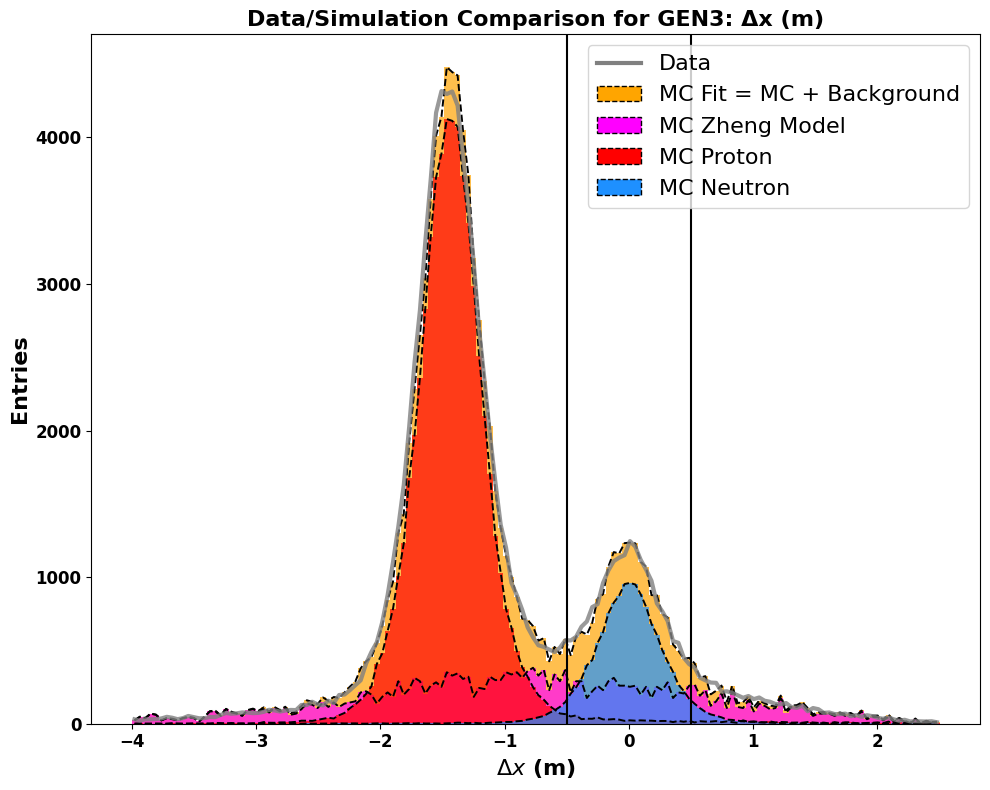

Total entries in fit: 99679.61343915669


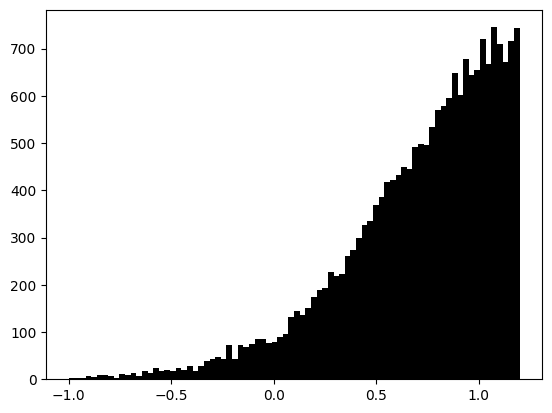

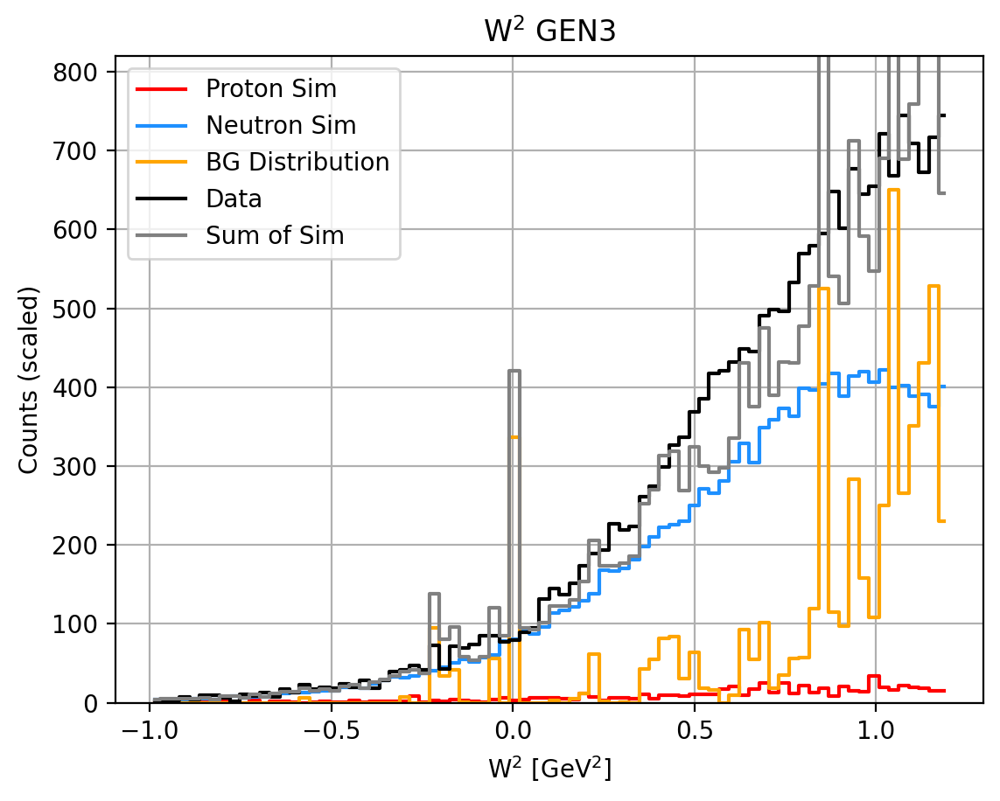

coinstuf: f,fe,A,Ae 0.020618556701030927 0.0011039896263937538 0.004824259131633356 0.013125965072483273
Total events in range (-0.5, 0.5):
  Sim Proton:   613.84
  Sim Neutron:  12992.29
  Background:   5556.65
  Total:        19390.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.03
   Background Fraction: 0.29
   Neutron Fraction: 0.67
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6143%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6093
tau_avg = 1.9574
Q2 = 6.9119
Px: 0.9898 Pz: -0.0437
A = 0.07052 ± 0.00952 ± 0.00197
B = 0.48814 (no propagated error)
C = 0.19188 ± 0.03057 ± 0.00632
__________________________________________________
N_plus: 10060 N_minus: 9098
A_raw: 0.0502+=0.0072
A_raw_weighted: 0.0521+-0.0071  13.7045%
__________________________________________________
A_phys_weighted: 0.227
A_phys_stat_error: 0.0306  13.4939%
A_phys_sys_error: 0.0063  2.788%
GE

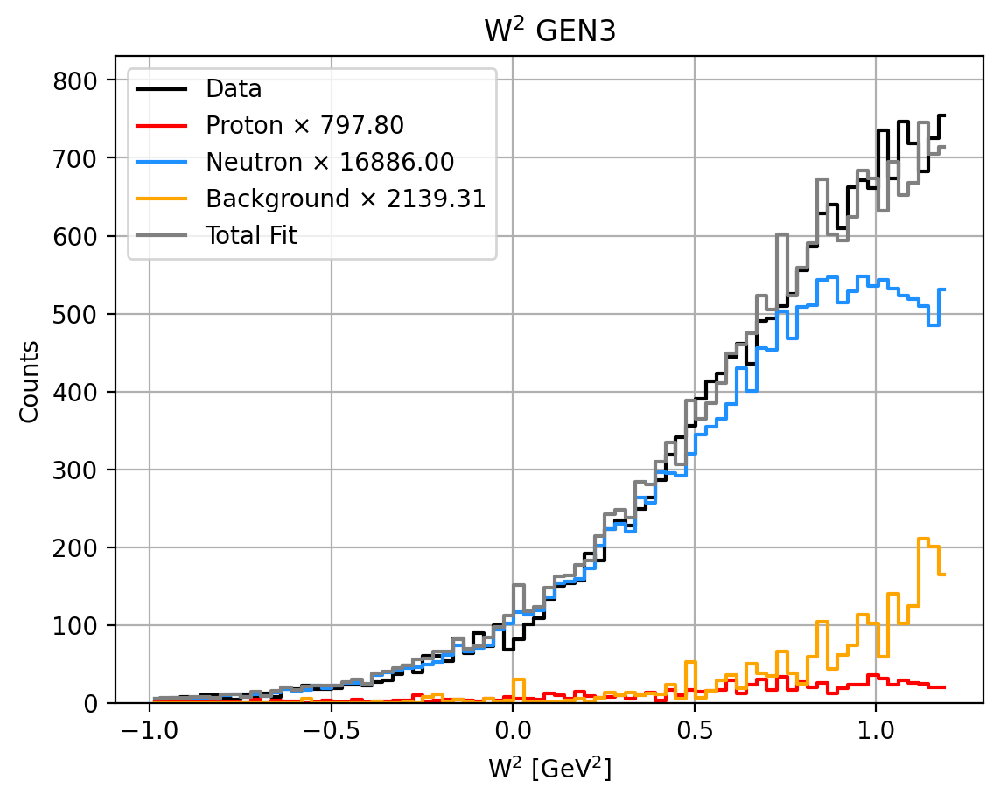

0.8920799852665916 0.042147576429591875 0.8499324088369997 0.10792001473340848


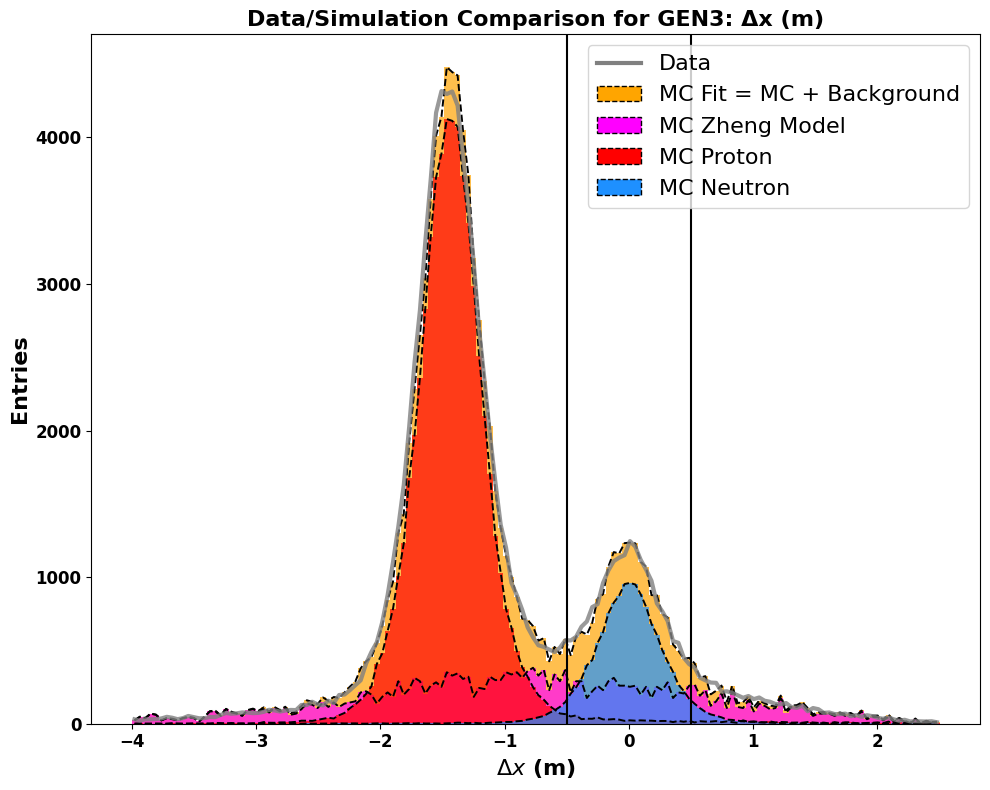

Total entries in fit: 99679.61343915669


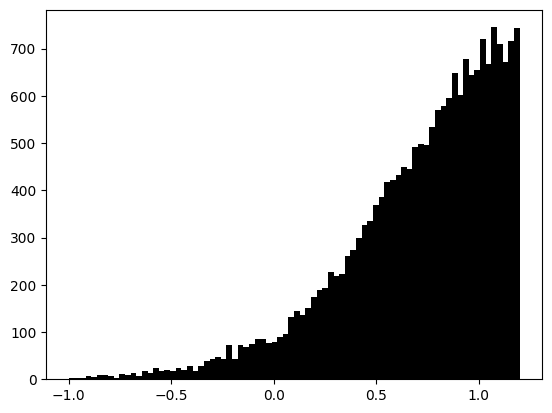

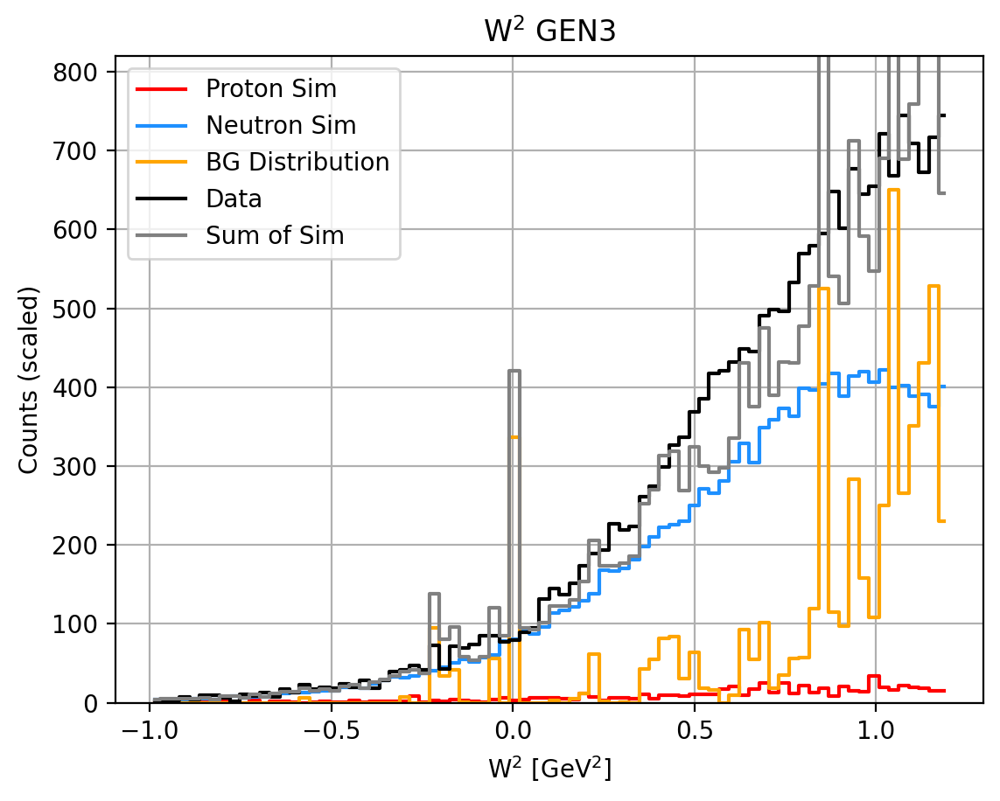

coinstuf: f,fe,A,Ae 0.020618556701030927 0.0011039896263937538 0.004824259131633356 0.013125965072483273
Total events in range (-0.5, 0.5):
  Sim Proton:   613.84
  Sim Neutron:  12992.29
  Background:   5556.65
  Total:        19390.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.04
   Background Fraction: 0.11
   Neutron Fraction: 0.85
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6143%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6093
tau_avg = 1.9574
Q2 = 6.9119
Px: 0.9898 Pz: -0.0437
A = 0.05656 ± 0.00763 ± 0.00155
B = 0.48814 (no propagated error)
C = 0.14706 ± 0.02452 ± 0.00498
__________________________________________________
N_plus: 10060 N_minus: 9098
A_raw: 0.0502+=0.0072
A_raw_weighted: 0.0521+-0.0071  13.7045%
__________________________________________________
A_phys_weighted: 0.182
A_phys_stat_error: 0.0245  13.4939%
A_phys_sys_error: 0.0050  2.739%
GE

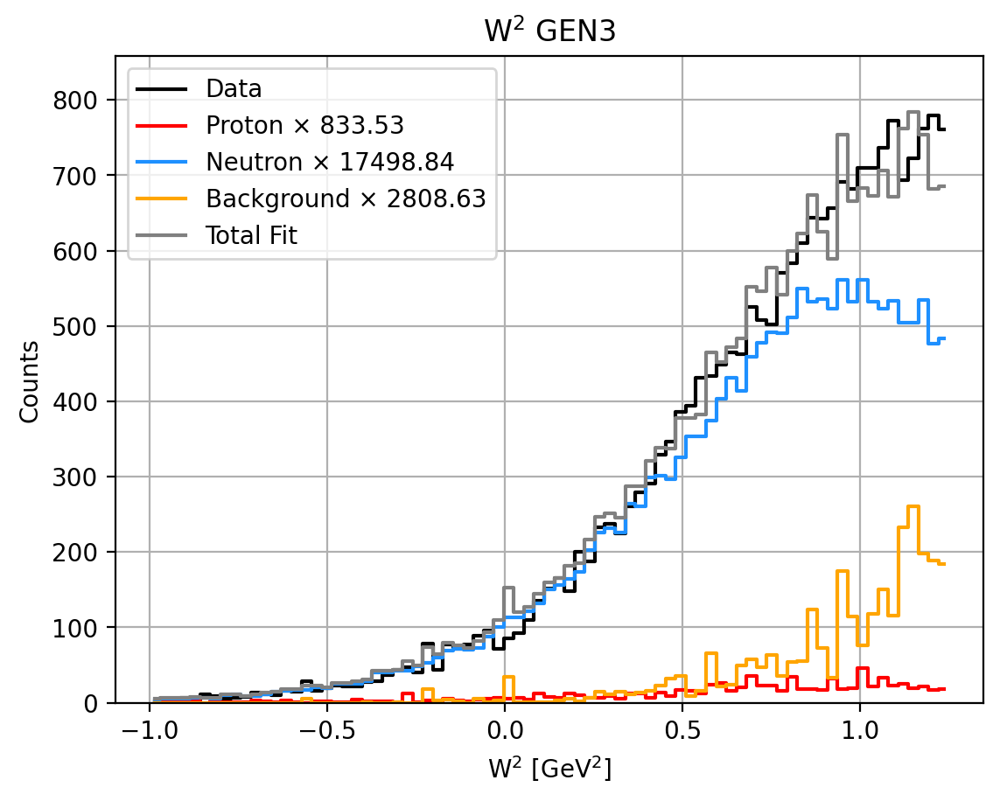

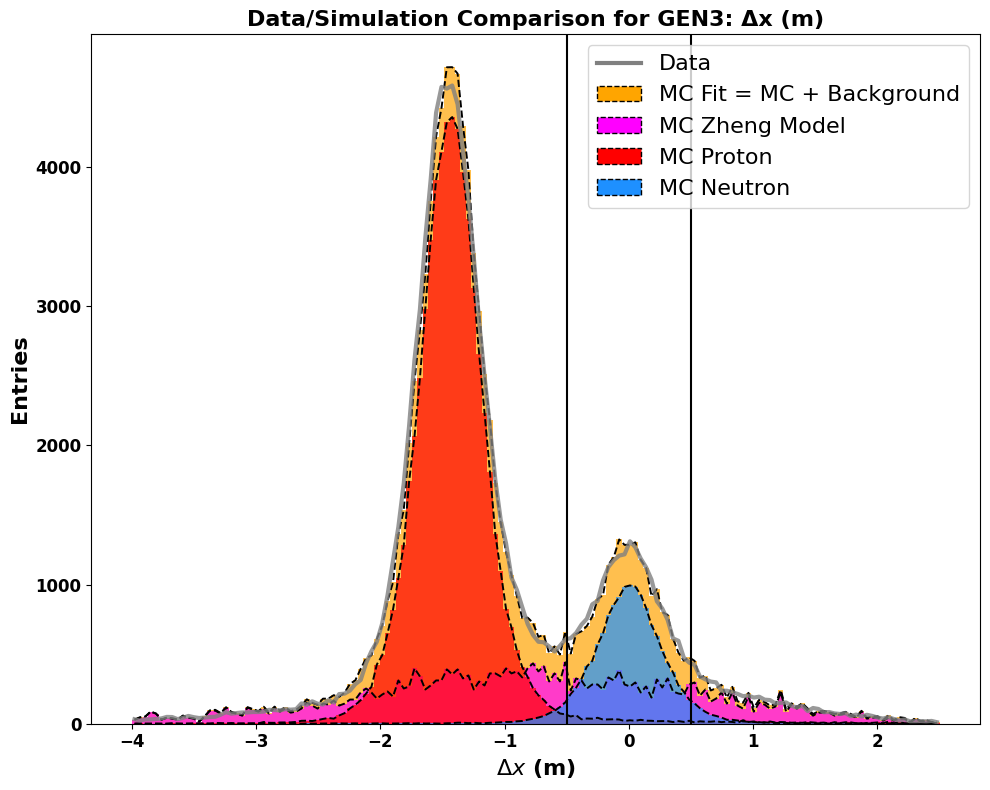

Total entries in fit: 106599.01522728654


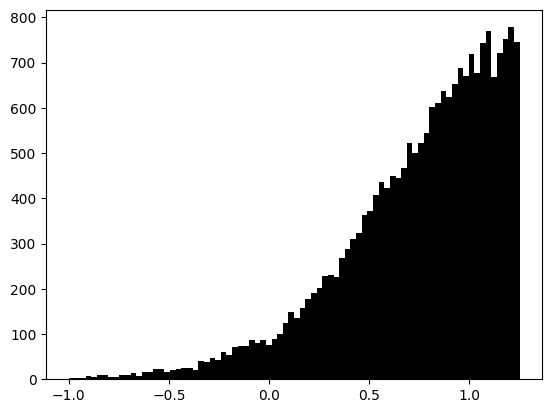

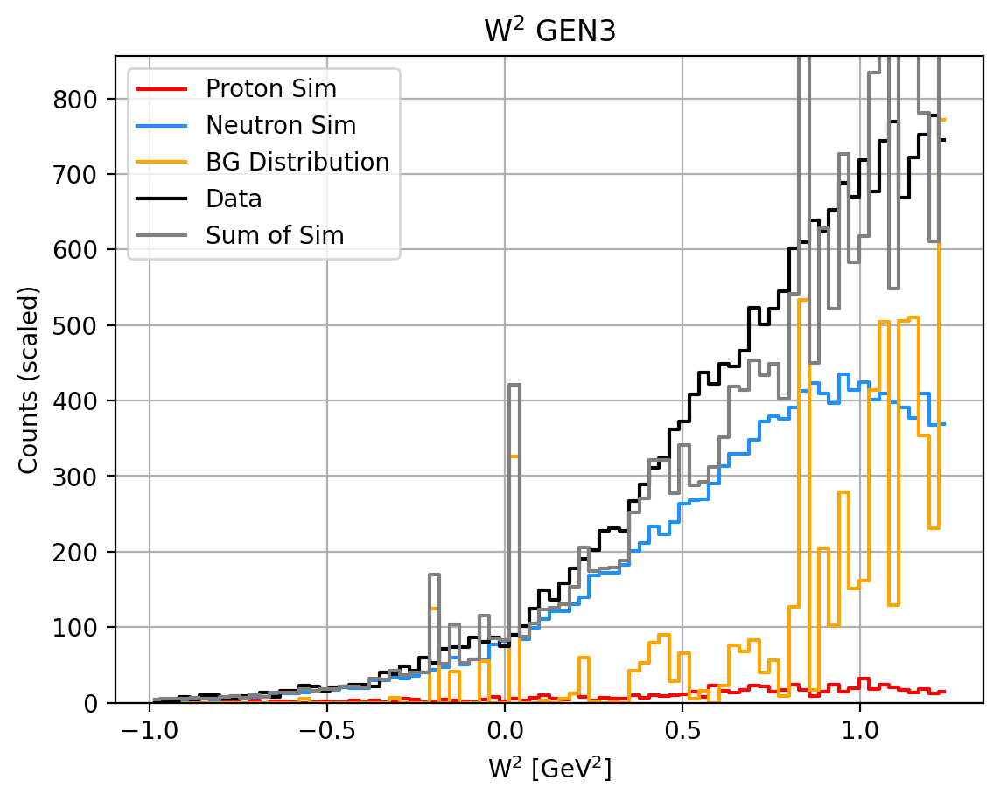

coinstuf: f,fe,A,Ae 0.020771272274278288 0.0010716294348190644 0.0030327214684756584 0.012633900875536433
Total events in range (-0.5, 0.5):
  Sim Proton:   642.50
  Sim Neutron:  13488.54
  Background:   6334.93
  Total:        20733.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.03
   Background Fraction: 0.31
   Neutron Fraction: 0.65
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6134%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6106
tau_avg = 1.9501
Q2 = 6.8860
Px: 0.9898 Pz: -0.0427
A = 0.06574 ± 0.00952 ± 0.00184
B = 0.48878 (no propagated error)
C = 0.17616 ± 0.03042 ± 0.00589
__________________________________________________
N_plus: 10711 N_minus: 9777
A_raw: 0.0456+=0.0070
A_raw_weighted: 0.0469+-0.0069  14.7304%
__________________________________________________
A_phys_weighted: 0.21
A_phys_stat_error: 0.0304  14.4877%
A_phys_sys_error: 0.0059  2.804%
GE

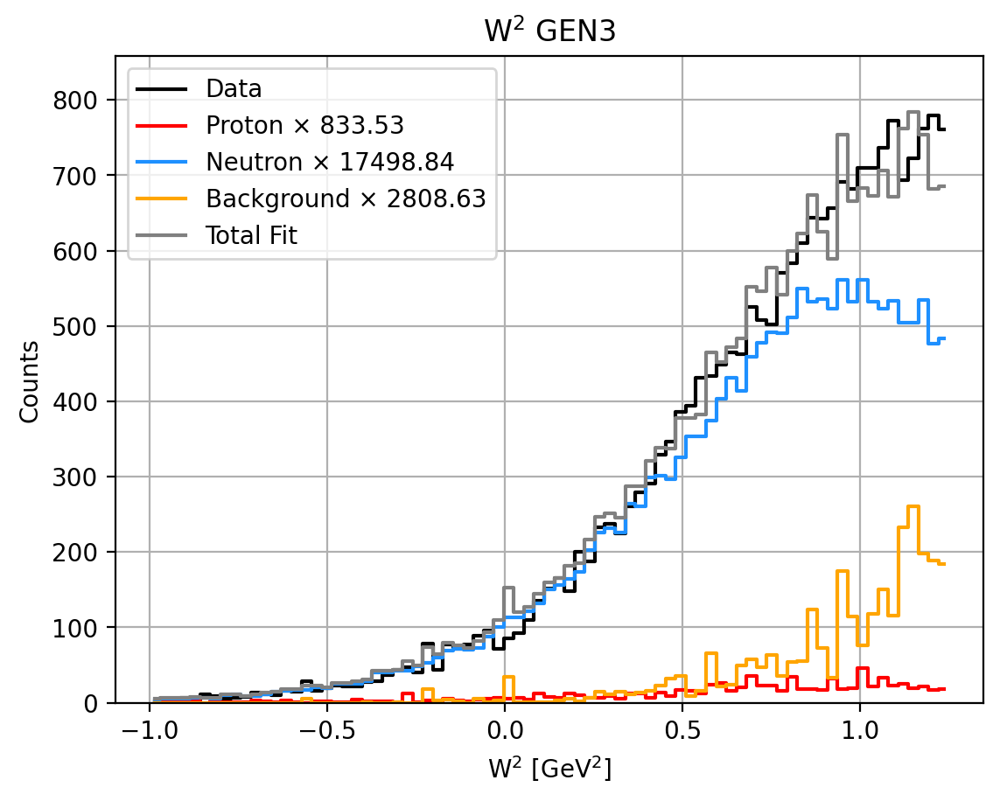

0.8671477827923736 0.04130507834417848 0.8258427044481951 0.13285221720762652


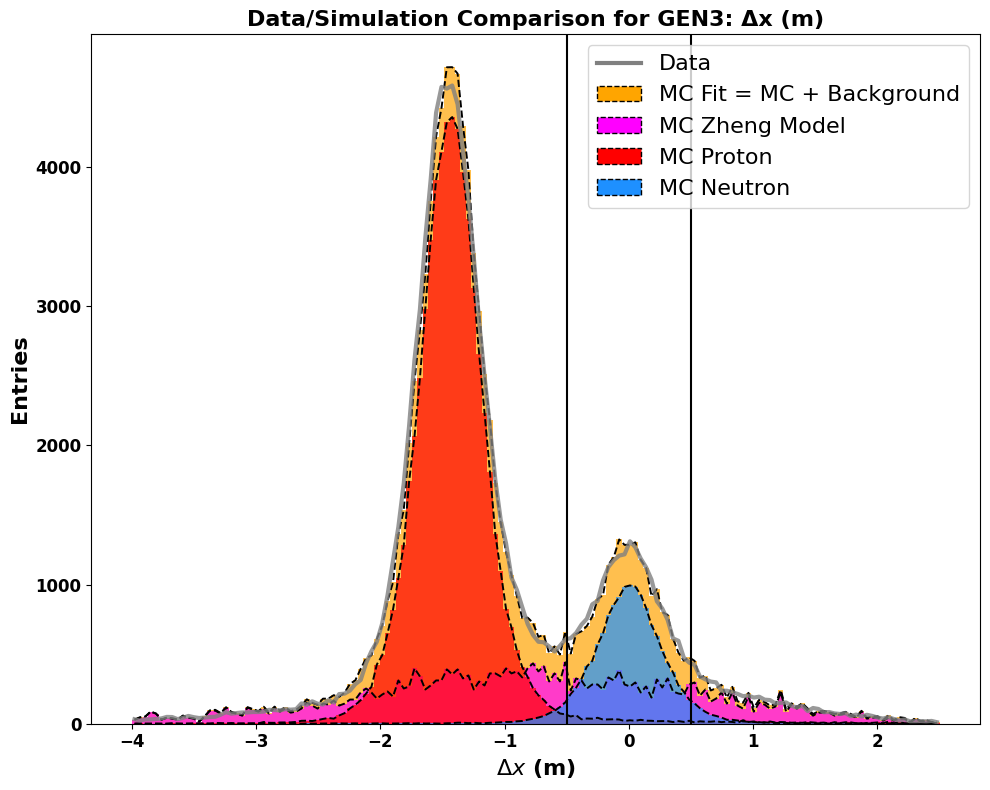

Total entries in fit: 106599.01522728654


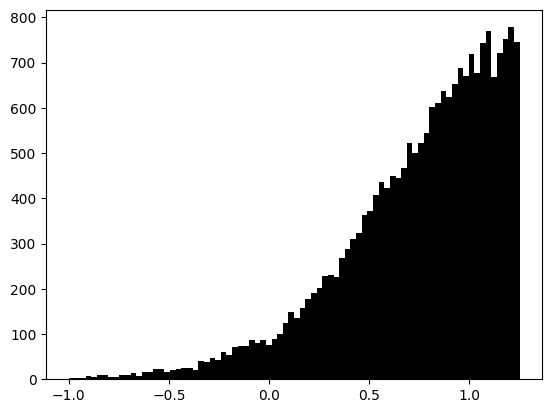

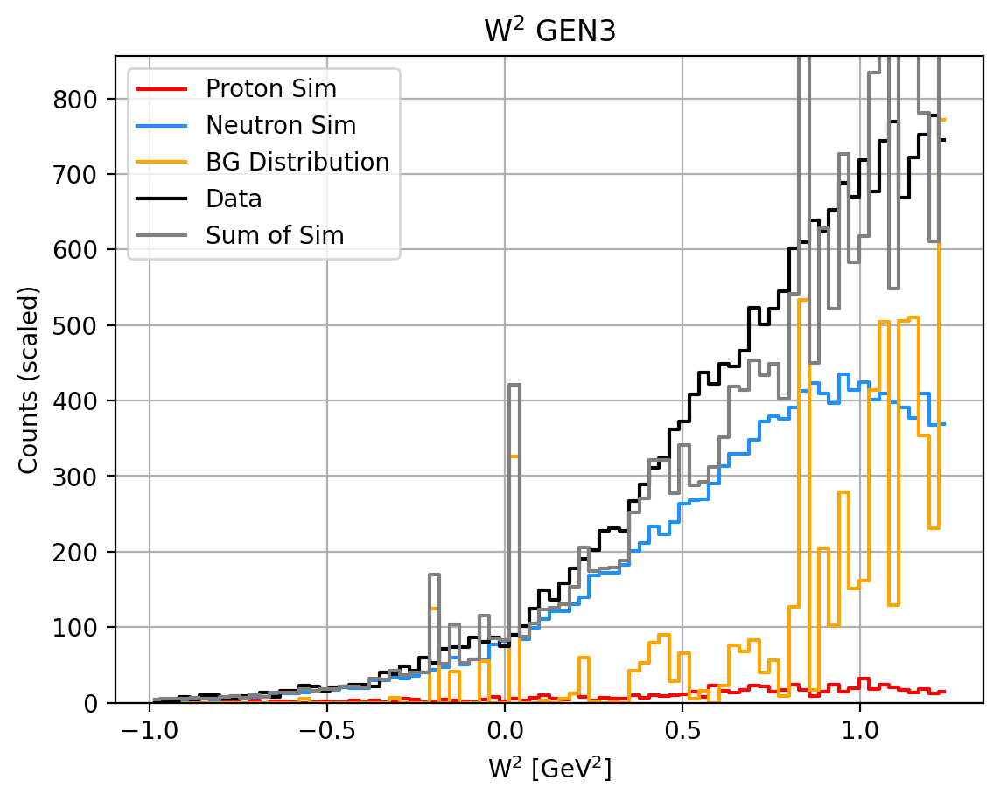

coinstuf: f,fe,A,Ae 0.020771272274278288 0.0010716294348190644 0.0030327214684756584 0.012633900875536433
Total events in range (-0.5, 0.5):
  Sim Proton:   642.50
  Sim Neutron:  13488.54
  Background:   6334.93
  Total:        20733.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.04
   Background Fraction: 0.13
   Neutron Fraction: 0.83
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6134%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6106
tau_avg = 1.9501
Q2 = 6.8860
Px: 0.9898 Pz: -0.0427
A = 0.05281 ± 0.00765 ± 0.00145
B = 0.48878 (no propagated error)
C = 0.13487 ± 0.02444 ± 0.00464
__________________________________________________
N_plus: 10711 N_minus: 9777
A_raw: 0.0456+=0.0070
A_raw_weighted: 0.0469+-0.0069  14.7304%
__________________________________________________
A_phys_weighted: 0.169
A_phys_stat_error: 0.0244  14.4878%
A_phys_sys_error: 0.0046  2.751%
G

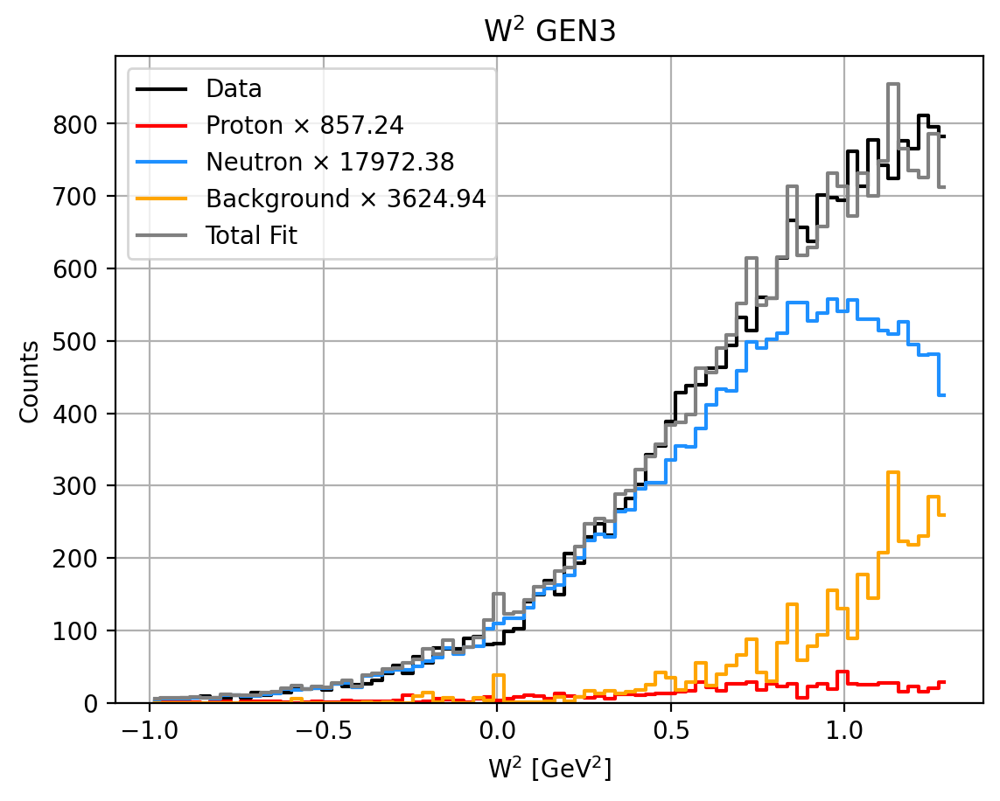

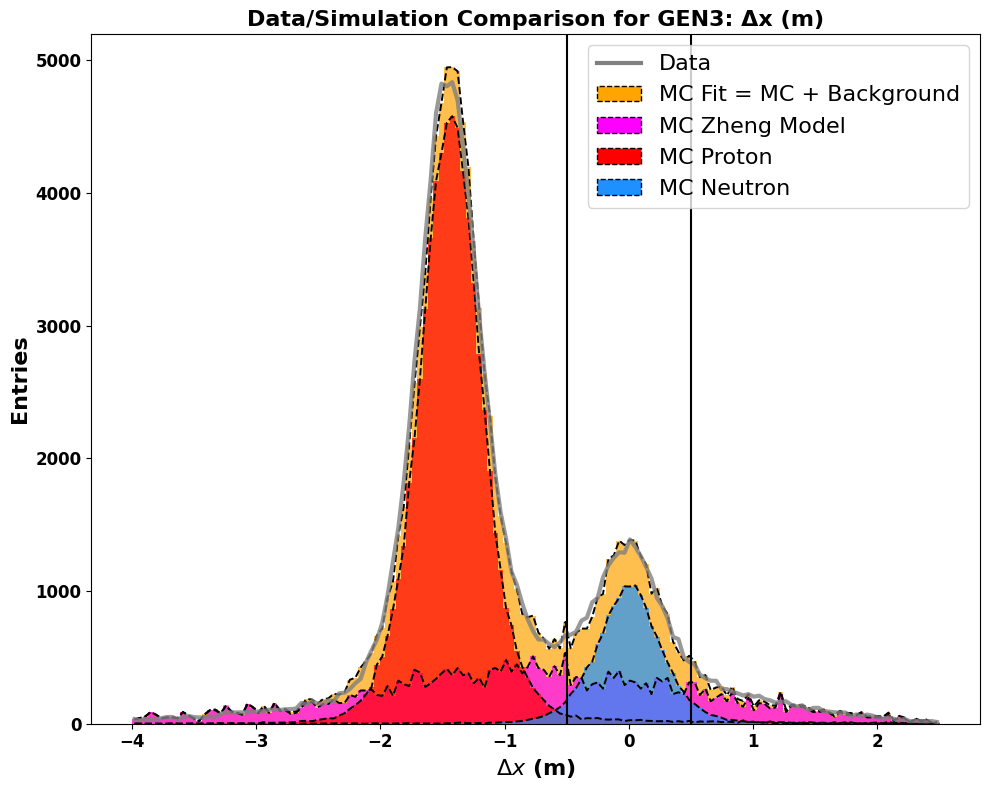

Total entries in fit: 113461.25571971669


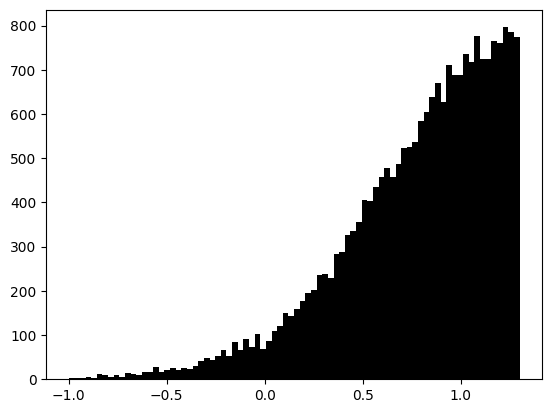

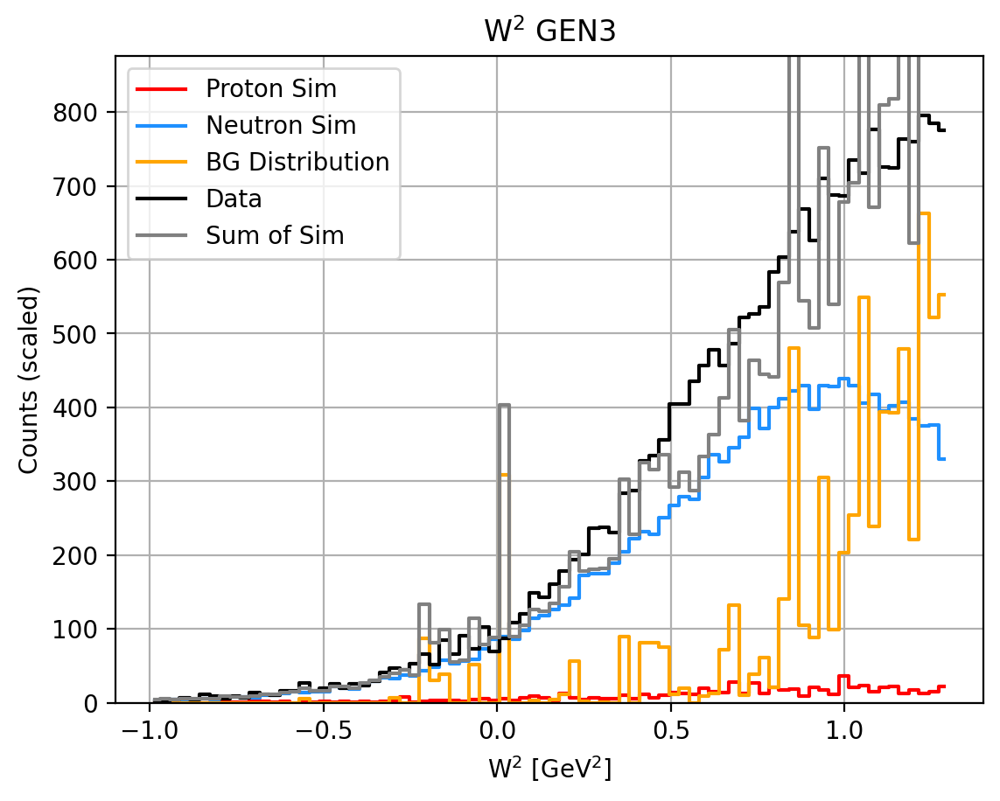

coinstuf: f,fe,A,Ae 0.020927630575191983 0.001042395719836348 0.006214856466410181 0.01216417106276217
Total events in range (-0.5, 0.5):
  Sim Proton:   672.81
  Sim Neutron:  14105.89
  Background:   6975.19
  Total:        22084.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.03
   Background Fraction: 0.32
   Neutron Fraction: 0.64
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6128%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6116
tau_avg = 1.9433
Q2 = 6.8622
Px: 0.9898 Pz: -0.0416
A = 0.07300 ± 0.00941 ± 0.00204
B = 0.48940 (no propagated error)
C = 0.19903 ± 0.02991 ± 0.00648
__________________________________________________
N_plus: 11458 N_minus: 10372
A_raw: 0.0497+=0.0068
A_raw_weighted: 0.0513+-0.0067  13.0544%
__________________________________________________
A_phys_weighted: 0.232
A_phys_stat_error: 0.0299  12.8944%
A_phys_sys_error: 0.0065  2.792%
GEn

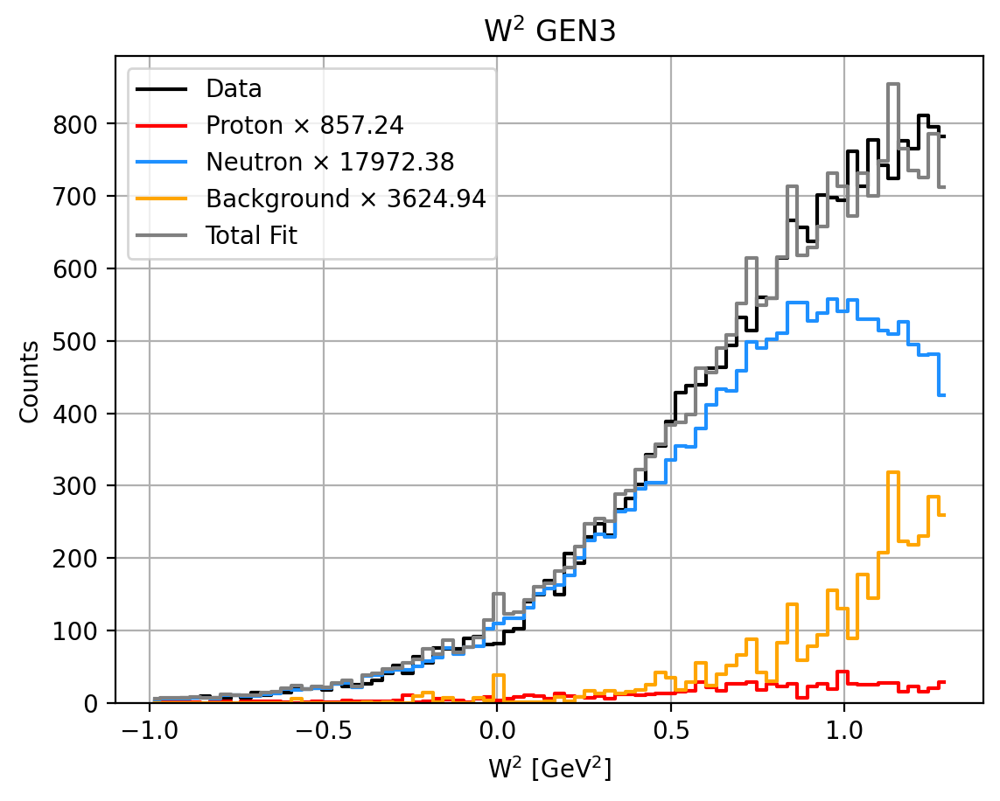

0.8385655930284419 0.03999740985308083 0.798568183175361 0.16143440697155803


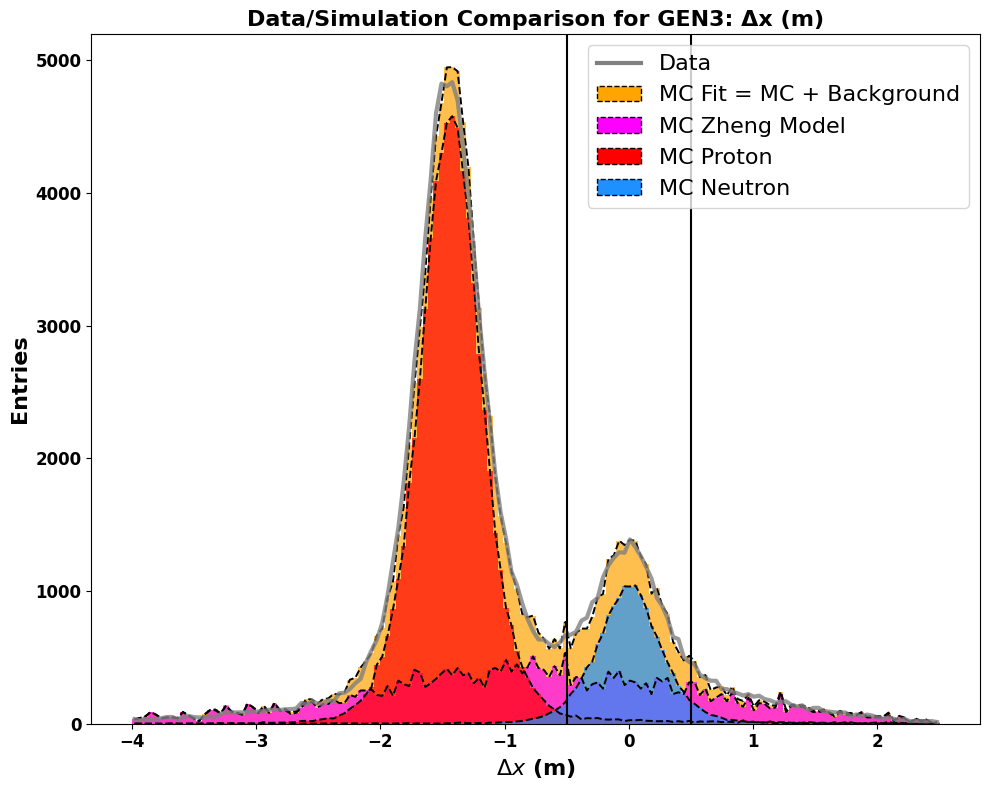

Total entries in fit: 113461.25571971669


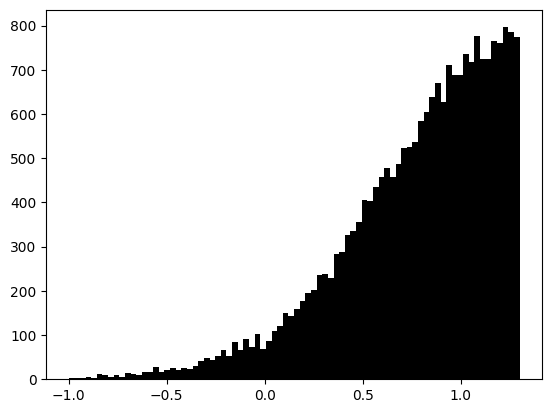

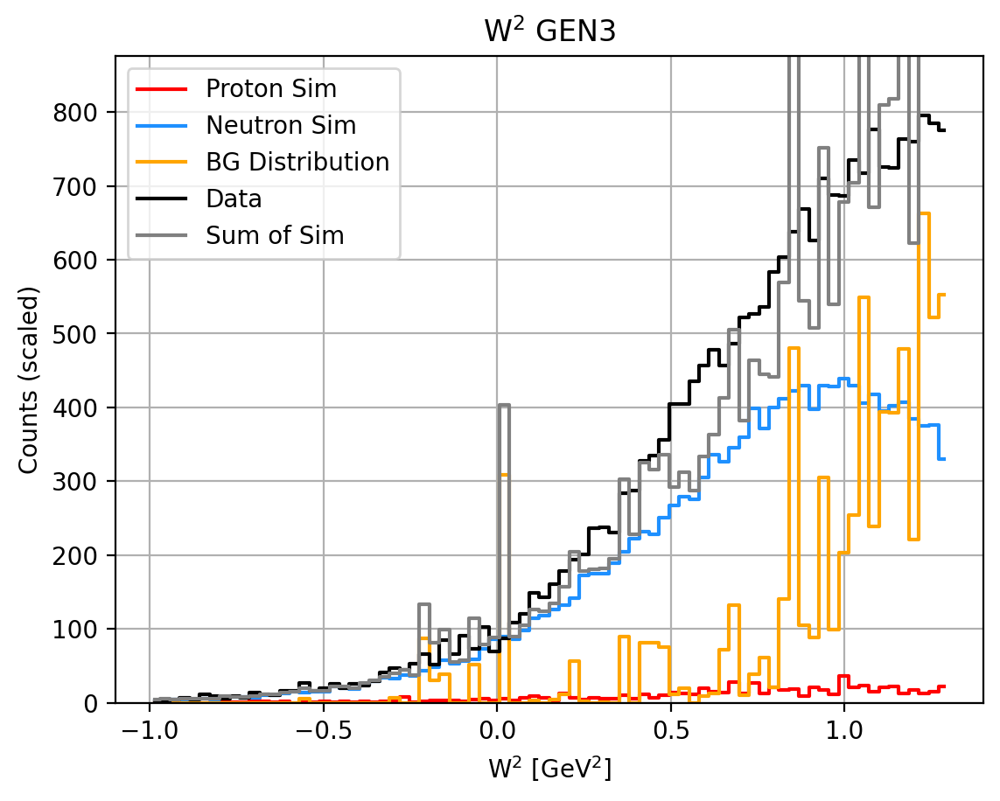

coinstuf: f,fe,A,Ae 0.020927630575191983 0.001042395719836348 0.006214856466410181 0.01216417106276217
Total events in range (-0.5, 0.5):
  Sim Proton:   672.81
  Sim Neutron:  14105.89
  Background:   6975.19
  Total:        22084.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.04
   Background Fraction: 0.16
   Neutron Fraction: 0.80
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6128%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6116
tau_avg = 1.9433
Q2 = 6.8622
Px: 0.9898 Pz: -0.0416
A = 0.05976 ± 0.00771 ± 0.00164
B = 0.48940 (no propagated error)
C = 0.15694 ± 0.02448 ± 0.00521
__________________________________________________
N_plus: 11458 N_minus: 10372
A_raw: 0.0497+=0.0068
A_raw_weighted: 0.0513+-0.0067  13.0544%
__________________________________________________
A_phys_weighted: 0.19
A_phys_stat_error: 0.0245  12.8944%
A_phys_sys_error: 0.0052  2.743%
GEn/

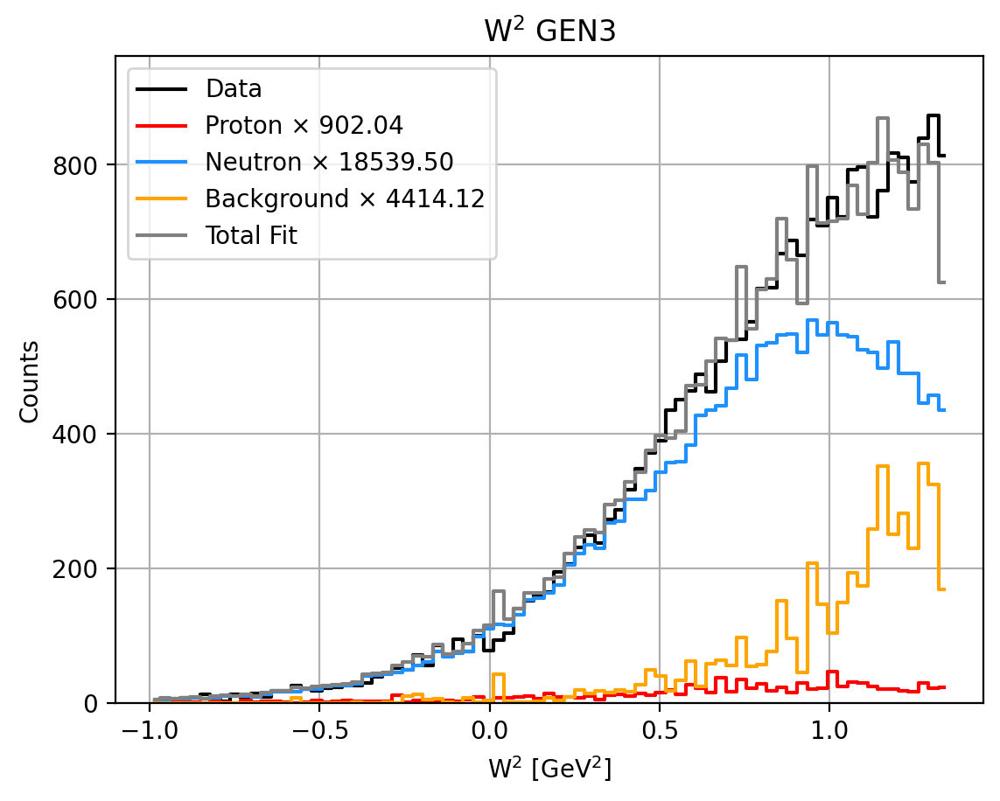

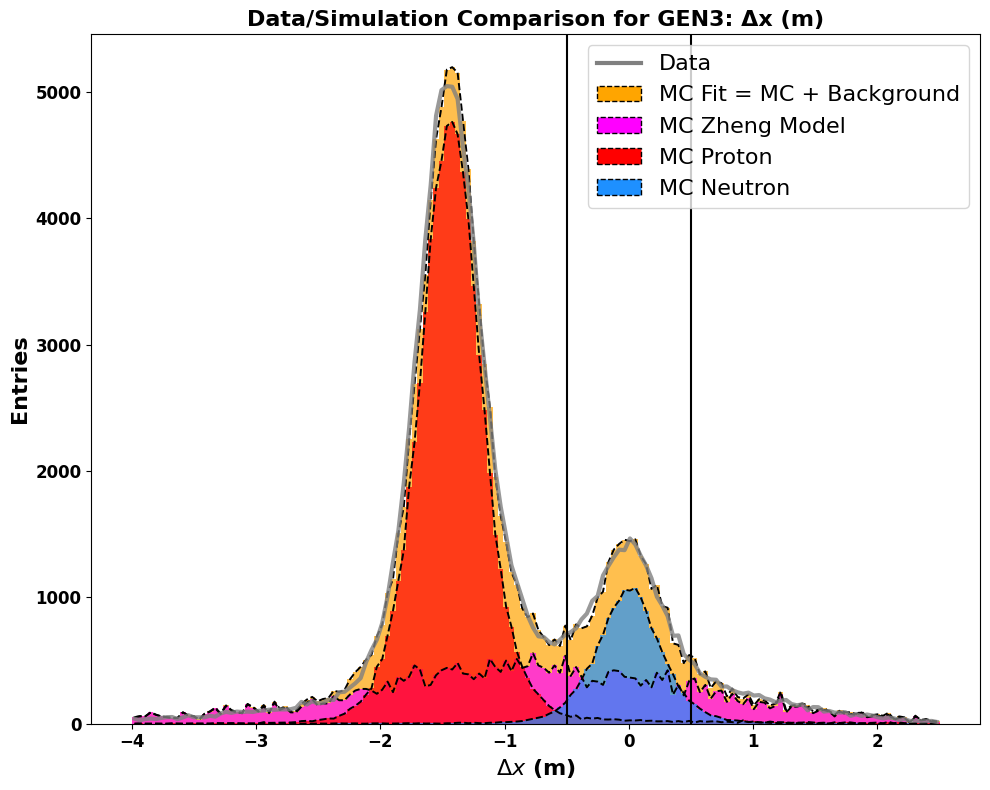

Total entries in fit: 120517.92976870162


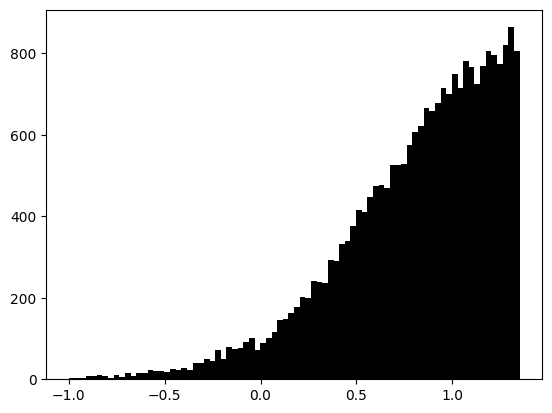

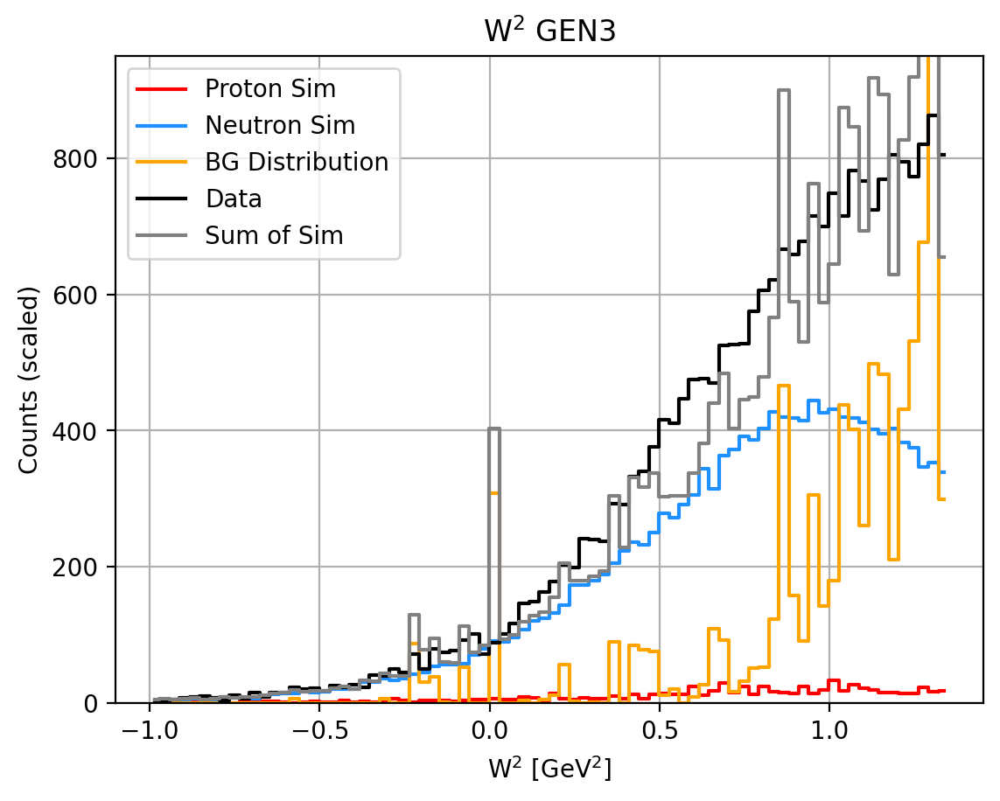

coinstuf: f,fe,A,Ae 0.02116275736874791 0.001016056534733681 0.007121336620104081 0.011702215004549398
Total events in range (-0.5, 0.5):
  Sim Proton:   704.64
  Sim Neutron:  14482.38
  Background:   8022.75
  Total:        23523.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.03
   Background Fraction: 0.34
   Neutron Fraction: 0.62
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6132%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6127
tau_avg = 1.9363
Q2 = 6.8372
Px: 0.9898 Pz: -0.0406
A = 0.07846 ± 0.00953 ± 0.00220
B = 0.49005 (no propagated error)
C = 0.21591 ± 0.03012 ± 0.00695
__________________________________________________
N_plus: 12218 N_minus: 11038
A_raw: 0.0507+=0.0065
A_raw_weighted: 0.0526+-0.0065  12.3425%
__________________________________________________
A_phys_weighted: 0.248
A_phys_stat_error: 0.0301  12.1488%
A_phys_sys_error: 0.0069  2.801%
GEn

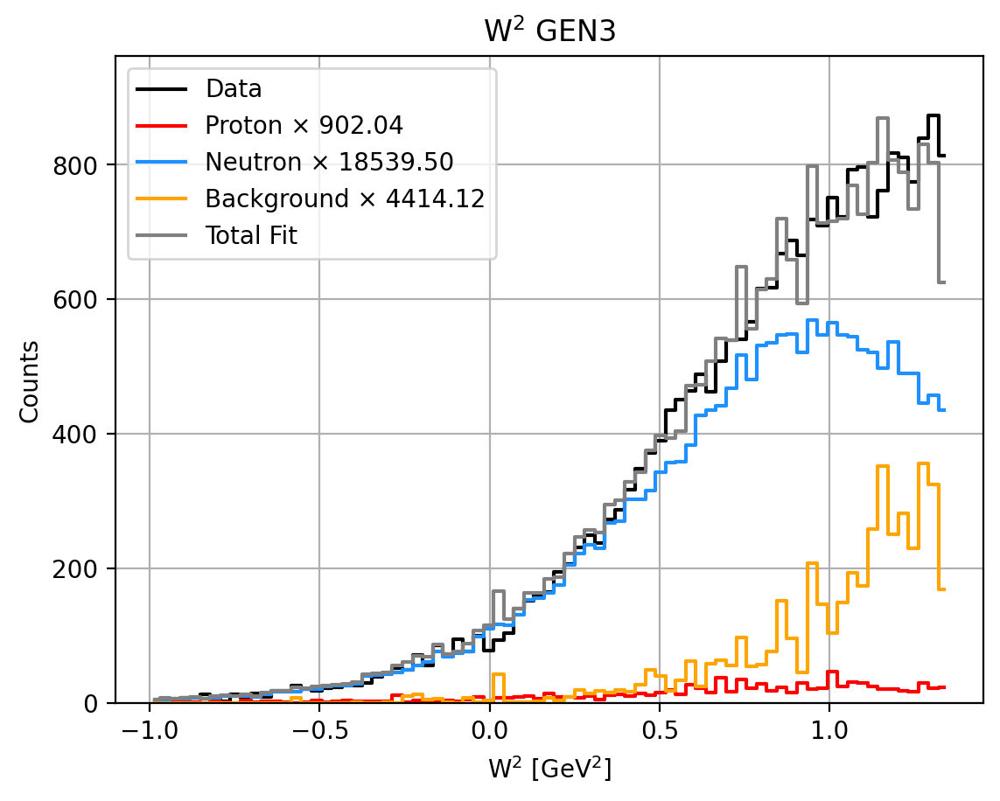

0.8149655562201752 0.03965212877967437 0.7753134274405008 0.18503444377982484


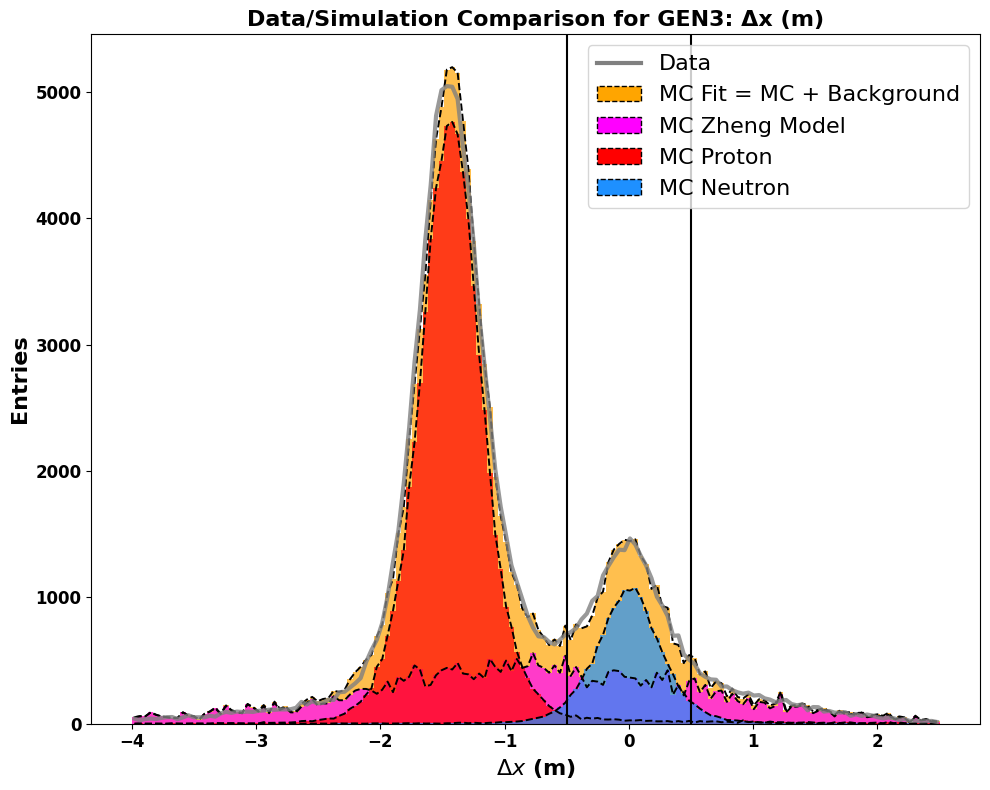

Total entries in fit: 120517.92976870162


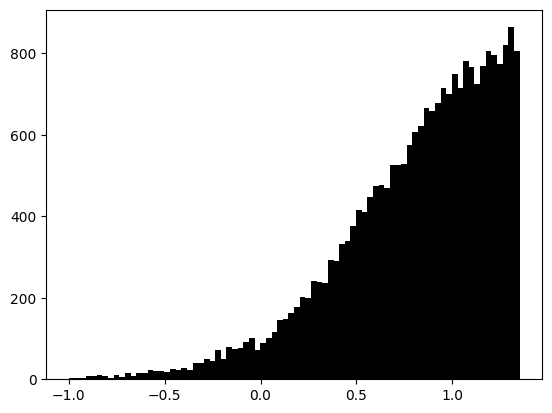

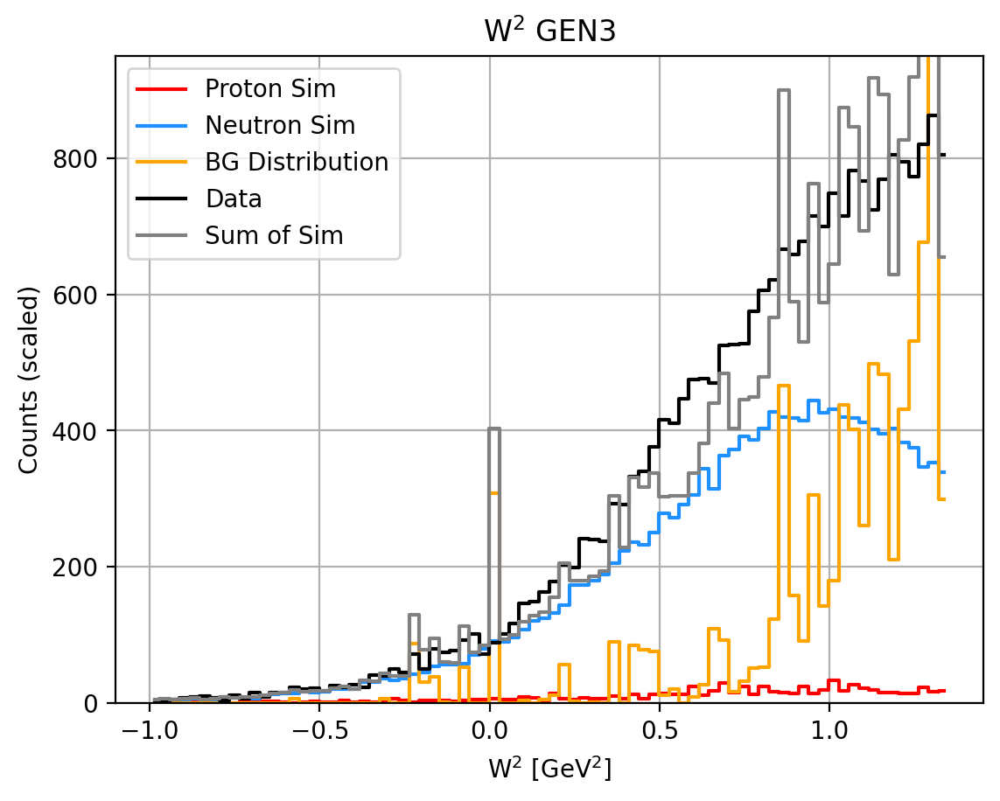

coinstuf: f,fe,A,Ae 0.02116275736874791 0.001016056534733681 0.007121336620104081 0.011702215004549398
Total events in range (-0.5, 0.5):
  Sim Proton:   704.64
  Sim Neutron:  14482.38
  Background:   8022.75
  Total:        23523.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.04
   Background Fraction: 0.19
   Neutron Fraction: 0.78
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6132%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6127
tau_avg = 1.9363
Q2 = 6.8372
Px: 0.9898 Pz: -0.0406
A = 0.06366 ± 0.00773 ± 0.00175
B = 0.49005 (no propagated error)
C = 0.16911 ± 0.02444 ± 0.00552
__________________________________________________
N_plus: 12218 N_minus: 11038
A_raw: 0.0507+=0.0065
A_raw_weighted: 0.0526+-0.0065  12.3425%
__________________________________________________
A_phys_weighted: 0.201
A_phys_stat_error: 0.0244  12.1489%
A_phys_sys_error: 0.0055  2.746%
GEn

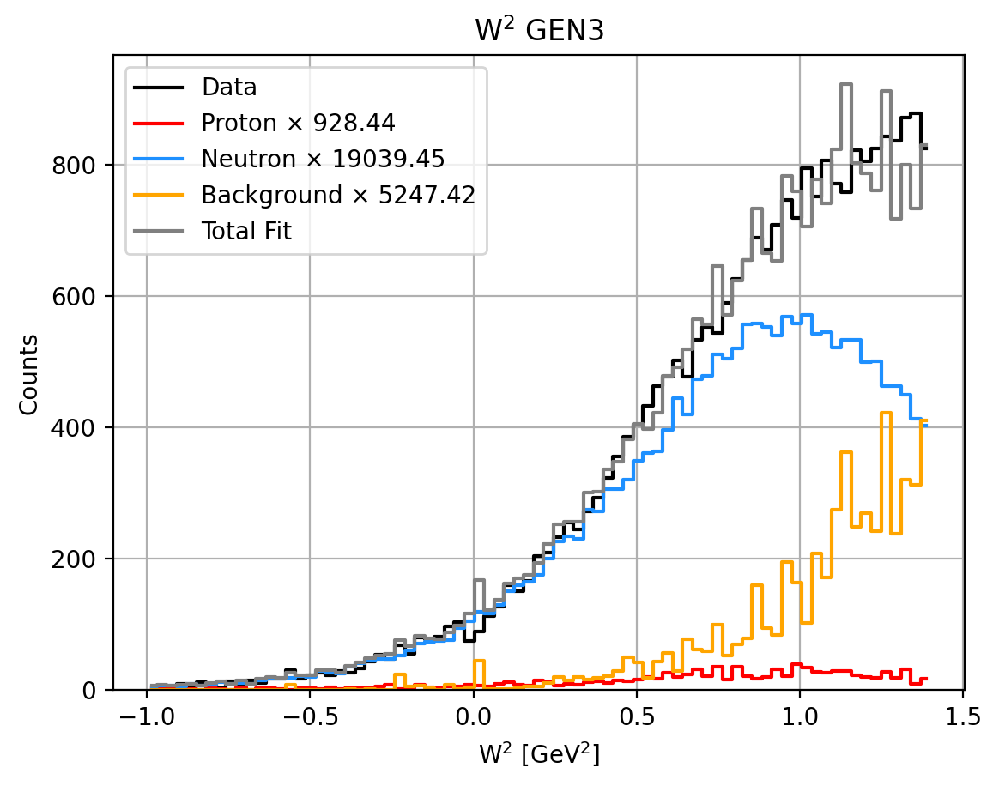

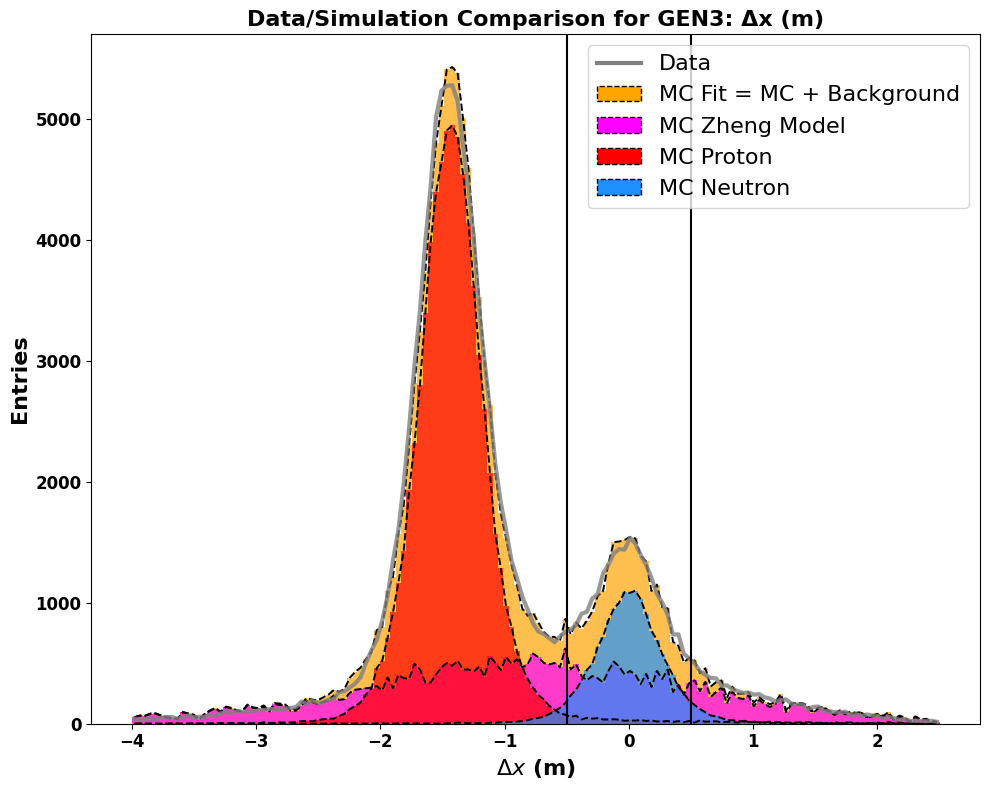

Total entries in fit: 127443.71183186267


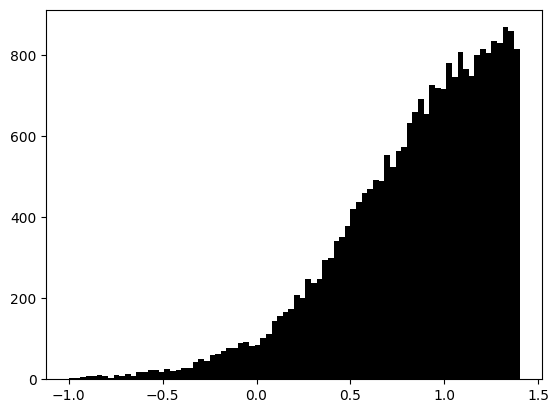

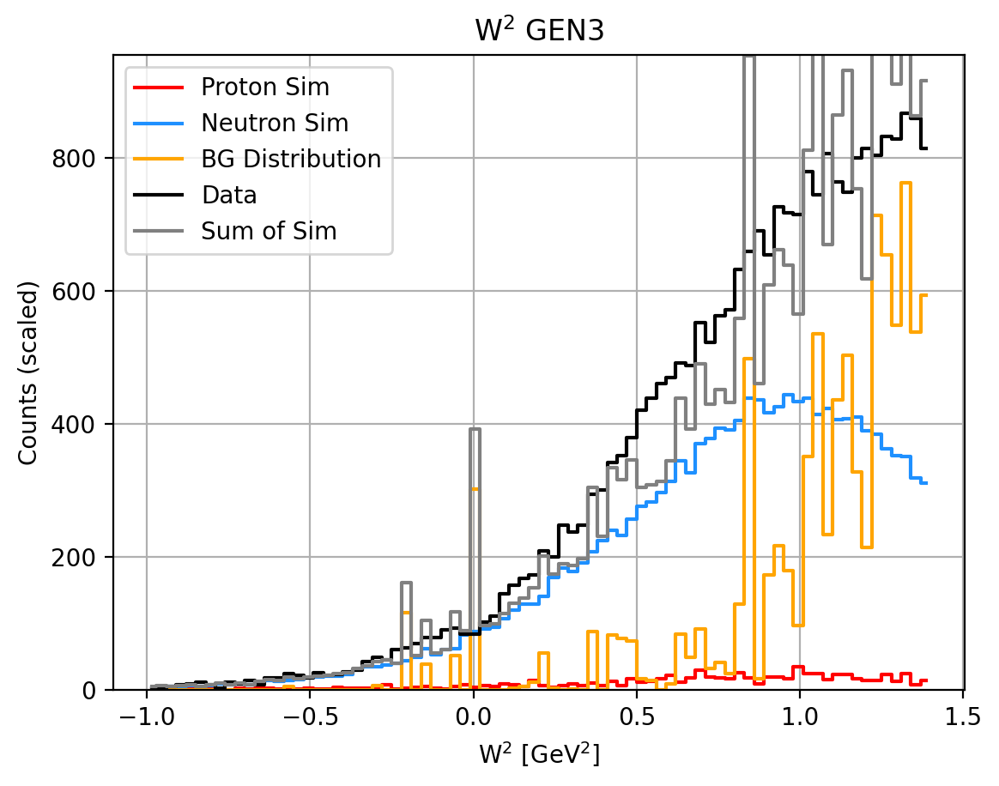

coinstuf: f,fe,A,Ae 0.021465330444203682 0.000994887864220291 0.011359285258455648 0.011296722967051542
Total events in range (-0.5, 0.5):
  Sim Proton:   723.96
  Sim Neutron:  14846.10
  Background:   8942.94
  Total:        24913.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.03
   Background Fraction: 0.36
   Neutron Fraction: 0.60
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6136%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6138
tau_avg = 1.9297
Q2 = 6.8139
Px: 0.9898 Pz: -0.0395
A = 0.07704 ± 0.00957 ± 0.00217
B = 0.49064 (no propagated error)
C = 0.21100 ± 0.03010 ± 0.00681
__________________________________________________
N_plus: 12918 N_minus: 11709
A_raw: 0.0491+=0.0064
A_raw_weighted: 0.0502+-0.0063  12.5664%
__________________________________________________
A_phys_weighted: 0.242
A_phys_stat_error: 0.0301  12.4277%
A_phys_sys_error: 0.0068  2.813%
GE

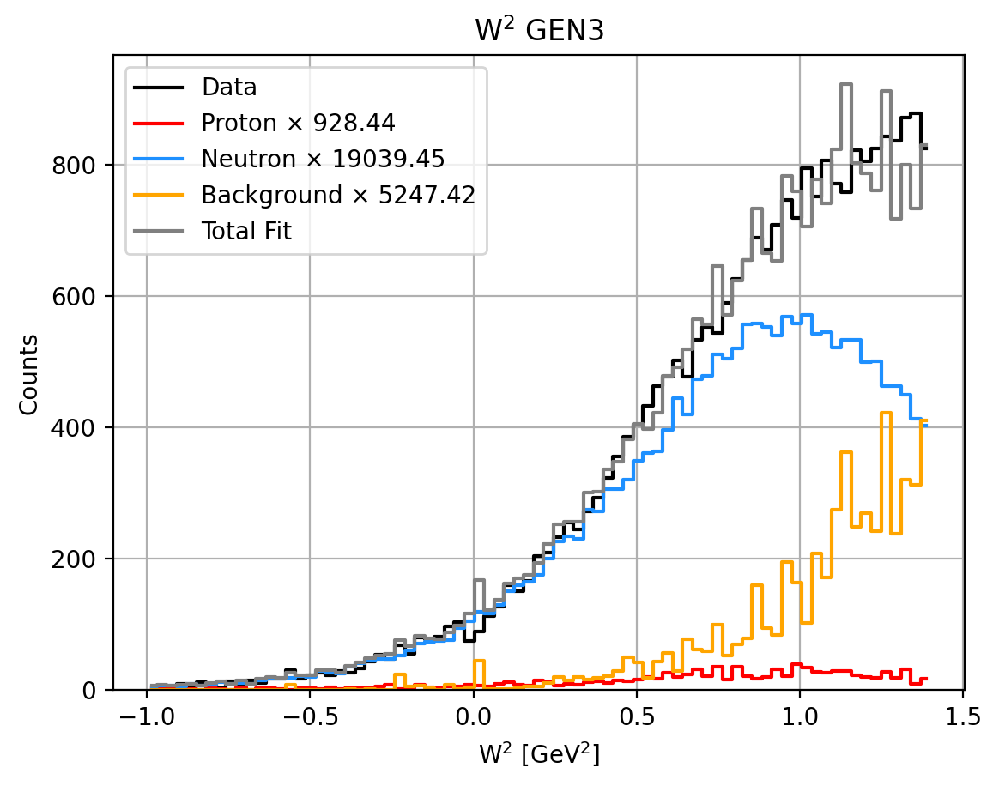

0.791895599885792 0.03861620634434885 0.7532793935414431 0.2081044001142081


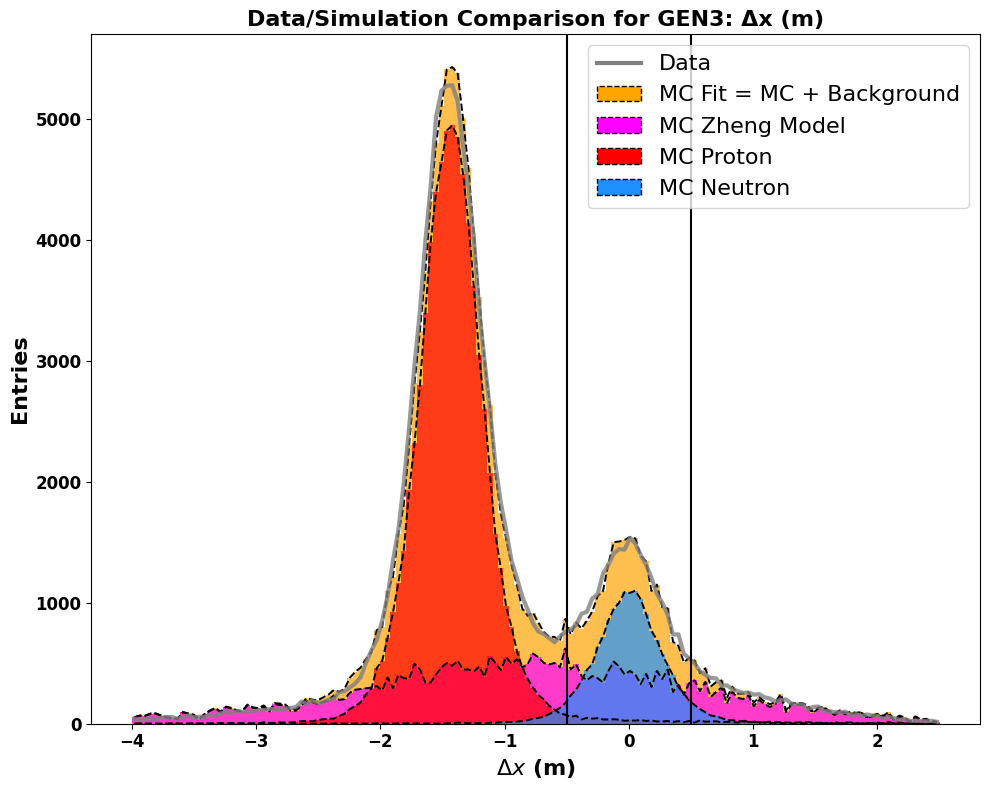

Total entries in fit: 127443.71183186267


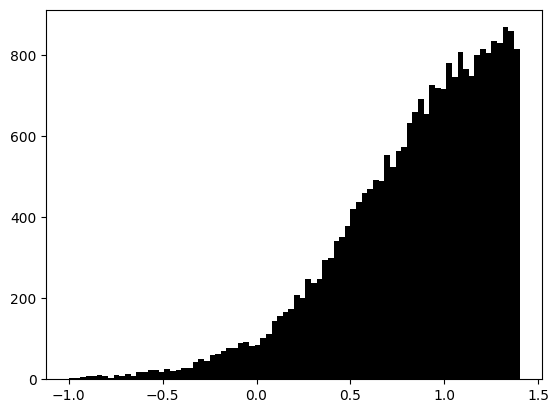

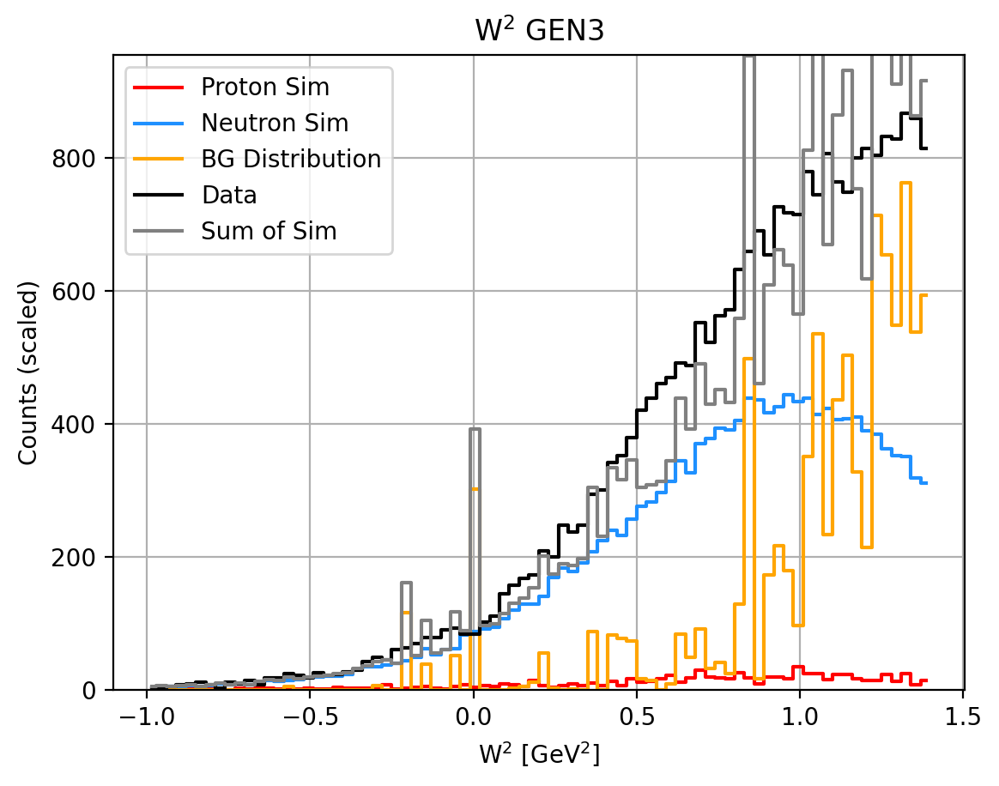

coinstuf: f,fe,A,Ae 0.021465330444203682 0.000994887864220291 0.011359285258455648 0.011296722967051542
Total events in range (-0.5, 0.5):
  Sim Proton:   723.96
  Sim Neutron:  14846.10
  Background:   8942.94
  Total:        24913.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.04
   Background Fraction: 0.21
   Neutron Fraction: 0.75
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6136%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6138
tau_avg = 1.9297
Q2 = 6.8139
Px: 0.9898 Pz: -0.0395
A = 0.06259 ± 0.00778 ± 0.00172
B = 0.49064 (no propagated error)
C = 0.16556 ± 0.02446 ± 0.00542
__________________________________________________
N_plus: 12918 N_minus: 11709
A_raw: 0.0491+=0.0064
A_raw_weighted: 0.0502+-0.0063  12.5664%
__________________________________________________
A_phys_weighted: 0.197
A_phys_stat_error: 0.0245  12.4278%
A_phys_sys_error: 0.0054  2.755%
GE

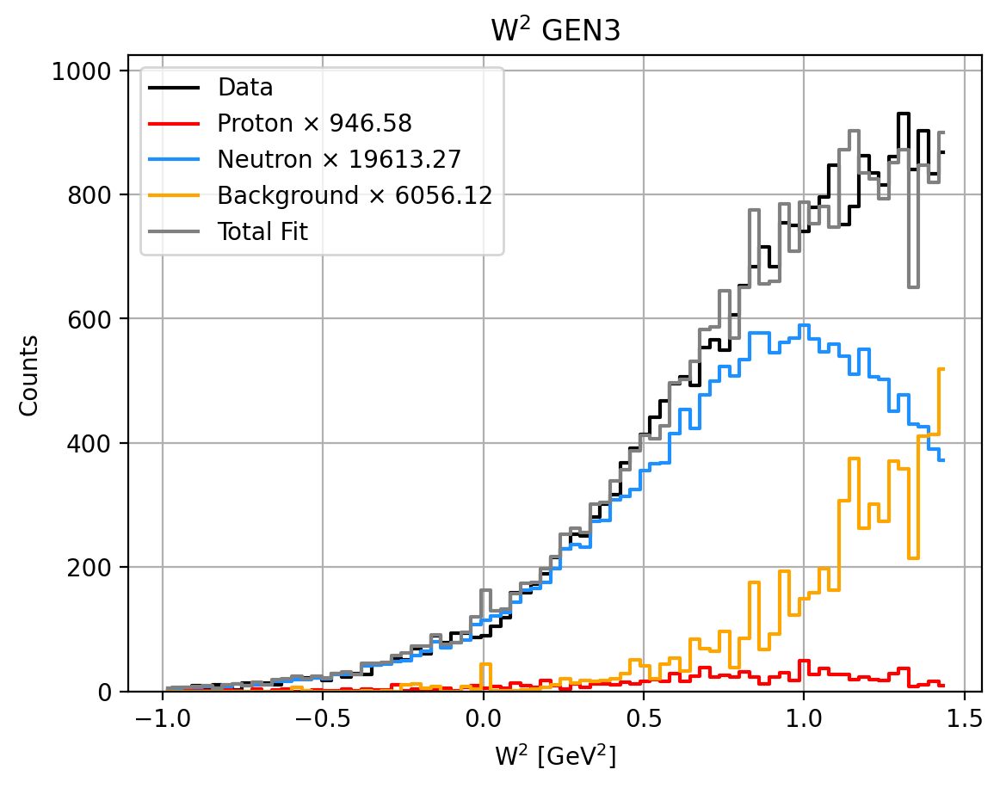

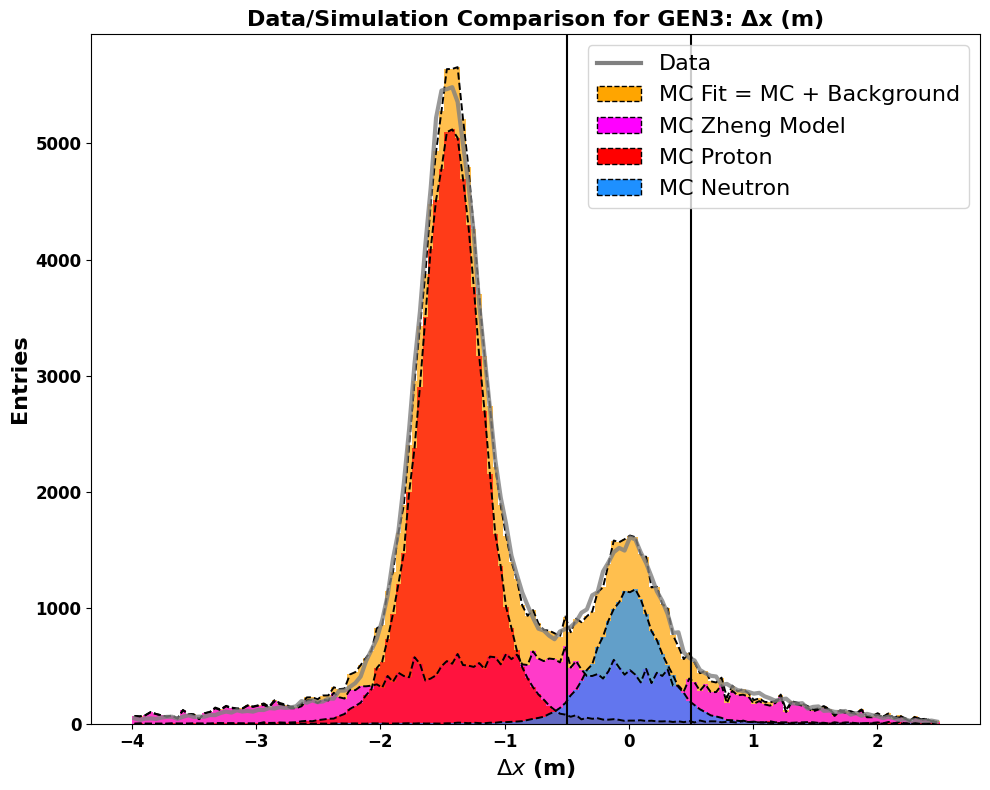

Total entries in fit: 134322.82454907382


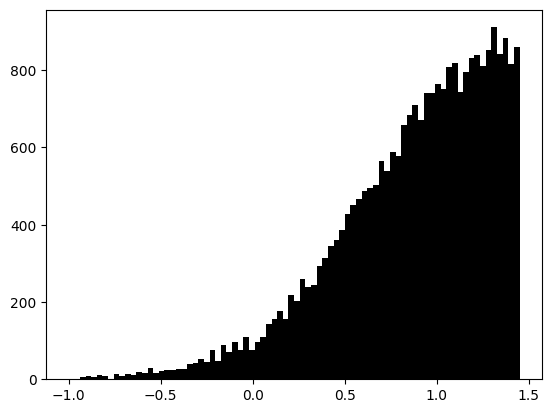

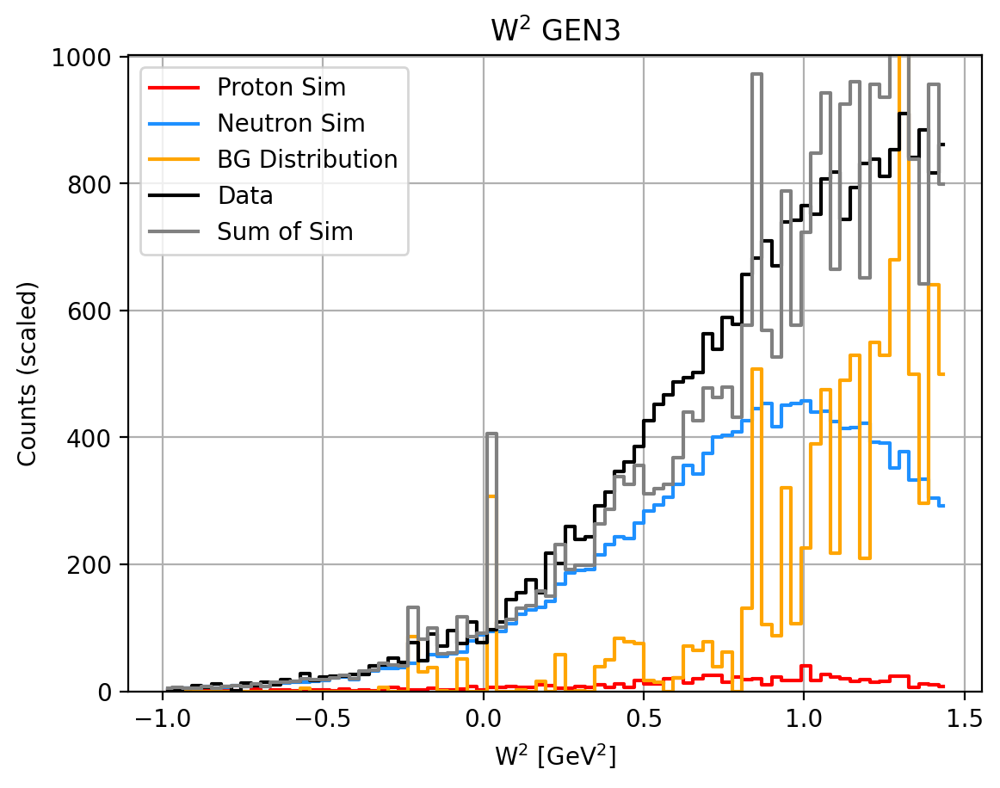

coinstuf: f,fe,A,Ae 0.021736342651962042 0.0009743397341682744 0.00946521533364884 0.010876791428401067
Total events in range (-0.5, 0.5):
  Sim Proton:   747.18
  Sim Neutron:  15481.72
  Background:   9743.31
  Total:        26304.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.03
   Background Fraction: 0.37
   Neutron Fraction: 0.59
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6137%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6148
tau_avg = 1.9230
Q2 = 6.7904
Px: 0.9898 Pz: -0.0386
A = 0.07729 ± 0.00954 ± 0.00218
B = 0.49124 (no propagated error)
C = 0.21131 ± 0.02983 ± 0.00681
__________________________________________________
N_plus: 13631 N_minus: 12381
A_raw: 0.0481+=0.0062
A_raw_weighted: 0.0493+-0.0061  12.4581%
__________________________________________________
A_phys_weighted: 0.242
A_phys_stat_error: 0.0298  12.3423%
A_phys_sys_error: 0.0068  2.818%
GE

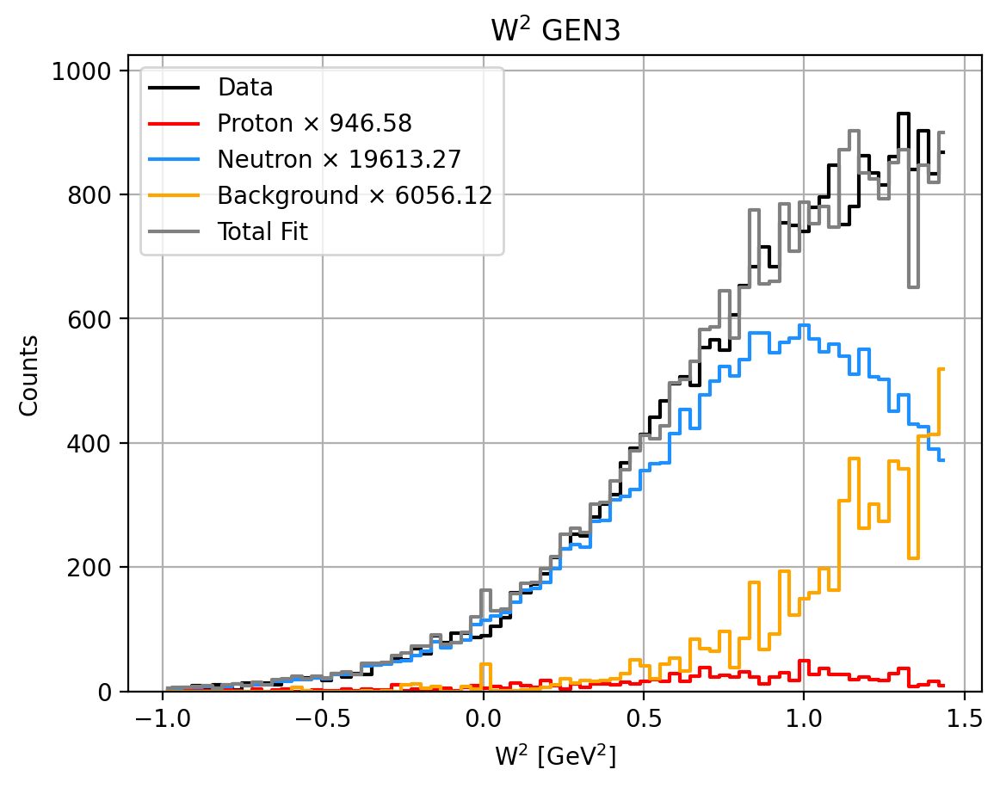

0.7724630495720118 0.03728065671352469 0.7351823928584872 0.22753695042798827


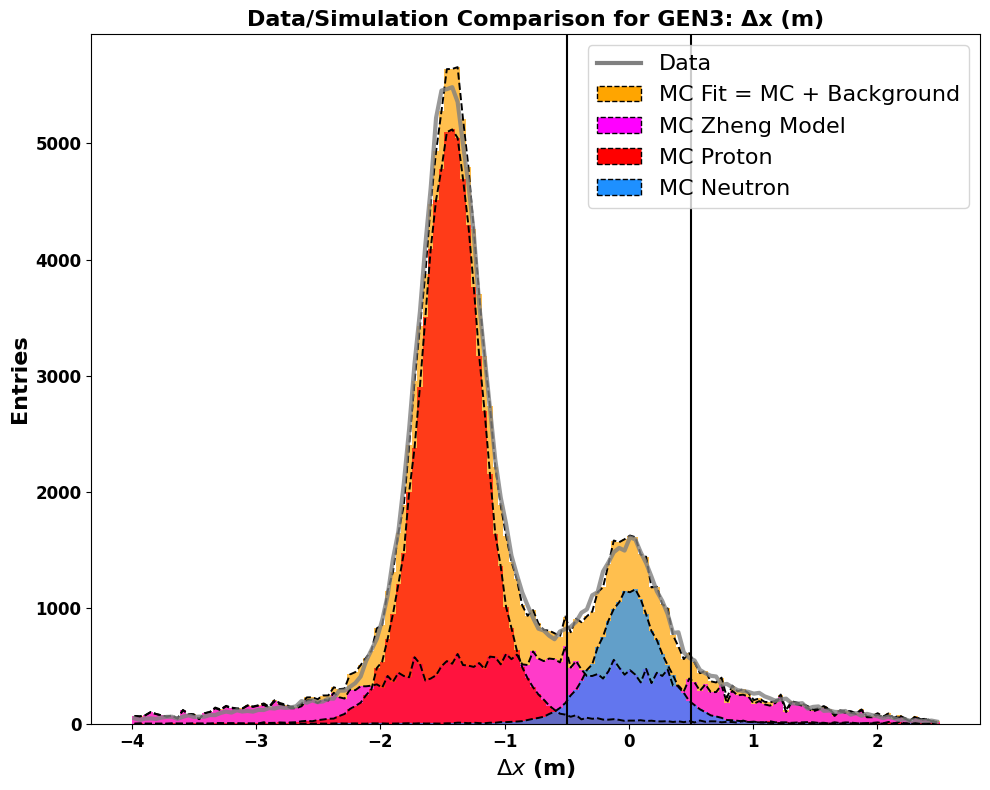

Total entries in fit: 134322.82454907382


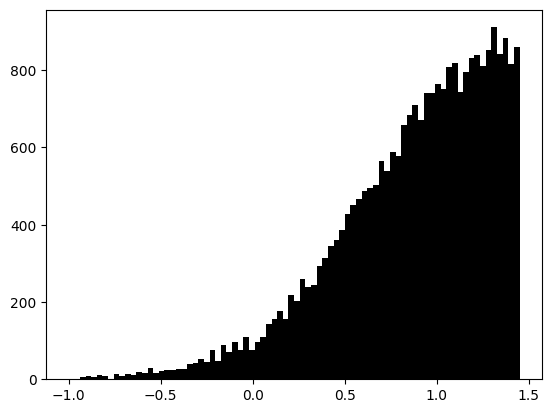

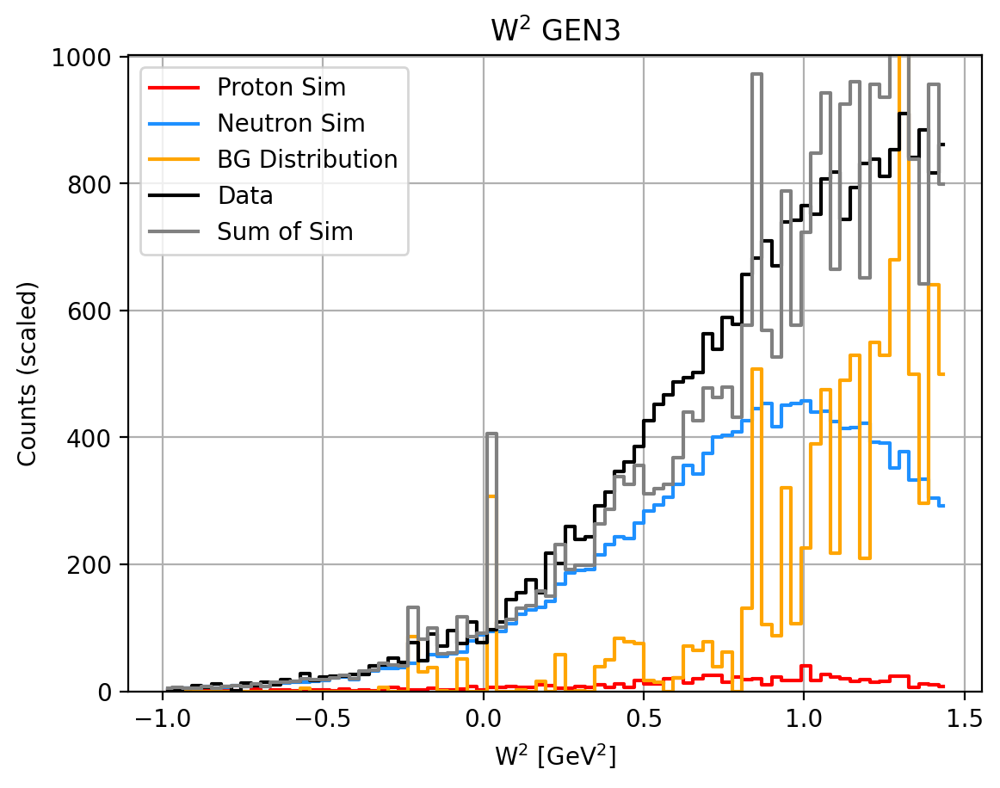

coinstuf: f,fe,A,Ae 0.021736342651962042 0.0009743397341682744 0.00946521533364884 0.010876791428401067
Total events in range (-0.5, 0.5):
  Sim Proton:   747.18
  Sim Neutron:  15481.72
  Background:   9743.31
  Total:        26304.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.04
   Background Fraction: 0.23
   Neutron Fraction: 0.74
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6137%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6148
tau_avg = 1.9230
Q2 = 6.7904
Px: 0.9898 Pz: -0.0386
A = 0.06320 ± 0.00780 ± 0.00174
B = 0.49124 (no propagated error)
C = 0.16725 ± 0.02440 ± 0.00545
__________________________________________________
N_plus: 13631 N_minus: 12381
A_raw: 0.0481+=0.0062
A_raw_weighted: 0.0493+-0.0061  12.4581%
__________________________________________________
A_phys_weighted: 0.198
A_phys_stat_error: 0.0244  12.3423%
A_phys_sys_error: 0.0055  2.759%
GE

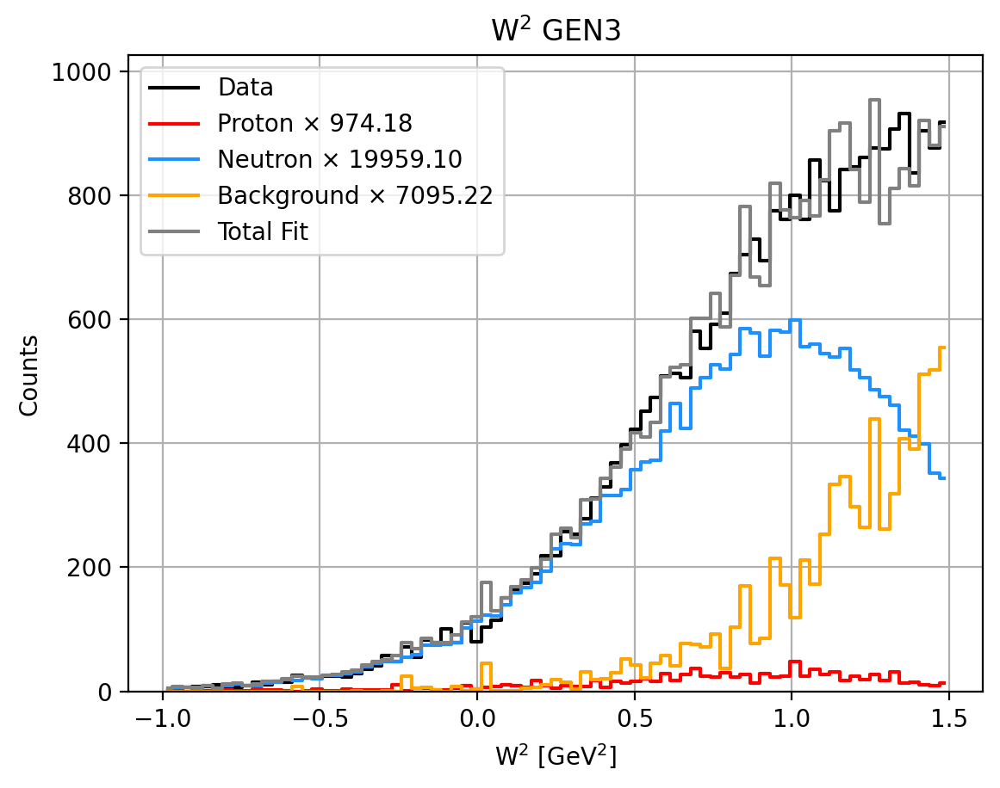

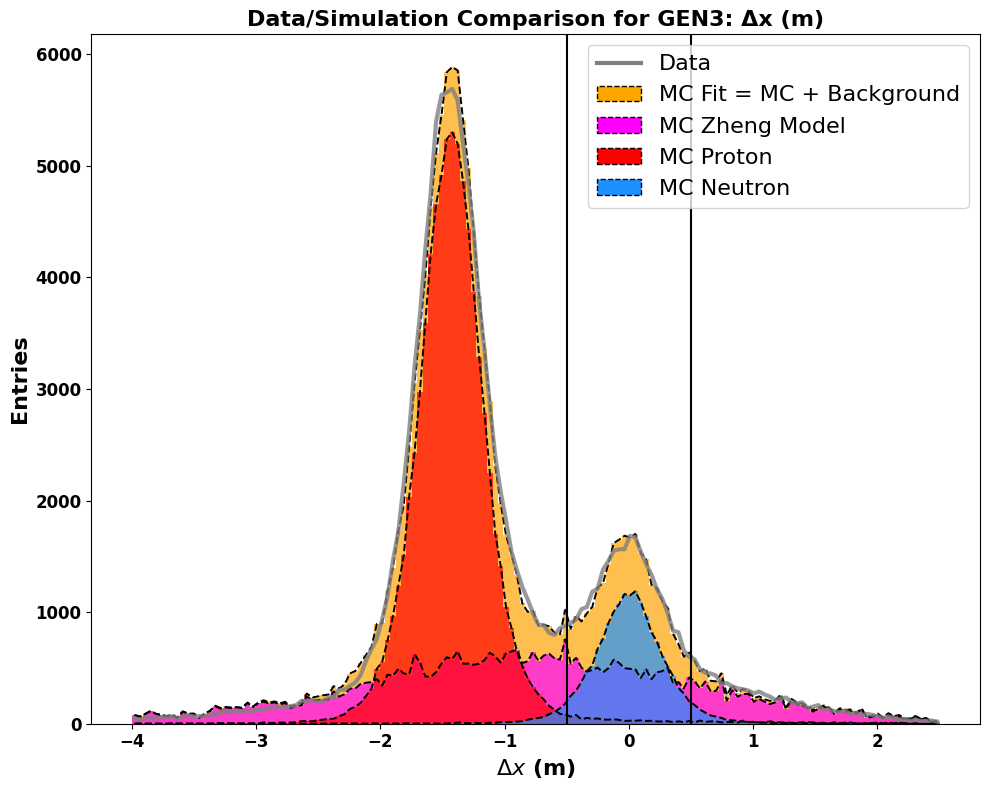

Total entries in fit: 141273.84943621495


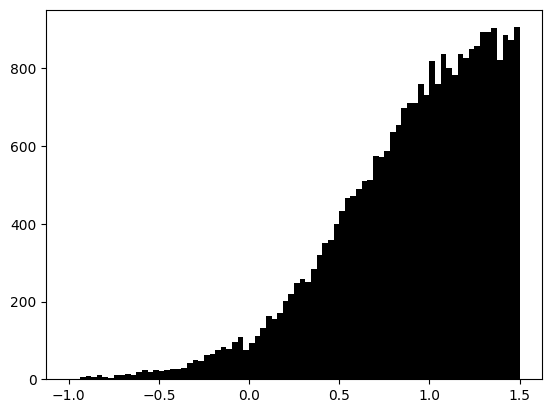

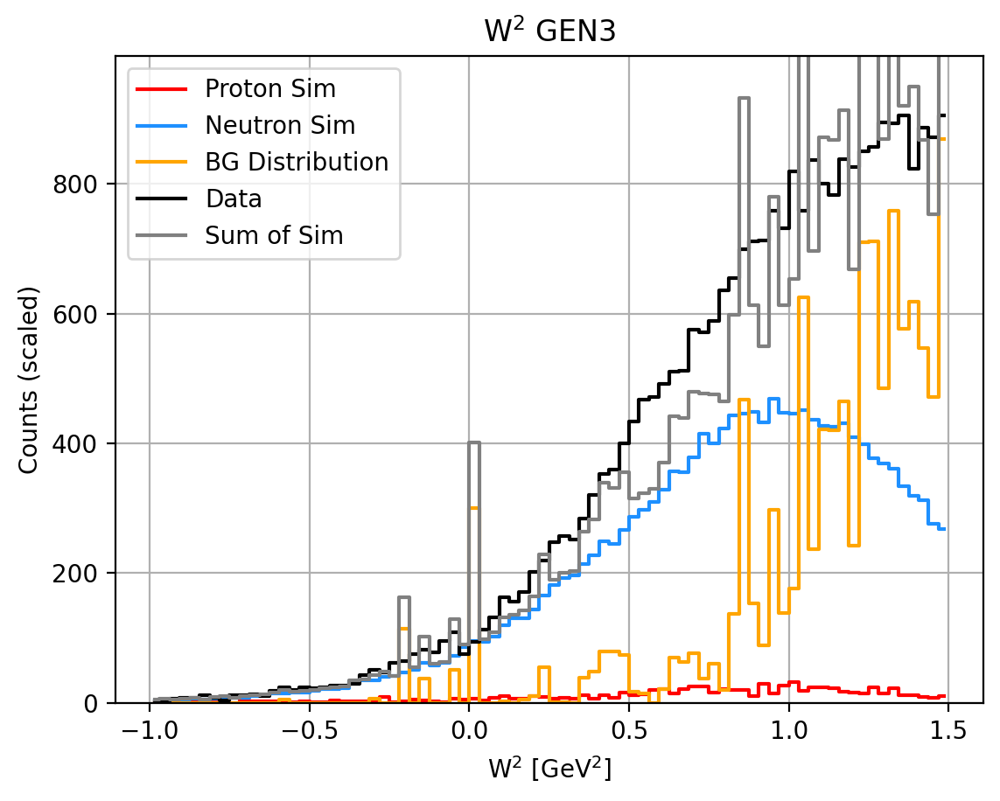

coinstuf: f,fe,A,Ae 0.02213035019455253 0.0009575139435554108 0.005754758742806552 0.010519732521673628
Total events in range (-0.5, 0.5):
  Sim Proton:   770.06
  Sim Neutron:  15777.10
  Background:   10831.56
  Total:        27721.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.03
   Background Fraction: 0.39
   Neutron Fraction: 0.57
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6134%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6159
tau_avg = 1.9165
Q2 = 6.7674
Px: 0.9898 Pz: -0.0376
A = 0.07859 ± 0.00966 ± 0.00223
B = 0.49182 (no propagated error)
C = 0.21495 ± 0.03006 ± 0.00693
__________________________________________________
N_plus: 14349 N_minus: 13071
A_raw: 0.0466+=0.0060
A_raw_weighted: 0.048+-0.0060  12.4788%
__________________________________________________
A_phys_weighted: 0.245
A_phys_stat_error: 0.0301  12.2908%
A_phys_sys_error: 0.0069  2.832%
GE

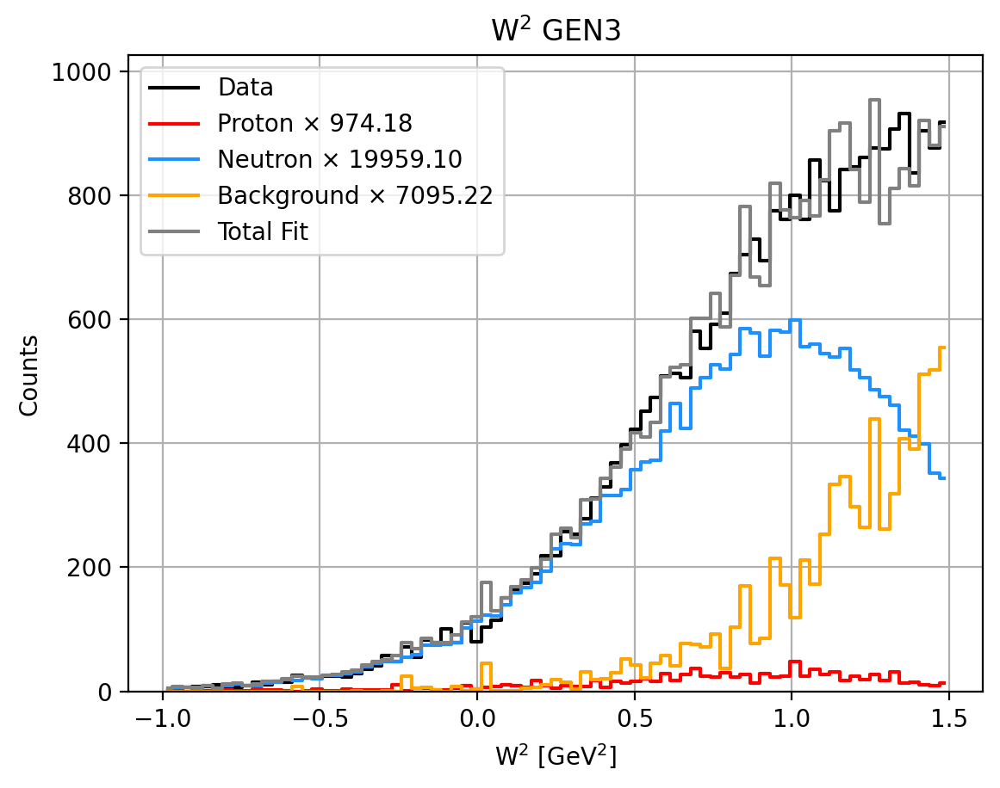

0.7468569644602417 0.03645334189249191 0.7104036225677498 0.25314303553975814


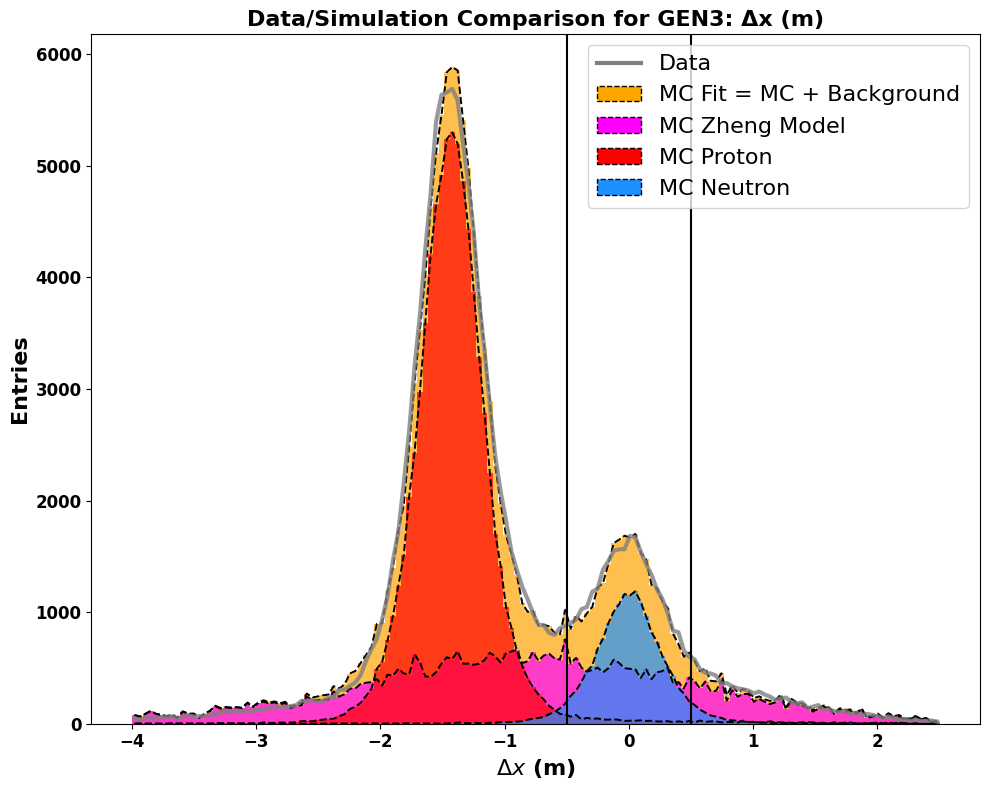

Total entries in fit: 141273.84943621495


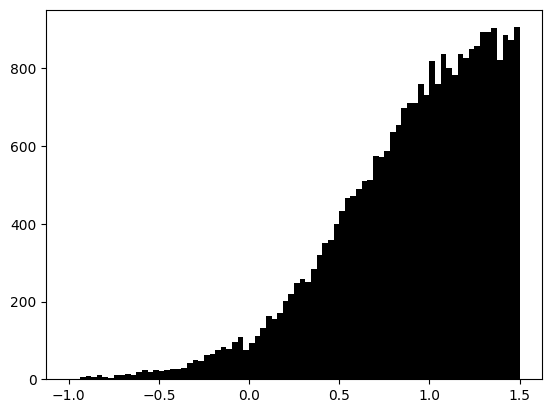

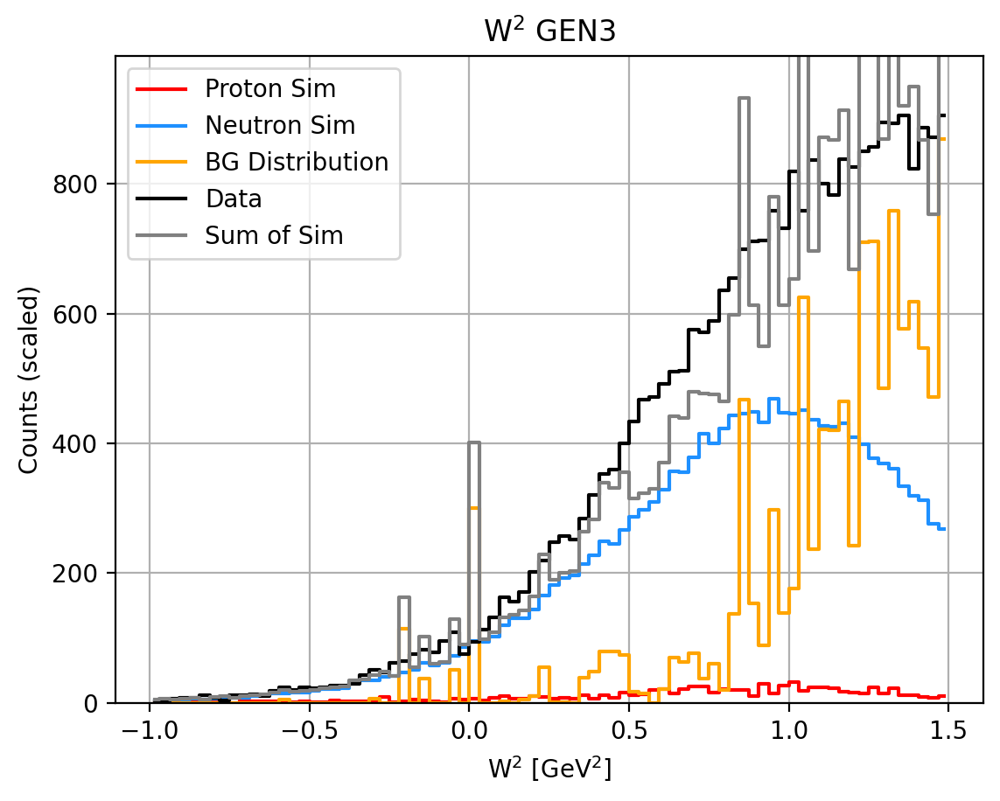

coinstuf: f,fe,A,Ae 0.02213035019455253 0.0009575139435554108 0.005754758742806552 0.010519732521673628
Total events in range (-0.5, 0.5):
  Sim Proton:   770.06
  Sim Neutron:  15777.10
  Background:   10831.56
  Total:        27721.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.04
   Background Fraction: 0.25
   Neutron Fraction: 0.71
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6134%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6159
tau_avg = 1.9165
Q2 = 6.7674
Px: 0.9898 Pz: -0.0376
A = 0.06433 ± 0.00791 ± 0.00178
B = 0.49182 (no propagated error)
C = 0.17057 ± 0.02460 ± 0.00554
__________________________________________________
N_plus: 14349 N_minus: 13071
A_raw: 0.0466+=0.0060
A_raw_weighted: 0.048+-0.0060  12.4788%
__________________________________________________
A_phys_weighted: 0.2
A_phys_stat_error: 0.0246  12.2908%
A_phys_sys_error: 0.0055  2.769%
GEn/

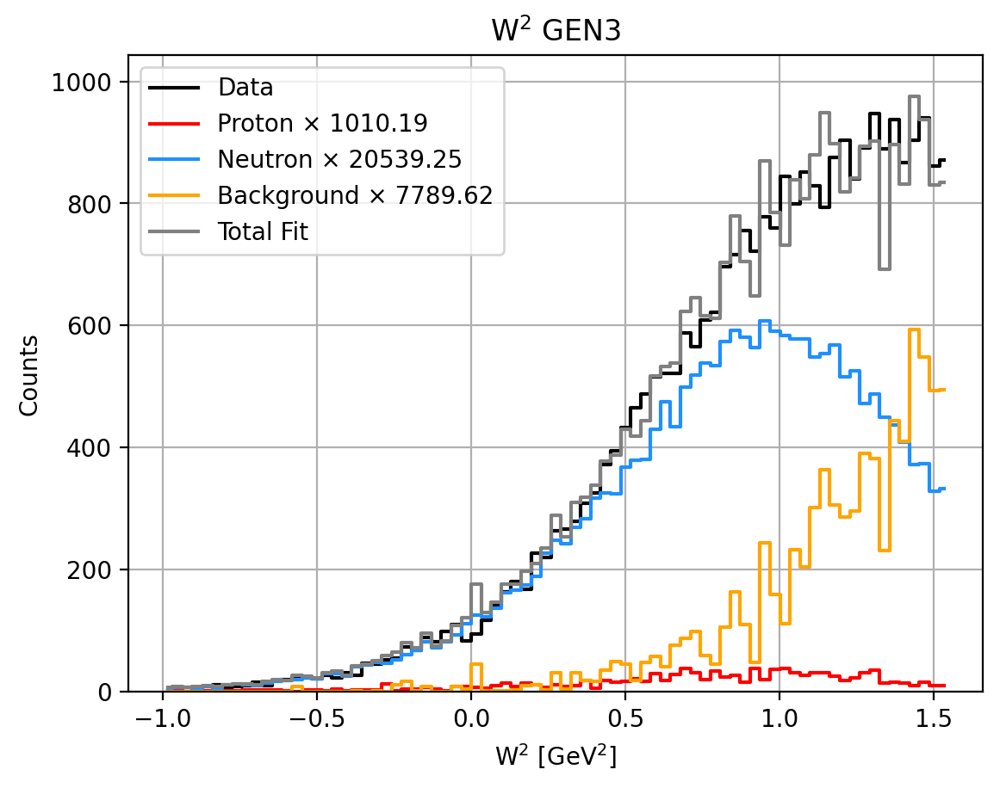

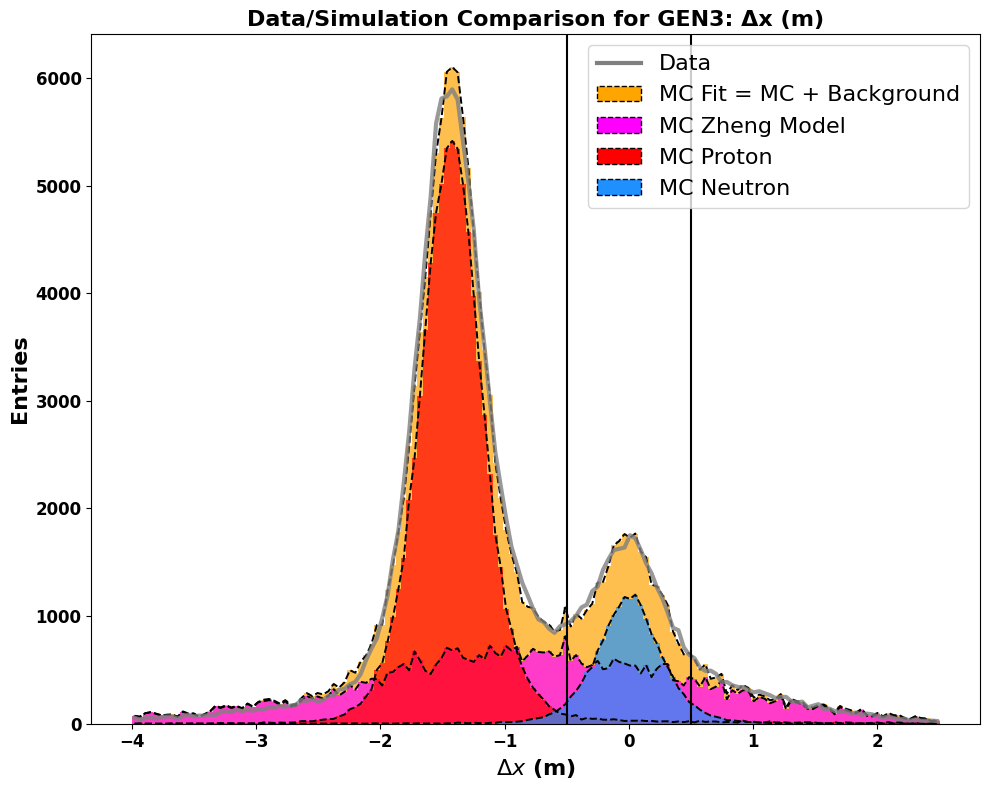

Total entries in fit: 147966.3791698688


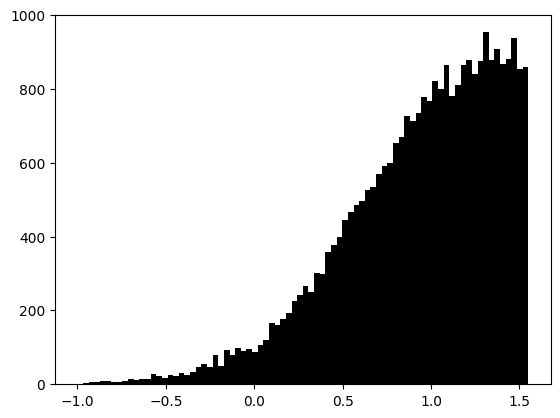

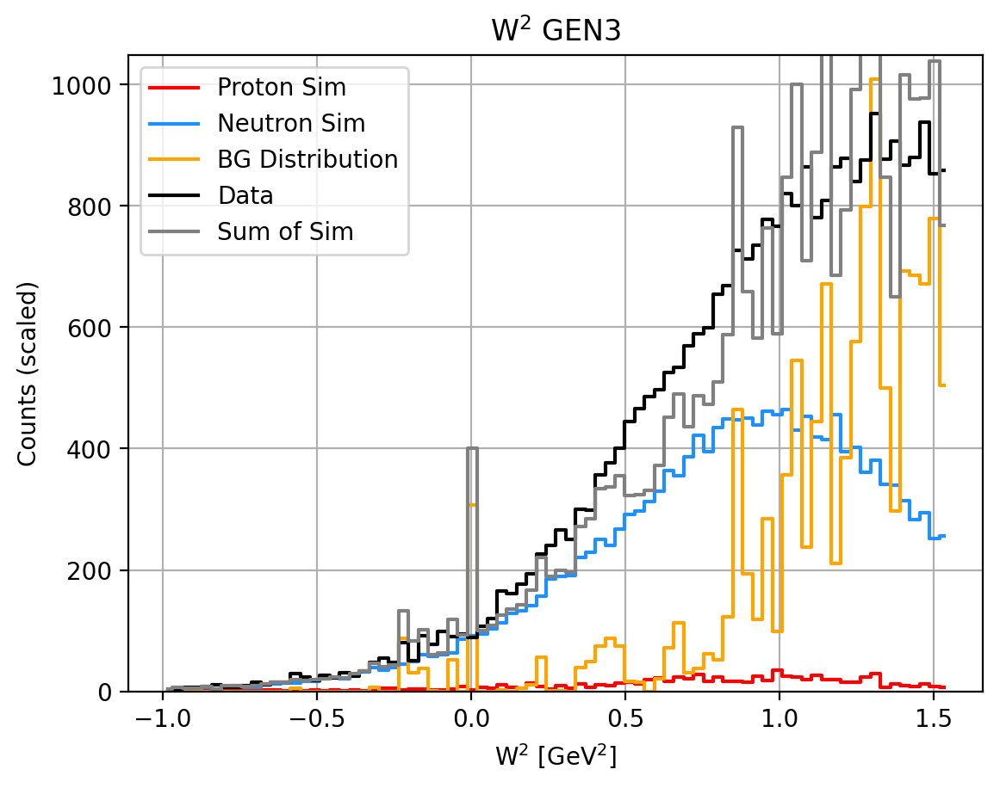

coinstuf: f,fe,A,Ae 0.022266501586318967 0.0009384505406719587 0.007888727423707702 0.010187864615536476
Total events in range (-0.5, 0.5):
  Sim Proton:   786.28
  Sim Neutron:  15986.83
  Background:   11927.15
  Total:        29041.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.03
   Background Fraction: 0.41
   Neutron Fraction: 0.55
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6132%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6168
tau_avg = 1.9106
Q2 = 6.7467
Px: 0.9899 Pz: -0.0366
A = 0.07846 ± 0.00981 ± 0.00224
B = 0.49237 (no propagated error)
C = 0.21419 ± 0.03038 ± 0.00692
__________________________________________________
N_plus: 15008 N_minus: 13723
A_raw: 0.0447+=0.0059
A_raw_weighted: 0.0459+-0.0058  12.7464%
__________________________________________________
A_phys_weighted: 0.243
A_phys_stat_error: 0.0304  12.4989%
A_phys_sys_error: 0.0069  2.849%


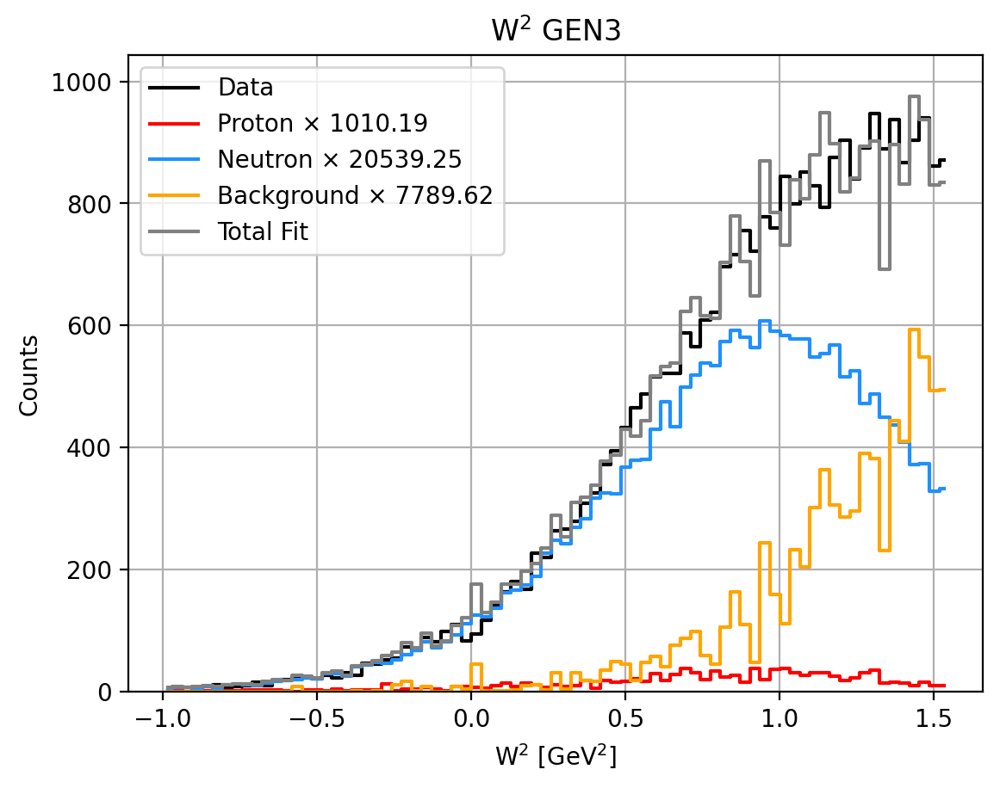

0.7344966202266607 0.036124894445334566 0.6983717257813262 0.2655033797733392


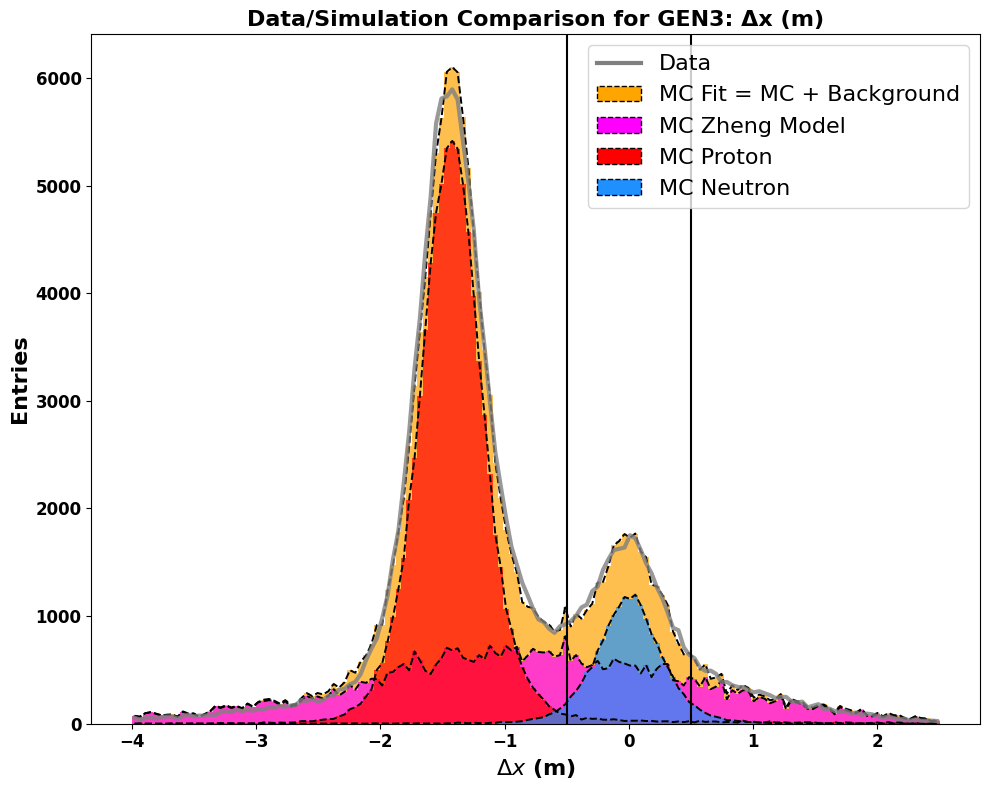

Total entries in fit: 147966.3791698688


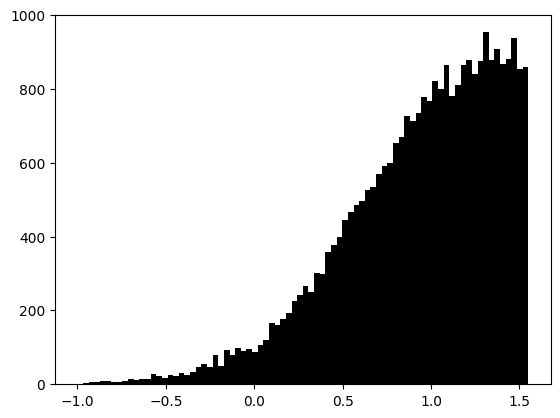

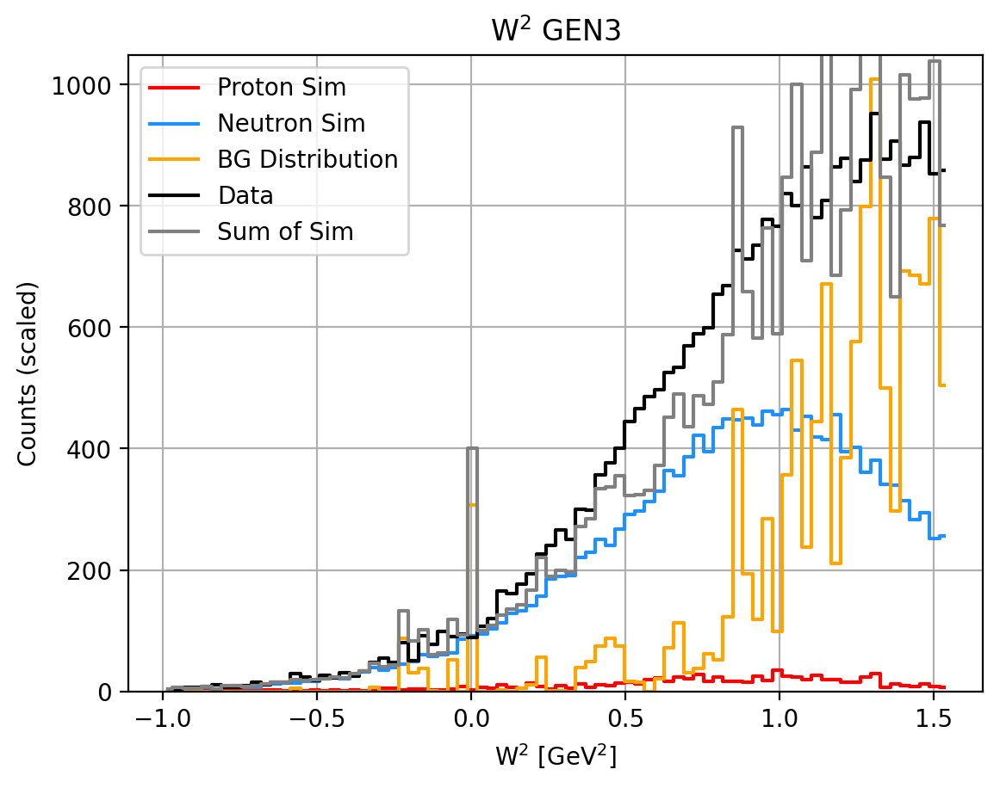

coinstuf: f,fe,A,Ae 0.022266501586318967 0.0009384505406719587 0.007888727423707702 0.010187864615536476
Total events in range (-0.5, 0.5):
  Sim Proton:   786.28
  Sim Neutron:  15986.83
  Background:   11927.15
  Total:        29041.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.04
   Background Fraction: 0.27
   Neutron Fraction: 0.70
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6132%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6168
tau_avg = 1.9106
Q2 = 6.7467
Px: 0.9899 Pz: -0.0366
A = 0.06316 ± 0.00789 ± 0.00175
B = 0.49237 (no propagated error)
C = 0.16681 ± 0.02445 ± 0.00543
__________________________________________________
N_plus: 15008 N_minus: 13723
A_raw: 0.0447+=0.0059
A_raw_weighted: 0.0459+-0.0058  12.7464%
__________________________________________________
A_phys_weighted: 0.196
A_phys_stat_error: 0.0245  12.4989%
A_phys_sys_error: 0.0054  2.776%


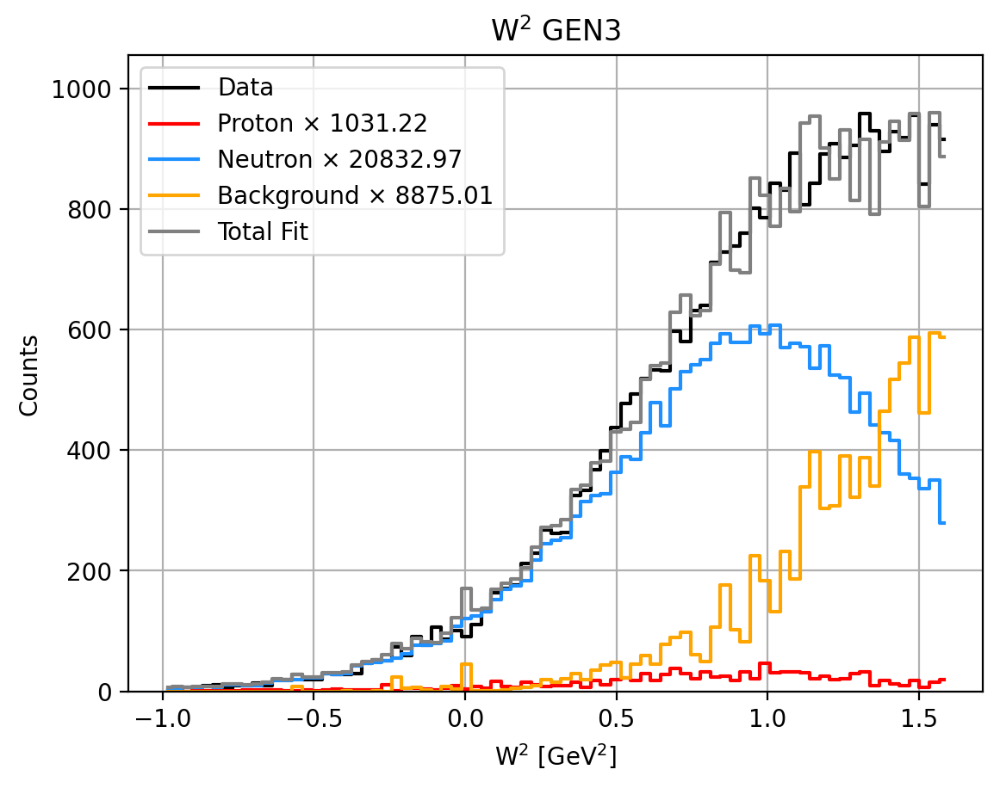

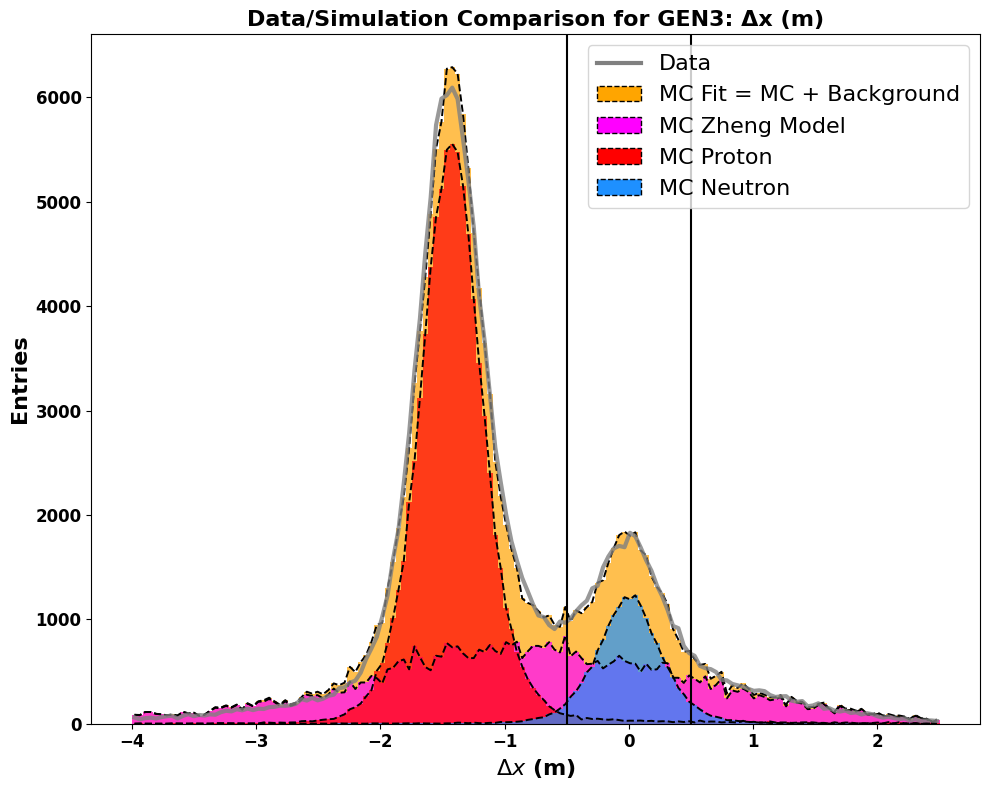

Total entries in fit: 154580.89855509571


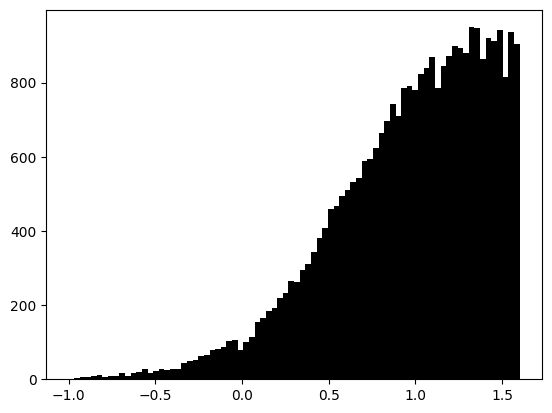

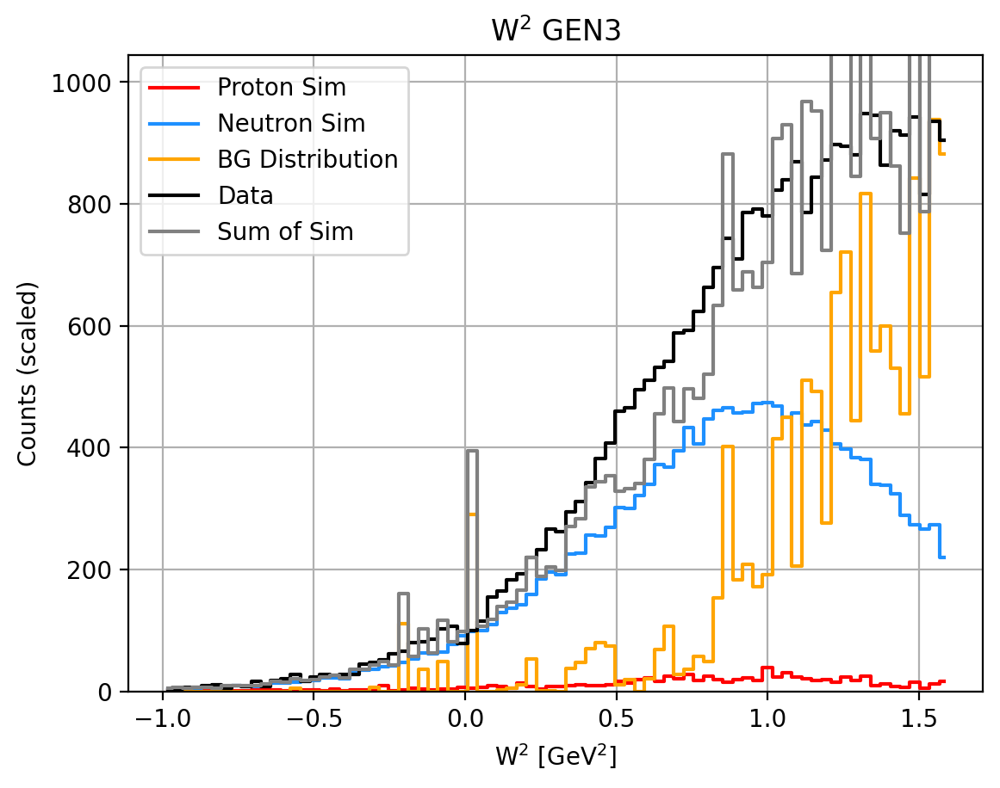

coinstuf: f,fe,A,Ae 0.022765878877400295 0.0009272695443718216 0.009044053291840902 0.009861030903383904
Total events in range (-0.5, 0.5):
  Sim Proton:   816.18
  Sim Neutron:  16488.82
  Background:   12821.79
  Total:        30444.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.03
   Background Fraction: 0.42
   Neutron Fraction: 0.54
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6124%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6177
tau_avg = 1.9045
Q2 = 6.7252
Px: 0.9899 Pz: -0.0357
A = 0.07376 ± 0.00980 ± 0.00211
B = 0.49293 (no propagated error)
C = 0.19939 ± 0.03023 ± 0.00651
__________________________________________________
N_plus: 15678 N_minus: 14443
A_raw: 0.0410+=0.0058
A_raw_weighted: 0.0419+-0.0057  13.6366%
__________________________________________________
A_phys_weighted: 0.227
A_phys_stat_error: 0.0302  13.2923%
A_phys_sys_error: 0.0065  2.865%


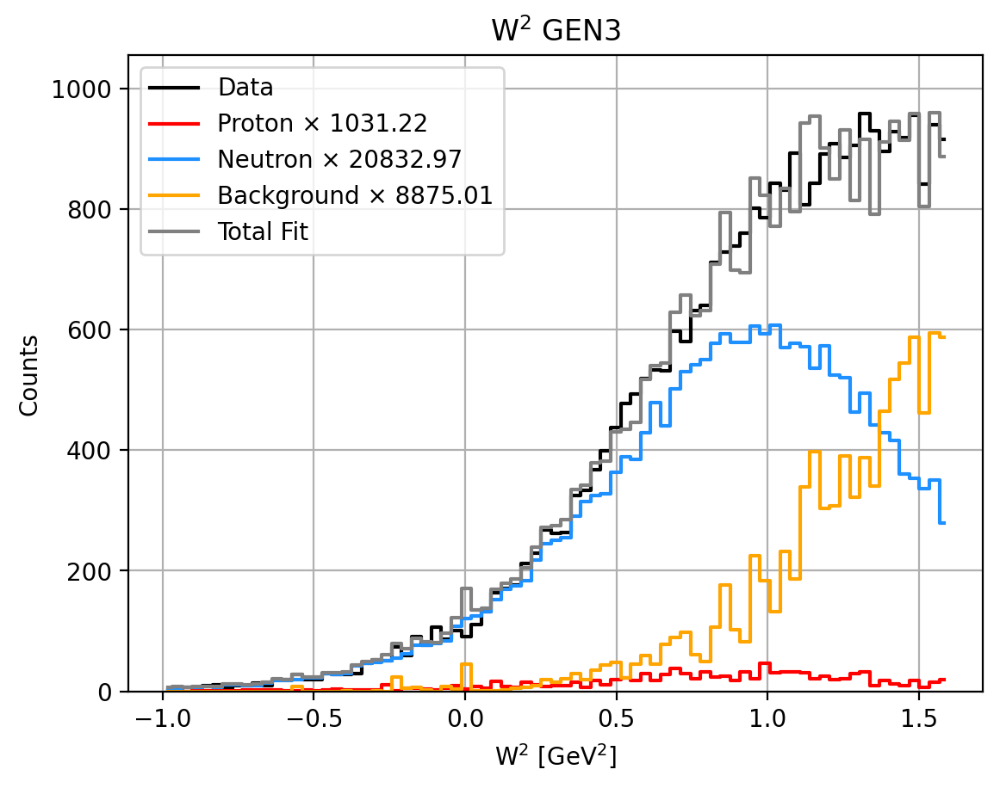

0.7112803086124034 0.03520785072049092 0.6760724578919125 0.28871969138759657


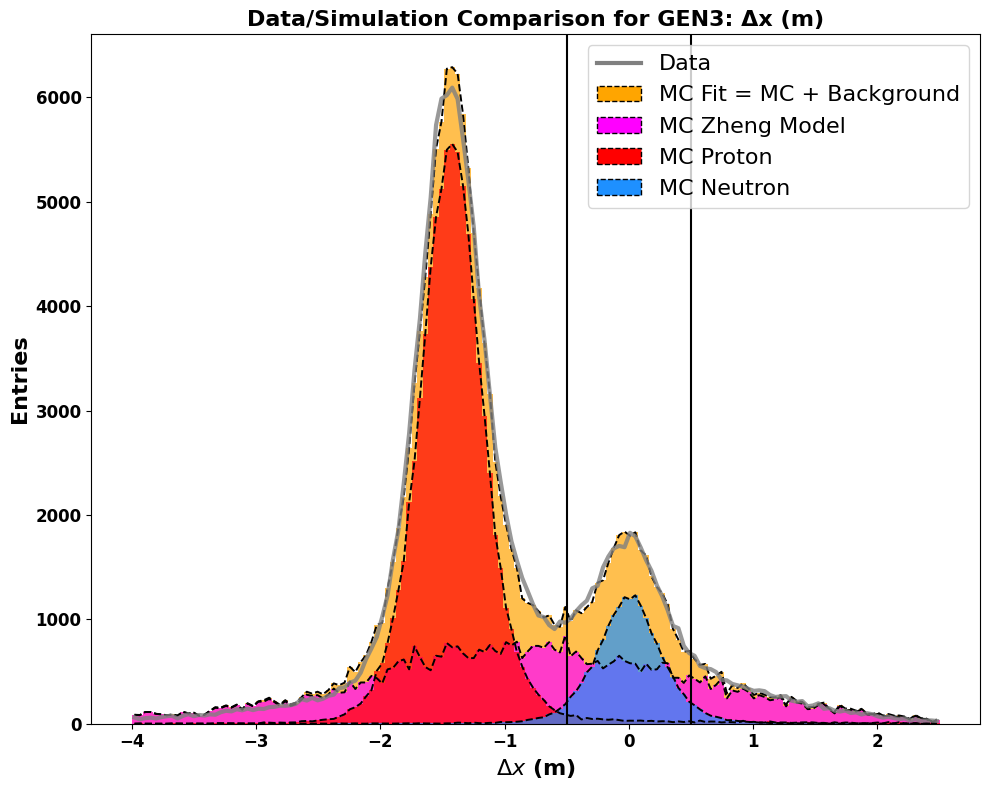

Total entries in fit: 154580.89855509571


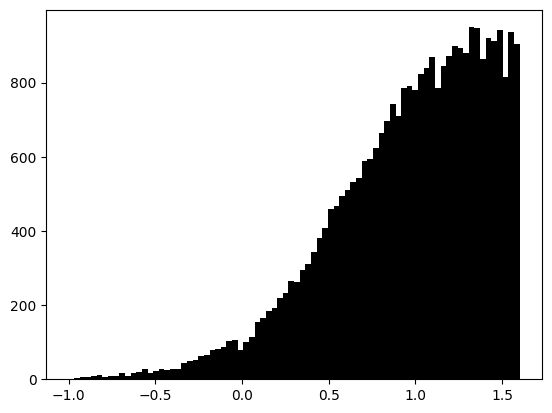

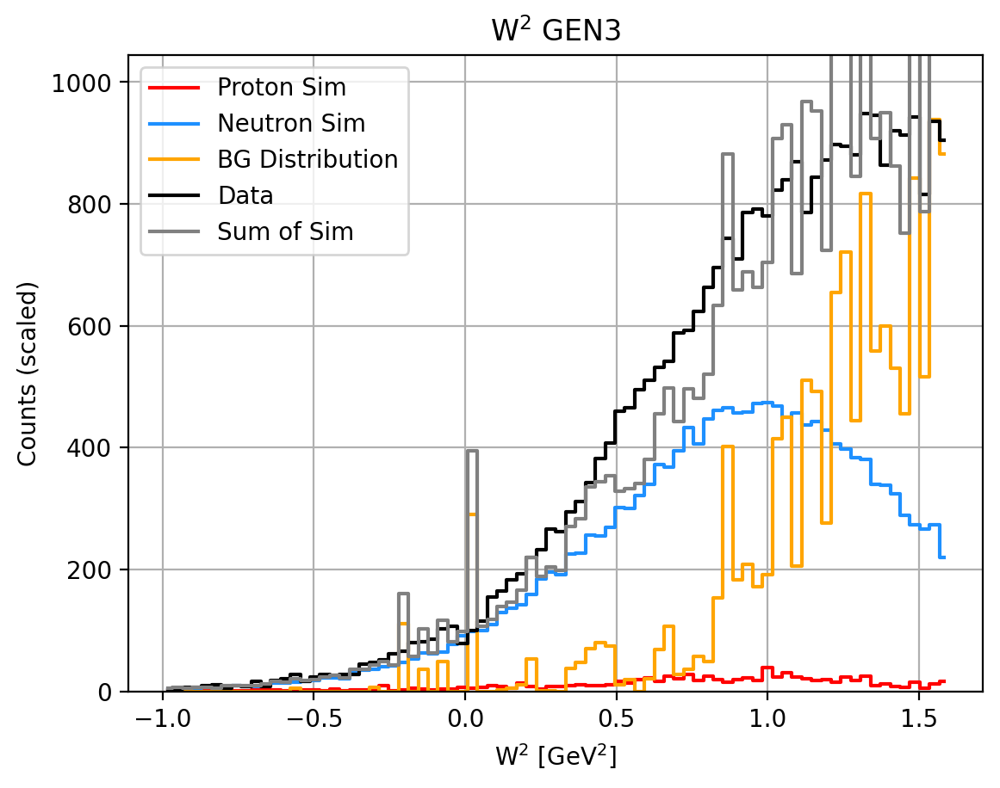

coinstuf: f,fe,A,Ae 0.022765878877400295 0.0009272695443718216 0.009044053291840902 0.009861030903383904
Total events in range (-0.5, 0.5):
  Sim Proton:   816.18
  Sim Neutron:  16488.82
  Background:   12821.79
  Total:        30444.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.04
   Background Fraction: 0.29
   Neutron Fraction: 0.68
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6124%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6177
tau_avg = 1.9045
Q2 = 6.7252
Px: 0.9899 Pz: -0.0357
A = 0.06023 ± 0.00801 ± 0.00168
B = 0.49293 (no propagated error)
C = 0.15766 ± 0.02468 ± 0.00518
__________________________________________________
N_plus: 15678 N_minus: 14443
A_raw: 0.0410+=0.0058
A_raw_weighted: 0.0419+-0.0057  13.6366%
__________________________________________________
A_phys_weighted: 0.186
A_phys_stat_error: 0.0247  13.2923%
A_phys_sys_error: 0.0052  2.791%


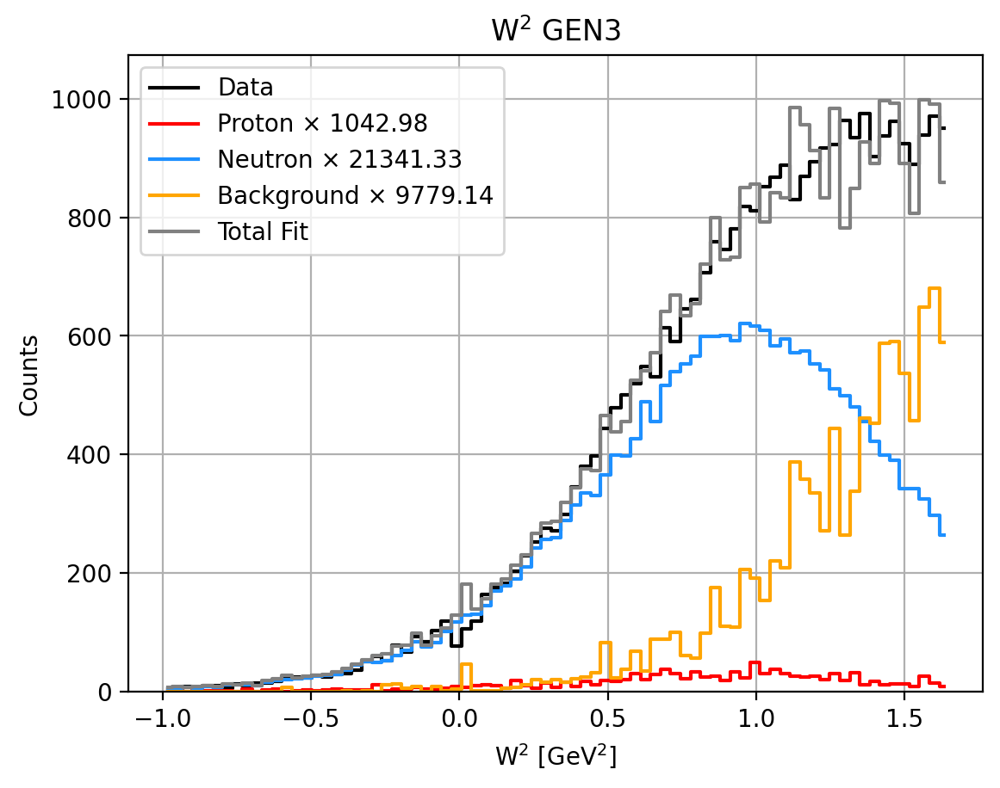

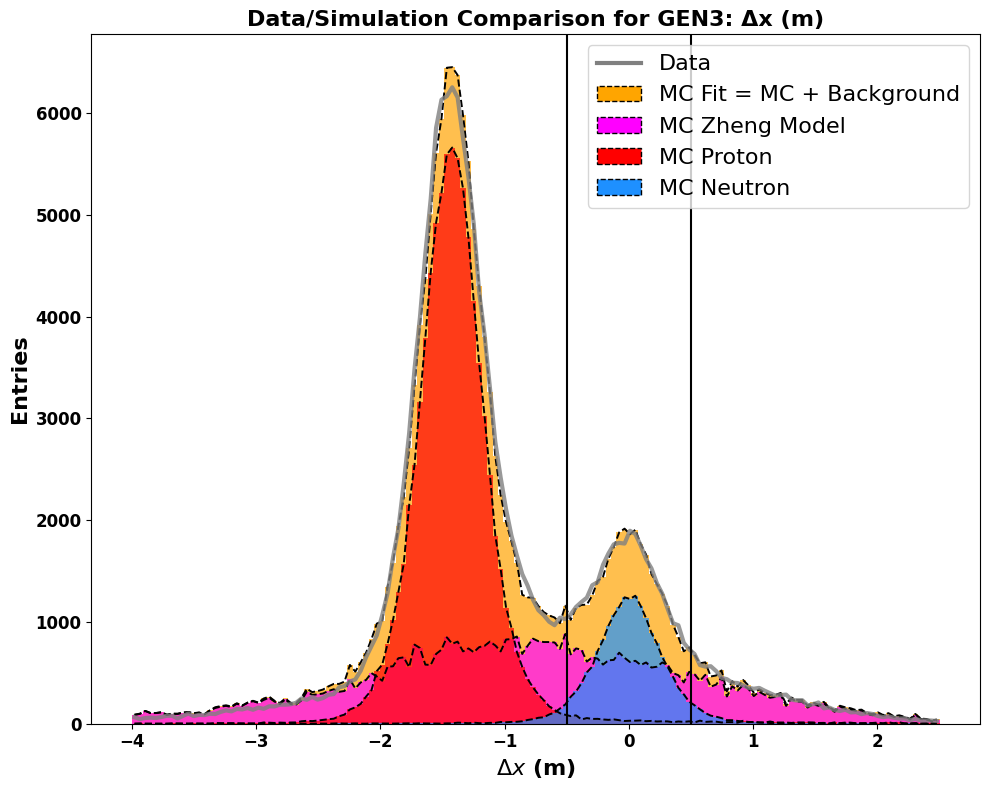

Total entries in fit: 161063.99929291388


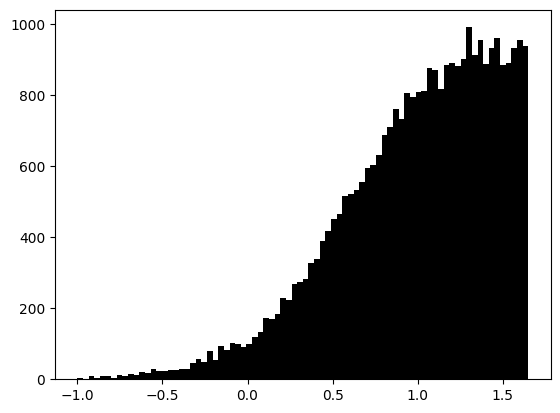

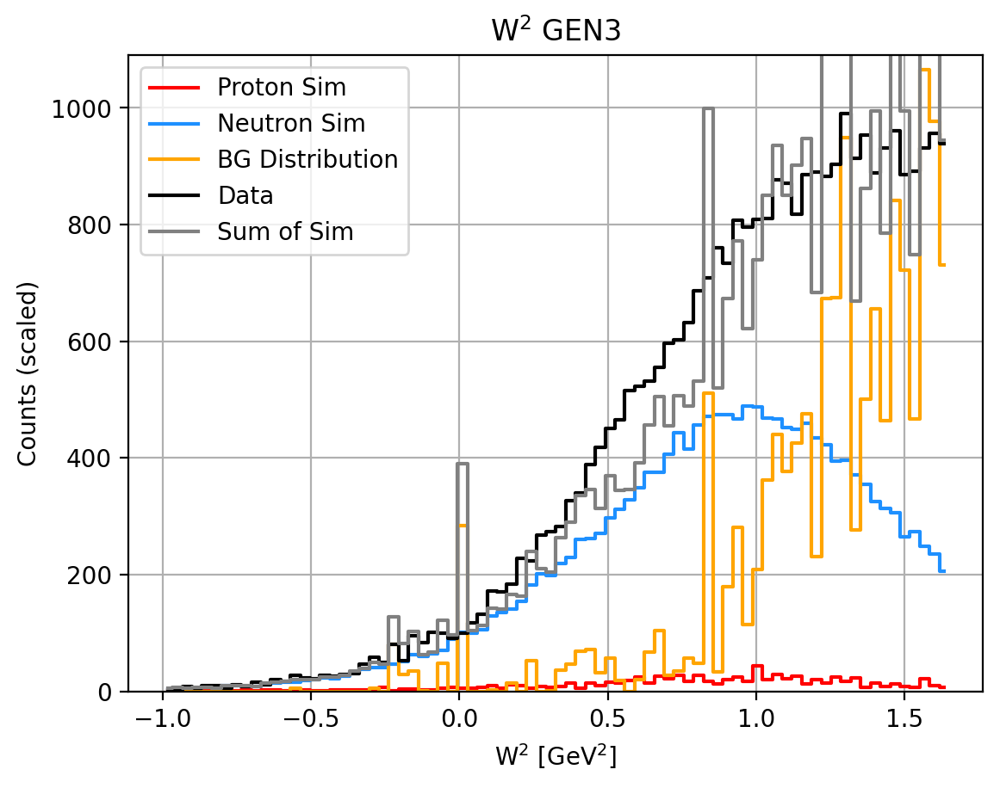

coinstuf: f,fe,A,Ae 0.02359272983942121 0.0009231899863315182 0.00747493163172288 0.009547387570714945
Total events in range (-0.5, 0.5):
  Sim Proton:   825.08
  Sim Neutron:  16882.64
  Background:   13809.85
  Total:        31876.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.03
   Background Fraction: 0.43
   Neutron Fraction: 0.53
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6121%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6187
tau_avg = 1.8984
Q2 = 6.7035
Px: 0.9899 Pz: -0.0347
A = 0.07214 ± 0.00983 ± 0.00208
B = 0.49349 (no propagated error)
C = 0.19410 ± 0.03017 ± 0.00637
__________________________________________________
N_plus: 16384 N_minus: 15149
A_raw: 0.0392+=0.0056
A_raw_weighted: 0.0398+-0.0056  14.0305%
__________________________________________________
A_phys_weighted: 0.221
A_phys_stat_error: 0.0302  13.6294%
A_phys_sys_error: 0.0064  2.88%
GEn

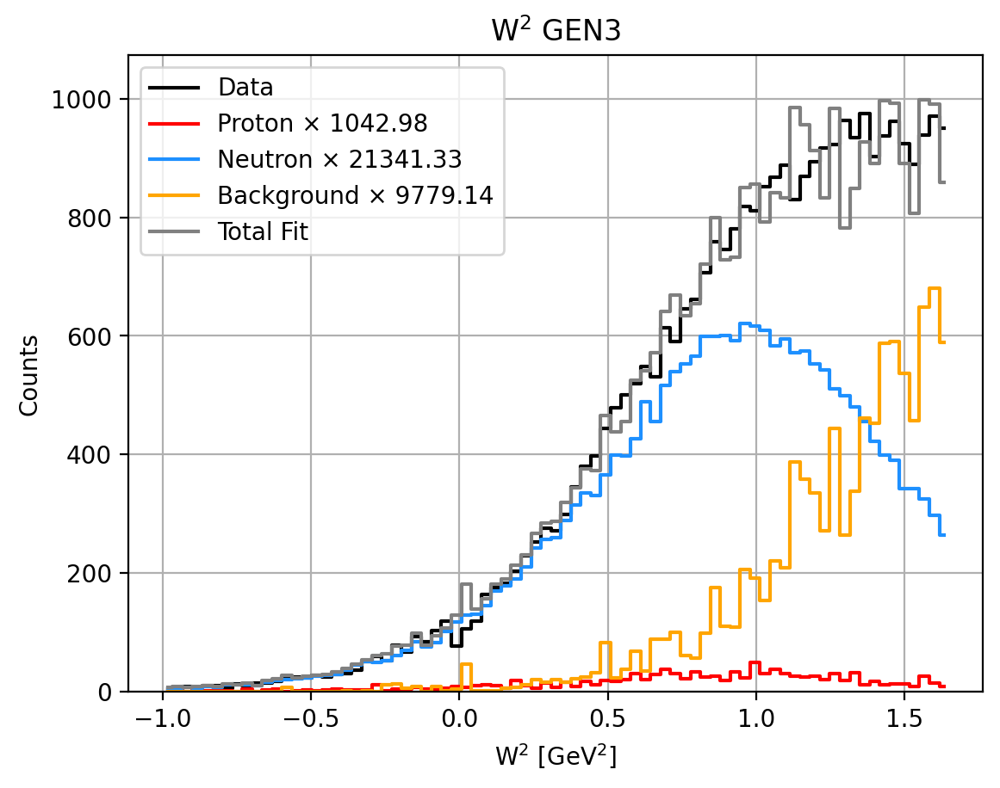

0.6959547747884324 0.03401232430361814 0.6619424504848143 0.3040452252115676


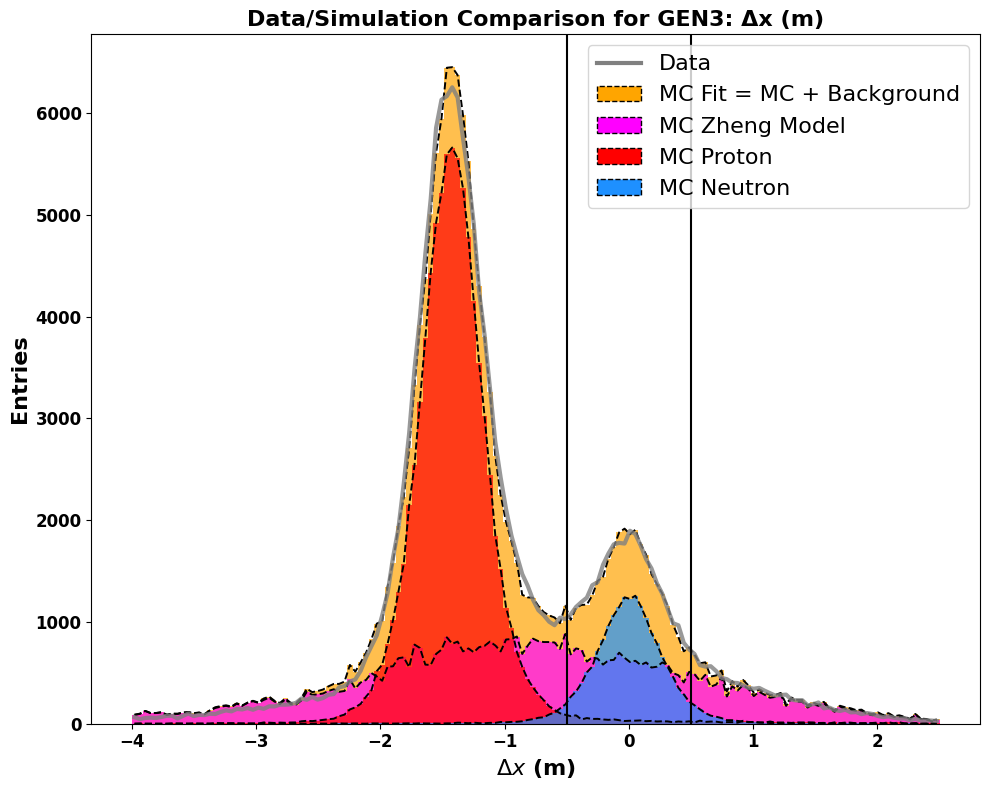

Total entries in fit: 161063.99929291388


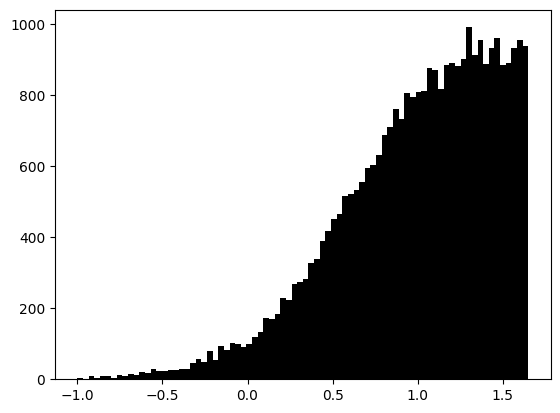

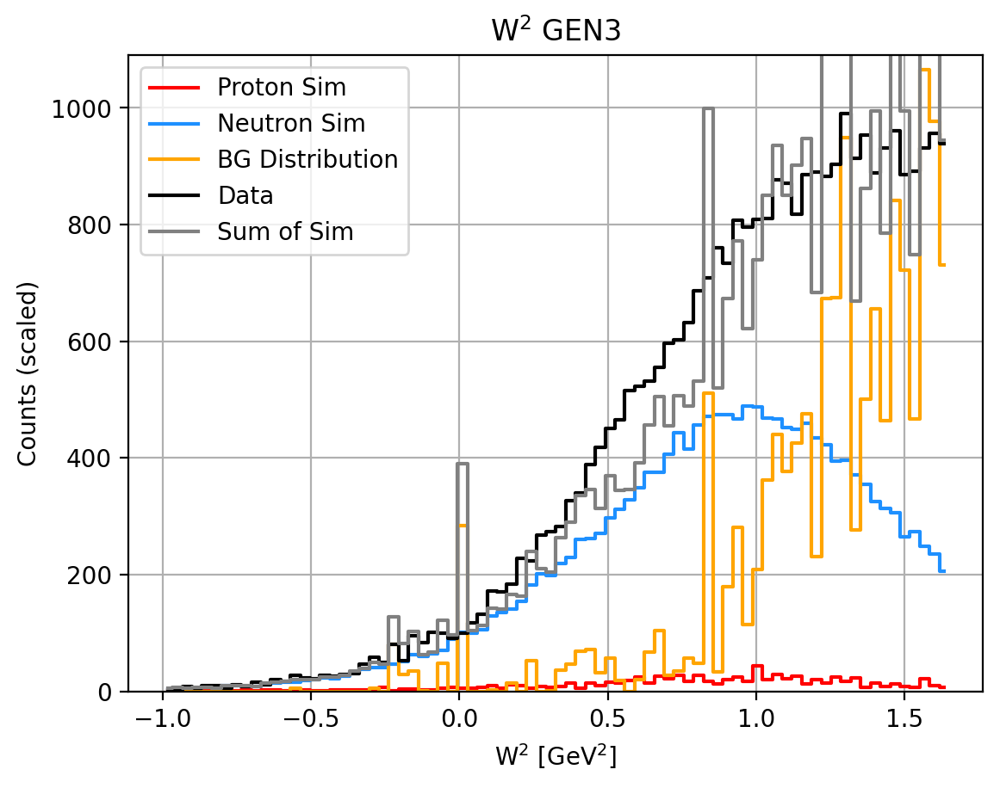

coinstuf: f,fe,A,Ae 0.02359272983942121 0.0009231899863315182 0.00747493163172288 0.009547387570714945
Total events in range (-0.5, 0.5):
  Sim Proton:   825.08
  Sim Neutron:  16882.64
  Background:   13809.85
  Total:        31876.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.03
   Background Fraction: 0.30
   Neutron Fraction: 0.66
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6121%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6187
tau_avg = 1.8984
Q2 = 6.7035
Px: 0.9899 Pz: -0.0347
A = 0.05894 ± 0.00803 ± 0.00165
B = 0.49349 (no propagated error)
C = 0.15362 ± 0.02465 ± 0.00507
__________________________________________________
N_plus: 16384 N_minus: 15149
A_raw: 0.0392+=0.0056
A_raw_weighted: 0.0398+-0.0056  14.0305%
__________________________________________________
A_phys_weighted: 0.181
A_phys_stat_error: 0.0246  13.6295%
A_phys_sys_error: 0.0051  2.803%
GE

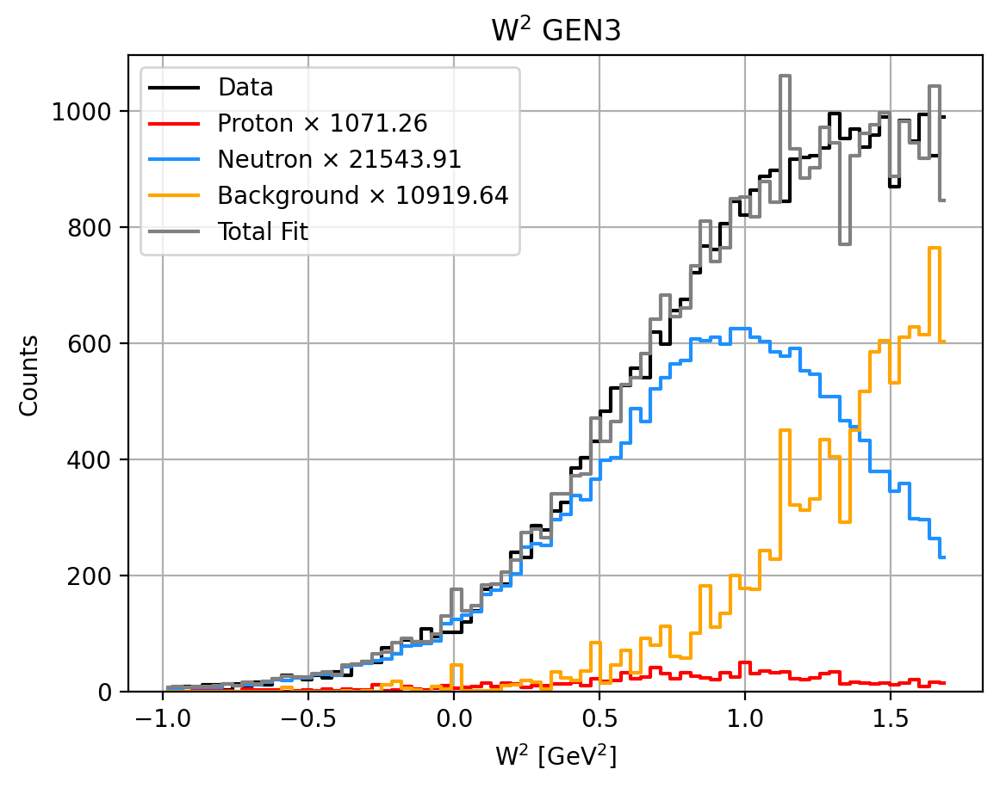

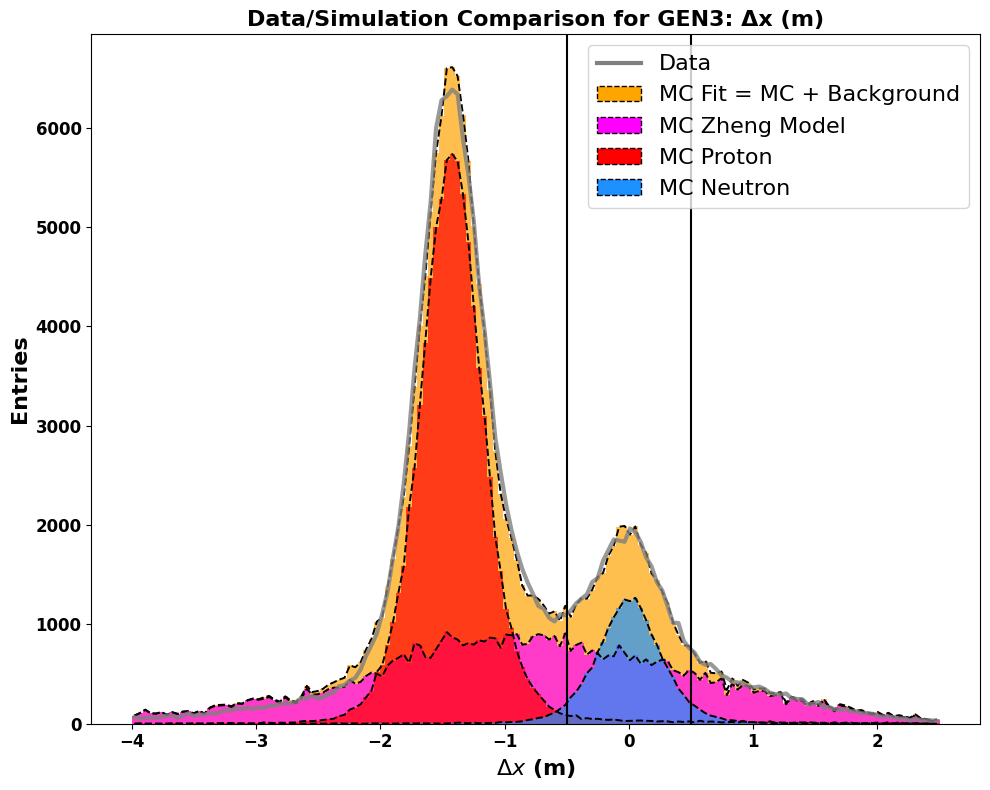

Total entries in fit: 167555.96782112308


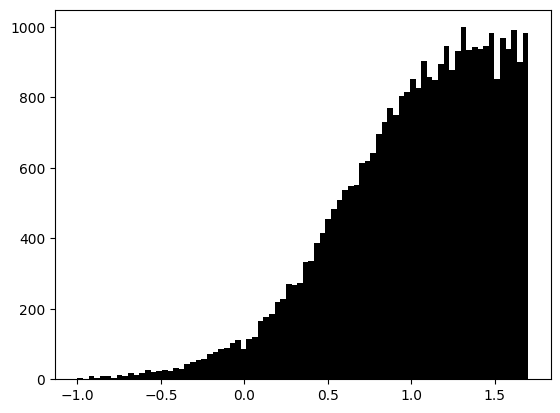

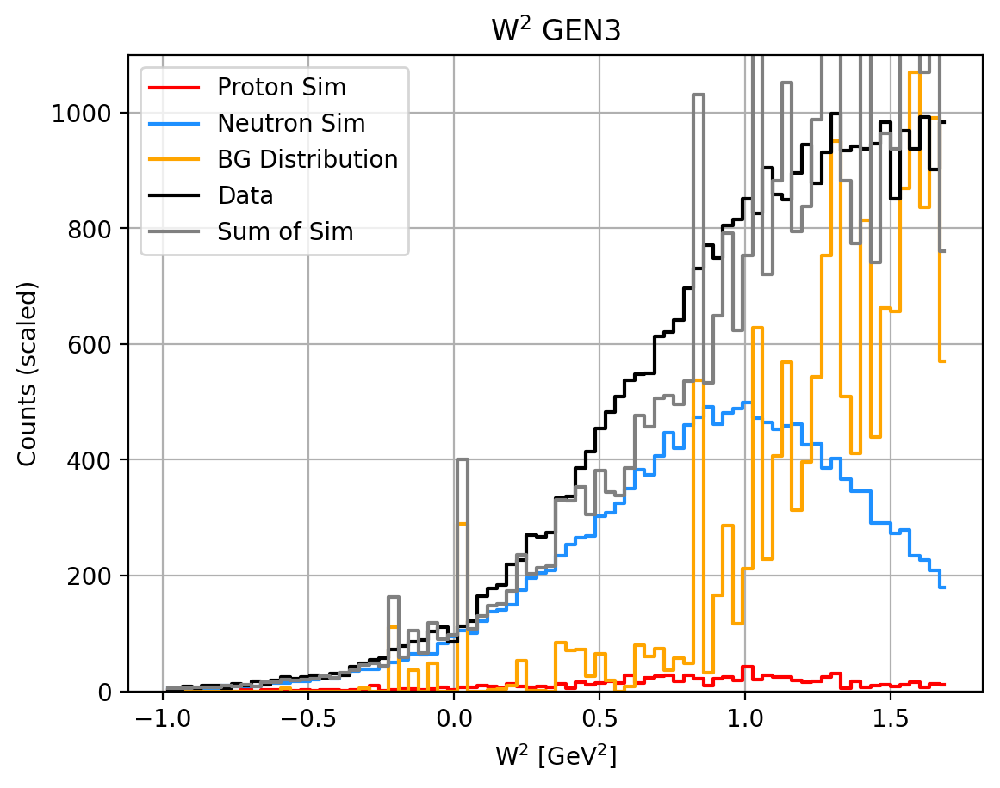

coinstuf: f,fe,A,Ae 0.024279236599891715 0.0009173461849650981 0.006338872708583176 0.009255106701672554
Total events in range (-0.5, 0.5):
  Sim Proton:   845.35
  Sim Neutron:  17000.77
  Background:   15152.73
  Total:        33265.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.03
   Background Fraction: 0.46
   Neutron Fraction: 0.51
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6114%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6197
tau_avg = 1.8924
Q2 = 6.6824
Px: 0.9899 Pz: -0.0337
A = 0.07299 ± 0.01008 ± 0.00212
B = 0.49403 (no propagated error)
C = 0.19643 ± 0.03078 ± 0.00648
__________________________________________________
N_plus: 17083 N_minus: 15822
A_raw: 0.0383+=0.0055
A_raw_weighted: 0.0387+-0.0055  14.1499%
__________________________________________________
A_phys_weighted: 0.223
A_phys_stat_error: 0.0308  13.8078%
A_phys_sys_error: 0.0065  2.906%


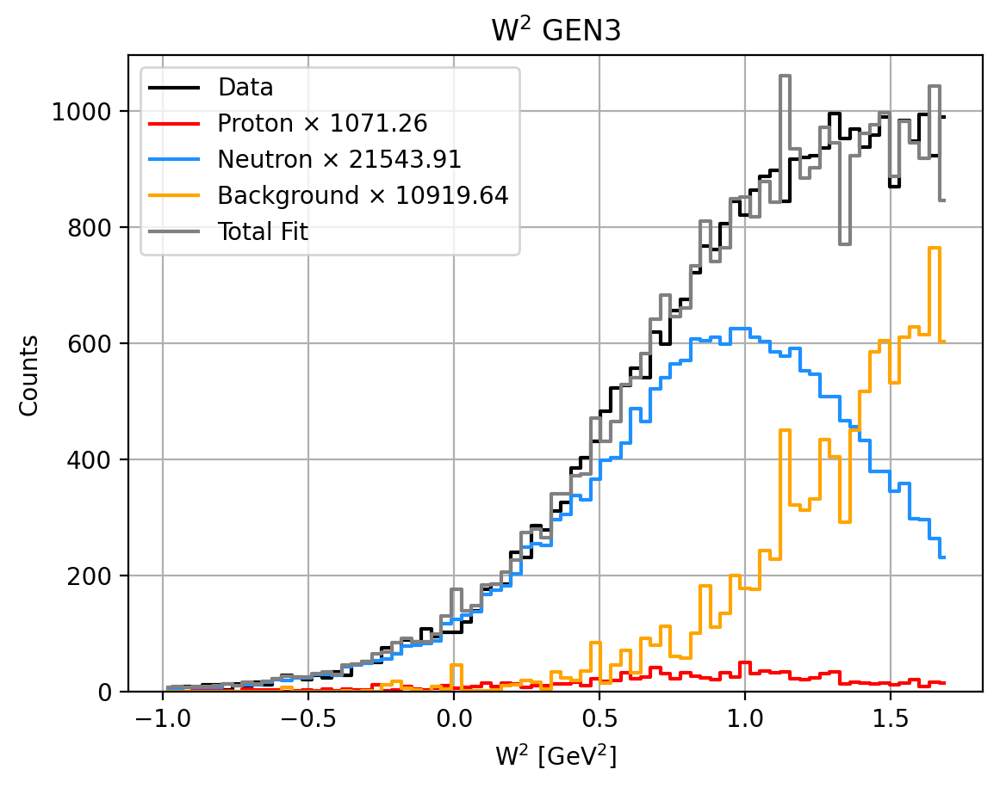

0.6743788614041518 0.0335330951200985 0.6408457662840533 0.32562113859584824


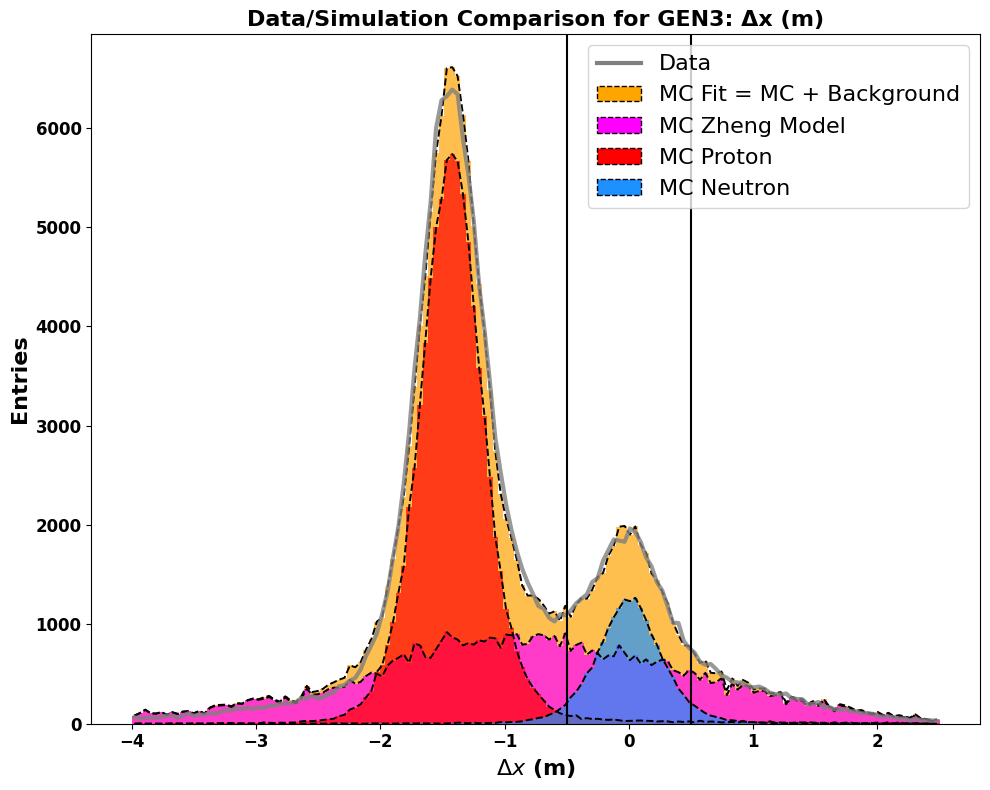

Total entries in fit: 167555.96782112308


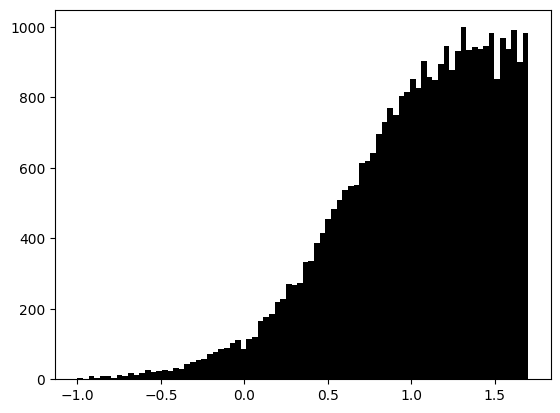

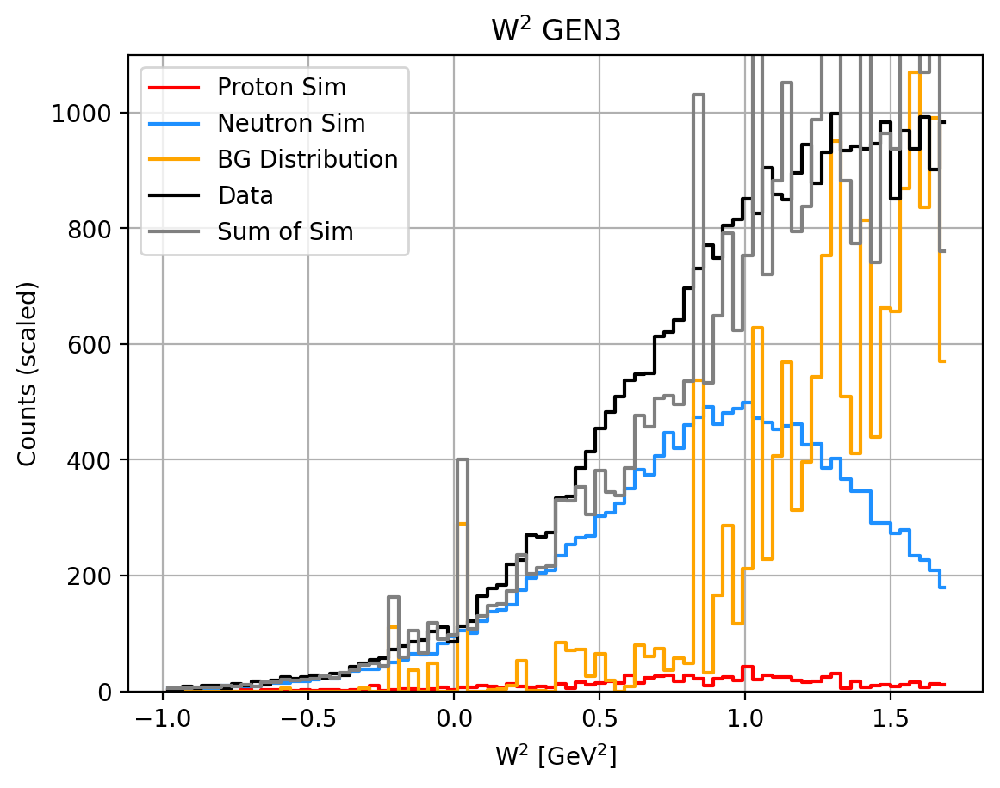

coinstuf: f,fe,A,Ae 0.024279236599891715 0.0009173461849650981 0.006338872708583176 0.009255106701672554
Total events in range (-0.5, 0.5):
  Sim Proton:   845.35
  Sim Neutron:  17000.77
  Background:   15152.73
  Total:        33265.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.03
   Background Fraction: 0.33
   Neutron Fraction: 0.64
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6114%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6197
tau_avg = 1.8924
Q2 = 6.6824
Px: 0.9899 Pz: -0.0337
A = 0.05912 ± 0.00816 ± 0.00167
B = 0.49403 (no propagated error)
C = 0.15408 ± 0.02493 ± 0.00509
__________________________________________________
N_plus: 17083 N_minus: 15822
A_raw: 0.0383+=0.0055
A_raw_weighted: 0.0387+-0.0055  14.1499%
__________________________________________________
A_phys_weighted: 0.181
A_phys_stat_error: 0.0249  13.8078%
A_phys_sys_error: 0.0051  2.819%


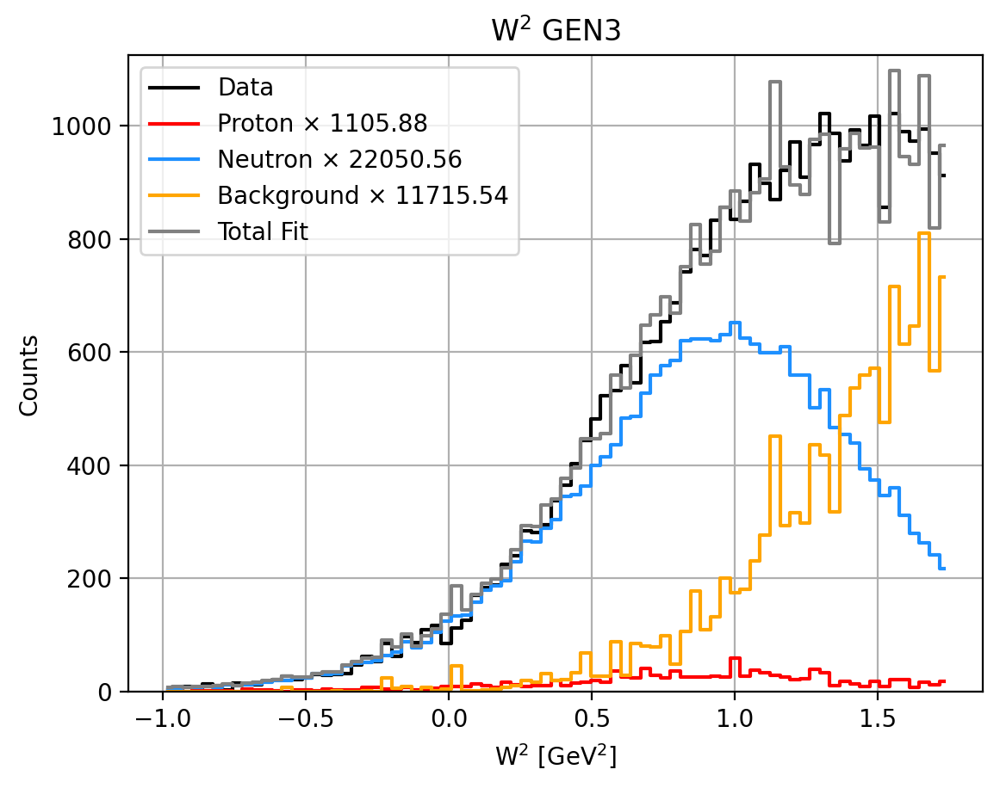

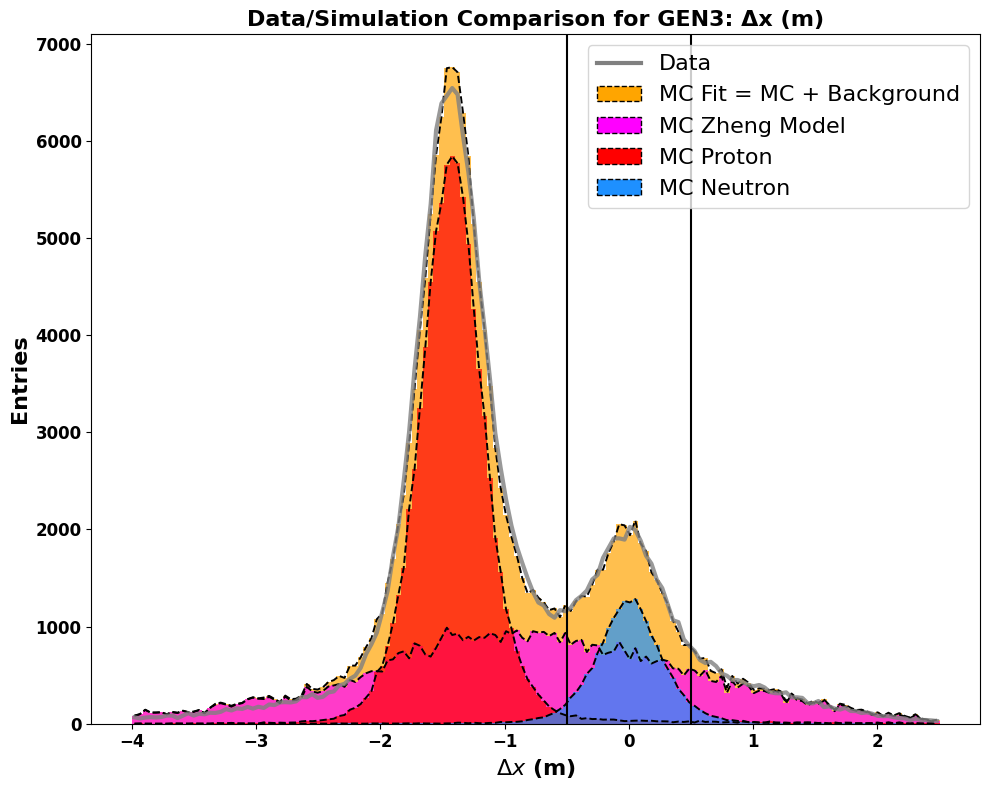

Total entries in fit: 173538.961797953


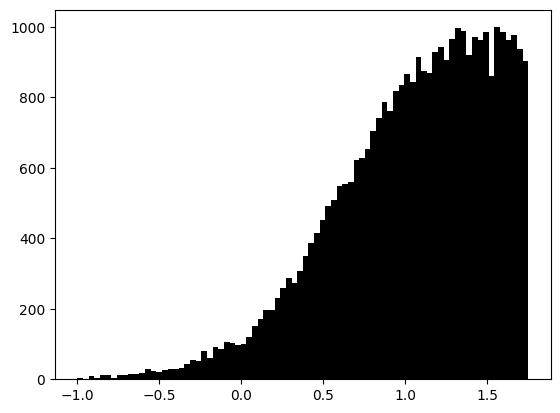

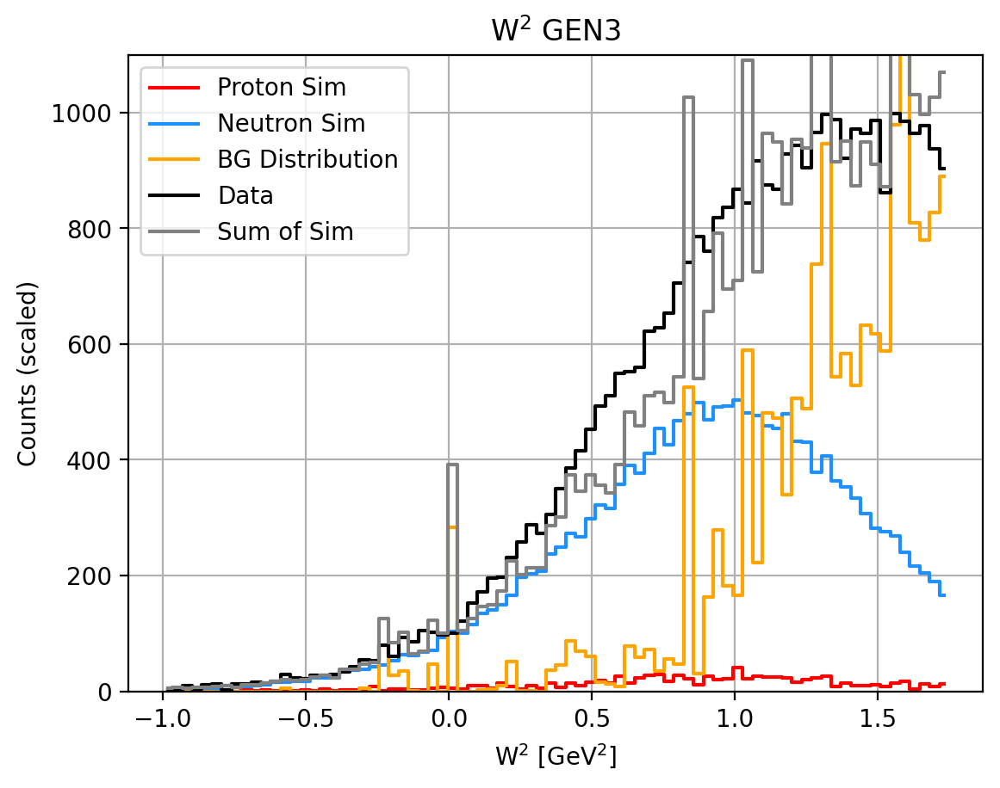

coinstuf: f,fe,A,Ae 0.024774407922598298 0.0009094269302427477 0.004852798447104497 0.008993223527918223
Total events in range (-0.5, 0.5):
  Sim Proton:   863.54
  Sim Neutron:  17218.33
  Background:   16203.10
  Total:        34568.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.02
   Background Fraction: 0.47
   Neutron Fraction: 0.50
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6114%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6205
tau_avg = 1.8869
Q2 = 6.6628
Px: 0.9899 Pz: -0.0329
A = 0.07560 ± 0.01018 ± 0.00220
B = 0.49454 (no propagated error)
C = 0.20408 ± 0.03095 ± 0.00670
__________________________________________________
N_plus: 17756 N_minus: 16441
A_raw: 0.0385+=0.0054
A_raw_weighted: 0.0387+-0.0054  13.8619%
__________________________________________________
A_phys_weighted: 0.23
A_phys_stat_error: 0.0310  13.4658%
A_phys_sys_error: 0.0067  2.916%
G

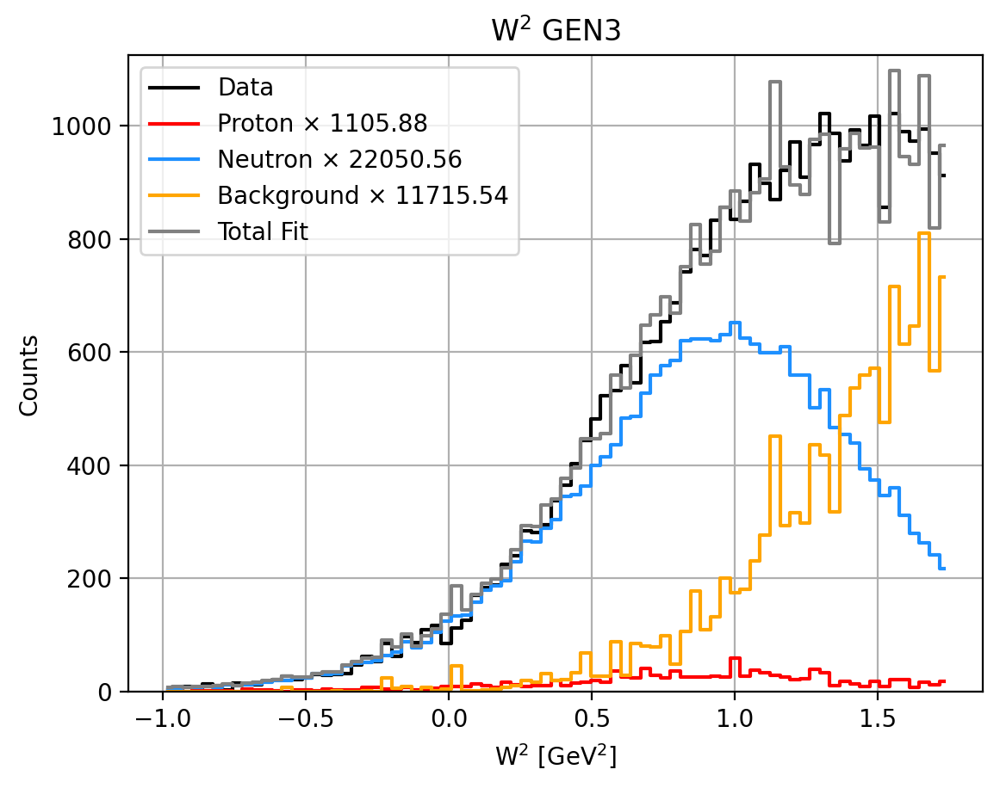

0.664041500921453 0.033303165704699746 0.6307383352167533 0.335958499078547


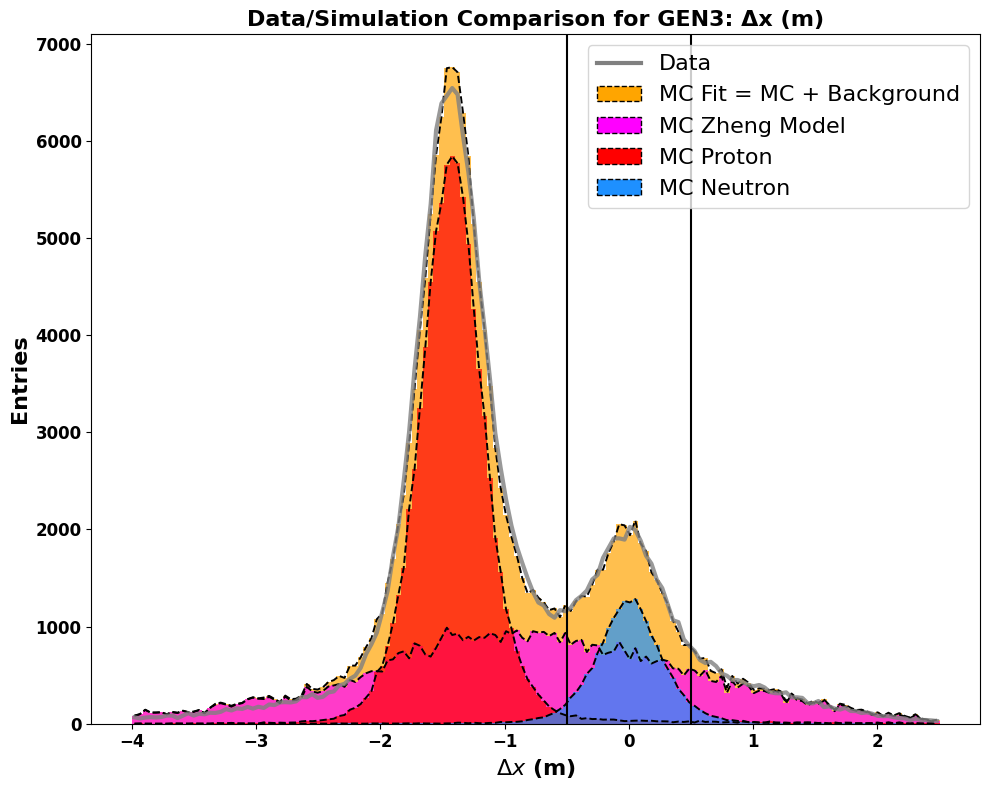

Total entries in fit: 173538.961797953


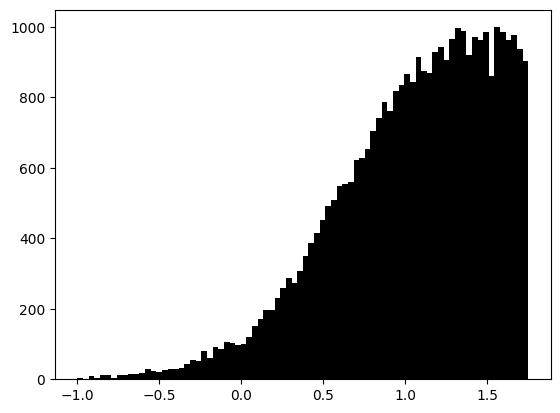

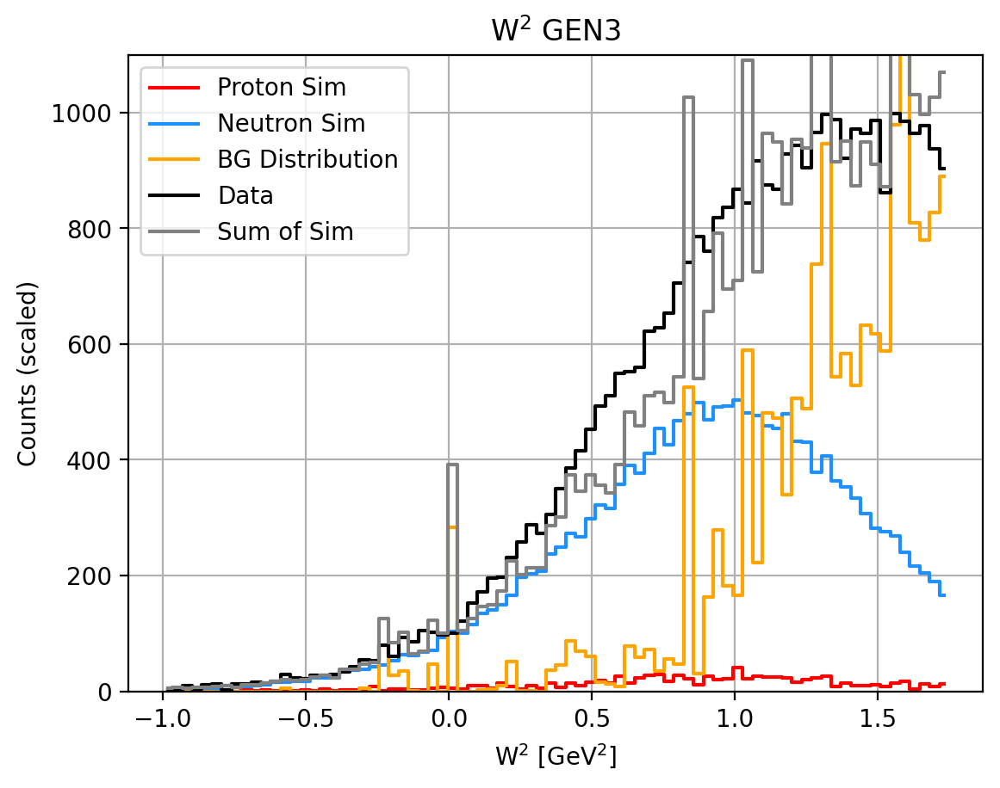

coinstuf: f,fe,A,Ae 0.024774407922598298 0.0009094269302427477 0.004852798447104497 0.008993223527918223
Total events in range (-0.5, 0.5):
  Sim Proton:   863.54
  Sim Neutron:  17218.33
  Background:   16203.10
  Total:        34568.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.03
   Background Fraction: 0.34
   Neutron Fraction: 0.63
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6114%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6205
tau_avg = 1.8869
Q2 = 6.6628
Px: 0.9899 Pz: -0.0329
A = 0.06068 ± 0.00817 ± 0.00171
B = 0.49454 (no propagated error)
C = 0.15873 ± 0.02485 ± 0.00521
__________________________________________________
N_plus: 17756 N_minus: 16441
A_raw: 0.0385+=0.0054
A_raw_weighted: 0.0387+-0.0054  13.8619%
__________________________________________________
A_phys_weighted: 0.185
A_phys_stat_error: 0.0248  13.4659%
A_phys_sys_error: 0.0052  2.823%


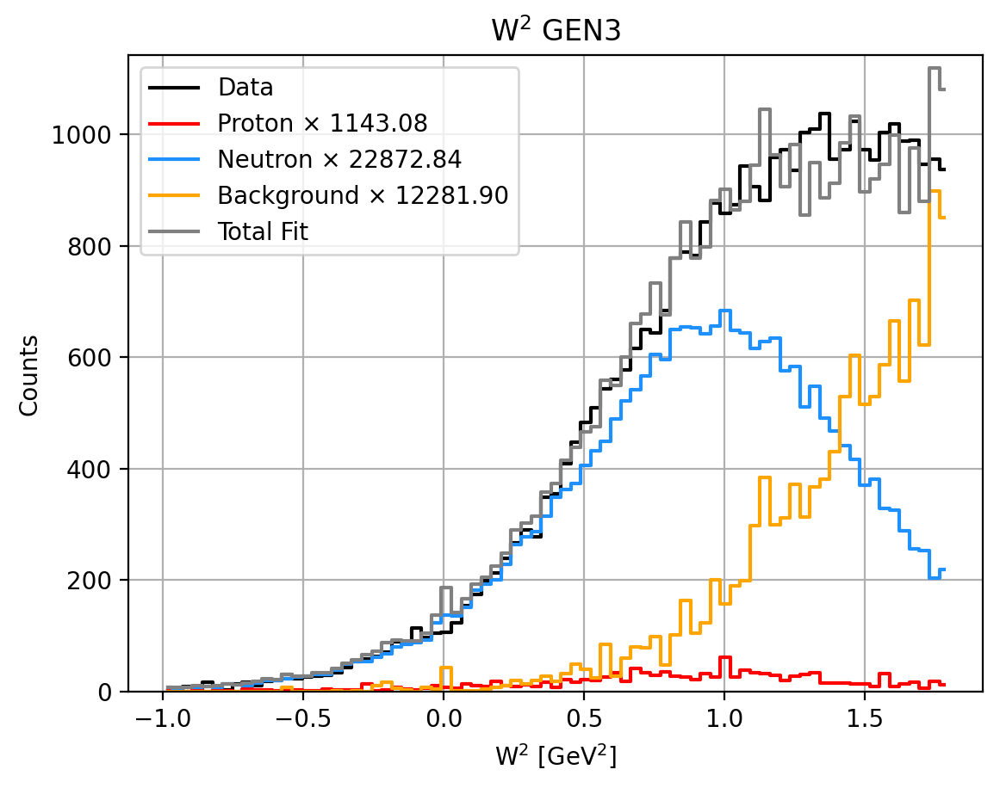

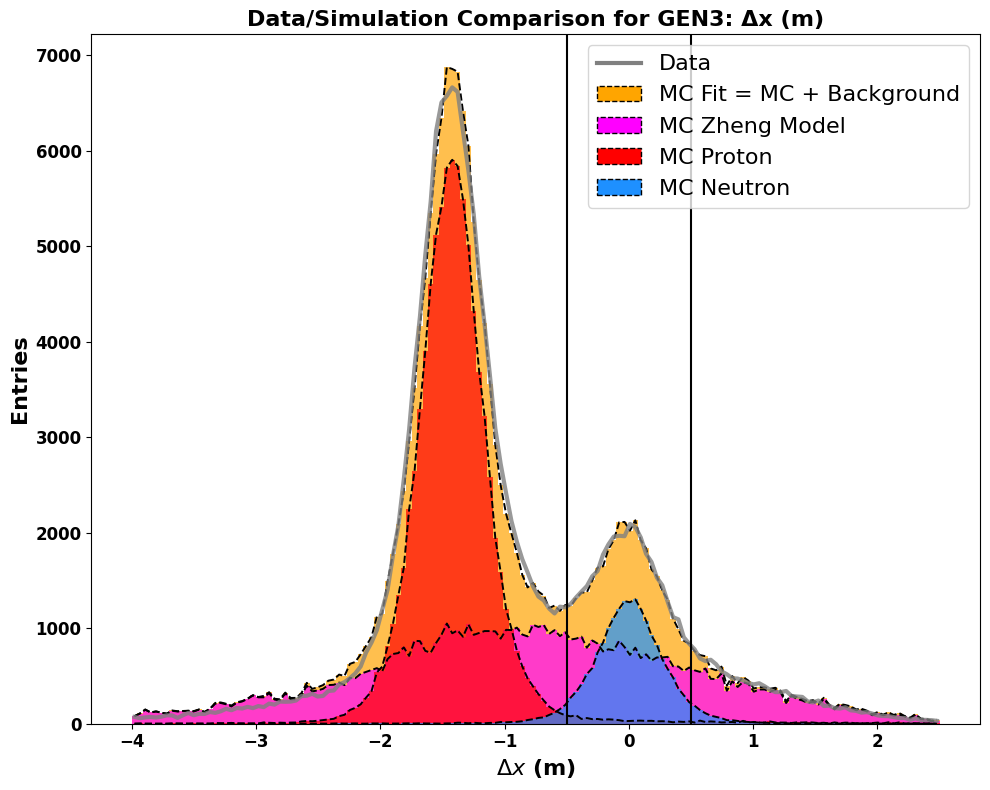

Total entries in fit: 179378.86038795975


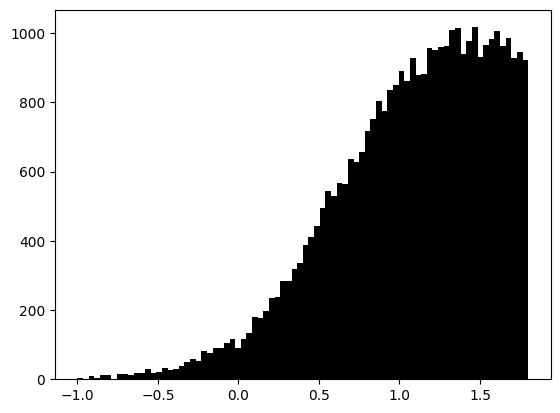

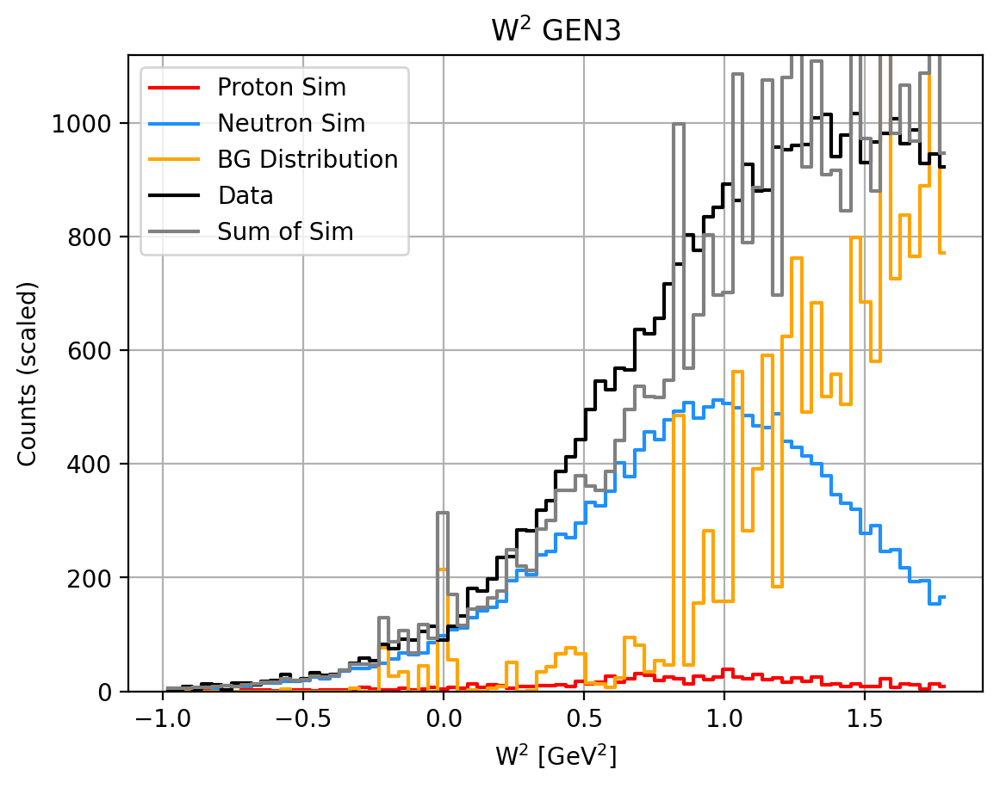

coinstuf: f,fe,A,Ae 0.02507846829880728 0.0008982685072295481 0.0050427872860635695 0.00874093387413973
Total events in range (-0.5, 0.5):
  Sim Proton:   877.44
  Sim Neutron:  17557.44
  Background:   17194.37
  Total:        35888.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.02
   Background Fraction: 0.48
   Neutron Fraction: 0.49
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6111%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6214
tau_avg = 1.8814
Q2 = 6.6433
Px: 0.9899 Pz: -0.0320
A = 0.07322 ± 0.01023 ± 0.00215
B = 0.49505 (no propagated error)
C = 0.19661 ± 0.03099 ± 0.00650
__________________________________________________
N_plus: 18397 N_minus: 17107
A_raw: 0.0363+=0.0053
A_raw_weighted: 0.0366+-0.0053  14.3895%
__________________________________________________
A_phys_weighted: 0.222
A_phys_stat_error: 0.0310  13.9789%
A_phys_sys_error: 0.0065  2.934%
G

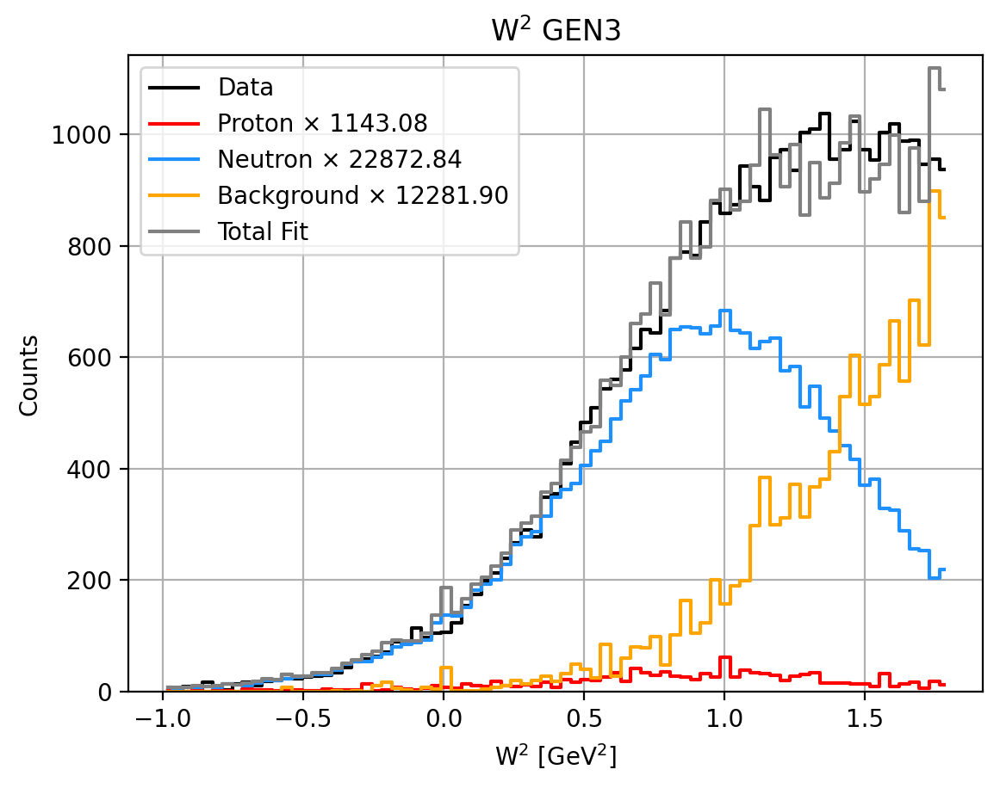

0.6616353427245746 0.033065371621437134 0.6285699711031374 0.3383646572754255


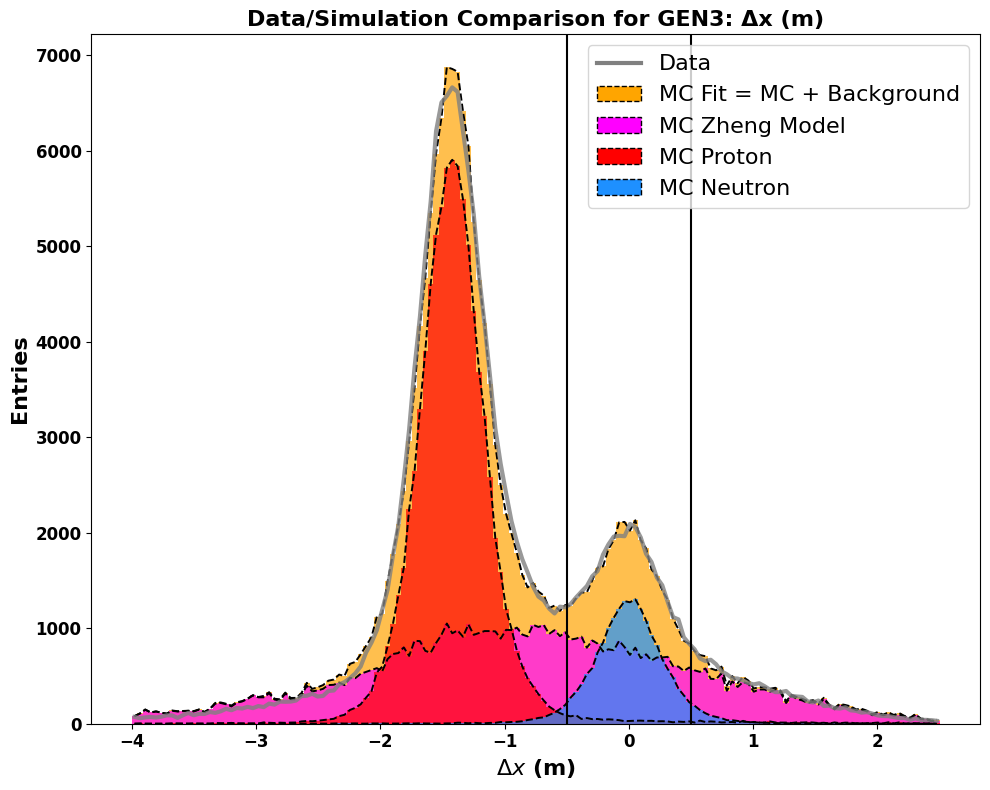

Total entries in fit: 179378.86038795975


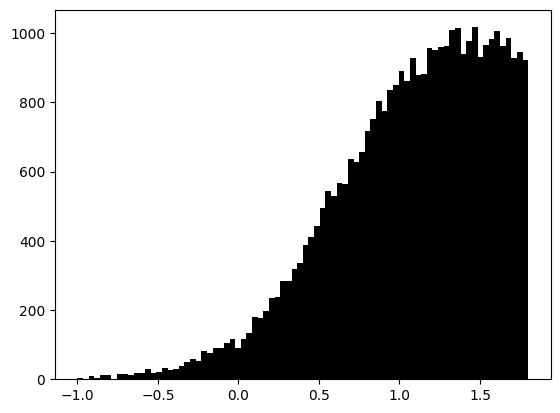

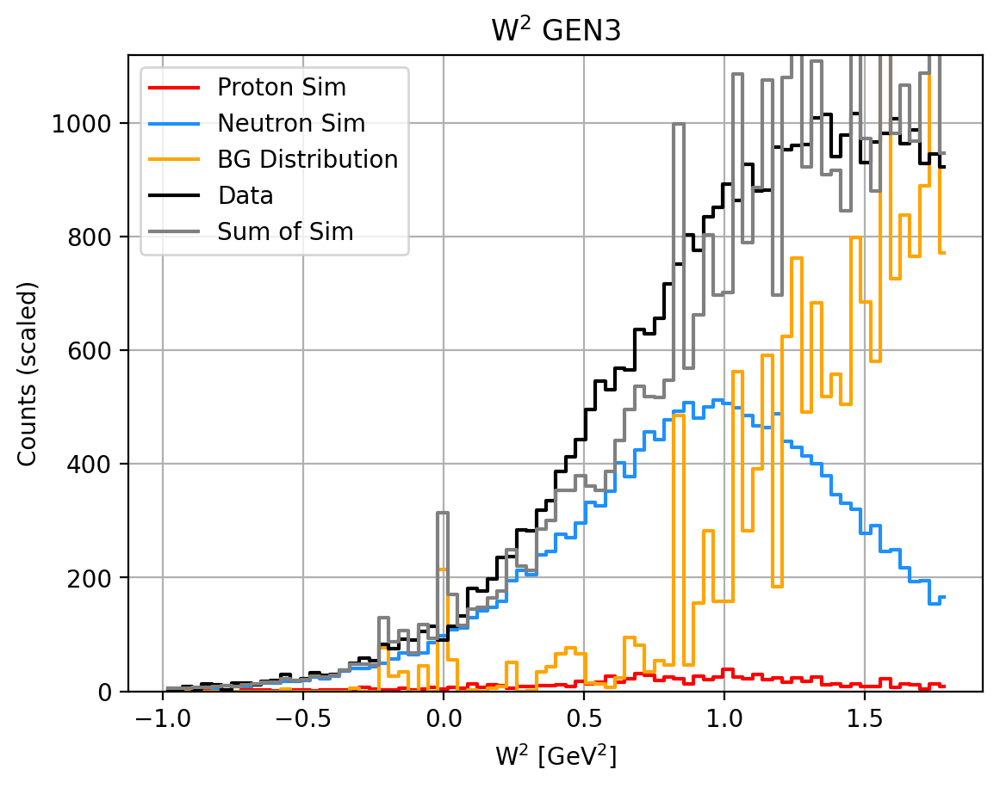

coinstuf: f,fe,A,Ae 0.02507846829880728 0.0008982685072295481 0.0050427872860635695 0.00874093387413973
Total events in range (-0.5, 0.5):
  Sim Proton:   877.44
  Sim Neutron:  17557.44
  Background:   17194.37
  Total:        35888.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.03
   Background Fraction: 0.34
   Neutron Fraction: 0.63
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6111%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6214
tau_avg = 1.8814
Q2 = 6.6433
Px: 0.9899 Pz: -0.0320
A = 0.05782 ± 0.00808 ± 0.00164
B = 0.49505 (no propagated error)
C = 0.15001 ± 0.02447 ± 0.00495
__________________________________________________
N_plus: 18397 N_minus: 17107
A_raw: 0.0363+=0.0053
A_raw_weighted: 0.0366+-0.0053  14.3895%
__________________________________________________
A_phys_weighted: 0.175
A_phys_stat_error: 0.0245  13.9790%
A_phys_sys_error: 0.0050  2.83%
GE

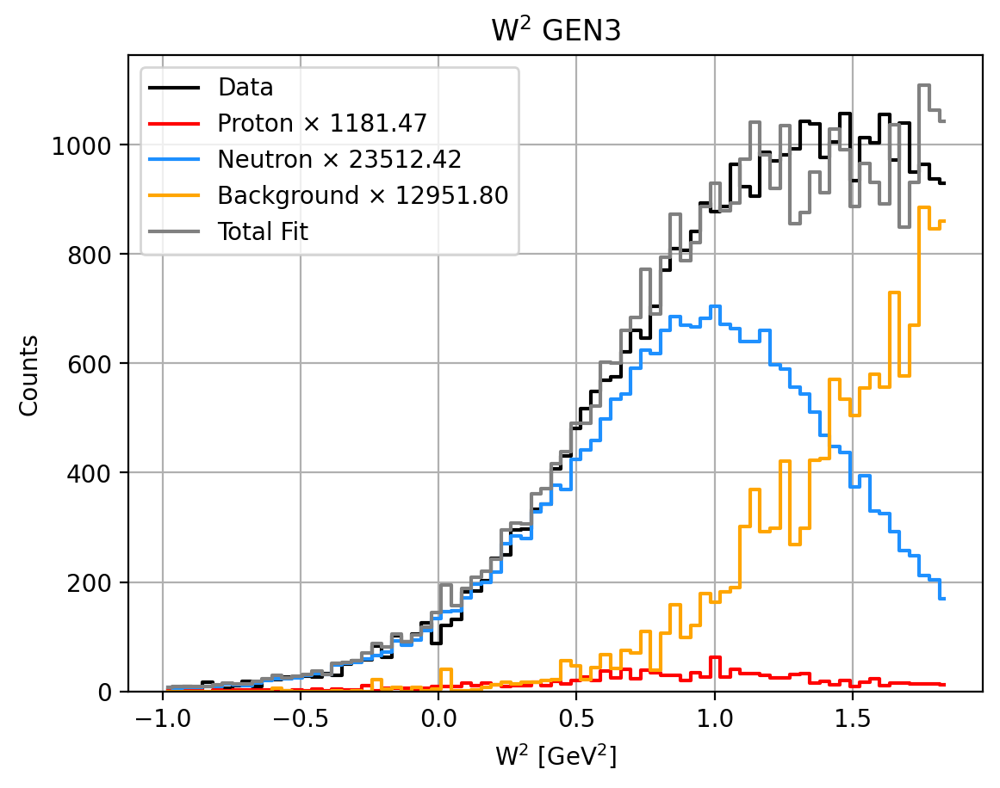

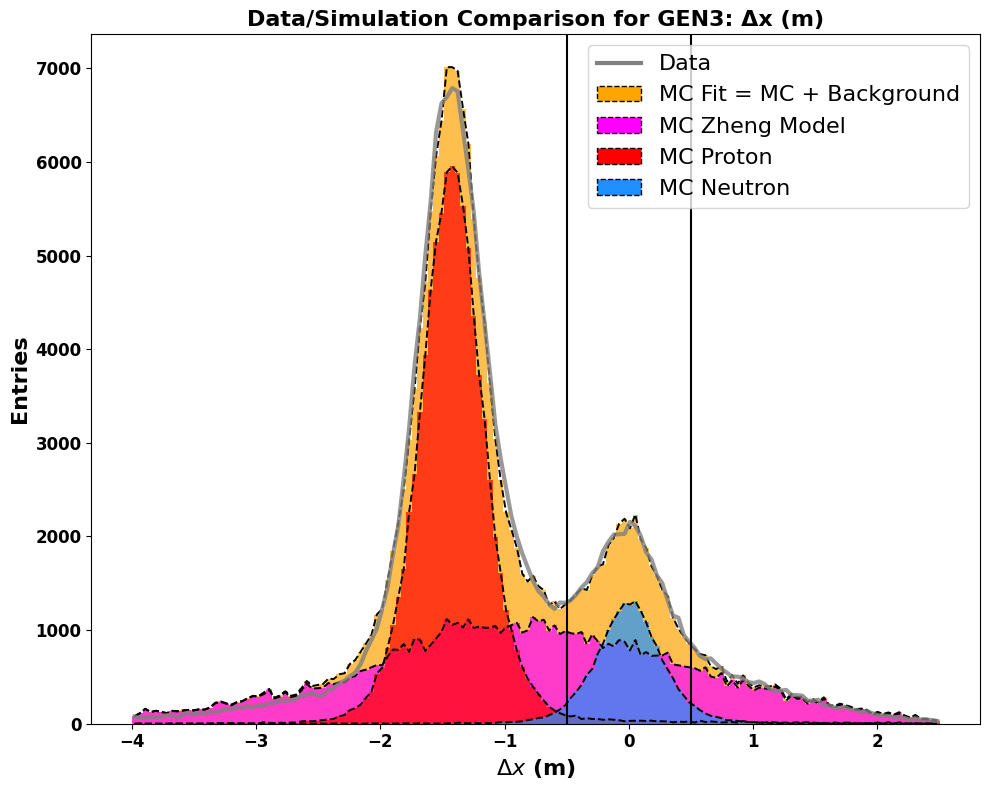

Total entries in fit: 185305.91530493723


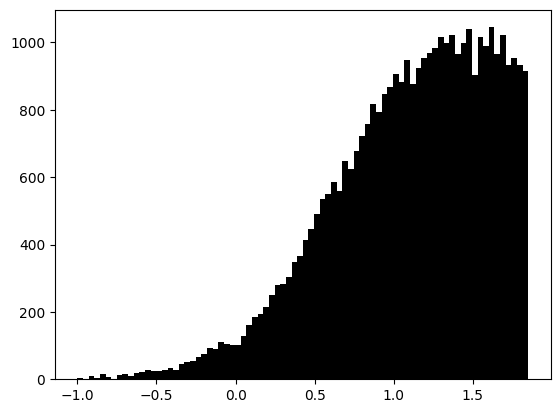

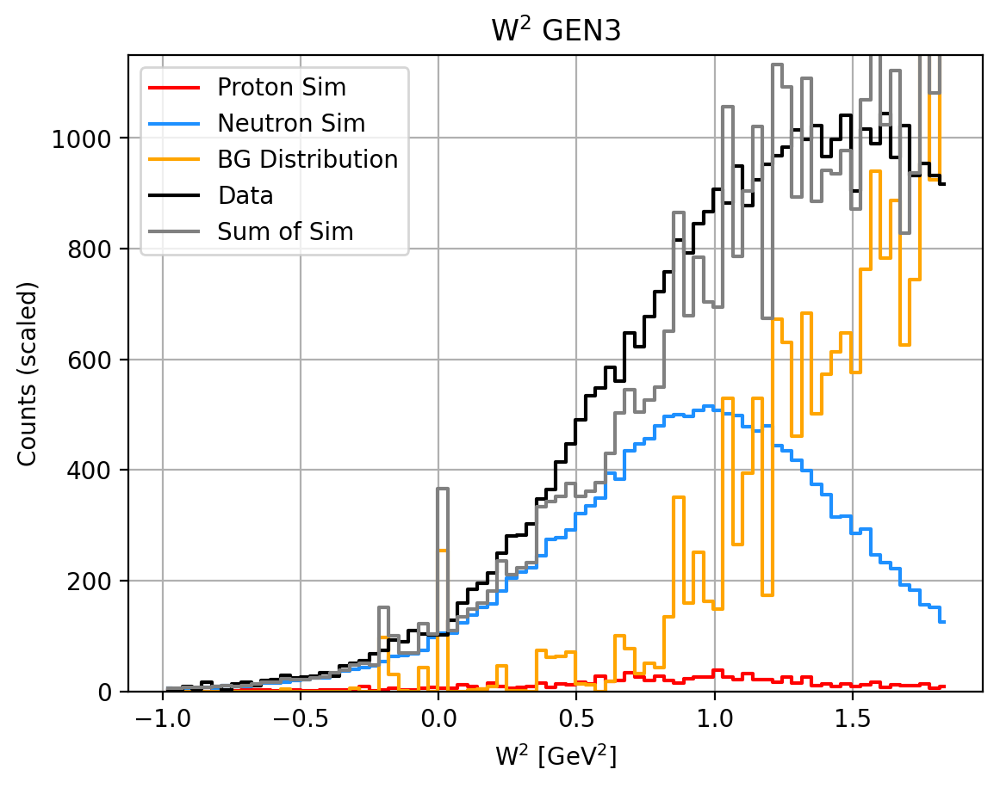

coinstuf: f,fe,A,Ae 0.02569817156372237 0.0008940095569329616 0.005575266092245312 0.008509042396523168
Total events in range (-0.5, 0.5):
  Sim Proton:   885.10
  Sim Neutron:  17614.36
  Background:   18427.69
  Total:        37171.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.02
   Background Fraction: 0.50
   Neutron Fraction: 0.47
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6107%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6223
tau_avg = 1.8759
Q2 = 6.6241
Px: 0.9899 Pz: -0.0311
A = 0.07415 ± 0.01043 ± 0.00219
B = 0.49555 (no propagated error)
C = 0.19916 ± 0.03146 ± 0.00661
__________________________________________________
N_plus: 19044 N_minus: 17740
A_raw: 0.0355+=0.0052
A_raw_weighted: 0.0358+-0.0052  14.4498%
__________________________________________________
A_phys_weighted: 0.224
A_phys_stat_error: 0.0315  14.0727%
A_phys_sys_error: 0.0066  2.957%
G

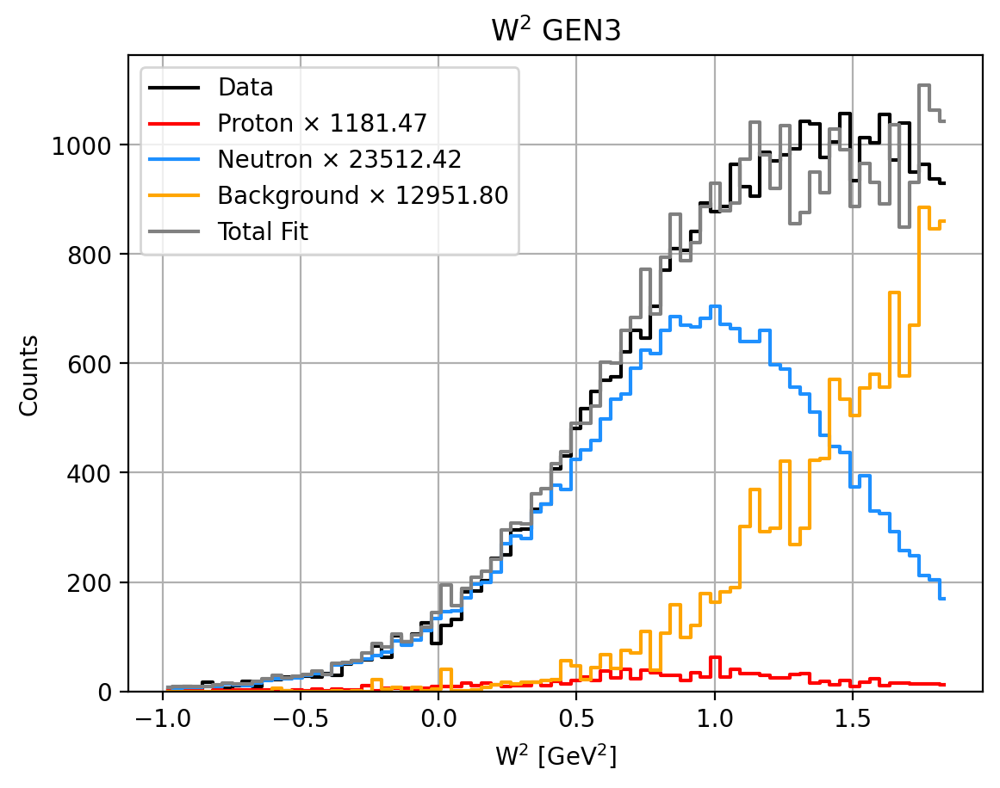

0.6559552773805577 0.032960834259092915 0.6229944431214648 0.34404472261944224


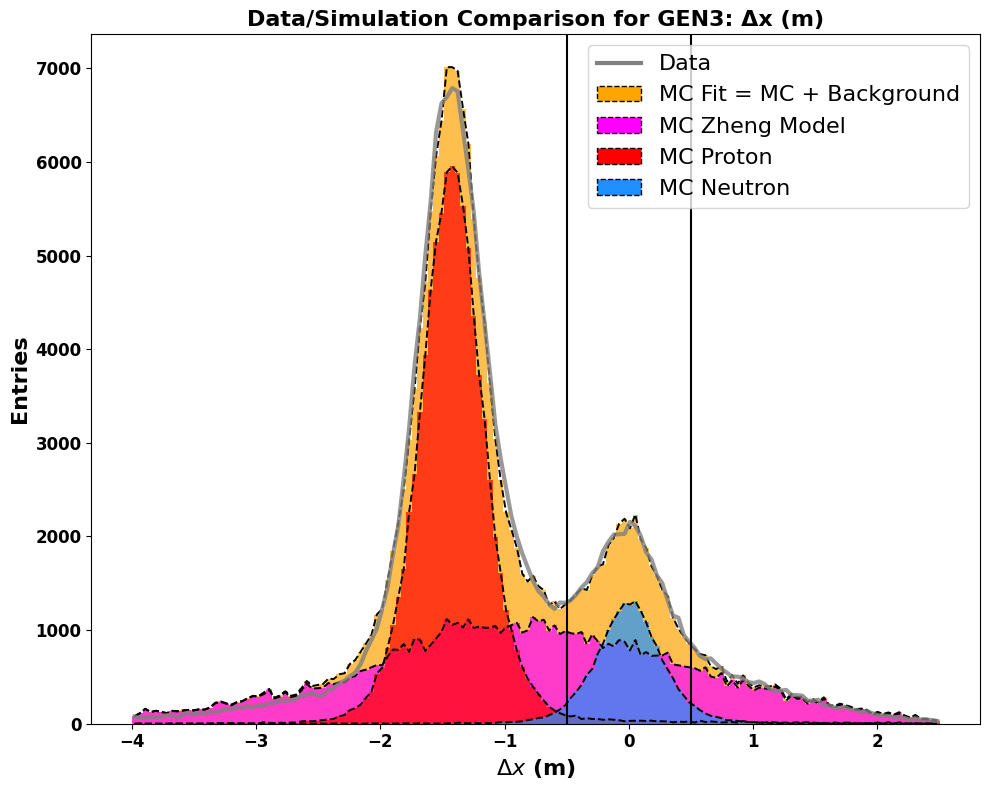

Total entries in fit: 185305.91530493723


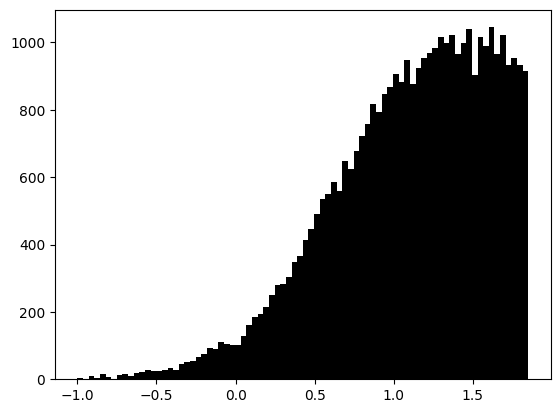

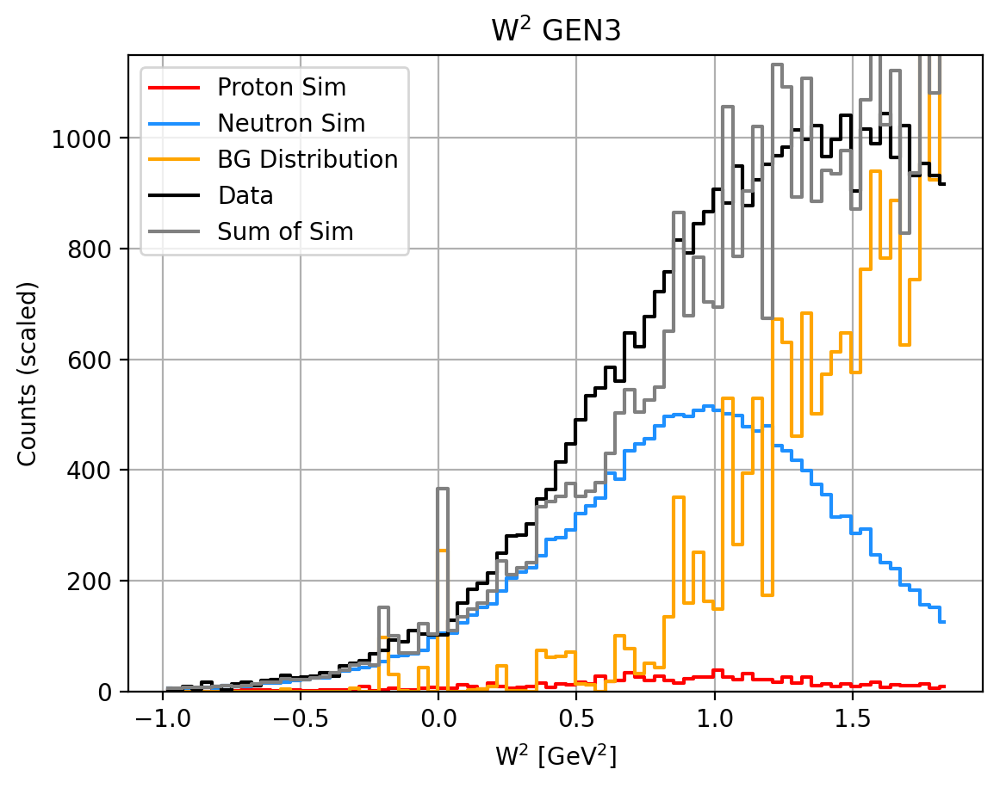

coinstuf: f,fe,A,Ae 0.02569817156372237 0.0008940095569329616 0.005575266092245312 0.008509042396523168
Total events in range (-0.5, 0.5):
  Sim Proton:   885.10
  Sim Neutron:  17614.36
  Background:   18427.69
  Total:        37171.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.03
   Background Fraction: 0.34
   Neutron Fraction: 0.62
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6107%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6223
tau_avg = 1.8759
Q2 = 6.6241
Px: 0.9899 Pz: -0.0311
A = 0.05718 ± 0.00805 ± 0.00162
B = 0.49555 (no propagated error)
C = 0.14801 ± 0.02426 ± 0.00489
__________________________________________________
N_plus: 19044 N_minus: 17740
A_raw: 0.0355+=0.0052
A_raw_weighted: 0.0358+-0.0052  14.4498%
__________________________________________________
A_phys_weighted: 0.172
A_phys_stat_error: 0.0243  14.0727%
A_phys_sys_error: 0.0049  2.837%
G

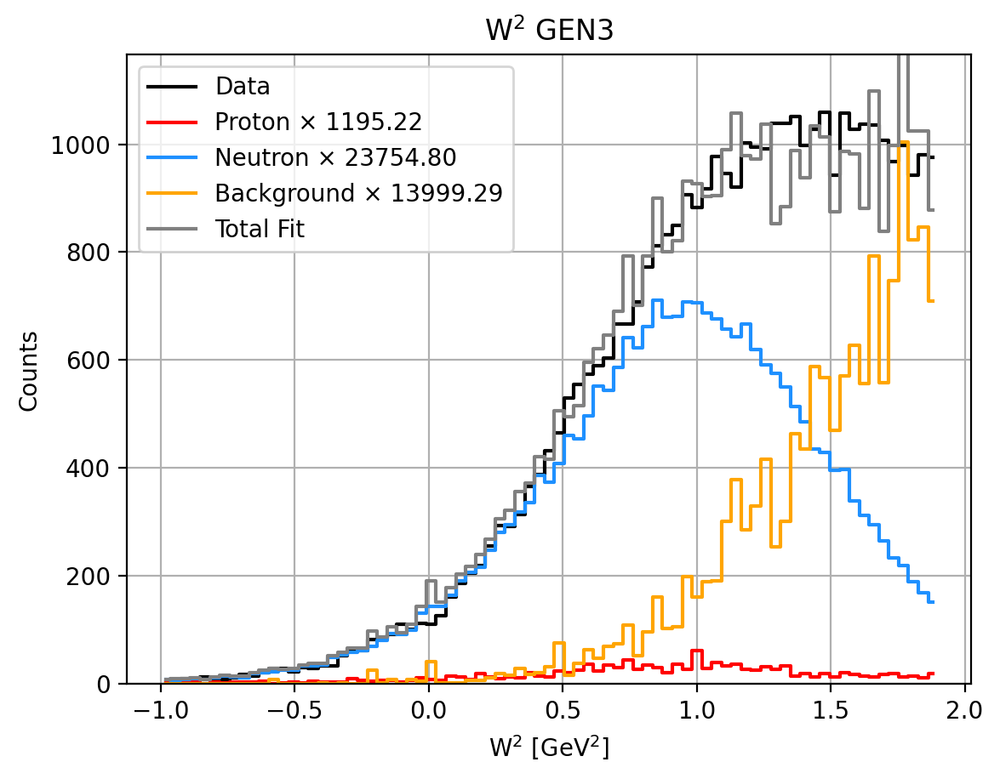

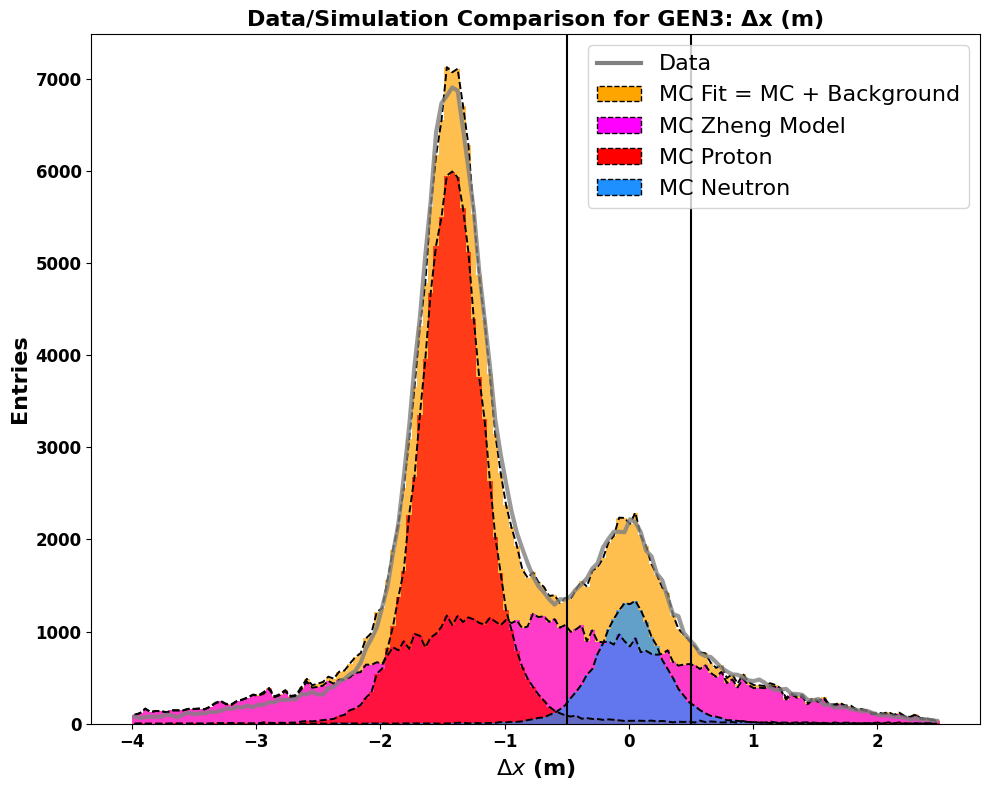

Total entries in fit: 190938.50599668772


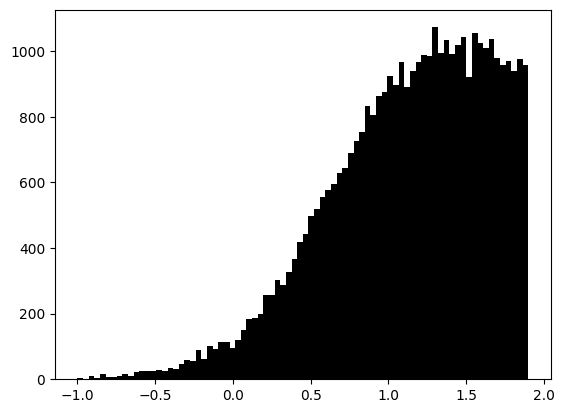

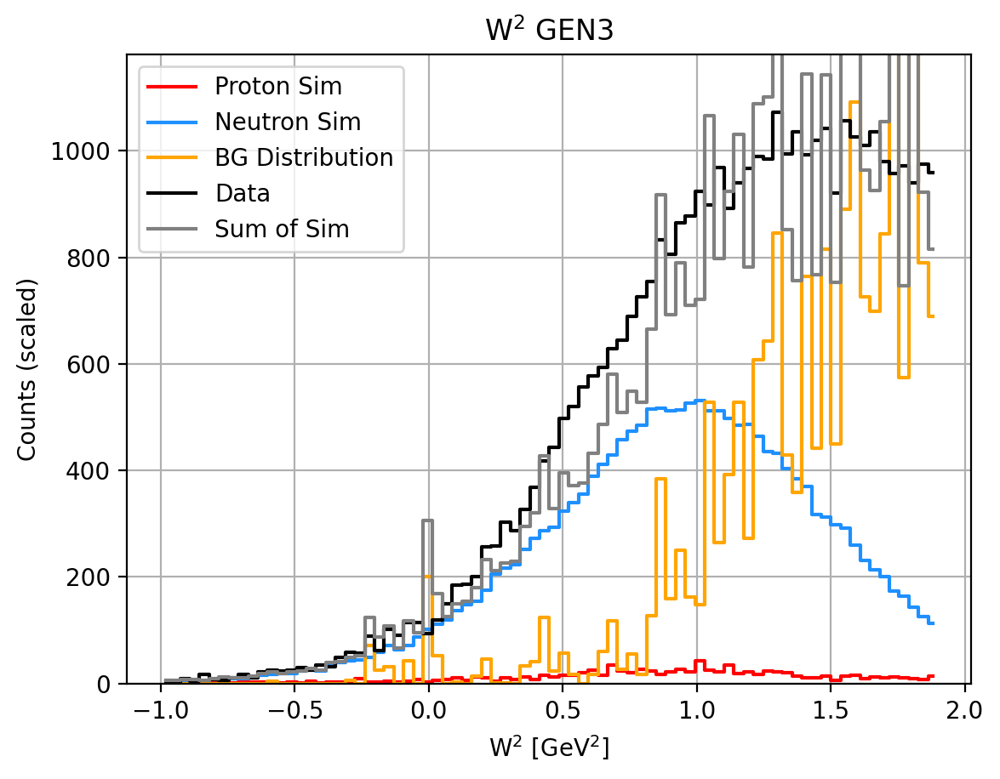

coinstuf: f,fe,A,Ae 0.025998360463754536 0.0008837161897870554 0.005150037766943625 0.008286455754674679
Total events in range (-0.5, 0.5):
  Sim Proton:   903.42
  Sim Neutron:  17955.41
  Background:   19367.71
  Total:        38515.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.02
   Background Fraction: 0.50
   Neutron Fraction: 0.47
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6107%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6232
tau_avg = 1.8703
Q2 = 6.6043
Px: 0.9899 Pz: -0.0302
A = 0.07051 ± 0.01045 ± 0.00210
B = 0.49608 (no propagated error)
C = 0.18797 ± 0.03135 ± 0.00630
__________________________________________________
N_plus: 19693 N_minus: 18429
A_raw: 0.0332+=0.0051
A_raw_weighted: 0.0334+-0.0051  15.2189%
__________________________________________________
A_phys_weighted: 0.212
A_phys_stat_error: 0.0313  14.8144%
A_phys_sys_error: 0.0063  2.978%


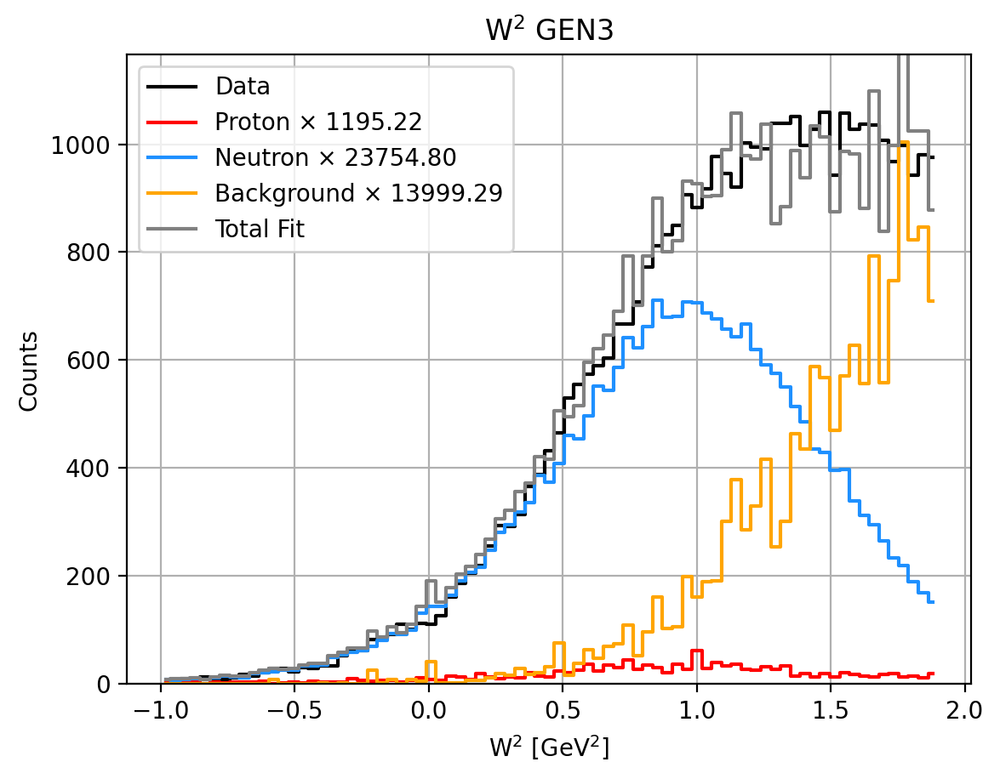

0.6405766794026511 0.0322304413590689 0.6083462380435821 0.3594233205973489


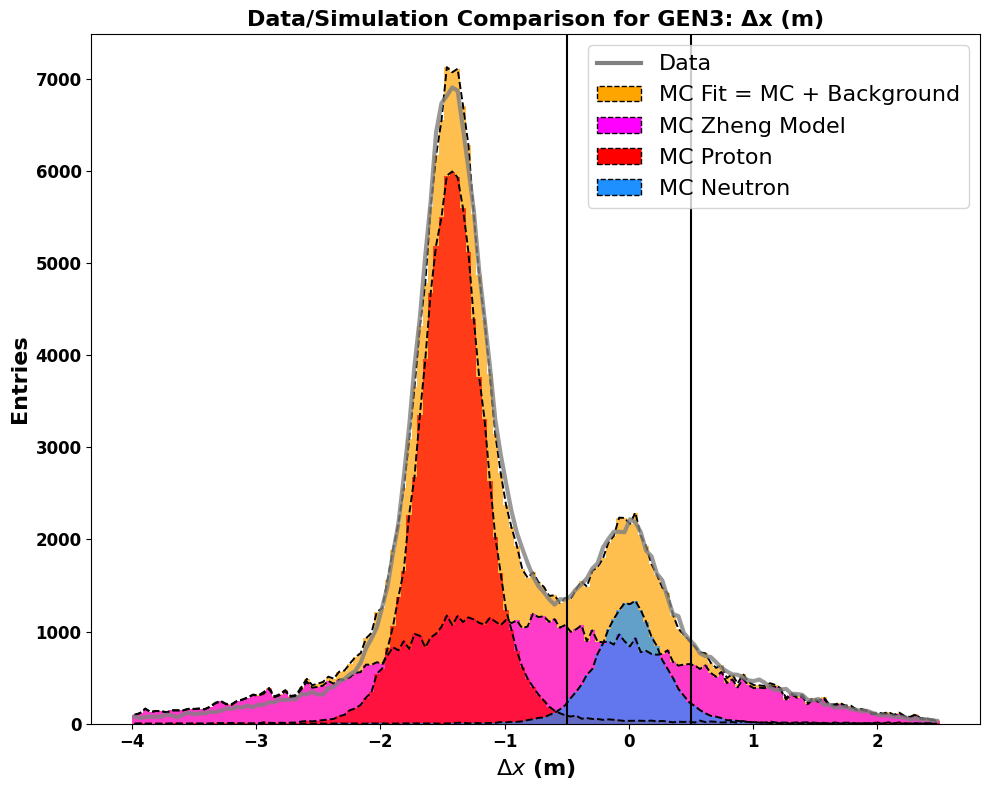

Total entries in fit: 190938.50599668772


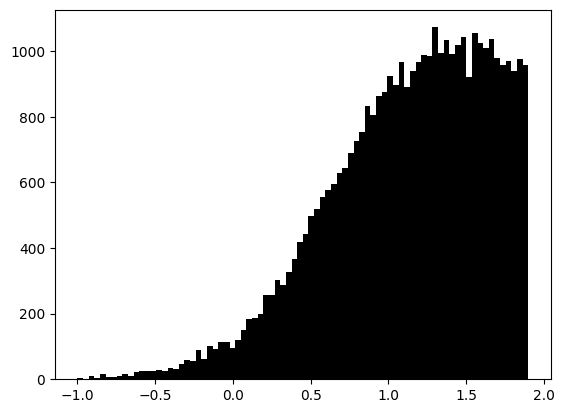

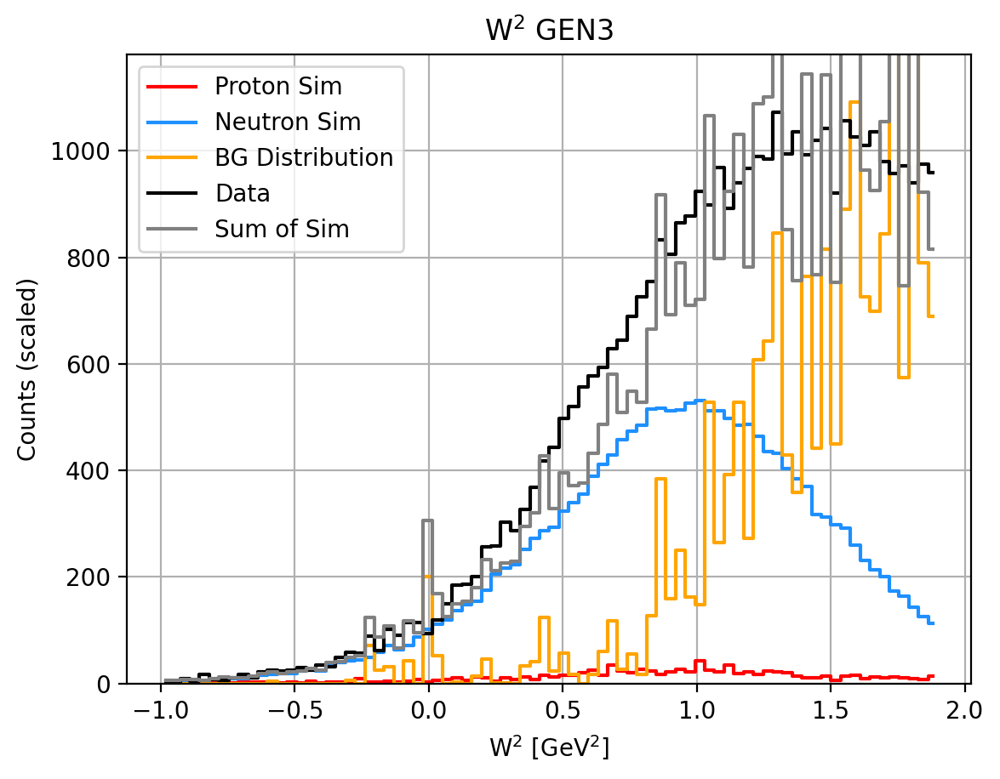

coinstuf: f,fe,A,Ae 0.025998360463754536 0.0008837161897870554 0.005150037766943625 0.008286455754674679
Total events in range (-0.5, 0.5):
  Sim Proton:   903.42
  Sim Neutron:  17955.41
  Background:   19367.71
  Total:        38515.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.03
   Background Fraction: 0.36
   Neutron Fraction: 0.61
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6107%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6232
tau_avg = 1.8703
Q2 = 6.6043
Px: 0.9899 Pz: -0.0302
A = 0.05490 ± 0.00813 ± 0.00157
B = 0.49608 (no propagated error)
C = 0.14112 ± 0.02441 ± 0.00471
__________________________________________________
N_plus: 19693 N_minus: 18429
A_raw: 0.0332+=0.0051
A_raw_weighted: 0.0334+-0.0051  15.2189%
__________________________________________________
A_phys_weighted: 0.165
A_phys_stat_error: 0.0244  14.8145%
A_phys_sys_error: 0.0047  2.855%


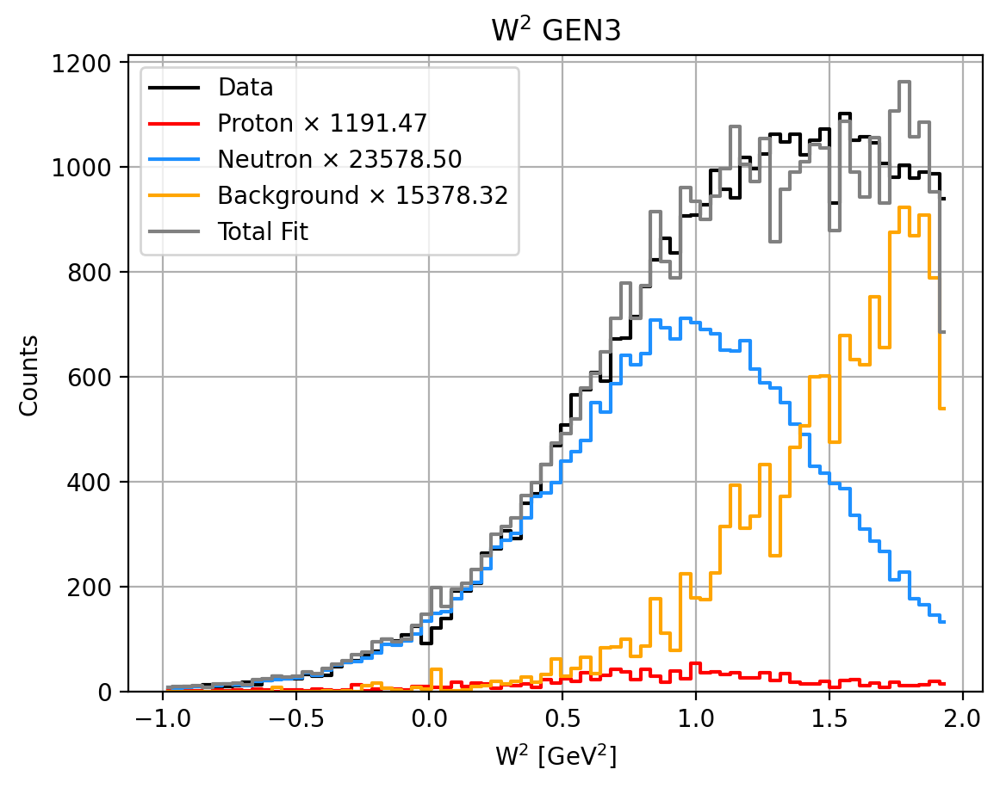

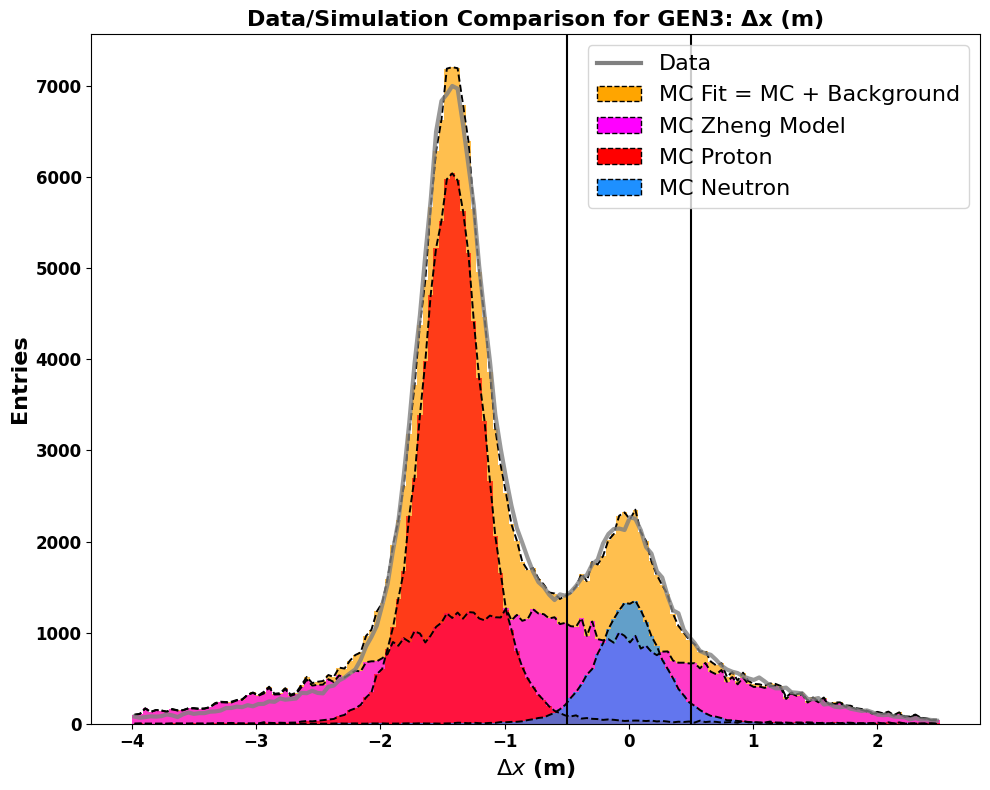

Total entries in fit: 196367.12519425768


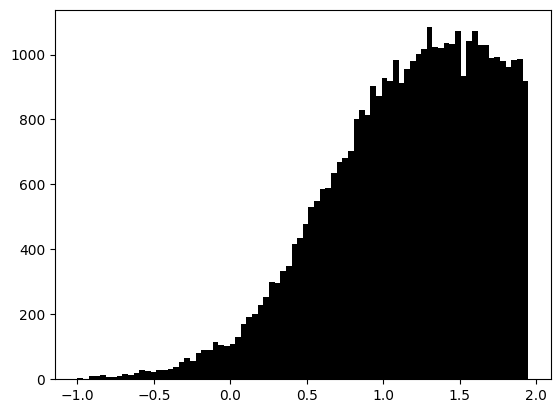

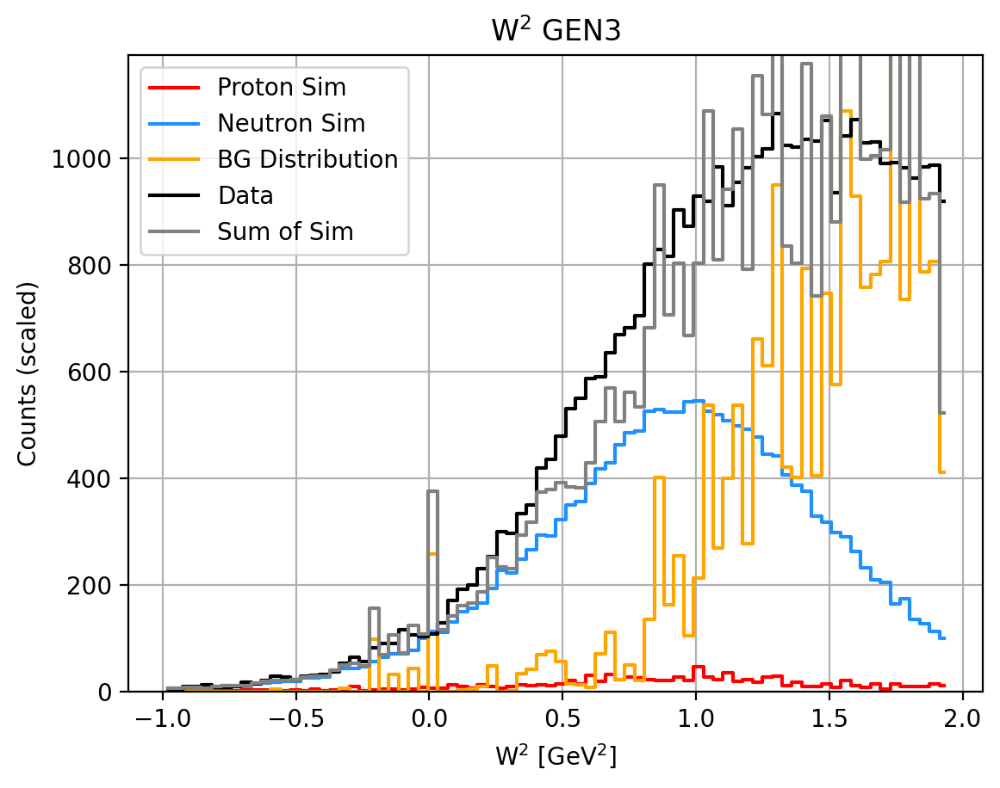

coinstuf: f,fe,A,Ae 0.02673281360737066 0.0008820994370751889 0.005809778706181865 0.008079369347433491
Total events in range (-0.5, 0.5):
  Sim Proton:   919.23
  Sim Neutron:  18191.09
  Background:   20367.91
  Total:        39783.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.02
   Background Fraction: 0.51
   Neutron Fraction: 0.46
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6111%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6240
tau_avg = 1.8650
Q2 = 6.5854
Px: 0.9900 Pz: -0.0294
A = 0.07133 ± 0.01052 ± 0.00213
B = 0.49657 (no propagated error)
C = 0.19019 ± 0.03144 ± 0.00637
__________________________________________________
N_plus: 20337 N_minus: 19043
A_raw: 0.0329+=0.0050
A_raw_weighted: 0.0331+-0.0050  15.1088%
__________________________________________________
A_phys_weighted: 0.213
A_phys_stat_error: 0.0314  14.7467%
A_phys_sys_error: 0.0064  2.99%
GE

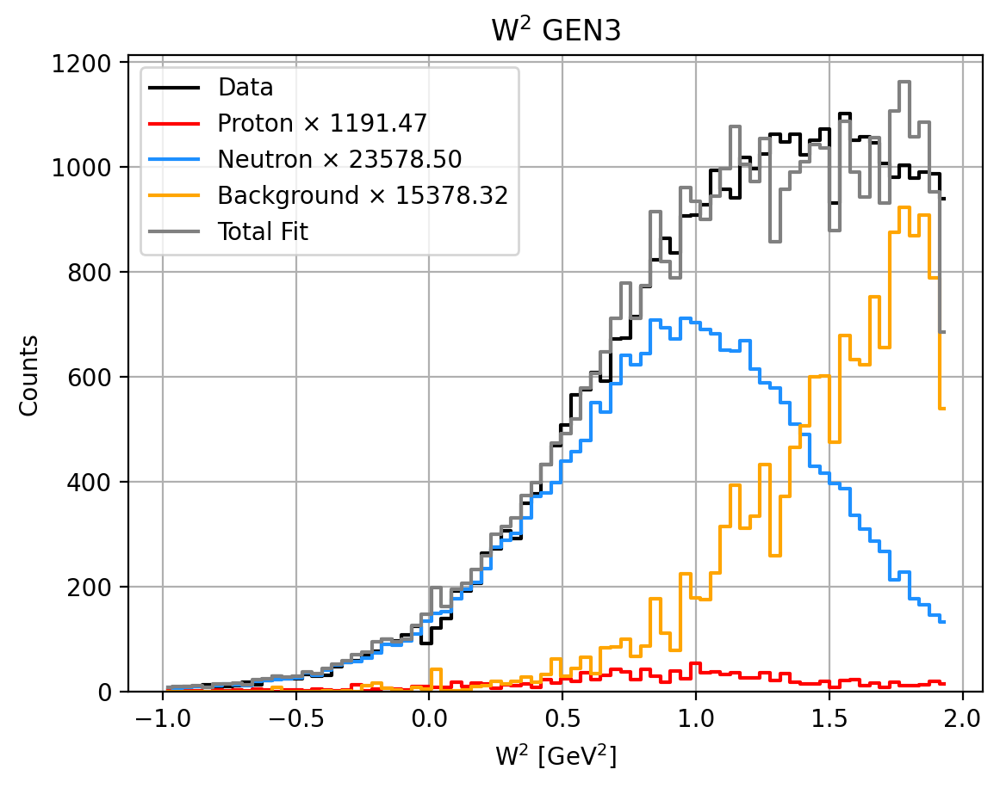

0.6169620127103649 0.03117638192150572 0.5857856307888591 0.38303798728963506


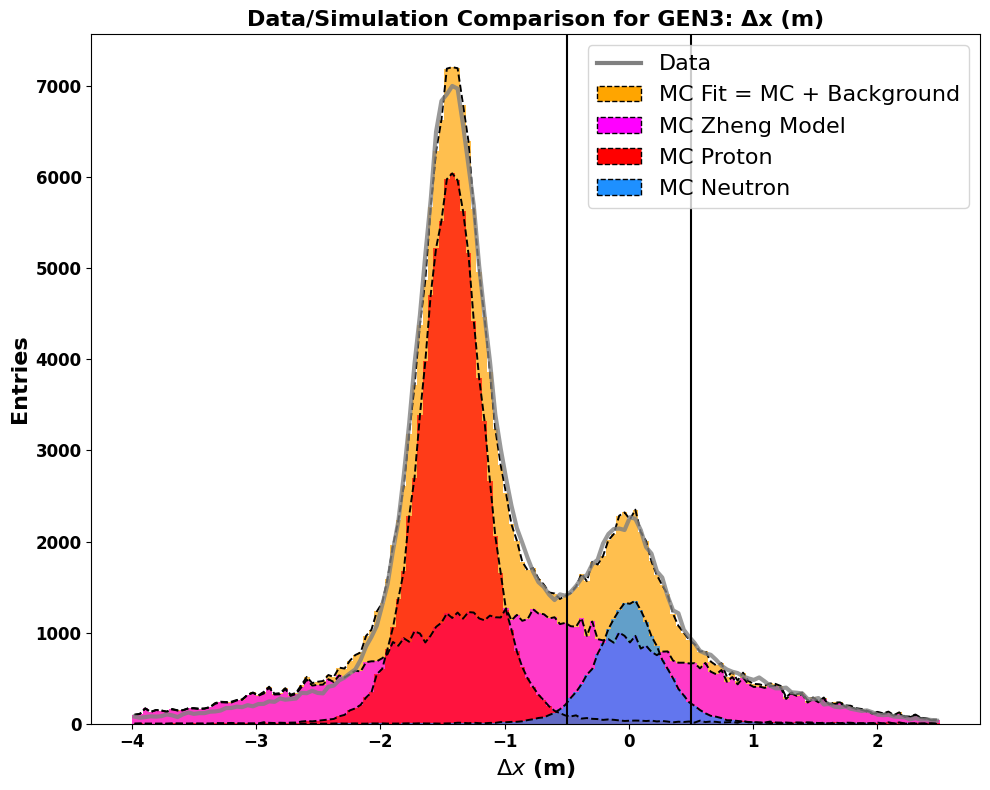

Total entries in fit: 196367.12519425768


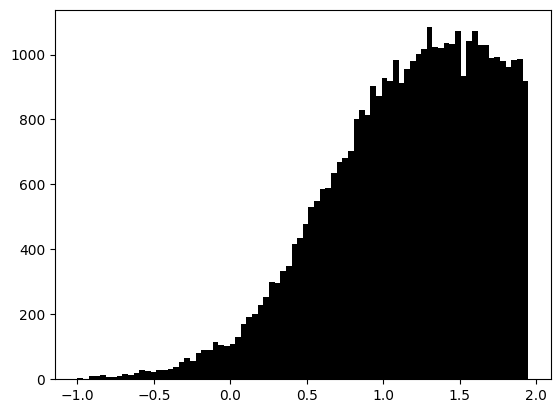

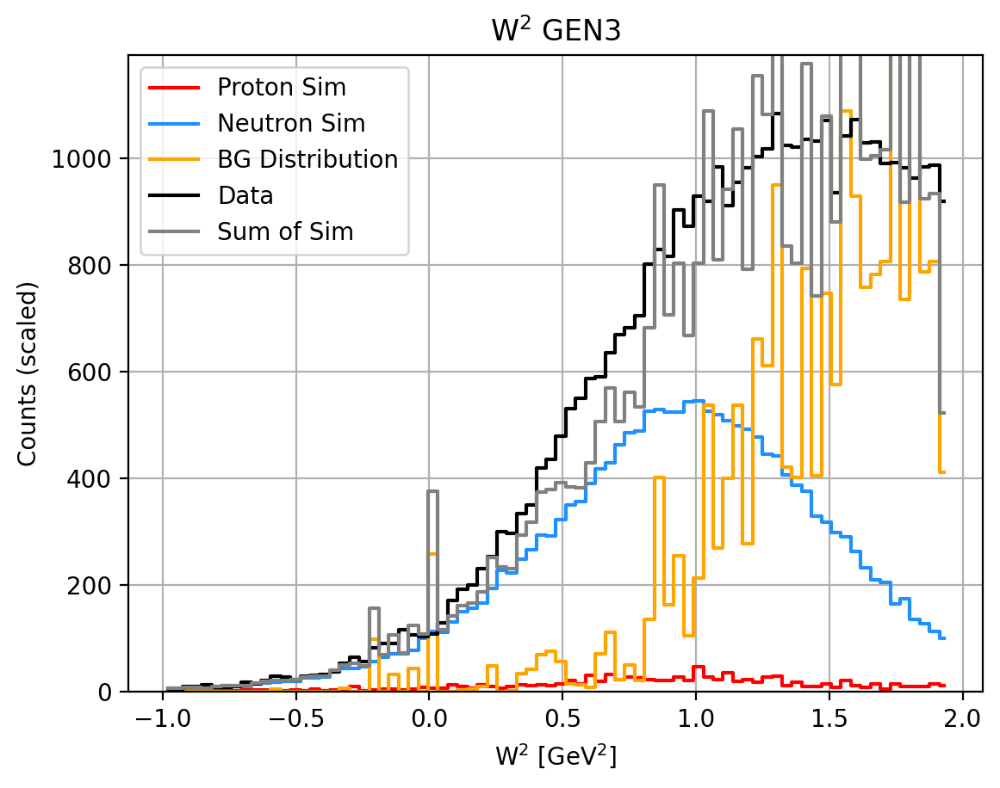

coinstuf: f,fe,A,Ae 0.02673281360737066 0.0008820994370751889 0.005809778706181865 0.008079369347433491
Total events in range (-0.5, 0.5):
  Sim Proton:   919.23
  Sim Neutron:  18191.09
  Background:   20367.91
  Total:        39783.00
Fraction of events in range (-0.5, 0.5):
   Proton Fraction: 0.03
   Background Fraction: 0.38
   Neutron Fraction: 0.59
__________________________________________________
Target Weighted Avg: 0.421+-0.0110  2.6111%
Beam Weighted Avg: 0.865+-0.0008  0.0925%
__________________________________________________
epsilon = 0.6240
tau_avg = 1.8650
Q2 = 6.5854
Px: 0.9900 Pz: -0.0294
A = 0.05661 ± 0.00835 ± 0.00163
B = 0.49657 (no propagated error)
C = 0.14620 ± 0.02495 ± 0.00486
__________________________________________________
N_plus: 20337 N_minus: 19043
A_raw: 0.0329+=0.0050
A_raw_weighted: 0.0331+-0.0050  15.1088%
__________________________________________________
A_phys_weighted: 0.169
A_phys_stat_error: 0.0249  14.7468%
A_phys_sys_error: 0.0049  2.873%
G

In [163]:
backgroundW2fit=[]
W2maxvalue=[]
gen=[]
gensys=[]
genstat=[]
gen1=[]
gensys1=[]
genstat1=[]
for i in range(0,20):
    backgroundW2fit.append(ShowW2_fixed_ratio(dxcut, dycut, coincut,hcalecut,pscut,epcut,
                                              Simdycut, Simdxcut, InSimdycut,
                                              InSimdxcut,.73,.01, -1, 1+i/20,Plot=False)[0])
    W2maxvalue.append(1+i/20)
backgrounddxfit=[]   
backgrounddxfit1=[]   
for i in range(0,20):
    print(i)
    try: _,_,stats1,_=DoItAll(-1,1+i/20,new_coinmin,new_coinmax,new_dymin,new_dymax,
                                       new_dxmin,new_dxmax,new_hcalmin,.2,.7,extracut=False)
    except:
        continue
    try: _,_,stats2,_=DoItAll(-1,1+i/20,new_coinmin,new_coinmax,new_dymin,new_dymax,
                                       new_dxmin,new_dxmax,new_hcalmin,.2,.7,extracut=True)
    except:
        continue
    A=stats1['GE/GM * muN']
    B=stats1['GE/GM_stat_error']
    C=stats1['GE/GM_sys_error']
    A1=stats2['GE/GM * muN']
    B1=stats2['GE/GM_stat_error']
    C1=stats2['GE/GM_sys_error']
    backgrounddxfit.append(stats1["f_bg"])
    gen.append(A)
    gensys.append(C)
    genstat.append(B)
    backgrounddxfit1.append(stats2["f_bg"])
    gen1.append(A1)
    gensys1.append(C1)
    genstat1.append(B1)
    

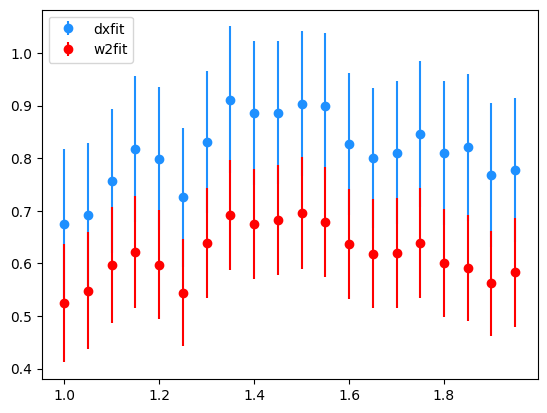

In [166]:
plt.errorbar(W2maxvalue,gen,genstat,fmt='o',color='dodgerblue',
            label='dxfit')
plt.errorbar(W2maxvalue,gen1,genstat1,fmt='o',color='red',
            label='w2fit')
plt.legend(loc='upper left')

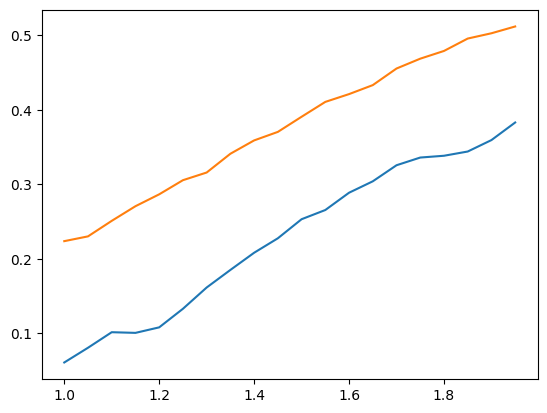

In [168]:
plt.plot(W2maxvalue,backgrounddxfit1)
plt.plot(W2maxvalue,backgrounddxfit)